# Телеком 

Оператор связи «Ниединогоразрыва.ком» хочет научиться прогнозировать отток клиентов. Если выяснится, что пользователь планирует уйти, ему будут предложены промокоды и специальные условия. Команда оператора собрала персональные данные о некоторых клиентах, информацию об их тарифах и договорах.

### Описание услуг

Оператор предоставляет два основных типа услуг: 

1. Стационарную телефонную связь. Возможно подключение телефонного аппарата к нескольким линиям одновременно.
2. Интернет. Подключение может быть двух типов: через телефонную линию (DSL*,* от англ. *digital subscriber line*, «цифровая абонентская линия») или оптоволоконный кабель (*Fiber optic*).  

Также доступны такие услуги:

- Интернет-безопасность: антивирус (*DeviceProtection*) и блокировка небезопасных сайтов (*OnlineSecurity*);
- Выделенная линия технической поддержки (*TechSupport*);
- Облачное хранилище файлов для резервного копирования данных (*OnlineBackup*);
- Стриминговое телевидение (*StreamingTV*) и каталог фильмов (*StreamingMovies*).

За услуги клиенты могут платить каждый месяц или заключить договор на 1–2 года. Доступны различные способы расчёта и возможность получения электронного чека.

### Описание данных

Данные состоят из файлов, полученных из разных источников:

- `contract.csv` — информация о договоре;
- `personal.csv` — персональные данные клиента;
- `internet.csv` — информация об интернет-услугах;
- `phone.csv` — информация об услугах телефонии.

Во всех файлах столбец `customerID` содержит код клиента.

Информация о договорах актуальна на 1 февраля 2020.



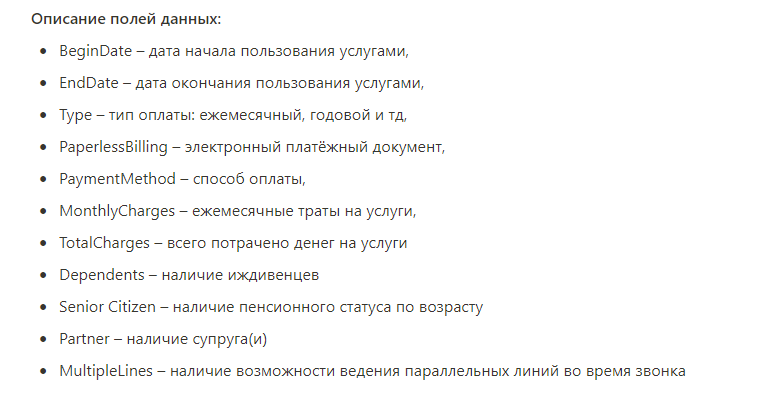

## Импортируем библиотеки

In [1]:
#Код ревьюера
!pip install feature-engine
!pip install phik
!pip install imblearn
!pip install scikit-learn==1.1.3

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
import warnings
warnings.filterwarnings('ignore')

# Данные и математика

import pandas as pd
from matplotlib import rcParams, rcParamsDefault
from sklearn.model_selection import GridSearchCV
import numpy as np
import itertools 
import math
from sklearn.model_selection import train_test_split
import phik
from phik.report import plot_correlation_matrix
from phik import report

#Визуализация

import seaborn as sns
import matplotlib.pyplot as plt

# Модели

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier, Pool
from sklearn.dummy import DummyClassifier

# Пайплайн

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, MinMaxScaler
from feature_engine.selection import DropCorrelatedFeatures, DropDuplicateFeatures

from sklearn.pipeline import Pipeline, FeatureUnion, FunctionTransformer
from imblearn.pipeline import make_pipeline

# Метрики

from sklearn.metrics import roc_auc_score, accuracy_score, plot_roc_curve

from catboost.utils import get_confusion_matrix








In [3]:
RANDOM_STATE = np.random.RandomState(270323) #Задаем RANDOM_STATE

## Изучение данных

In [4]:
try:    
    data_contract = pd.read_csv('./datasets/contract.csv')
    data_personal = pd.read_csv('./datasets/personal.csv')
    data_internet = pd.read_csv('./datasets/internet.csv')
    data_phone = pd.read_csv('./datasets/phone.csv')
except:
    data_contract = pd.read_csv('/datasets/final_provider/contract.csv')
    data_personal = pd.read_csv('/datasets/final_provider/personal.csv')
    data_internet = pd.read_csv('/datasets/final_provider/internet.csv')
    data_phone = pd.read_csv('/datasets/final_provider/phone.csv')

In [6]:
data_contract.head()

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5
2,3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75
4,9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65


In [7]:
data_personal.head()

,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No


In [8]:
data_internet.head()

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No


In [9]:
data_phone.head()

,customerID,MultipleLines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes


In [10]:
data_contract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB


In [11]:
data_personal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


In [12]:
data_internet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


In [13]:
data_phone.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


In [14]:
data_contract.describe()

,MonthlyCharges
count,7043.000000
mean,64.761692
std,30.090047
min,18.250000
25%,35.500000
50%,70.350000
75%,89.850000
max,118.750000


In [15]:
data_personal.describe()

,SeniorCitizen
count,7043.000000
mean,0.162147
std,0.368612
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


In [16]:
data_internet.describe()

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
count,5517,5517,5517,5517,5517,5517,5517,5517
unique,5517,2,2,2,2,2,2,2
top,7590-VHVEG,Fiber optic,No,No,No,No,No,No
freq,1,3096,3498,3088,3095,3473,2810,2785


In [17]:
data_phone.describe()

,customerID,MultipleLines
count,6361,6361
unique,6361,2
top,5575-GNVDE,No
freq,1,3390


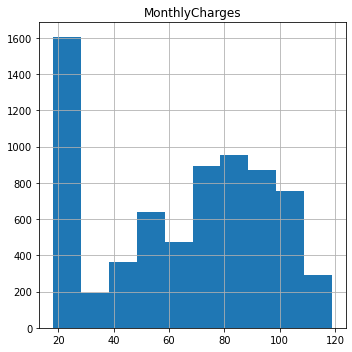

In [18]:
data_contract.hist(figsize=(5, 5))
plt.tight_layout() 

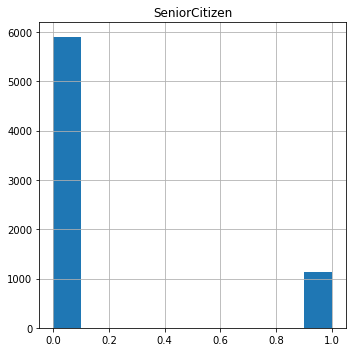

In [19]:
data_personal.hist(figsize=(5, 5))
plt.tight_layout() 

**Выводы**
1. Нет пропусков в данных.
2. Нет явного целевого признака.
3. Поле TotalCharges имеет тип данных object. Это не соответствует описанию.

**Вопросы**
1. **Целевой признак.**  В данных нет явного целевго признака, но есть дата окончания пользования услугами. Стои ли опираться на нее при создании целевого признака?
2. **Метрика.** Какую метрику использовать при обучении моделей?
3. **Доступность данных** Можно ли получить ссылки на наборы данных для того, чтобы обеспечить их доступность в случае если данные отсутсувуют локально конструкцией try/except?

**План работы**

1. **Подготовка данных.** Привести названия колонок к snake_case, проверить пропуски, дубликаты,выбросы, добавить целевой признак. Проверить соответствие типов данных
2. **Исследовательский анализ** Проверить данные на выбросы. Зависимость от целевого признака, мультиколлинеарность при необходимости. Проверить классы на дисбаланс
3. **Обучение Моделей**. Обучить несколько моделей. Основываясь на метрику выбрать лучшую, проверить адекватность Dummy моделью.
4. **Сделать выводы** Предоставить условному заказщику выводы и лучшую модель.

**Цель проекта** Перед нами задача классификации. Необходимо обучить модель способную предсказывать отток клиентов и предоставить ее вместе с сопутствующими выводами заказщику.

## Предобработка данных

### Объединим фреймы

In [20]:
data_full = data_contract.merge(right=data_personal, on='customerID', validate='one_to_one')

In [21]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
 8   gender            7043 non-null   object 
 9   SeniorCitizen     7043 non-null   int64  
 10  Partner           7043 non-null   object 
 11  Dependents        7043 non-null   object 
dtypes: float64(1), int64(1), object(10)
memory usage: 715.3+ KB


In [22]:
data_full = data_full.merge(right=data_internet, how='left', on='customerID')

In [23]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
 8   gender            7043 non-null   object 
 9   SeniorCitizen     7043 non-null   int64  
 10  Partner           7043 non-null   object 
 11  Dependents        7043 non-null   object 
 12  InternetService   5517 non-null   object 
 13  OnlineSecurity    5517 non-null   object 
 14  OnlineBackup      5517 non-null   object 
 15  DeviceProtection  5517 non-null   object 
 16  TechSupport       5517 non-null   object 


In [24]:
data_full = data_full.merge(right=data_phone, how='left', on='customerID')

In [25]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
 8   gender            7043 non-null   object 
 9   SeniorCitizen     7043 non-null   int64  
 10  Partner           7043 non-null   object 
 11  Dependents        7043 non-null   object 
 12  InternetService   5517 non-null   object 
 13  OnlineSecurity    5517 non-null   object 
 14  OnlineBackup      5517 non-null   object 
 15  DeviceProtection  5517 non-null   object 
 16  TechSupport       5517 non-null   object 


In [26]:
data_full.head()

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,NaN
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,No
2,3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75,Male,0,No,No,DSL,Yes,No,Yes,Yes,No,No,NaN
4,9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No


In [27]:
data_full.sample(5)

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines
323,7102-JJVTX,2019-05-01,No,One year,No,Mailed check,48.60,422.3,Female,0,Yes,Yes,DSL,Yes,No,No,No,No,No,No
4791,7808-DVWEP,2019-11-01,No,Month-to-month,No,Bank transfer (automatic),20.00,49.65,Male,0,Yes,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No
4440,3397-AVTKU,2016-07-01,No,Two year,Yes,Electronic check,60.00,2548.55,Male,0,No,No,DSL,No,Yes,No,No,No,Yes,No
3712,9209-NWPGU,2016-06-01,No,One year,No,Electronic check,65.40,2774.55,Male,0,No,No,DSL,Yes,No,No,Yes,Yes,No,No
4275,2692-PFYTJ,2020-01-01,No,Month-to-month,Yes,Mailed check,25.75,25.75,Female,0,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes


### Визуализация признаков  после объединения

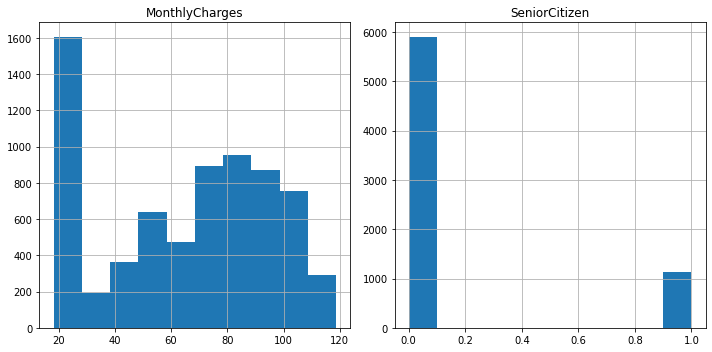

In [28]:
data_full.hist(figsize=(10, 5))
plt.tight_layout() 

### Приведем колонки к snake_case

In [29]:
def snake_case(frame):   
    frame.columns = (frame.columns
                    .str.replace('(?<=[a-z])(?=[A-Z])', '_', regex=True)
                    .str.lower()
                 )

snake_case(data_full)    

In [30]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7043 non-null   object 
 8   gender             7043 non-null   object 
 9   senior_citizen     7043 non-null   int64  
 10  partner            7043 non-null   object 
 11  dependents         7043 non-null   object 
 12  internet_service   5517 non-null   object 
 13  online_security    5517 non-null   object 
 14  online_backup      5517 non-null   object 
 15  device_protection  5517 non-null   object 
 16  tech_support       5517 

### Обработаем total_charges

In [31]:
data_full['total_charges'] = pd.to_numeric(data_full['total_charges'], errors ='coerce')

In [32]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7032 non-null   float64
 8   gender             7043 non-null   object 
 9   senior_citizen     7043 non-null   int64  
 10  partner            7043 non-null   object 
 11  dependents         7043 non-null   object 
 12  internet_service   5517 non-null   object 
 13  online_security    5517 non-null   object 
 14  online_backup      5517 non-null   object 
 15  device_protection  5517 non-null   object 
 16  tech_support       5517 

### Обработаем senior_citizen

In [33]:
data_full['senior_citizen'] = data_full['senior_citizen'].astype('object')

In [34]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7032 non-null   float64
 8   gender             7043 non-null   object 
 9   senior_citizen     7043 non-null   object 
 10  partner            7043 non-null   object 
 11  dependents         7043 non-null   object 
 12  internet_service   5517 non-null   object 
 13  online_security    5517 non-null   object 
 14  online_backup      5517 non-null   object 
 15  device_protection  5517 non-null   object 
 16  tech_support       5517 

### Переведем object в category

Переведем object в category для ускорения работы

In [35]:
# data_full = pd.concat([
#         data_full.select_dtypes([], ['object']),
#         data_full.select_dtypes(['object']).apply(pd.Series.astype, dtype='category')
#         ], axis=1)


In [36]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7032 non-null   float64
 8   gender             7043 non-null   object 
 9   senior_citizen     7043 non-null   object 
 10  partner            7043 non-null   object 
 11  dependents         7043 non-null   object 
 12  internet_service   5517 non-null   object 
 13  online_security    5517 non-null   object 
 14  online_backup      5517 non-null   object 
 15  device_protection  5517 non-null   object 
 16  tech_support       5517 

### Создадим целевой признак

In [37]:
data_full['end_date'].unique()

array(['No', '2019-12-01 00:00:00', '2019-11-01 00:00:00',
       '2019-10-01 00:00:00', '2020-01-01 00:00:00'], dtype=object)

In [38]:
data_full['exited'] = np.where(data_full['end_date'] == 'No', '0', '1')

In [39]:
data_full['exited'].unique()

array(['0', '1'], dtype=object)

In [40]:
# data_full['exited'] = data_full['exited'].astype('category')

In [41]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7032 non-null   float64
 8   gender             7043 non-null   object 
 9   senior_citizen     7043 non-null   object 
 10  partner            7043 non-null   object 
 11  dependents         7043 non-null   object 
 12  internet_service   5517 non-null   object 
 13  online_security    5517 non-null   object 
 14  online_backup      5517 non-null   object 
 15  device_protection  5517 non-null   object 
 16  tech_support       5517 

In [42]:
data_full.head(10)

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,...,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,exited
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85,Female,0,...,No,DSL,No,Yes,No,No,No,No,NaN,0
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.50,Male,0,...,No,DSL,Yes,No,Yes,No,No,No,No,0
2,3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,...,No,DSL,Yes,Yes,No,No,No,No,No,1
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75,Male,0,...,No,DSL,Yes,No,Yes,Yes,No,No,NaN,0
4,9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,...,No,Fiber optic,No,No,No,No,No,No,No,1
5,9305-CDSKC,2019-03-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,99.65,820.50,Female,0,...,No,Fiber optic,No,No,Yes,No,Yes,Yes,Yes,1
6,1452-KIOVK,2018-04-01,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.40,Male,0,...,Yes,Fiber optic,No,Yes,No,No,Yes,No,Yes,0
7,6713-OKOMC,2019-04-01,No,Month-to-month,No,Mailed check,29.75,301.90,Female,0,...,No,DSL,Yes,No,No,No,No,No,NaN,0
8,7892-POOKP,2017-07-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,104.80,3046.05,Female,0,...,No,Fiber optic,No,No,Yes,Yes,Yes,Yes,Yes,1
9,6388-TABGU,2014-12-01,No,One year,No,Bank transfer (automatic),56.15,3487.95,Male,0,...,Yes,DSL,Yes,Yes,No,No,No,No,No,0


### Создадим период договоров

In [44]:
data_full['begin_date'].unique()

array(['2020-01-01', '2017-04-01', '2019-10-01', '2016-05-01',
       '2019-09-01', '2019-03-01', '2018-04-01', '2019-04-01',
       '2017-07-01', '2014-12-01', '2019-01-01', '2018-10-01',
       '2015-04-01', '2015-09-01', '2018-01-01', '2014-05-01',
       '2015-10-01', '2014-03-01', '2018-05-01', '2019-11-01',
       '2019-02-01', '2016-01-01', '2017-08-01', '2015-12-01',
       '2014-02-01', '2018-06-01', '2019-12-01', '2017-11-01',
       '2019-06-01', '2016-04-01', '2017-02-01', '2018-12-01',
       '2014-04-01', '2018-09-01', '2014-11-01', '2016-07-01',
       '2015-02-01', '2018-07-01', '2014-08-01', '2016-03-01',
       '2018-08-01', '2014-10-01', '2015-06-01', '2016-08-01',
       '2019-05-01', '2017-03-01', '2016-02-01', '2017-09-01',
       '2014-09-01', '2017-12-01', '2016-12-01', '2017-06-01',
       '2015-05-01', '2016-10-01', '2016-09-01', '2019-08-01',
       '2019-07-01', '2017-05-01', '2017-10-01', '2014-07-01',
       '2018-03-01', '2015-01-01', '2018-11-01', '2015-

In [45]:
data_full['end_date'].unique()

array(['No', '2019-12-01 00:00:00', '2019-11-01 00:00:00',
       '2019-10-01 00:00:00', '2020-01-01 00:00:00'], dtype=object)

In [46]:
data_full.loc[(data_full['end_date'] == 'No'),'end_date'] = '2020-02-01 00:00:00'

In [47]:
data_full['begin_date'] = pd.to_datetime(data_full['begin_date'],format= "%Y/%m/%d")

In [48]:
data_full['end_date'] = pd.to_datetime(data_full['end_date'],format= "%Y/%m/%d")

In [49]:
data_full['duration']=(data_full['end_date']-data_full['begin_date'])/np.timedelta64(1,'D')

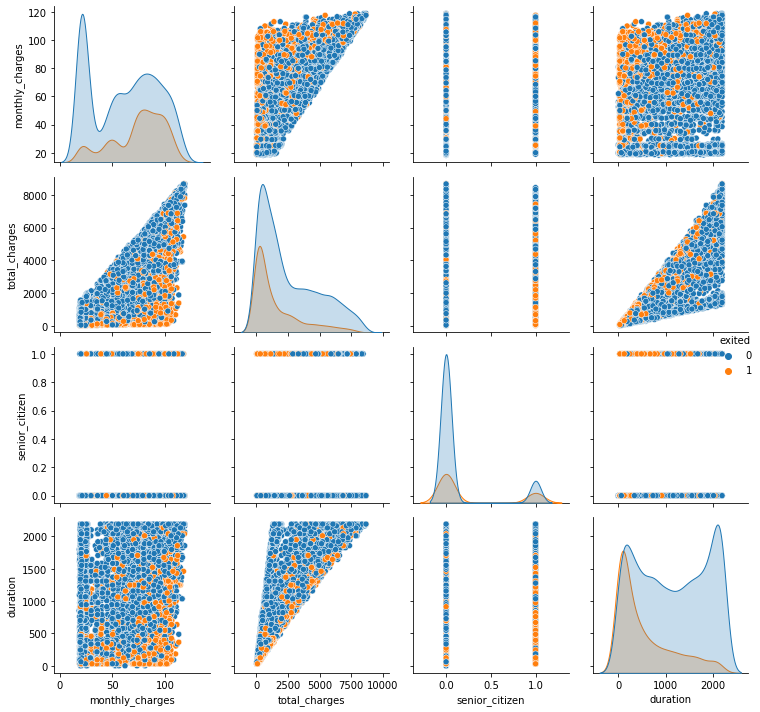

In [50]:
#Код ревьюера
# sns.pairplot(data_full,vars=['monthly_charges','total_charges','duration'], hue='exited')

tmp = pd.DataFrame(data_full.to_dict())
sns.pairplot(tmp, hue='exited')
plt.tight_layout()

In [51]:
data_full.head()

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,...,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,exited,duration
0,7590-VHVEG,2020-01-01,2020-02-01,Month-to-month,Yes,Electronic check,29.85,29.85,Female,0,...,DSL,No,Yes,No,No,No,No,NaN,0,31.0
1,5575-GNVDE,2017-04-01,2020-02-01,One year,No,Mailed check,56.95,1889.50,Male,0,...,DSL,Yes,No,Yes,No,No,No,No,0,1036.0
2,3668-QPYBK,2019-10-01,2019-12-01,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,...,DSL,Yes,Yes,No,No,No,No,No,1,61.0
3,7795-CFOCW,2016-05-01,2020-02-01,One year,No,Bank transfer (automatic),42.30,1840.75,Male,0,...,DSL,Yes,No,Yes,Yes,No,No,NaN,0,1371.0
4,9237-HQITU,2019-09-01,2019-11-01,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,...,Fiber optic,No,No,No,No,No,No,No,1,61.0


### Обработка пропусков

In [52]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7032 non-null   float64       
 8   gender             7043 non-null   object        
 9   senior_citizen     7043 non-null   object        
 10  partner            7043 non-null   object        
 11  dependents         7043 non-null   object        
 12  internet_service   5517 non-null   object        
 13  online_security    5517 non-null   object        
 14  online_b

#### Процент пропусков

In [53]:
for col in data_full.columns:
    pct_missing = np.mean(data_full[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

customer_id - 0%
begin_date - 0%
end_date - 0%
type - 0%
paperless_billing - 0%
payment_method - 0%
monthly_charges - 0%
total_charges - 0%
gender - 0%
senior_citizen - 0%
partner - 0%
dependents - 0%
internet_service - 22%
online_security - 22%
online_backup - 22%
device_protection - 22%
tech_support - 22%
streaming_tv - 22%
streaming_movies - 22%
multiple_lines - 10%
exited - 0%
duration - 0%


#### Заполним total_charges

In [54]:
data_full[data_full['total_charges'].isnull()]

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,...,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,exited,duration
488,4472-LVYGI,2020-02-01,2020-02-01,Two year,Yes,Bank transfer (automatic),52.55,NaN,Female,0,...,DSL,Yes,No,Yes,Yes,Yes,No,NaN,0,0.0
753,3115-CZMZD,2020-02-01,2020-02-01,Two year,No,Mailed check,20.25,NaN,Male,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,0,0.0
936,5709-LVOEQ,2020-02-01,2020-02-01,Two year,No,Mailed check,80.85,NaN,Female,0,...,DSL,Yes,Yes,Yes,No,Yes,Yes,No,0,0.0
1082,4367-NUYAO,2020-02-01,2020-02-01,Two year,No,Mailed check,25.75,NaN,Male,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,0,0.0
1340,1371-DWPAZ,2020-02-01,2020-02-01,Two year,No,Credit card (automatic),56.05,NaN,Female,0,...,DSL,Yes,Yes,Yes,Yes,Yes,No,NaN,0,0.0
3331,7644-OMVMY,2020-02-01,2020-02-01,Two year,No,Mailed check,19.85,NaN,Male,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,0,0.0
3826,3213-VVOLG,2020-02-01,2020-02-01,Two year,No,Mailed check,25.35,NaN,Male,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,0,0.0
4380,2520-SGTTA,2020-02-01,2020-02-01,Two year,No,Mailed check,20.00,NaN,Female,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,0,0.0
5218,2923-ARZLG,2020-02-01,2020-02-01,One year,Yes,Mailed check,19.70,NaN,Male,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,0,0.0
6670,4075-WKNIU,2020-02-01,2020-02-01,Two year,No,Mailed check,73.35,NaN,Female,0,...,DSL,No,Yes,Yes,Yes,Yes,No,Yes,0,0.0


Логично предположить,что это новые пользователи. Ведь их begin_date - последний месяц. Предлагаю заполнить пропуски - monthly_charge

In [55]:
data_full['total_charges'] = np.where(data_full['total_charges'].isnull(), data_full['monthly_charges'], 
                                      data_full['total_charges'])

In [56]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7043 non-null   float64       
 8   gender             7043 non-null   object        
 9   senior_citizen     7043 non-null   object        
 10  partner            7043 non-null   object        
 11  dependents         7043 non-null   object        
 12  internet_service   5517 non-null   object        
 13  online_security    5517 non-null   object        
 14  online_b

#### Заполним пропуски в услугах

Логично предположить,что пропуски в услугах значат,что клиент ими не пользуется. Заполним пропучки в них на 'No' 

In [57]:
services = ['internet_service', 'online_security', 'online_backup', 'device_protection', 'tech_support', 
            'streaming_tv', 'streaming_movies', 'multiple_lines']

In [58]:
for service in services:
    data_full[service] = data_full[service].fillna('No')
    

In [59]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7043 non-null   float64       
 8   gender             7043 non-null   object        
 9   senior_citizen     7043 non-null   object        
 10  partner            7043 non-null   object        
 11  dependents         7043 non-null   object        
 12  internet_service   7043 non-null   object        
 13  online_security    7043 non-null   object        
 14  online_b

### Визуализация признаков

<AxesSubplot:>

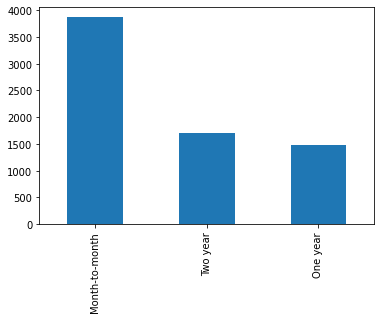

In [60]:
data_full['type'].value_counts().plot(kind='bar')

Большинство пользователей оплачивают помесячно

<AxesSubplot:>

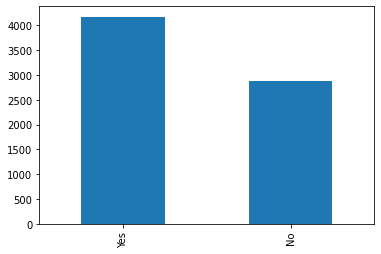

In [61]:
data_full['paperless_billing'].value_counts().plot(kind='bar')

<AxesSubplot:>

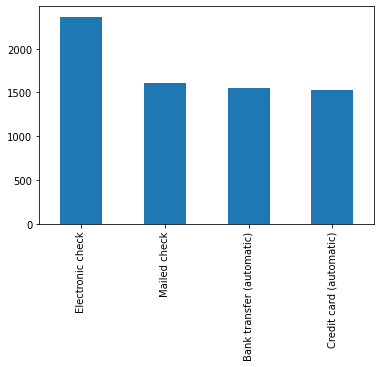

In [62]:
data_full['payment_method'].value_counts().plot(kind='bar')

<AxesSubplot:ylabel='Frequency'>

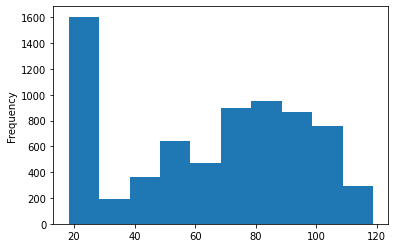

In [63]:
data_full['monthly_charges'].plot(kind='hist')

<AxesSubplot:ylabel='Frequency'>

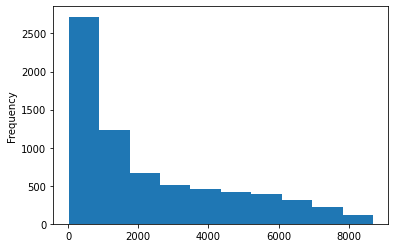

In [64]:
data_full['total_charges'].plot(kind='hist')

<AxesSubplot:>

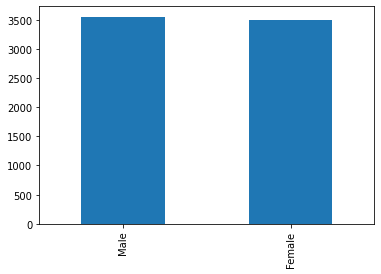

In [65]:
data_full['gender'].value_counts().plot(kind='bar')

<AxesSubplot:>

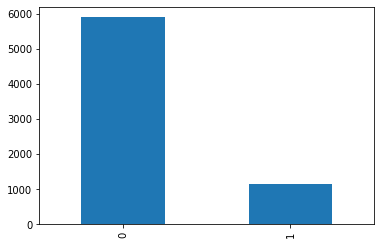

In [66]:
data_full['senior_citizen'].value_counts().plot(kind='bar')

<AxesSubplot:>

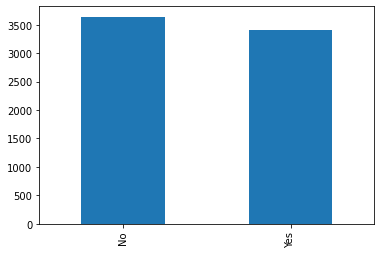

In [67]:
data_full['partner'].value_counts().plot(kind='bar')

<AxesSubplot:>

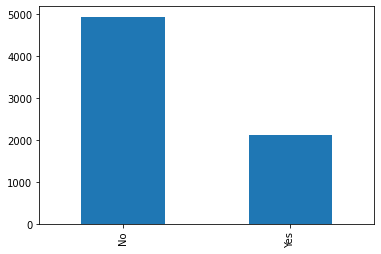

In [68]:
data_full['dependents'].value_counts().plot(kind='bar')

<AxesSubplot:>

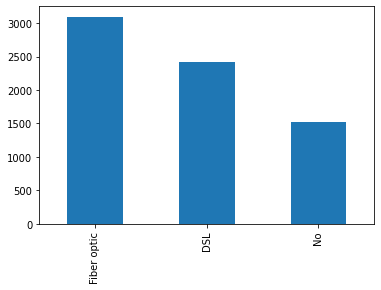

In [69]:
data_full['internet_service'].value_counts().plot(kind='bar')

<AxesSubplot:>

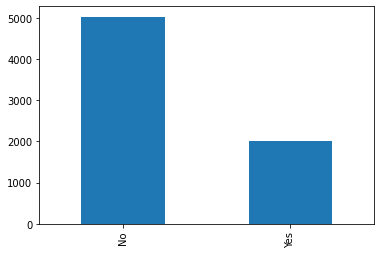

In [70]:
data_full['online_security'].value_counts().plot(kind='bar')

<AxesSubplot:>

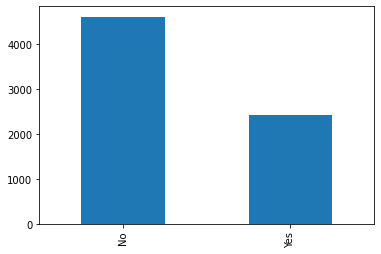

In [71]:
data_full['online_backup'].value_counts().plot(kind='bar')

<AxesSubplot:>

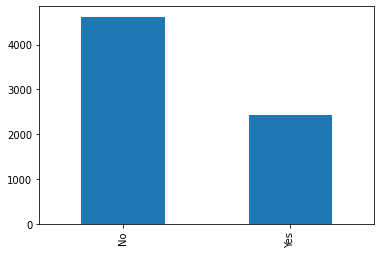

In [72]:
data_full['device_protection'].value_counts().plot(kind='bar')

<AxesSubplot:>

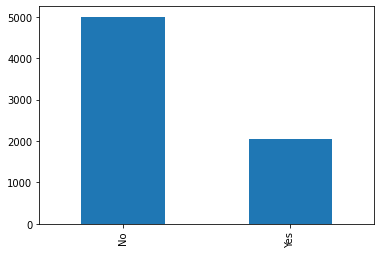

In [73]:
data_full['tech_support'].value_counts().plot(kind='bar')

<AxesSubplot:>

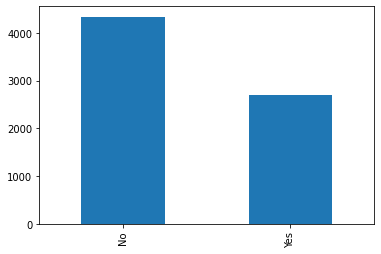

In [74]:
data_full['streaming_tv'].value_counts().plot(kind='bar')

<AxesSubplot:>

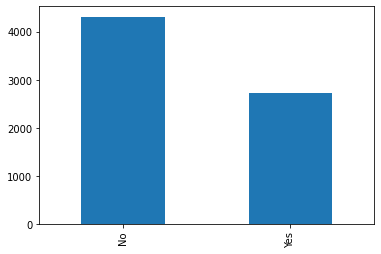

In [75]:
data_full['streaming_movies'].value_counts().plot(kind='bar')

<AxesSubplot:>

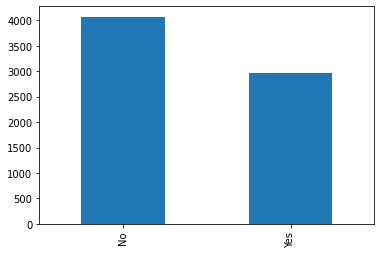

In [76]:
data_full['multiple_lines'].value_counts().plot(kind='bar')

<AxesSubplot:ylabel='Frequency'>

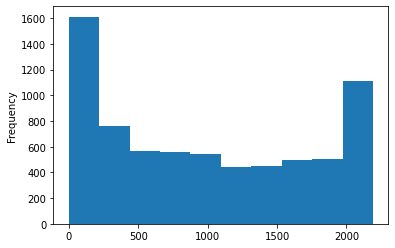

In [77]:
data_full['duration'].plot(kind='hist')

Из данных видно:

- Для большинства людей месячный чек находится в районе 20ти долларов а общие затраты до 2000. Пользователи предпочитают электронную оплату
- Среднестатистический пользователь человек среднего возраста явновероятно холост или в браке. Скорее всего не имеет детей
- Больщинство пользователей имеют подключение к интернету, однако дополнительные услуги не пользуются особой популярностью.

## Корреляция признаков

In [78]:
data_full_copy = data_full.copy() #скопируем датасет, чтобы случайно не потерять данные

In [79]:
data_full_copy = data_full_copy.set_index('customer_id')


In [80]:
data_full_copy = data_full_copy.drop(['end_date', 'begin_date'], axis = 1)

In [81]:
data_full_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   type               7043 non-null   object 
 1   paperless_billing  7043 non-null   object 
 2   payment_method     7043 non-null   object 
 3   monthly_charges    7043 non-null   float64
 4   total_charges      7043 non-null   float64
 5   gender             7043 non-null   object 
 6   senior_citizen     7043 non-null   object 
 7   partner            7043 non-null   object 
 8   dependents         7043 non-null   object 
 9   internet_service   7043 non-null   object 
 10  online_security    7043 non-null   object 
 11  online_backup      7043 non-null   object 
 12  device_protection  7043 non-null   object 
 13  tech_support       7043 non-null   object 
 14  streaming_tv       7043 non-null   object 
 15  streaming_movies   7043 non-null   object 
 16  multiple_lines

In [82]:
interval_cols = ['monthly_charges', 'total_charges','duration']
phik_overview = data_full_copy.phik_matrix(interval_cols=interval_cols)
phik_overview.round(2)

,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,exited,duration
type,1.00,0.11,0.28,0.39,0.51,0.00,0.09,0.18,0.15,0.51,0.15,0.10,0.14,0.18,0.07,0.07,0.07,0.25,0.66
paperless_billing,0.11,1.00,0.37,0.47,0.21,0.00,0.24,0.01,0.17,0.23,0.00,0.20,0.16,0.06,0.34,0.33,0.25,0.30,0.00
payment_method,0.28,0.37,1.00,0.40,0.35,0.00,0.29,0.24,0.22,0.32,0.26,0.28,0.31,0.27,0.38,0.38,0.34,0.45,0.38
monthly_charges,0.39,0.47,0.40,1.00,0.76,0.01,0.30,0.20,0.18,0.92,0.55,0.63,0.67,0.58,0.84,0.83,0.68,0.36,0.41
total_charges,0.51,0.21,0.35,0.76,1.00,0.00,0.15,0.42,0.11,0.51,0.54,0.66,0.67,0.57,0.66,0.67,0.61,0.28,0.84
gender,0.00,0.00,0.00,0.01,0.00,1.00,0.00,0.00,0.00,0.00,0.02,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00
senior_citizen,0.09,0.24,0.29,0.30,0.15,0.00,1.00,0.02,0.32,0.16,0.06,0.10,0.09,0.09,0.16,0.19,0.22,0.23,0.03
partner,0.18,0.01,0.24,0.20,0.42,0.00,0.02,1.00,0.65,0.00,0.22,0.22,0.24,0.19,0.19,0.18,0.22,0.23,0.49
dependents,0.15,0.17,0.22,0.18,0.11,0.00,0.32,0.65,1.00,0.11,0.12,0.03,0.01,0.10,0.02,0.06,0.03,0.25,0.21
internet_service,0.51,0.23,0.32,0.92,0.51,0.00,0.16,0.00,0.11,1.00,0.24,0.23,0.23,0.24,0.27,0.27,0.23,0.20,0.02


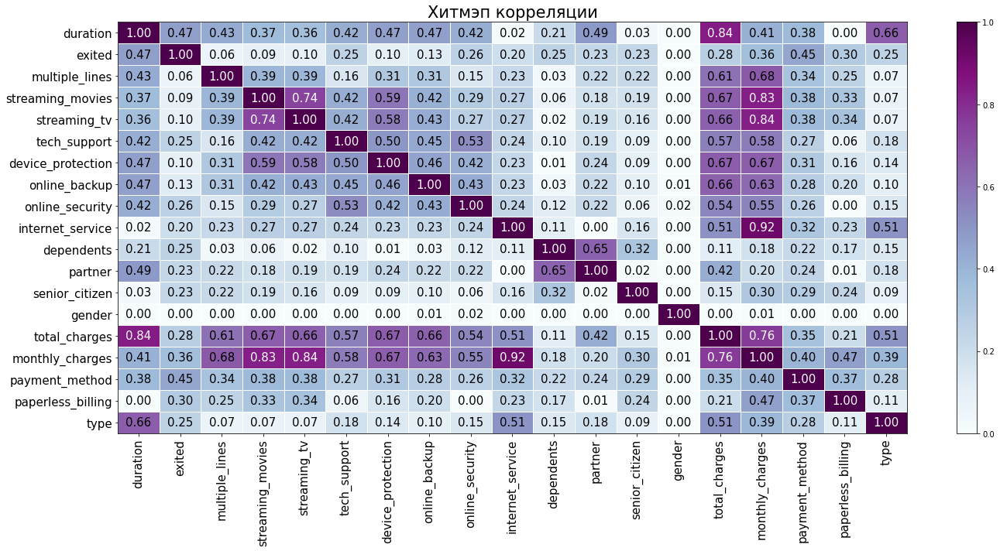

In [83]:
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="BuPu", 
                        title=r"Хитмэп корреляции", 
                        fontsize_factor=1.5, 
                        figsize=(20, 10))
plt.tight_layout()

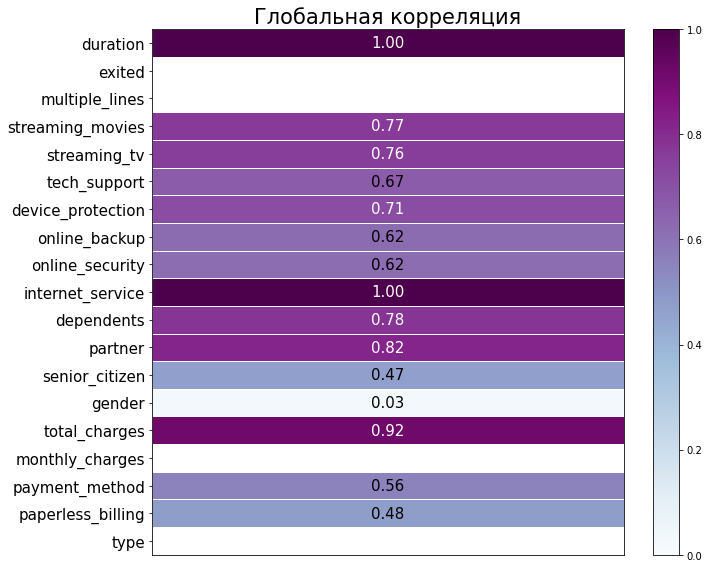

In [84]:
global_correlation, global_labels = data_full_copy.global_phik(interval_cols=interval_cols)

plot_correlation_matrix(global_correlation, 
                        x_labels=[''], y_labels=global_labels, 
                        vmin=0, vmax=1, figsize=(10.5,8),
                        color_map="BuPu", title=r"Глобальная корреляция",
                        fontsize_factor=1.5)
plt.tight_layout()

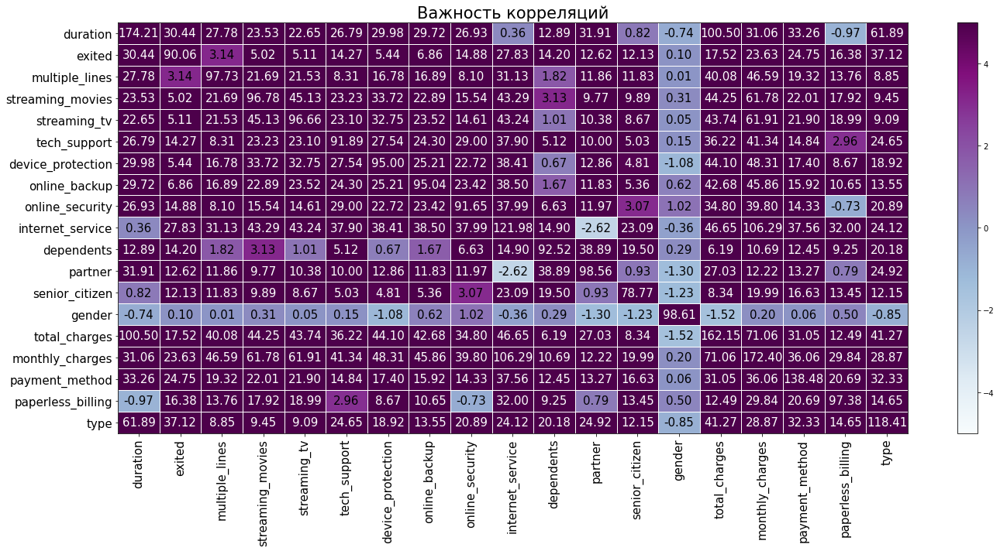

In [85]:
significance_overview = data_full_copy.significance_matrix(interval_cols=interval_cols)
plot_correlation_matrix(significance_overview.fillna(0).values, 
                        x_labels=significance_overview.columns, 
                        y_labels=significance_overview.index, 
                        vmin=-5, vmax=5,color_map="BuPu", title="Важность корреляций", 
                        usetex=False, fontsize_factor=1.5, figsize=(20, 10))
plt.tight_layout()

На хитмепе корреляции заметна высокая зависимость internet_service от monthly_charges и низкое влияние признака gender на другие признаки. Так же на графике глобальной корреляции заметно, что признаки, monthly_charges,total_charges end_date и begin_date моделируемы другими признаками. Предлагаю эти признаки удалить.

In [86]:
#data_full = data_full.drop(['internet_service', 'monthly_charges', 'type', 'end_date', 'begin_date', 'gender', 'customer_id'], axis = 1)

In [87]:
data_full = data_full.drop(['end_date', 'begin_date', 'customer_id', 'total_charges', 'monthly_charges'], axis = 1)

In [88]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   type               7043 non-null   object 
 1   paperless_billing  7043 non-null   object 
 2   payment_method     7043 non-null   object 
 3   gender             7043 non-null   object 
 4   senior_citizen     7043 non-null   object 
 5   partner            7043 non-null   object 
 6   dependents         7043 non-null   object 
 7   internet_service   7043 non-null   object 
 8   online_security    7043 non-null   object 
 9   online_backup      7043 non-null   object 
 10  device_protection  7043 non-null   object 
 11  tech_support       7043 non-null   object 
 12  streaming_tv       7043 non-null   object 
 13  streaming_movies   7043 non-null   object 
 14  multiple_lines     7043 non-null   object 
 15  exited             7043 non-null   object 
 16  duration           7043 

## Баланс классов

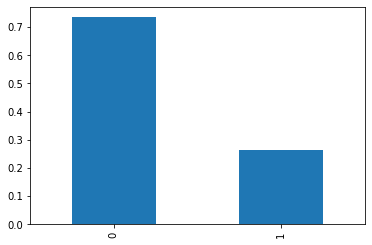

In [89]:
class_frequency = data_full['exited'].value_counts(normalize = True).plot(kind='bar')

В данных очевиден дисбаланс классов. Учтем это при обучении моделей. Хотя AUC-ROC и менее чувствительна к дисбалансу

## Построение моделей

### Разобьем на выборки

In [90]:
target = data_full['exited']
features = data_full.drop('exited', axis=1)


In [91]:
features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   type               7043 non-null   object 
 1   paperless_billing  7043 non-null   object 
 2   payment_method     7043 non-null   object 
 3   gender             7043 non-null   object 
 4   senior_citizen     7043 non-null   object 
 5   partner            7043 non-null   object 
 6   dependents         7043 non-null   object 
 7   internet_service   7043 non-null   object 
 8   online_security    7043 non-null   object 
 9   online_backup      7043 non-null   object 
 10  device_protection  7043 non-null   object 
 11  tech_support       7043 non-null   object 
 12  streaming_tv       7043 non-null   object 
 13  streaming_movies   7043 non-null   object 
 14  multiple_lines     7043 non-null   object 
 15  duration           7043 non-null   float64
dtypes: float64(1), object(15

In [92]:
features_train, features_test, target_train, target_test = train_test_split(features, target,
                                                                       test_size=0.25, random_state=RANDOM_STATE)

In [93]:
print('Размер обучающей выборки: {} объектов, {} признаков'.format(features_train.shape[0], features_train.shape[1]))
print('Размер тестовой выборки: {} объектов, {} признаков'.format(features_test.shape[0], features_test.shape[1]))


Размер обучающей выборки: 5282 объектов, 16 признаков
Размер тестовой выборки: 1761 объектов, 16 признаков


### Стандартизируем численные данные

In [94]:
numeric = ['duration']


In [95]:
scaler = MinMaxScaler()
scaler.fit(features_train[numeric])
features_train[numeric] = scaler.transform(features_train[numeric])
features_test[numeric] = scaler.transform(features_test[numeric])

### Переработаем поля типа object методом OHE

In [96]:
cat_columns = ['paperless_billing', 'payment_method', 'senior_citizen', 'partner', 'dependents',
               'internet_service', 'online_security', 'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies',
                'multiple_lines', 'online_backup', 'gender', 'type']

encoder_ohe = OneHotEncoder(drop='first', handle_unknown='ignore', sparse=False)


encoder_ohe.fit(features_train[cat_columns])


features_train[
    encoder_ohe.get_feature_names_out()
] = encoder_ohe.transform(features_train[cat_columns])


features_train = features_train.drop(cat_columns, axis=1)

features_test[
    encoder_ohe.get_feature_names_out()
] = encoder_ohe.transform(features_test[cat_columns])

features_test = features_test.drop(cat_columns, axis=1)

In [97]:
features_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5282 entries, 2885 to 3422
Data columns (total 20 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   duration                                5282 non-null   float64
 1   paperless_billing_Yes                   5282 non-null   float64
 2   payment_method_Credit card (automatic)  5282 non-null   float64
 3   payment_method_Electronic check         5282 non-null   float64
 4   payment_method_Mailed check             5282 non-null   float64
 5   senior_citizen_1                        5282 non-null   float64
 6   partner_Yes                             5282 non-null   float64
 7   dependents_Yes                          5282 non-null   float64
 8   internet_service_Fiber optic            5282 non-null   float64
 9   internet_service_No                     5282 non-null   float64
 10  online_security_Yes                     5282 non-null   f

In [98]:
features_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1761 entries, 1126 to 3562
Data columns (total 20 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   duration                                1761 non-null   float64
 1   paperless_billing_Yes                   1761 non-null   float64
 2   payment_method_Credit card (automatic)  1761 non-null   float64
 3   payment_method_Electronic check         1761 non-null   float64
 4   payment_method_Mailed check             1761 non-null   float64
 5   senior_citizen_1                        1761 non-null   float64
 6   partner_Yes                             1761 non-null   float64
 7   dependents_Yes                          1761 non-null   float64
 8   internet_service_Fiber optic            1761 non-null   float64
 9   internet_service_No                     1761 non-null   float64
 10  online_security_Yes                     1761 non-null   f

In [99]:
features_test.columns == features_train.columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True])

### Протестируем модель RandomForestClassifier

In [100]:
modelforest = RandomForestClassifier(random_state=RANDOM_STATE)

In [101]:
params = {'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None], 
          'n_estimators':[10, 50, 100, 250],
          'min_samples_split':[2, 6, 10],
          'min_samples_leaf':[1, 3, 4],
           'bootstrap': [True, False],
            }

grid_model_forest = GridSearchCV(modelforest, params, cv=5,
                          scoring='roc_auc', n_jobs=-1)

grid_model_forest.fit(features_train, target_train)

GridSearchCV(cv=5,
             estimator=RandomForestClassifier(random_state=RandomState(MT19937) at 0x7FC4A17ABA40),
             n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100,
                                       None],
                         'min_samples_leaf': [1, 3, 4],
                         'min_samples_split': [2, 6, 10],
                         'n_estimators': [10, 50, 100, 250]},
             scoring='roc_auc')

In [102]:
grid_model_forest.best_score_

0.85741380438429

In [103]:
grid_model_forest.cv_results_

{'mean_fit_time': array([0.03261938, 0.13297887, 0.26167784, 0.68280182, 0.03056512,
        0.13078785, 0.25360274, 0.62825742, 0.02991543, 0.12590742,
        0.24929008, 0.61262994, 0.03065677, 0.1264451 , 0.25068507,
        0.61969433, 0.02999134, 0.12868786, 0.25065103, 0.62001901,
        0.0295465 , 0.1251235 , 0.2470973 , 0.6101995 , 0.02934232,
        0.12487545, 0.24819412, 0.61122489, 0.0291389 , 0.12549744,
        0.24787874, 0.61247396, 0.02935414, 0.13061538, 0.24716945,
        0.60809345, 0.0365119 , 0.16052556, 0.31969409, 0.79856377,
        0.03338556, 0.14555435, 0.28946176, 0.72541804, 0.03229504,
        0.13782539, 0.2729497 , 0.67731028, 0.03210287, 0.13780184,
        0.27197385, 0.68077941, 0.03204355, 0.1388649 , 0.27611823,
        0.68115125, 0.03111877, 0.13402896, 0.2665884 , 0.6601759 ,
        0.03147097, 0.13364367, 0.26803584, 0.66289392, 0.0314383 ,
        0.13492975, 0.26836538, 0.66238198, 0.03099203, 0.13258758,
        0.26536765, 0.65508347,

### Протестируем модель LGBM

In [104]:
modellgbm = LGBMClassifier(random_state=RANDOM_STATE, class_weight = 'balanced')

In [105]:
params = {
    'learning_rate': [0.001, 0.01],
    'n_estimators': [10, 50, 100, 250],
    'boosting_type' : ['gbdt', 'dart'], 
    'objective' : ['binary'],
    'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None]
    
          
}

grid_model_lgbm = GridSearchCV(modellgbm, params, cv=5,
                          scoring='roc_auc', n_jobs=-1)

grid_model_lgbm.fit(features_train, target_train)

GridSearchCV(cv=5,
             estimator=LGBMClassifier(class_weight='balanced',
                                      random_state=RandomState(MT19937) at 0x7FC4A17ABA40),
             n_jobs=-1,
             param_grid={'boosting_type': ['gbdt', 'dart'],
                         'learning_rate': [0.001, 0.01],
                         'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100,
                                       None],
                         'n_estimators': [10, 50, 100, 250],
                         'objective': ['binary']},
             scoring='roc_auc')

In [106]:
grid_model_lgbm.best_score_

0.8670499204456051

In [107]:
grid_model_lgbm.cv_results_

{'mean_fit_time': array([0.02712197, 0.05374703, 0.09083028, 0.20654578, 0.02175374,
        0.05515242, 0.0873229 , 0.23571506, 0.01968865, 0.05721903,
        0.09773312, 0.21381507, 0.01946535, 0.04955382, 0.09101882,
        0.20808611, 0.02016087, 0.05340772, 0.09326906, 0.20751958,
        0.02076645, 0.05359168, 0.09378567, 0.20284305, 0.02302103,
        0.05395751, 0.09414415, 0.20187192, 0.02373095, 0.05361333,
        0.09718614, 0.21098728, 0.01967268, 0.05390215, 0.08954768,
        0.21617684, 0.01960864, 0.05077   , 0.08815613, 0.21494679,
        0.01953759, 0.049963  , 0.08932796, 0.21502037, 0.01948833,
        0.05032864, 0.08761969, 0.20845451, 0.02255225, 0.05182843,
        0.09046741, 0.20716758, 0.02255282, 0.05639563, 0.09525208,
        0.21475444, 0.02029262, 0.05084095, 0.09724674, 0.20569744,
        0.02189255, 0.05139985, 0.09011846, 0.20412984, 0.02008853,
        0.0501298 , 0.10706382, 0.20689735, 0.02205791, 0.05582762,
        0.0983314 , 0.20453415,

### Протестируем модель Catboost

In [108]:
modelcat = CatBoostClassifier(random_state=270323, auto_class_weights='Balanced')

In [109]:
params = {
'learning_rate': [0.03, 0.1],
'depth': [4, 6, 10],
'l2_leaf_reg': [1, 3, 5, 7, 9],
'loss_function': ['Logloss', 'CrossEntropy']
    
}

grid_model_cat = GridSearchCV(modelcat, params, cv=5,
                          scoring='roc_auc',  n_jobs=-1)

grid_model_cat.fit(features_train, target_train)

0:	learn: 0.6813701	total: 50.4ms	remaining: 50.4s
1:	learn: 0.6707838	total: 53.4ms	remaining: 26.7s
2:	learn: 0.6609152	total: 61.4ms	remaining: 20.4s
3:	learn: 0.6532526	total: 64.8ms	remaining: 16.1s
4:	learn: 0.6444205	total: 67.6ms	remaining: 13.5s
5:	learn: 0.6365755	total: 70.2ms	remaining: 11.6s
6:	learn: 0.6284109	total: 78.2ms	remaining: 11.1s
7:	learn: 0.6208124	total: 90.1ms	remaining: 11.2s
8:	learn: 0.6139542	total: 91.5ms	remaining: 10.1s
9:	learn: 0.6072041	total: 96.6ms	remaining: 9.56s
10:	learn: 0.5996429	total: 99.3ms	remaining: 8.93s
11:	learn: 0.5933082	total: 101ms	remaining: 8.34s
12:	learn: 0.5876097	total: 103ms	remaining: 7.86s
13:	learn: 0.5830301	total: 105ms	remaining: 7.4s
14:	learn: 0.5780690	total: 110ms	remaining: 7.24s
15:	learn: 0.5735125	total: 113ms	remaining: 6.92s
16:	learn: 0.5693019	total: 114ms	remaining: 6.58s
17:	learn: 0.5645646	total: 115ms	remaining: 6.3s
18:	learn: 0.5600039	total: 117ms	remaining: 6.05s
19:	learn: 0.5562947	total: 123m

0:	learn: 0.6811616	total: 65.7ms	remaining: 1m 5s
1:	learn: 0.6712114	total: 87.2ms	remaining: 43.5s
2:	learn: 0.6604505	total: 89.1ms	remaining: 29.6s
3:	learn: 0.6500658	total: 105ms	remaining: 26.3s
4:	learn: 0.6400279	total: 109ms	remaining: 21.6s
5:	learn: 0.6324010	total: 110ms	remaining: 18.2s
6:	learn: 0.6241682	total: 111ms	remaining: 15.7s
7:	learn: 0.6166104	total: 112ms	remaining: 13.9s
8:	learn: 0.6097275	total: 127ms	remaining: 14s
9:	learn: 0.6030473	total: 129ms	remaining: 12.8s
10:	learn: 0.5966023	total: 130ms	remaining: 11.7s
11:	learn: 0.5905118	total: 131ms	remaining: 10.8s
12:	learn: 0.5819317	total: 132ms	remaining: 10.1s
13:	learn: 0.5766438	total: 148ms	remaining: 10.5s
14:	learn: 0.5716276	total: 151ms	remaining: 9.9s
15:	learn: 0.5669622	total: 152ms	remaining: 9.34s
16:	learn: 0.5625776	total: 153ms	remaining: 8.84s
17:	learn: 0.5584000	total: 154ms	remaining: 8.4s
18:	learn: 0.5549524	total: 169ms	remaining: 8.73s
19:	learn: 0.5517117	total: 172ms	remainin

159:	learn: 0.4452229	total: 643ms	remaining: 3.38s
160:	learn: 0.4450540	total: 646ms	remaining: 3.37s
161:	learn: 0.4449080	total: 647ms	remaining: 3.35s
162:	learn: 0.4447742	total: 648ms	remaining: 3.33s
163:	learn: 0.4446694	total: 649ms	remaining: 3.31s
164:	learn: 0.4445686	total: 650ms	remaining: 3.29s
165:	learn: 0.4441337	total: 651ms	remaining: 3.27s
166:	learn: 0.4439143	total: 653ms	remaining: 3.25s
167:	learn: 0.4438130	total: 653ms	remaining: 3.24s
168:	learn: 0.4435056	total: 654ms	remaining: 3.22s
169:	learn: 0.4431665	total: 655ms	remaining: 3.2s
170:	learn: 0.4424823	total: 656ms	remaining: 3.18s
171:	learn: 0.4422688	total: 659ms	remaining: 3.17s
172:	learn: 0.4420868	total: 660ms	remaining: 3.15s
173:	learn: 0.4419082	total: 661ms	remaining: 3.14s
174:	learn: 0.4417534	total: 662ms	remaining: 3.12s
175:	learn: 0.4416402	total: 663ms	remaining: 3.1s
176:	learn: 0.4415590	total: 664ms	remaining: 3.09s
177:	learn: 0.4413440	total: 692ms	remaining: 3.19s
178:	learn: 0.

317:	learn: 0.4035026	total: 983ms	remaining: 2.11s
318:	learn: 0.4031042	total: 984ms	remaining: 2.1s
319:	learn: 0.4028379	total: 985ms	remaining: 2.09s
320:	learn: 0.4027067	total: 986ms	remaining: 2.08s
321:	learn: 0.4025454	total: 987ms	remaining: 2.08s
322:	learn: 0.4023397	total: 988ms	remaining: 2.07s
323:	learn: 0.4022367	total: 989ms	remaining: 2.06s
324:	learn: 0.4018695	total: 990ms	remaining: 2.06s
325:	learn: 0.4014227	total: 991ms	remaining: 2.05s
326:	learn: 0.4011745	total: 992ms	remaining: 2.04s
327:	learn: 0.4010320	total: 993ms	remaining: 2.03s
328:	learn: 0.4006888	total: 994ms	remaining: 2.03s
329:	learn: 0.3999234	total: 999ms	remaining: 2.03s
330:	learn: 0.3997405	total: 1s	remaining: 2.02s
331:	learn: 0.3993145	total: 1s	remaining: 2.02s
332:	learn: 0.3991488	total: 1.01s	remaining: 2.02s
333:	learn: 0.3987584	total: 1.01s	remaining: 2.01s
334:	learn: 0.3986435	total: 1.01s	remaining: 2s
335:	learn: 0.3982253	total: 1.01s	remaining: 2.01s
336:	learn: 0.3980483	

475:	learn: 0.3575499	total: 1.42s	remaining: 1.57s
476:	learn: 0.3570293	total: 1.43s	remaining: 1.56s
477:	learn: 0.3564666	total: 1.43s	remaining: 1.56s
478:	learn: 0.3562919	total: 1.43s	remaining: 1.55s
479:	learn: 0.3561804	total: 1.43s	remaining: 1.55s
480:	learn: 0.3560601	total: 1.43s	remaining: 1.54s
481:	learn: 0.3559190	total: 1.43s	remaining: 1.54s
482:	learn: 0.3551080	total: 1.43s	remaining: 1.53s
483:	learn: 0.3549782	total: 1.43s	remaining: 1.53s
484:	learn: 0.3547086	total: 1.44s	remaining: 1.52s
485:	learn: 0.3542627	total: 1.44s	remaining: 1.52s
486:	learn: 0.3541407	total: 1.44s	remaining: 1.51s
487:	learn: 0.3539762	total: 1.44s	remaining: 1.51s
488:	learn: 0.3534777	total: 1.44s	remaining: 1.51s
489:	learn: 0.3533168	total: 1.44s	remaining: 1.5s
490:	learn: 0.3532006	total: 1.45s	remaining: 1.5s
491:	learn: 0.3530928	total: 1.45s	remaining: 1.49s
492:	learn: 0.3526163	total: 1.45s	remaining: 1.49s
493:	learn: 0.3523666	total: 1.45s	remaining: 1.49s
494:	learn: 0.

632:	learn: 0.3178563	total: 1.81s	remaining: 1.05s
633:	learn: 0.3176115	total: 1.81s	remaining: 1.05s
634:	learn: 0.3173133	total: 1.81s	remaining: 1.04s
635:	learn: 0.3171567	total: 1.81s	remaining: 1.04s
636:	learn: 0.3169684	total: 1.81s	remaining: 1.03s
637:	learn: 0.3167020	total: 1.82s	remaining: 1.03s
638:	learn: 0.3166037	total: 1.82s	remaining: 1.03s
639:	learn: 0.3165233	total: 1.82s	remaining: 1.02s
640:	learn: 0.3164451	total: 1.82s	remaining: 1.02s
641:	learn: 0.3162053	total: 1.82s	remaining: 1.02s
642:	learn: 0.3160688	total: 1.82s	remaining: 1.01s
643:	learn: 0.3159886	total: 1.83s	remaining: 1.01s
644:	learn: 0.3158891	total: 1.83s	remaining: 1.01s
645:	learn: 0.3156043	total: 1.83s	remaining: 1s
646:	learn: 0.3154614	total: 1.85s	remaining: 1.01s
647:	learn: 0.3153761	total: 1.85s	remaining: 1.01s
648:	learn: 0.3152966	total: 1.85s	remaining: 1s
649:	learn: 0.3151284	total: 1.85s	remaining: 999ms
650:	learn: 0.3150149	total: 1.86s	remaining: 997ms
651:	learn: 0.3149

633:	learn: 0.3304871	total: 1.98s	remaining: 1.14s
634:	learn: 0.3302982	total: 1.98s	remaining: 1.14s
635:	learn: 0.3299103	total: 1.98s	remaining: 1.14s
636:	learn: 0.3298065	total: 1.98s	remaining: 1.13s
637:	learn: 0.3296906	total: 1.99s	remaining: 1.13s
638:	learn: 0.3295426	total: 1.99s	remaining: 1.12s
639:	learn: 0.3294558	total: 1.99s	remaining: 1.12s
640:	learn: 0.3288355	total: 1.99s	remaining: 1.11s
641:	learn: 0.3287743	total: 1.99s	remaining: 1.11s
642:	learn: 0.3286585	total: 1.99s	remaining: 1.1s
643:	learn: 0.3282698	total: 1.99s	remaining: 1.1s
644:	learn: 0.3281731	total: 1.99s	remaining: 1.1s
645:	learn: 0.3279246	total: 1.99s	remaining: 1.09s
646:	learn: 0.3278395	total: 1.99s	remaining: 1.09s
647:	learn: 0.3274898	total: 2s	remaining: 1.08s
648:	learn: 0.3273601	total: 2s	remaining: 1.08s
649:	learn: 0.3272423	total: 2s	remaining: 1.07s
650:	learn: 0.3271630	total: 2s	remaining: 1.07s
651:	learn: 0.3270580	total: 2s	remaining: 1.07s
652:	learn: 0.3269366	total: 2

632:	learn: 0.3149919	total: 2.27s	remaining: 1.31s
633:	learn: 0.3148442	total: 2.27s	remaining: 1.31s
634:	learn: 0.3146597	total: 2.27s	remaining: 1.3s
635:	learn: 0.3144495	total: 2.27s	remaining: 1.3s
636:	learn: 0.3143396	total: 2.28s	remaining: 1.3s
637:	learn: 0.3142185	total: 2.28s	remaining: 1.29s
638:	learn: 0.3139044	total: 2.28s	remaining: 1.29s
639:	learn: 0.3138262	total: 2.28s	remaining: 1.28s
640:	learn: 0.3136879	total: 2.28s	remaining: 1.28s
641:	learn: 0.3135626	total: 2.29s	remaining: 1.28s
642:	learn: 0.3135310	total: 2.3s	remaining: 1.27s
643:	learn: 0.3134382	total: 2.3s	remaining: 1.27s
644:	learn: 0.3132528	total: 2.3s	remaining: 1.26s
645:	learn: 0.3129300	total: 2.3s	remaining: 1.26s
646:	learn: 0.3127926	total: 2.31s	remaining: 1.26s
647:	learn: 0.3126132	total: 2.31s	remaining: 1.25s
648:	learn: 0.3124266	total: 2.31s	remaining: 1.25s
649:	learn: 0.3123380	total: 2.31s	remaining: 1.24s
650:	learn: 0.3121760	total: 2.31s	remaining: 1.24s
651:	learn: 0.31200

790:	learn: 0.2924841	total: 2.61s	remaining: 690ms
791:	learn: 0.2924090	total: 2.64s	remaining: 693ms
792:	learn: 0.2922966	total: 2.64s	remaining: 689ms
793:	learn: 0.2921540	total: 2.64s	remaining: 685ms
794:	learn: 0.2920382	total: 2.64s	remaining: 681ms
795:	learn: 0.2918523	total: 2.64s	remaining: 678ms
796:	learn: 0.2917578	total: 2.65s	remaining: 674ms
797:	learn: 0.2915586	total: 2.65s	remaining: 670ms
798:	learn: 0.2914365	total: 2.65s	remaining: 666ms
799:	learn: 0.2913412	total: 2.65s	remaining: 663ms
800:	learn: 0.2912315	total: 2.65s	remaining: 659ms
801:	learn: 0.2910927	total: 2.65s	remaining: 656ms
802:	learn: 0.2910159	total: 2.66s	remaining: 652ms
803:	learn: 0.2908326	total: 2.66s	remaining: 649ms
804:	learn: 0.2907598	total: 2.67s	remaining: 647ms
805:	learn: 0.2906100	total: 2.67s	remaining: 643ms
806:	learn: 0.2905386	total: 2.67s	remaining: 639ms
807:	learn: 0.2904669	total: 2.67s	remaining: 635ms
808:	learn: 0.2903463	total: 2.67s	remaining: 631ms
809:	learn: 

949:	learn: 0.2849610	total: 2.97s	remaining: 156ms
950:	learn: 0.2848688	total: 2.97s	remaining: 153ms
951:	learn: 0.2847895	total: 2.97s	remaining: 150ms
952:	learn: 0.2847322	total: 2.98s	remaining: 147ms
953:	learn: 0.2846749	total: 2.99s	remaining: 144ms
954:	learn: 0.2845044	total: 2.99s	remaining: 141ms
955:	learn: 0.2844142	total: 3s	remaining: 138ms
956:	learn: 0.2843700	total: 3s	remaining: 135ms
957:	learn: 0.2842950	total: 3s	remaining: 132ms
958:	learn: 0.2842201	total: 3s	remaining: 128ms
959:	learn: 0.2840411	total: 3.01s	remaining: 125ms
960:	learn: 0.2839507	total: 3.01s	remaining: 122ms
961:	learn: 0.2838901	total: 3.01s	remaining: 119ms
962:	learn: 0.2837931	total: 3.01s	remaining: 116ms
963:	learn: 0.2836350	total: 3.01s	remaining: 112ms
964:	learn: 0.2835671	total: 3.01s	remaining: 109ms
965:	learn: 0.2834810	total: 3.01s	remaining: 106ms
966:	learn: 0.2833886	total: 3.02s	remaining: 103ms
967:	learn: 0.2832515	total: 3.02s	remaining: 99.8ms
968:	learn: 0.2831561	t

108:	learn: 0.3895465	total: 296ms	remaining: 2.42s
109:	learn: 0.3885889	total: 306ms	remaining: 2.47s
110:	learn: 0.3874661	total: 323ms	remaining: 2.59s
111:	learn: 0.3869739	total: 324ms	remaining: 2.57s
112:	learn: 0.3865689	total: 325ms	remaining: 2.55s
113:	learn: 0.3857228	total: 328ms	remaining: 2.54s
114:	learn: 0.3834744	total: 328ms	remaining: 2.53s
115:	learn: 0.3824407	total: 329ms	remaining: 2.51s
116:	learn: 0.3812121	total: 330ms	remaining: 2.49s
117:	learn: 0.3804828	total: 331ms	remaining: 2.48s
118:	learn: 0.3796731	total: 332ms	remaining: 2.46s
119:	learn: 0.3790769	total: 333ms	remaining: 2.44s
120:	learn: 0.3773712	total: 335ms	remaining: 2.43s
121:	learn: 0.3769114	total: 336ms	remaining: 2.42s
122:	learn: 0.3766110	total: 337ms	remaining: 2.4s
123:	learn: 0.3759626	total: 338ms	remaining: 2.38s
124:	learn: 0.3754518	total: 338ms	remaining: 2.37s
125:	learn: 0.3749603	total: 339ms	remaining: 2.35s
126:	learn: 0.3740389	total: 340ms	remaining: 2.34s
127:	learn: 0

107:	learn: 0.3824621	total: 335ms	remaining: 2.77s
108:	learn: 0.3819569	total: 350ms	remaining: 2.86s
109:	learn: 0.3810795	total: 352ms	remaining: 2.85s
110:	learn: 0.3800024	total: 353ms	remaining: 2.83s
111:	learn: 0.3782861	total: 354ms	remaining: 2.81s
112:	learn: 0.3778399	total: 355ms	remaining: 2.79s
113:	learn: 0.3770164	total: 371ms	remaining: 2.88s
114:	learn: 0.3766237	total: 375ms	remaining: 2.88s
115:	learn: 0.3755866	total: 382ms	remaining: 2.91s
116:	learn: 0.3749695	total: 383ms	remaining: 2.89s
117:	learn: 0.3741876	total: 384ms	remaining: 2.87s
118:	learn: 0.3693765	total: 385ms	remaining: 2.85s
119:	learn: 0.3689919	total: 386ms	remaining: 2.83s
120:	learn: 0.3675867	total: 387ms	remaining: 2.81s
121:	learn: 0.3668063	total: 388ms	remaining: 2.79s
122:	learn: 0.3657397	total: 410ms	remaining: 2.92s
123:	learn: 0.3651404	total: 413ms	remaining: 2.92s
124:	learn: 0.3645547	total: 416ms	remaining: 2.91s
125:	learn: 0.3641610	total: 418ms	remaining: 2.9s
126:	learn: 0

422:	learn: 0.2386366	total: 1.09s	remaining: 1.49s
423:	learn: 0.2384242	total: 1.09s	remaining: 1.48s
424:	learn: 0.2380108	total: 1.09s	remaining: 1.48s
425:	learn: 0.2378319	total: 1.09s	remaining: 1.47s
426:	learn: 0.2373673	total: 1.09s	remaining: 1.47s
427:	learn: 0.2371192	total: 1.09s	remaining: 1.46s
428:	learn: 0.2369888	total: 1.1s	remaining: 1.46s
429:	learn: 0.2367689	total: 1.1s	remaining: 1.46s
430:	learn: 0.2363774	total: 1.1s	remaining: 1.45s
431:	learn: 0.2361795	total: 1.1s	remaining: 1.45s
432:	learn: 0.2359910	total: 1.1s	remaining: 1.45s
433:	learn: 0.2357920	total: 1.1s	remaining: 1.44s
434:	learn: 0.2355042	total: 1.11s	remaining: 1.44s
435:	learn: 0.2352908	total: 1.11s	remaining: 1.43s
436:	learn: 0.2351435	total: 1.11s	remaining: 1.43s
437:	learn: 0.2349410	total: 1.11s	remaining: 1.42s
438:	learn: 0.2346206	total: 1.11s	remaining: 1.42s
439:	learn: 0.2345061	total: 1.11s	remaining: 1.41s
440:	learn: 0.2341034	total: 1.11s	remaining: 1.41s
441:	learn: 0.2339

580:	learn: 0.2061992	total: 1.46s	remaining: 1.05s
581:	learn: 0.2060898	total: 1.46s	remaining: 1.05s
582:	learn: 0.2059126	total: 1.46s	remaining: 1.04s
583:	learn: 0.2057350	total: 1.46s	remaining: 1.04s
584:	learn: 0.2054912	total: 1.46s	remaining: 1.04s
585:	learn: 0.2053477	total: 1.47s	remaining: 1.03s
586:	learn: 0.2051601	total: 1.47s	remaining: 1.03s
587:	learn: 0.2050048	total: 1.47s	remaining: 1.03s
588:	learn: 0.2048186	total: 1.47s	remaining: 1.02s
589:	learn: 0.2046989	total: 1.47s	remaining: 1.02s
590:	learn: 0.2044515	total: 1.47s	remaining: 1.02s
591:	learn: 0.2042646	total: 1.47s	remaining: 1.02s
592:	learn: 0.2040564	total: 1.48s	remaining: 1.02s
593:	learn: 0.2039718	total: 1.49s	remaining: 1.02s
594:	learn: 0.2036226	total: 1.49s	remaining: 1.01s
595:	learn: 0.2034582	total: 1.49s	remaining: 1.01s
596:	learn: 0.2033205	total: 1.49s	remaining: 1.01s
597:	learn: 0.2032201	total: 1.5s	remaining: 1s
598:	learn: 0.2030528	total: 1.5s	remaining: 1s
599:	learn: 0.202828

423:	learn: 0.2347765	total: 1.59s	remaining: 2.15s
424:	learn: 0.2345441	total: 1.59s	remaining: 2.15s
425:	learn: 0.2344316	total: 1.59s	remaining: 2.14s
426:	learn: 0.2341145	total: 1.59s	remaining: 2.14s
427:	learn: 0.2338935	total: 1.6s	remaining: 2.14s
428:	learn: 0.2337212	total: 1.6s	remaining: 2.13s
429:	learn: 0.2334683	total: 1.6s	remaining: 2.13s
430:	learn: 0.2332003	total: 1.6s	remaining: 2.12s
431:	learn: 0.2327618	total: 1.63s	remaining: 2.15s
432:	learn: 0.2325282	total: 1.64s	remaining: 2.14s
433:	learn: 0.2323851	total: 1.64s	remaining: 2.14s
434:	learn: 0.2321781	total: 1.64s	remaining: 2.13s
435:	learn: 0.2319843	total: 1.66s	remaining: 2.14s
436:	learn: 0.2318415	total: 1.66s	remaining: 2.14s
437:	learn: 0.2316351	total: 1.66s	remaining: 2.13s
438:	learn: 0.2314416	total: 1.67s	remaining: 2.14s
439:	learn: 0.2310645	total: 1.67s	remaining: 2.13s
440:	learn: 0.2308761	total: 1.67s	remaining: 2.12s
441:	learn: 0.2307218	total: 1.68s	remaining: 2.12s
442:	learn: 0.23

892:	learn: 0.2885188	total: 2.82s	remaining: 338ms
893:	learn: 0.2884536	total: 2.83s	remaining: 335ms
894:	learn: 0.2884006	total: 2.83s	remaining: 332ms
895:	learn: 0.2883138	total: 2.83s	remaining: 328ms
896:	learn: 0.2880259	total: 2.83s	remaining: 325ms
897:	learn: 0.2878826	total: 2.83s	remaining: 321ms
898:	learn: 0.2877450	total: 2.83s	remaining: 318ms
899:	learn: 0.2876663	total: 2.85s	remaining: 316ms
900:	learn: 0.2874465	total: 2.85s	remaining: 313ms
901:	learn: 0.2873149	total: 2.86s	remaining: 311ms
902:	learn: 0.2872682	total: 2.86s	remaining: 308ms
903:	learn: 0.2871391	total: 2.87s	remaining: 304ms
904:	learn: 0.2868801	total: 2.87s	remaining: 301ms
905:	learn: 0.2868029	total: 2.87s	remaining: 297ms
906:	learn: 0.2867406	total: 2.87s	remaining: 294ms
907:	learn: 0.2866751	total: 2.87s	remaining: 291ms
908:	learn: 0.2865915	total: 2.89s	remaining: 290ms
909:	learn: 0.2864503	total: 2.9s	remaining: 287ms
910:	learn: 0.2863611	total: 2.9s	remaining: 284ms
911:	learn: 0.

895:	learn: 0.1666190	total: 2.66s	remaining: 308ms
896:	learn: 0.1665345	total: 2.66s	remaining: 305ms
897:	learn: 0.1664405	total: 2.66s	remaining: 302ms
898:	learn: 0.1663314	total: 2.66s	remaining: 299ms
899:	learn: 0.1662596	total: 2.66s	remaining: 296ms
900:	learn: 0.1661026	total: 2.67s	remaining: 294ms
901:	learn: 0.1660073	total: 2.68s	remaining: 291ms
902:	learn: 0.1659110	total: 2.68s	remaining: 288ms
903:	learn: 0.1658831	total: 2.68s	remaining: 284ms
904:	learn: 0.1658445	total: 2.68s	remaining: 281ms
905:	learn: 0.1657332	total: 2.68s	remaining: 278ms
906:	learn: 0.1656589	total: 2.68s	remaining: 275ms
907:	learn: 0.1654788	total: 2.68s	remaining: 272ms
908:	learn: 0.1653237	total: 2.68s	remaining: 269ms
909:	learn: 0.1651595	total: 2.68s	remaining: 265ms
910:	learn: 0.1650657	total: 2.69s	remaining: 262ms
911:	learn: 0.1648499	total: 2.69s	remaining: 259ms
912:	learn: 0.1647760	total: 2.69s	remaining: 256ms
913:	learn: 0.1646372	total: 2.69s	remaining: 253ms
914:	learn: 

51:	learn: 0.4926408	total: 192ms	remaining: 3.5s
52:	learn: 0.4916395	total: 194ms	remaining: 3.46s
53:	learn: 0.4903608	total: 195ms	remaining: 3.41s
54:	learn: 0.4894290	total: 196ms	remaining: 3.37s
55:	learn: 0.4885229	total: 197ms	remaining: 3.32s
56:	learn: 0.4881089	total: 198ms	remaining: 3.28s
57:	learn: 0.4870953	total: 199ms	remaining: 3.23s
58:	learn: 0.4864436	total: 200ms	remaining: 3.19s
59:	learn: 0.4854414	total: 202ms	remaining: 3.16s
60:	learn: 0.4839833	total: 203ms	remaining: 3.12s
61:	learn: 0.4834340	total: 204ms	remaining: 3.08s
62:	learn: 0.4827438	total: 205ms	remaining: 3.05s
63:	learn: 0.4816145	total: 206ms	remaining: 3.02s
64:	learn: 0.4810235	total: 207ms	remaining: 2.98s
65:	learn: 0.4804138	total: 208ms	remaining: 2.94s
66:	learn: 0.4789165	total: 209ms	remaining: 2.91s
67:	learn: 0.4783578	total: 210ms	remaining: 2.88s
68:	learn: 0.4779299	total: 211ms	remaining: 2.84s
69:	learn: 0.4774299	total: 212ms	remaining: 2.81s
70:	learn: 0.4770206	total: 213m

211:	learn: 0.3063376	total: 712ms	remaining: 2.65s
212:	learn: 0.3055055	total: 725ms	remaining: 2.68s
213:	learn: 0.3051072	total: 726ms	remaining: 2.67s
214:	learn: 0.3046590	total: 727ms	remaining: 2.65s
215:	learn: 0.3043161	total: 737ms	remaining: 2.68s
216:	learn: 0.3039028	total: 738ms	remaining: 2.66s
217:	learn: 0.3034999	total: 740ms	remaining: 2.65s
218:	learn: 0.3031357	total: 741ms	remaining: 2.64s
219:	learn: 0.3026808	total: 741ms	remaining: 2.63s
220:	learn: 0.3023947	total: 742ms	remaining: 2.62s
221:	learn: 0.3015773	total: 743ms	remaining: 2.6s
222:	learn: 0.3013349	total: 760ms	remaining: 2.65s
223:	learn: 0.3010356	total: 761ms	remaining: 2.64s
224:	learn: 0.3002203	total: 762ms	remaining: 2.62s
225:	learn: 0.2989875	total: 763ms	remaining: 2.61s
226:	learn: 0.2984363	total: 778ms	remaining: 2.65s
227:	learn: 0.2978197	total: 779ms	remaining: 2.64s
228:	learn: 0.2974713	total: 780ms	remaining: 2.63s
229:	learn: 0.2968933	total: 781ms	remaining: 2.61s
230:	learn: 0

366:	learn: 0.2518079	total: 1s	remaining: 1.73s
367:	learn: 0.2512286	total: 1s	remaining: 1.72s
368:	learn: 0.2510234	total: 1s	remaining: 1.72s
369:	learn: 0.2508733	total: 1.01s	remaining: 1.72s
370:	learn: 0.2506572	total: 1.01s	remaining: 1.71s
371:	learn: 0.2503581	total: 1.01s	remaining: 1.71s
372:	learn: 0.2500894	total: 1.01s	remaining: 1.7s
373:	learn: 0.2498971	total: 1.02s	remaining: 1.71s
374:	learn: 0.2497309	total: 1.02s	remaining: 1.7s
375:	learn: 0.2494881	total: 1.02s	remaining: 1.69s
376:	learn: 0.2492598	total: 1.02s	remaining: 1.69s
377:	learn: 0.2488729	total: 1.02s	remaining: 1.68s
378:	learn: 0.2486088	total: 1.02s	remaining: 1.68s
379:	learn: 0.2484398	total: 1.04s	remaining: 1.69s
380:	learn: 0.2481024	total: 1.04s	remaining: 1.69s
381:	learn: 0.2479527	total: 1.04s	remaining: 1.68s
382:	learn: 0.2476543	total: 1.04s	remaining: 1.67s
383:	learn: 0.2473156	total: 1.04s	remaining: 1.67s
384:	learn: 0.2466438	total: 1.04s	remaining: 1.67s
385:	learn: 0.2464209	t

369:	learn: 0.3964947	total: 901ms	remaining: 1.53s
370:	learn: 0.3962485	total: 904ms	remaining: 1.53s
371:	learn: 0.3961512	total: 905ms	remaining: 1.53s
372:	learn: 0.3959301	total: 906ms	remaining: 1.52s
373:	learn: 0.3953270	total: 907ms	remaining: 1.52s
374:	learn: 0.3951220	total: 909ms	remaining: 1.51s
375:	learn: 0.3946439	total: 910ms	remaining: 1.51s
376:	learn: 0.3944644	total: 911ms	remaining: 1.51s
377:	learn: 0.3942396	total: 913ms	remaining: 1.5s
378:	learn: 0.3938496	total: 914ms	remaining: 1.5s
379:	learn: 0.3937172	total: 915ms	remaining: 1.49s
380:	learn: 0.3934696	total: 916ms	remaining: 1.49s
381:	learn: 0.3932466	total: 919ms	remaining: 1.49s
382:	learn: 0.3930878	total: 924ms	remaining: 1.49s
383:	learn: 0.3928783	total: 925ms	remaining: 1.48s
384:	learn: 0.3922873	total: 926ms	remaining: 1.48s
385:	learn: 0.3919925	total: 929ms	remaining: 1.48s
386:	learn: 0.3917824	total: 932ms	remaining: 1.48s
387:	learn: 0.3916099	total: 934ms	remaining: 1.47s
388:	learn: 0.

527:	learn: 0.3608227	total: 1.09s	remaining: 976ms
528:	learn: 0.3606511	total: 1.09s	remaining: 974ms
529:	learn: 0.3605257	total: 1.09s	remaining: 970ms
530:	learn: 0.3604210	total: 1.1s	remaining: 972ms
531:	learn: 0.3601944	total: 1.1s	remaining: 970ms
532:	learn: 0.3600396	total: 1.1s	remaining: 967ms
533:	learn: 0.3598007	total: 1.1s	remaining: 964ms
534:	learn: 0.3597352	total: 1.1s	remaining: 961ms
535:	learn: 0.3596727	total: 1.11s	remaining: 958ms
536:	learn: 0.3594517	total: 1.11s	remaining: 955ms
537:	learn: 0.3589837	total: 1.11s	remaining: 952ms
538:	learn: 0.3588809	total: 1.11s	remaining: 949ms
539:	learn: 0.3587686	total: 1.11s	remaining: 947ms
540:	learn: 0.3586072	total: 1.11s	remaining: 944ms
541:	learn: 0.3585267	total: 1.11s	remaining: 941ms
542:	learn: 0.3583543	total: 1.11s	remaining: 938ms
543:	learn: 0.3580699	total: 1.11s	remaining: 935ms
544:	learn: 0.3578834	total: 1.11s	remaining: 932ms
545:	learn: 0.3576791	total: 1.12s	remaining: 929ms
546:	learn: 0.357

525:	learn: 0.3577186	total: 1.73s	remaining: 1.56s
526:	learn: 0.3576287	total: 1.73s	remaining: 1.55s
527:	learn: 0.3575143	total: 1.73s	remaining: 1.55s
528:	learn: 0.3573864	total: 1.73s	remaining: 1.54s
529:	learn: 0.3572677	total: 1.73s	remaining: 1.54s
530:	learn: 0.3570904	total: 1.73s	remaining: 1.53s
531:	learn: 0.3569511	total: 1.74s	remaining: 1.53s
532:	learn: 0.3568871	total: 1.74s	remaining: 1.52s
533:	learn: 0.3568281	total: 1.74s	remaining: 1.51s
534:	learn: 0.3565220	total: 1.74s	remaining: 1.51s
535:	learn: 0.3564646	total: 1.74s	remaining: 1.51s
536:	learn: 0.3563637	total: 1.74s	remaining: 1.5s
537:	learn: 0.3562084	total: 1.74s	remaining: 1.5s
538:	learn: 0.3559291	total: 1.74s	remaining: 1.49s
539:	learn: 0.3557164	total: 1.74s	remaining: 1.49s
540:	learn: 0.3556242	total: 1.74s	remaining: 1.48s
541:	learn: 0.3554915	total: 1.75s	remaining: 1.48s
542:	learn: 0.3554280	total: 1.75s	remaining: 1.47s
543:	learn: 0.3553333	total: 1.75s	remaining: 1.47s
544:	learn: 0.

683:	learn: 0.3312749	total: 1.91s	remaining: 880ms
684:	learn: 0.3311906	total: 1.91s	remaining: 877ms
685:	learn: 0.3311208	total: 1.91s	remaining: 873ms
686:	learn: 0.3310504	total: 1.91s	remaining: 870ms
687:	learn: 0.3309430	total: 1.91s	remaining: 866ms
688:	learn: 0.3307703	total: 1.91s	remaining: 863ms
689:	learn: 0.3304789	total: 1.91s	remaining: 860ms
690:	learn: 0.3302257	total: 1.91s	remaining: 856ms
691:	learn: 0.3299781	total: 1.92s	remaining: 853ms
692:	learn: 0.3299069	total: 1.92s	remaining: 849ms
693:	learn: 0.3298322	total: 1.92s	remaining: 845ms
694:	learn: 0.3294416	total: 1.92s	remaining: 842ms
695:	learn: 0.3292425	total: 1.93s	remaining: 844ms
696:	learn: 0.3290429	total: 1.93s	remaining: 841ms
697:	learn: 0.3289144	total: 1.95s	remaining: 842ms
698:	learn: 0.3288104	total: 1.95s	remaining: 839ms
699:	learn: 0.3285763	total: 1.95s	remaining: 835ms
700:	learn: 0.3284999	total: 1.95s	remaining: 832ms
701:	learn: 0.3284457	total: 1.95s	remaining: 830ms
702:	learn: 

842:	learn: 0.1710088	total: 2.52s	remaining: 469ms
843:	learn: 0.1708202	total: 2.52s	remaining: 466ms
844:	learn: 0.1706988	total: 2.52s	remaining: 463ms
845:	learn: 0.1706320	total: 2.52s	remaining: 460ms
846:	learn: 0.1705541	total: 2.52s	remaining: 456ms
847:	learn: 0.1704622	total: 2.53s	remaining: 453ms
848:	learn: 0.1703470	total: 2.53s	remaining: 450ms
849:	learn: 0.1702469	total: 2.53s	remaining: 447ms
850:	learn: 0.1702051	total: 2.54s	remaining: 444ms
851:	learn: 0.1701510	total: 2.54s	remaining: 441ms
852:	learn: 0.1699795	total: 2.54s	remaining: 437ms
853:	learn: 0.1699221	total: 2.54s	remaining: 434ms
854:	learn: 0.1697605	total: 2.54s	remaining: 431ms
855:	learn: 0.1696324	total: 2.54s	remaining: 427ms
856:	learn: 0.1695849	total: 2.55s	remaining: 426ms
857:	learn: 0.1694891	total: 2.55s	remaining: 422ms
858:	learn: 0.1694076	total: 2.55s	remaining: 419ms
859:	learn: 0.1693834	total: 2.55s	remaining: 416ms
860:	learn: 0.1691888	total: 2.55s	remaining: 412ms
861:	learn: 

155:	learn: 0.4433098	total: 205ms	remaining: 1.11s
156:	learn: 0.4428260	total: 206ms	remaining: 1.11s
157:	learn: 0.4426396	total: 207ms	remaining: 1.1s
158:	learn: 0.4424132	total: 214ms	remaining: 1.13s
159:	learn: 0.4422185	total: 216ms	remaining: 1.13s
160:	learn: 0.4421649	total: 217ms	remaining: 1.13s
161:	learn: 0.4416665	total: 219ms	remaining: 1.13s
162:	learn: 0.4414325	total: 220ms	remaining: 1.13s
163:	learn: 0.4412359	total: 223ms	remaining: 1.14s
164:	learn: 0.4410875	total: 224ms	remaining: 1.13s
165:	learn: 0.4408681	total: 228ms	remaining: 1.15s
166:	learn: 0.4405927	total: 229ms	remaining: 1.14s
167:	learn: 0.4401934	total: 230ms	remaining: 1.14s
168:	learn: 0.4401166	total: 231ms	remaining: 1.14s
169:	learn: 0.4398385	total: 236ms	remaining: 1.15s
170:	learn: 0.4395670	total: 237ms	remaining: 1.15s
171:	learn: 0.4392603	total: 238ms	remaining: 1.15s
172:	learn: 0.4389722	total: 239ms	remaining: 1.14s
173:	learn: 0.4387195	total: 240ms	remaining: 1.14s
174:	learn: 0

312:	learn: 0.4055122	total: 452ms	remaining: 992ms
313:	learn: 0.4049695	total: 454ms	remaining: 991ms
314:	learn: 0.4047440	total: 455ms	remaining: 988ms
315:	learn: 0.4046152	total: 457ms	remaining: 989ms
316:	learn: 0.4044220	total: 459ms	remaining: 990ms
317:	learn: 0.4043011	total: 460ms	remaining: 987ms
318:	learn: 0.4038202	total: 461ms	remaining: 984ms
319:	learn: 0.4036524	total: 463ms	remaining: 984ms
320:	learn: 0.4034984	total: 464ms	remaining: 981ms
321:	learn: 0.4033652	total: 465ms	remaining: 979ms
322:	learn: 0.4031828	total: 466ms	remaining: 976ms
323:	learn: 0.4029736	total: 469ms	remaining: 979ms
324:	learn: 0.4022461	total: 470ms	remaining: 977ms
325:	learn: 0.4020920	total: 472ms	remaining: 976ms
326:	learn: 0.4016785	total: 473ms	remaining: 973ms
327:	learn: 0.4009492	total: 474ms	remaining: 971ms
328:	learn: 0.4007729	total: 475ms	remaining: 968ms
329:	learn: 0.4006282	total: 476ms	remaining: 966ms
330:	learn: 0.4002822	total: 477ms	remaining: 964ms
331:	learn: 

999:	learn: 0.1575823	total: 2.76s	remaining: 0us
0:	learn: 0.6814865	total: 1ms	remaining: 1s
1:	learn: 0.6703153	total: 2.55ms	remaining: 1.27s
2:	learn: 0.6598195	total: 6.91ms	remaining: 2.3s
3:	learn: 0.6518968	total: 11.2ms	remaining: 2.79s
4:	learn: 0.6431332	total: 12.4ms	remaining: 2.47s
5:	learn: 0.6353518	total: 13.4ms	remaining: 2.23s
6:	learn: 0.6278331	total: 20.6ms	remaining: 2.92s
7:	learn: 0.6207703	total: 21.7ms	remaining: 2.69s
8:	learn: 0.6109361	total: 22.8ms	remaining: 2.51s
9:	learn: 0.6039749	total: 23.9ms	remaining: 2.36s
10:	learn: 0.5972833	total: 25ms	remaining: 2.25s
11:	learn: 0.5910763	total: 27.8ms	remaining: 2.29s
12:	learn: 0.5853344	total: 28.8ms	remaining: 2.19s
13:	learn: 0.5811530	total: 30ms	remaining: 2.11s
14:	learn: 0.5763151	total: 31.4ms	remaining: 2.06s
15:	learn: 0.5720626	total: 32.4ms	remaining: 1.99s
16:	learn: 0.5678786	total: 33.6ms	remaining: 1.94s
17:	learn: 0.5647893	total: 37.3ms	remaining: 2.03s
18:	learn: 0.5607021	total: 38.8ms	

157:	learn: 0.3540875	total: 469ms	remaining: 2.5s
158:	learn: 0.3535992	total: 469ms	remaining: 2.48s
159:	learn: 0.3532493	total: 470ms	remaining: 2.47s
160:	learn: 0.3527701	total: 474ms	remaining: 2.47s
161:	learn: 0.3523853	total: 477ms	remaining: 2.47s
162:	learn: 0.3520190	total: 480ms	remaining: 2.46s
163:	learn: 0.3514946	total: 488ms	remaining: 2.49s
164:	learn: 0.3509641	total: 489ms	remaining: 2.48s
165:	learn: 0.3507200	total: 498ms	remaining: 2.5s
166:	learn: 0.3497943	total: 503ms	remaining: 2.51s
167:	learn: 0.3485652	total: 505ms	remaining: 2.5s
168:	learn: 0.3480482	total: 506ms	remaining: 2.49s
169:	learn: 0.3475650	total: 507ms	remaining: 2.48s
170:	learn: 0.3470750	total: 519ms	remaining: 2.52s
171:	learn: 0.3467812	total: 521ms	remaining: 2.5s
172:	learn: 0.3465157	total: 522ms	remaining: 2.49s
173:	learn: 0.3462472	total: 523ms	remaining: 2.48s
174:	learn: 0.3458216	total: 538ms	remaining: 2.54s
175:	learn: 0.3454393	total: 543ms	remaining: 2.54s
176:	learn: 0.34

627:	learn: 0.3382597	total: 1.19s	remaining: 707ms
628:	learn: 0.3381508	total: 1.19s	remaining: 704ms
629:	learn: 0.3380481	total: 1.2s	remaining: 702ms
630:	learn: 0.3377888	total: 1.2s	remaining: 699ms
631:	learn: 0.3377173	total: 1.2s	remaining: 697ms
632:	learn: 0.3375295	total: 1.2s	remaining: 694ms
633:	learn: 0.3374577	total: 1.2s	remaining: 692ms
634:	learn: 0.3371749	total: 1.2s	remaining: 690ms
635:	learn: 0.3370796	total: 1.2s	remaining: 687ms
636:	learn: 0.3369389	total: 1.2s	remaining: 685ms
637:	learn: 0.3368336	total: 1.21s	remaining: 684ms
638:	learn: 0.3367860	total: 1.21s	remaining: 684ms
639:	learn: 0.3364167	total: 1.21s	remaining: 682ms
640:	learn: 0.3362210	total: 1.21s	remaining: 680ms
641:	learn: 0.3359725	total: 1.22s	remaining: 678ms
642:	learn: 0.3358796	total: 1.22s	remaining: 675ms
643:	learn: 0.3357758	total: 1.22s	remaining: 673ms
644:	learn: 0.3355450	total: 1.22s	remaining: 672ms
645:	learn: 0.3352840	total: 1.22s	remaining: 670ms
646:	learn: 0.335163

314:	learn: 0.2810206	total: 930ms	remaining: 2.02s
315:	learn: 0.2808831	total: 934ms	remaining: 2.02s
316:	learn: 0.2806025	total: 935ms	remaining: 2.01s
317:	learn: 0.2802870	total: 942ms	remaining: 2.02s
318:	learn: 0.2800558	total: 947ms	remaining: 2.02s
319:	learn: 0.2796183	total: 953ms	remaining: 2.02s
320:	learn: 0.2794349	total: 954ms	remaining: 2.02s
321:	learn: 0.2790005	total: 957ms	remaining: 2.02s
322:	learn: 0.2787002	total: 958ms	remaining: 2.01s
323:	learn: 0.2785183	total: 959ms	remaining: 2s
324:	learn: 0.2783350	total: 960ms	remaining: 1.99s
325:	learn: 0.2780749	total: 961ms	remaining: 1.99s
326:	learn: 0.2779515	total: 1.01s	remaining: 2.09s
327:	learn: 0.2773503	total: 1.02s	remaining: 2.09s
328:	learn: 0.2769531	total: 1.02s	remaining: 2.09s
329:	learn: 0.2766498	total: 1.02s	remaining: 2.08s
330:	learn: 0.2764057	total: 1.04s	remaining: 2.1s
331:	learn: 0.2762765	total: 1.04s	remaining: 2.09s
332:	learn: 0.2760426	total: 1.04s	remaining: 2.08s
333:	learn: 0.27

474:	learn: 0.3619606	total: 1.87s	remaining: 2.07s
475:	learn: 0.3618679	total: 1.87s	remaining: 2.06s
476:	learn: 0.3617249	total: 1.87s	remaining: 2.06s
477:	learn: 0.3615408	total: 1.88s	remaining: 2.05s
478:	learn: 0.3613867	total: 1.88s	remaining: 2.04s
479:	learn: 0.3612541	total: 1.88s	remaining: 2.03s
480:	learn: 0.3610133	total: 1.88s	remaining: 2.03s
481:	learn: 0.3608014	total: 1.88s	remaining: 2.02s
482:	learn: 0.3604912	total: 1.88s	remaining: 2.01s
483:	learn: 0.3603359	total: 1.88s	remaining: 2s
484:	learn: 0.3600517	total: 1.88s	remaining: 2s
485:	learn: 0.3598497	total: 1.88s	remaining: 1.99s
486:	learn: 0.3597022	total: 1.89s	remaining: 1.99s
487:	learn: 0.3595141	total: 1.89s	remaining: 1.98s
488:	learn: 0.3593003	total: 1.89s	remaining: 1.97s
489:	learn: 0.3591695	total: 1.89s	remaining: 1.97s
490:	learn: 0.3590850	total: 1.89s	remaining: 1.96s
491:	learn: 0.3589713	total: 1.89s	remaining: 1.95s
492:	learn: 0.3587661	total: 1.89s	remaining: 1.95s
493:	learn: 0.3586

99:	learn: 0.4027680	total: 239ms	remaining: 2.15s
100:	learn: 0.4020089	total: 240ms	remaining: 2.14s
101:	learn: 0.4018290	total: 241ms	remaining: 2.12s
102:	learn: 0.4012359	total: 242ms	remaining: 2.11s
103:	learn: 0.4004741	total: 243ms	remaining: 2.09s
104:	learn: 0.3998417	total: 244ms	remaining: 2.08s
105:	learn: 0.3988637	total: 245ms	remaining: 2.07s
106:	learn: 0.3983866	total: 247ms	remaining: 2.06s
107:	learn: 0.3973169	total: 248ms	remaining: 2.04s
108:	learn: 0.3962355	total: 249ms	remaining: 2.03s
109:	learn: 0.3929502	total: 250ms	remaining: 2.02s
110:	learn: 0.3920504	total: 251ms	remaining: 2.01s
111:	learn: 0.3915147	total: 252ms	remaining: 2s
112:	learn: 0.3900244	total: 253ms	remaining: 1.99s
113:	learn: 0.3895571	total: 254ms	remaining: 1.97s
114:	learn: 0.3892145	total: 255ms	remaining: 1.96s
115:	learn: 0.3877966	total: 256ms	remaining: 1.95s
116:	learn: 0.3868615	total: 257ms	remaining: 1.94s
117:	learn: 0.3859911	total: 258ms	remaining: 1.93s
118:	learn: 0.38

256:	learn: 0.3079485	total: 705ms	remaining: 2.04s
257:	learn: 0.3075522	total: 707ms	remaining: 2.03s
258:	learn: 0.3073140	total: 709ms	remaining: 2.03s
259:	learn: 0.3071457	total: 710ms	remaining: 2.02s
260:	learn: 0.3062487	total: 711ms	remaining: 2.01s
261:	learn: 0.3060366	total: 712ms	remaining: 2s
262:	learn: 0.3058152	total: 715ms	remaining: 2s
263:	learn: 0.3053751	total: 716ms	remaining: 2s
264:	learn: 0.3050092	total: 717ms	remaining: 1.99s
265:	learn: 0.3046111	total: 718ms	remaining: 1.98s
266:	learn: 0.3042975	total: 720ms	remaining: 1.98s
267:	learn: 0.3041677	total: 724ms	remaining: 1.98s
268:	learn: 0.3037961	total: 726ms	remaining: 1.97s
269:	learn: 0.3030972	total: 728ms	remaining: 1.97s
270:	learn: 0.3026683	total: 731ms	remaining: 1.97s
271:	learn: 0.3024576	total: 735ms	remaining: 1.97s
272:	learn: 0.3022522	total: 736ms	remaining: 1.96s
273:	learn: 0.3013478	total: 737ms	remaining: 1.95s
274:	learn: 0.3005470	total: 738ms	remaining: 1.94s
275:	learn: 0.3000411

947:	learn: 0.2892340	total: 2.81s	remaining: 154ms
948:	learn: 0.2891013	total: 2.81s	remaining: 151ms
949:	learn: 0.2890392	total: 2.81s	remaining: 148ms
950:	learn: 0.2889261	total: 2.81s	remaining: 145ms
951:	learn: 0.2888598	total: 2.81s	remaining: 142ms
952:	learn: 0.2886834	total: 2.83s	remaining: 140ms
953:	learn: 0.2886260	total: 2.84s	remaining: 137ms
954:	learn: 0.2885179	total: 2.84s	remaining: 134ms
955:	learn: 0.2884582	total: 2.84s	remaining: 131ms
956:	learn: 0.2883693	total: 2.85s	remaining: 128ms
957:	learn: 0.2882895	total: 2.85s	remaining: 125ms
958:	learn: 0.2881959	total: 2.85s	remaining: 122ms
959:	learn: 0.2881039	total: 2.85s	remaining: 119ms
960:	learn: 0.2879799	total: 2.85s	remaining: 116ms
961:	learn: 0.2879441	total: 2.9s	remaining: 114ms
962:	learn: 0.2878776	total: 2.9s	remaining: 111ms
963:	learn: 0.2877870	total: 2.9s	remaining: 108ms
964:	learn: 0.2877215	total: 2.91s	remaining: 105ms
965:	learn: 0.2876217	total: 2.91s	remaining: 102ms
966:	learn: 0.2

944:	learn: 0.1809243	total: 2.68s	remaining: 156ms
945:	learn: 0.1807153	total: 2.71s	remaining: 155ms
946:	learn: 0.1806085	total: 2.71s	remaining: 152ms
947:	learn: 0.1804697	total: 2.71s	remaining: 149ms
948:	learn: 0.1804015	total: 2.73s	remaining: 147ms
949:	learn: 0.1803441	total: 2.74s	remaining: 144ms
950:	learn: 0.1803327	total: 2.74s	remaining: 141ms
951:	learn: 0.1802655	total: 2.76s	remaining: 139ms
952:	learn: 0.1801832	total: 2.78s	remaining: 137ms
953:	learn: 0.1801282	total: 2.79s	remaining: 134ms
954:	learn: 0.1800671	total: 2.79s	remaining: 131ms
955:	learn: 0.1800277	total: 2.81s	remaining: 129ms
956:	learn: 0.1799268	total: 2.81s	remaining: 126ms
957:	learn: 0.1798769	total: 2.81s	remaining: 123ms
958:	learn: 0.1797931	total: 2.85s	remaining: 122ms
959:	learn: 0.1797325	total: 2.85s	remaining: 119ms
960:	learn: 0.1797037	total: 2.86s	remaining: 116ms
961:	learn: 0.1796361	total: 2.86s	remaining: 113ms
962:	learn: 0.1795492	total: 2.86s	remaining: 110ms
963:	learn: 

262:	learn: 0.2970001	total: 569ms	remaining: 1.59s
263:	learn: 0.2965388	total: 571ms	remaining: 1.59s
264:	learn: 0.2963380	total: 572ms	remaining: 1.58s
265:	learn: 0.2961812	total: 573ms	remaining: 1.58s
266:	learn: 0.2957621	total: 574ms	remaining: 1.57s
267:	learn: 0.2956496	total: 575ms	remaining: 1.57s
268:	learn: 0.2953248	total: 576ms	remaining: 1.56s
269:	learn: 0.2946469	total: 577ms	remaining: 1.56s
270:	learn: 0.2939402	total: 579ms	remaining: 1.56s
271:	learn: 0.2934229	total: 581ms	remaining: 1.55s
272:	learn: 0.2929065	total: 582ms	remaining: 1.55s
273:	learn: 0.2926983	total: 583ms	remaining: 1.54s
274:	learn: 0.2920733	total: 585ms	remaining: 1.54s
275:	learn: 0.2916619	total: 586ms	remaining: 1.54s
276:	learn: 0.2913573	total: 587ms	remaining: 1.53s
277:	learn: 0.2910878	total: 588ms	remaining: 1.53s
278:	learn: 0.2907362	total: 589ms	remaining: 1.52s
279:	learn: 0.2904648	total: 590ms	remaining: 1.52s
280:	learn: 0.2902312	total: 592ms	remaining: 1.51s
281:	learn: 

728:	learn: 0.2002480	total: 1.52s	remaining: 564ms
729:	learn: 0.2001677	total: 1.52s	remaining: 562ms
730:	learn: 0.2000969	total: 1.52s	remaining: 559ms
731:	learn: 0.1999987	total: 1.52s	remaining: 557ms
732:	learn: 0.1996670	total: 1.52s	remaining: 554ms
733:	learn: 0.1995761	total: 1.52s	remaining: 552ms
734:	learn: 0.1994285	total: 1.52s	remaining: 549ms
735:	learn: 0.1993026	total: 1.52s	remaining: 547ms
736:	learn: 0.1991109	total: 1.53s	remaining: 545ms
737:	learn: 0.1988853	total: 1.53s	remaining: 542ms
738:	learn: 0.1986393	total: 1.53s	remaining: 540ms
739:	learn: 0.1985964	total: 1.53s	remaining: 538ms
740:	learn: 0.1984621	total: 1.53s	remaining: 535ms
741:	learn: 0.1982329	total: 1.53s	remaining: 533ms
742:	learn: 0.1981485	total: 1.53s	remaining: 530ms
743:	learn: 0.1979655	total: 1.53s	remaining: 528ms
744:	learn: 0.1977674	total: 1.53s	remaining: 525ms
745:	learn: 0.1976730	total: 1.54s	remaining: 524ms
746:	learn: 0.1975044	total: 1.54s	remaining: 522ms
747:	learn: 

576:	learn: 0.2233694	total: 1.18s	remaining: 865ms
577:	learn: 0.2231985	total: 1.18s	remaining: 862ms
578:	learn: 0.2230662	total: 1.18s	remaining: 859ms
579:	learn: 0.2229074	total: 1.18s	remaining: 857ms
580:	learn: 0.2227643	total: 1.18s	remaining: 854ms
581:	learn: 0.2226298	total: 1.19s	remaining: 853ms
582:	learn: 0.2224529	total: 1.19s	remaining: 850ms
583:	learn: 0.2221165	total: 1.19s	remaining: 847ms
584:	learn: 0.2220201	total: 1.19s	remaining: 844ms
585:	learn: 0.2218152	total: 1.21s	remaining: 852ms
586:	learn: 0.2216901	total: 1.21s	remaining: 853ms
587:	learn: 0.2214048	total: 1.22s	remaining: 853ms
588:	learn: 0.2212711	total: 1.22s	remaining: 853ms
589:	learn: 0.2211289	total: 1.22s	remaining: 851ms
590:	learn: 0.2209724	total: 1.23s	remaining: 848ms
591:	learn: 0.2208993	total: 1.23s	remaining: 845ms
592:	learn: 0.2205370	total: 1.25s	remaining: 857ms
593:	learn: 0.2202914	total: 1.25s	remaining: 854ms
594:	learn: 0.2201328	total: 1.25s	remaining: 852ms
595:	learn: 

418:	learn: 0.2569525	total: 1.03s	remaining: 1.43s
419:	learn: 0.2567328	total: 1.03s	remaining: 1.43s
420:	learn: 0.2565329	total: 1.06s	remaining: 1.45s
421:	learn: 0.2563236	total: 1.06s	remaining: 1.45s
422:	learn: 0.2560313	total: 1.06s	remaining: 1.45s
423:	learn: 0.2558291	total: 1.06s	remaining: 1.44s
424:	learn: 0.2556292	total: 1.06s	remaining: 1.44s
425:	learn: 0.2554760	total: 1.06s	remaining: 1.43s
426:	learn: 0.2552984	total: 1.07s	remaining: 1.43s
427:	learn: 0.2551031	total: 1.07s	remaining: 1.43s
428:	learn: 0.2549839	total: 1.07s	remaining: 1.42s
429:	learn: 0.2544561	total: 1.07s	remaining: 1.42s
430:	learn: 0.2543492	total: 1.08s	remaining: 1.43s
431:	learn: 0.2541718	total: 1.09s	remaining: 1.43s
432:	learn: 0.2538902	total: 1.09s	remaining: 1.42s
433:	learn: 0.2537319	total: 1.09s	remaining: 1.42s
434:	learn: 0.2534021	total: 1.1s	remaining: 1.42s
435:	learn: 0.2532470	total: 1.1s	remaining: 1.42s
436:	learn: 0.2529997	total: 1.11s	remaining: 1.43s
437:	learn: 0.

43:	learn: 0.5037076	total: 127ms	remaining: 2.77s
44:	learn: 0.5026925	total: 128ms	remaining: 2.72s
45:	learn: 0.5008860	total: 129ms	remaining: 2.68s
46:	learn: 0.5000137	total: 130ms	remaining: 2.64s
47:	learn: 0.4990464	total: 131ms	remaining: 2.6s
48:	learn: 0.4981803	total: 132ms	remaining: 2.56s
49:	learn: 0.4971745	total: 133ms	remaining: 2.53s
50:	learn: 0.4962596	total: 136ms	remaining: 2.52s
51:	learn: 0.4948398	total: 137ms	remaining: 2.49s
52:	learn: 0.4941285	total: 137ms	remaining: 2.46s
53:	learn: 0.4927147	total: 138ms	remaining: 2.42s
54:	learn: 0.4919520	total: 139ms	remaining: 2.39s
55:	learn: 0.4911978	total: 140ms	remaining: 2.36s
56:	learn: 0.4897505	total: 141ms	remaining: 2.33s
57:	learn: 0.4889307	total: 142ms	remaining: 2.31s
58:	learn: 0.4880047	total: 143ms	remaining: 2.28s
59:	learn: 0.4865936	total: 144ms	remaining: 2.26s
60:	learn: 0.4860253	total: 146ms	remaining: 2.25s
61:	learn: 0.4853256	total: 147ms	remaining: 2.22s
62:	learn: 0.4838953	total: 148m

200:	learn: 0.4387309	total: 671ms	remaining: 2.67s
201:	learn: 0.4386099	total: 674ms	remaining: 2.66s
202:	learn: 0.4385609	total: 675ms	remaining: 2.65s
203:	learn: 0.4383664	total: 679ms	remaining: 2.65s
204:	learn: 0.4381568	total: 680ms	remaining: 2.63s
205:	learn: 0.4380222	total: 682ms	remaining: 2.63s
206:	learn: 0.4378820	total: 684ms	remaining: 2.62s
207:	learn: 0.4378176	total: 688ms	remaining: 2.62s
208:	learn: 0.4377018	total: 691ms	remaining: 2.61s
209:	learn: 0.4375802	total: 694ms	remaining: 2.61s
210:	learn: 0.4374450	total: 695ms	remaining: 2.6s
211:	learn: 0.4373477	total: 696ms	remaining: 2.59s
212:	learn: 0.4370795	total: 697ms	remaining: 2.58s
213:	learn: 0.4369076	total: 742ms	remaining: 2.73s
214:	learn: 0.4368674	total: 746ms	remaining: 2.72s
215:	learn: 0.4367658	total: 752ms	remaining: 2.73s
216:	learn: 0.4366102	total: 754ms	remaining: 2.72s
217:	learn: 0.4364566	total: 755ms	remaining: 2.71s
218:	learn: 0.4363457	total: 756ms	remaining: 2.7s
219:	learn: 0.

359:	learn: 0.4031589	total: 576ms	remaining: 1.02s
360:	learn: 0.4030314	total: 576ms	remaining: 1.02s
361:	learn: 0.4028641	total: 578ms	remaining: 1.02s
362:	learn: 0.4027068	total: 579ms	remaining: 1.01s
363:	learn: 0.4023452	total: 588ms	remaining: 1.03s
364:	learn: 0.4020584	total: 589ms	remaining: 1.02s
365:	learn: 0.4019579	total: 590ms	remaining: 1.02s
366:	learn: 0.4017088	total: 590ms	remaining: 1.02s
367:	learn: 0.4014722	total: 591ms	remaining: 1.01s
368:	learn: 0.4012517	total: 592ms	remaining: 1.01s
369:	learn: 0.4007285	total: 593ms	remaining: 1.01s
370:	learn: 0.4005266	total: 595ms	remaining: 1.01s
371:	learn: 0.4003593	total: 596ms	remaining: 1.01s
372:	learn: 0.4001382	total: 597ms	remaining: 1s
373:	learn: 0.3998727	total: 600ms	remaining: 1s
374:	learn: 0.3997317	total: 601ms	remaining: 1s
375:	learn: 0.3996092	total: 604ms	remaining: 1s
376:	learn: 0.3991254	total: 605ms	remaining: 999ms
377:	learn: 0.3988068	total: 616ms	remaining: 1.01s
378:	learn: 0.3980990	to

50:	learn: 0.4932731	total: 226ms	remaining: 4.21s
51:	learn: 0.4925698	total: 228ms	remaining: 4.17s
52:	learn: 0.4918992	total: 229ms	remaining: 4.1s
53:	learn: 0.4909567	total: 230ms	remaining: 4.04s
54:	learn: 0.4901654	total: 231ms	remaining: 3.98s
55:	learn: 0.4893375	total: 232ms	remaining: 3.92s
56:	learn: 0.4885140	total: 233ms	remaining: 3.86s
57:	learn: 0.4878445	total: 234ms	remaining: 3.81s
58:	learn: 0.4871452	total: 235ms	remaining: 3.75s
59:	learn: 0.4855398	total: 236ms	remaining: 3.7s
60:	learn: 0.4848621	total: 237ms	remaining: 3.65s
61:	learn: 0.4843124	total: 238ms	remaining: 3.6s
62:	learn: 0.4835670	total: 243ms	remaining: 3.62s
63:	learn: 0.4829751	total: 244ms	remaining: 3.57s
64:	learn: 0.4821466	total: 245ms	remaining: 3.52s
65:	learn: 0.4807459	total: 247ms	remaining: 3.49s
66:	learn: 0.4801585	total: 248ms	remaining: 3.45s
67:	learn: 0.4797344	total: 249ms	remaining: 3.41s
68:	learn: 0.4792318	total: 255ms	remaining: 3.44s
69:	learn: 0.4778903	total: 256ms	

363:	learn: 0.3940231	total: 845ms	remaining: 1.48s
364:	learn: 0.3936347	total: 846ms	remaining: 1.47s
365:	learn: 0.3934905	total: 847ms	remaining: 1.47s
366:	learn: 0.3932459	total: 848ms	remaining: 1.46s
367:	learn: 0.3929805	total: 849ms	remaining: 1.46s
368:	learn: 0.3928794	total: 850ms	remaining: 1.45s
369:	learn: 0.3926254	total: 851ms	remaining: 1.45s
370:	learn: 0.3924356	total: 852ms	remaining: 1.45s
371:	learn: 0.3922517	total: 853ms	remaining: 1.44s
372:	learn: 0.3920451	total: 854ms	remaining: 1.44s
373:	learn: 0.3917751	total: 855ms	remaining: 1.43s
374:	learn: 0.3916289	total: 856ms	remaining: 1.43s
375:	learn: 0.3913983	total: 857ms	remaining: 1.42s
376:	learn: 0.3911904	total: 858ms	remaining: 1.42s
377:	learn: 0.3910166	total: 859ms	remaining: 1.41s
378:	learn: 0.3908013	total: 861ms	remaining: 1.41s
379:	learn: 0.3906002	total: 862ms	remaining: 1.41s
380:	learn: 0.3905165	total: 863ms	remaining: 1.4s
381:	learn: 0.3903282	total: 864ms	remaining: 1.4s
382:	learn: 0.

515:	learn: 0.3649664	total: 1.68s	remaining: 1.58s
516:	learn: 0.3648700	total: 1.69s	remaining: 1.58s
517:	learn: 0.3647273	total: 1.7s	remaining: 1.58s
518:	learn: 0.3646075	total: 1.72s	remaining: 1.59s
519:	learn: 0.3644942	total: 1.72s	remaining: 1.59s
520:	learn: 0.3644005	total: 1.72s	remaining: 1.58s
521:	learn: 0.3642446	total: 1.73s	remaining: 1.58s
522:	learn: 0.3640521	total: 1.73s	remaining: 1.57s
523:	learn: 0.3638923	total: 1.74s	remaining: 1.58s
524:	learn: 0.3637460	total: 1.74s	remaining: 1.57s
525:	learn: 0.3636332	total: 1.74s	remaining: 1.57s
526:	learn: 0.3634082	total: 1.74s	remaining: 1.56s
527:	learn: 0.3631936	total: 1.74s	remaining: 1.56s
528:	learn: 0.3629211	total: 1.75s	remaining: 1.56s
529:	learn: 0.3626656	total: 1.76s	remaining: 1.56s
530:	learn: 0.3625668	total: 1.76s	remaining: 1.55s
531:	learn: 0.3625121	total: 1.77s	remaining: 1.56s
532:	learn: 0.3621420	total: 1.77s	remaining: 1.55s
533:	learn: 0.3619609	total: 1.78s	remaining: 1.55s
534:	learn: 0

674:	learn: 0.3408455	total: 1.55s	remaining: 749ms
675:	learn: 0.3407211	total: 1.56s	remaining: 748ms
676:	learn: 0.3406180	total: 1.59s	remaining: 759ms
677:	learn: 0.3404158	total: 1.59s	remaining: 757ms
678:	learn: 0.3403445	total: 1.61s	remaining: 761ms
679:	learn: 0.3399704	total: 1.61s	remaining: 758ms
680:	learn: 0.3398962	total: 1.61s	remaining: 755ms
681:	learn: 0.3398256	total: 1.61s	remaining: 752ms
682:	learn: 0.3397623	total: 1.61s	remaining: 749ms
683:	learn: 0.3396625	total: 1.61s	remaining: 746ms
684:	learn: 0.3393983	total: 1.63s	remaining: 749ms
685:	learn: 0.3392041	total: 1.63s	remaining: 746ms
686:	learn: 0.3391553	total: 1.63s	remaining: 743ms
687:	learn: 0.3390510	total: 1.63s	remaining: 740ms
688:	learn: 0.3388402	total: 1.63s	remaining: 737ms
689:	learn: 0.3387577	total: 1.65s	remaining: 744ms
690:	learn: 0.3386875	total: 1.66s	remaining: 740ms
691:	learn: 0.3386116	total: 1.66s	remaining: 737ms
692:	learn: 0.3384903	total: 1.66s	remaining: 737ms
693:	learn: 

830:	learn: 0.3173145	total: 2.76s	remaining: 561ms
831:	learn: 0.3172449	total: 2.76s	remaining: 557ms
832:	learn: 0.3170705	total: 2.76s	remaining: 553ms
833:	learn: 0.3168646	total: 2.76s	remaining: 549ms
834:	learn: 0.3167955	total: 2.76s	remaining: 546ms
835:	learn: 0.3167304	total: 2.76s	remaining: 542ms
836:	learn: 0.3166669	total: 2.76s	remaining: 538ms
837:	learn: 0.3165843	total: 2.76s	remaining: 534ms
838:	learn: 0.3164985	total: 2.76s	remaining: 530ms
839:	learn: 0.3162981	total: 2.77s	remaining: 527ms
840:	learn: 0.3162225	total: 2.77s	remaining: 523ms
841:	learn: 0.3159656	total: 2.77s	remaining: 519ms
842:	learn: 0.3158649	total: 2.77s	remaining: 516ms
843:	learn: 0.3157136	total: 2.77s	remaining: 512ms
844:	learn: 0.3156348	total: 2.77s	remaining: 508ms
845:	learn: 0.3154826	total: 2.77s	remaining: 504ms
846:	learn: 0.3154505	total: 2.77s	remaining: 501ms
847:	learn: 0.3153888	total: 2.77s	remaining: 497ms
848:	learn: 0.3152726	total: 2.77s	remaining: 493ms
849:	learn: 

992:	learn: 0.2961695	total: 1.8s	remaining: 12.7ms
993:	learn: 0.2960918	total: 1.8s	remaining: 10.9ms
994:	learn: 0.2959799	total: 1.8s	remaining: 9.05ms
995:	learn: 0.2958865	total: 1.8s	remaining: 7.23ms
996:	learn: 0.2957964	total: 1.8s	remaining: 5.42ms
997:	learn: 0.2956786	total: 1.8s	remaining: 3.61ms
998:	learn: 0.2954902	total: 1.8s	remaining: 1.81ms
999:	learn: 0.2954426	total: 1.8s	remaining: 0us
0:	learn: 0.6810739	total: 1.04ms	remaining: 1.04s
1:	learn: 0.6697745	total: 8.34ms	remaining: 4.16s
2:	learn: 0.6589787	total: 10.7ms	remaining: 3.56s
3:	learn: 0.6518845	total: 11.6ms	remaining: 2.88s
4:	learn: 0.6426872	total: 12.5ms	remaining: 2.5s
5:	learn: 0.6334984	total: 13.6ms	remaining: 2.25s
6:	learn: 0.6250464	total: 14.6ms	remaining: 2.08s
7:	learn: 0.6171337	total: 23.1ms	remaining: 2.86s
8:	learn: 0.6103645	total: 24ms	remaining: 2.65s
9:	learn: 0.6039985	total: 25ms	remaining: 2.47s
10:	learn: 0.5978159	total: 25.9ms	remaining: 2.33s
11:	learn: 0.5920197	total: 26

988:	learn: 0.3010436	total: 3s	remaining: 33.4ms
989:	learn: 0.3009333	total: 3.01s	remaining: 30.4ms
990:	learn: 0.3008240	total: 3.01s	remaining: 27.3ms
991:	learn: 0.3007278	total: 3.01s	remaining: 24.3ms
992:	learn: 0.3006724	total: 3.01s	remaining: 21.2ms
993:	learn: 0.3005208	total: 3.01s	remaining: 18.2ms
994:	learn: 0.3004406	total: 3.01s	remaining: 15.1ms
995:	learn: 0.3002942	total: 3.01s	remaining: 12.1ms
996:	learn: 0.3001988	total: 3.01s	remaining: 9.06ms
997:	learn: 0.3000980	total: 3.01s	remaining: 6.04ms
998:	learn: 0.3000063	total: 3.01s	remaining: 3.02ms
999:	learn: 0.2999639	total: 3.02s	remaining: 0us
0:	learn: 0.6554429	total: 6.79ms	remaining: 6.78s
1:	learn: 0.6310425	total: 13.1ms	remaining: 6.52s
2:	learn: 0.6062036	total: 14.4ms	remaining: 4.78s
3:	learn: 0.5902790	total: 15.7ms	remaining: 3.9s
4:	learn: 0.5720548	total: 16.9ms	remaining: 3.37s
5:	learn: 0.5582974	total: 18.1ms	remaining: 3s
6:	learn: 0.5468636	total: 49ms	remaining: 6.95s
7:	learn: 0.5361553

147:	learn: 0.3704675	total: 460ms	remaining: 2.65s
148:	learn: 0.3695347	total: 461ms	remaining: 2.63s
149:	learn: 0.3670788	total: 462ms	remaining: 2.62s
150:	learn: 0.3663198	total: 463ms	remaining: 2.6s
151:	learn: 0.3661321	total: 464ms	remaining: 2.59s
152:	learn: 0.3654321	total: 465ms	remaining: 2.57s
153:	learn: 0.3649379	total: 466ms	remaining: 2.56s
154:	learn: 0.3642367	total: 468ms	remaining: 2.55s
155:	learn: 0.3636624	total: 469ms	remaining: 2.54s
156:	learn: 0.3632176	total: 470ms	remaining: 2.52s
157:	learn: 0.3627937	total: 471ms	remaining: 2.51s
158:	learn: 0.3626031	total: 472ms	remaining: 2.5s
159:	learn: 0.3613717	total: 473ms	remaining: 2.48s
160:	learn: 0.3604394	total: 474ms	remaining: 2.47s
161:	learn: 0.3598465	total: 475ms	remaining: 2.46s
162:	learn: 0.3593677	total: 476ms	remaining: 2.44s
163:	learn: 0.3582111	total: 477ms	remaining: 2.43s
164:	learn: 0.3577644	total: 477ms	remaining: 2.42s
165:	learn: 0.3572972	total: 478ms	remaining: 2.4s
166:	learn: 0.3

304:	learn: 0.2945115	total: 726ms	remaining: 1.66s
305:	learn: 0.2941432	total: 728ms	remaining: 1.65s
306:	learn: 0.2939142	total: 729ms	remaining: 1.65s
307:	learn: 0.2936275	total: 730ms	remaining: 1.64s
308:	learn: 0.2932935	total: 731ms	remaining: 1.63s
309:	learn: 0.2930964	total: 732ms	remaining: 1.63s
310:	learn: 0.2928670	total: 733ms	remaining: 1.62s
311:	learn: 0.2925848	total: 734ms	remaining: 1.62s
312:	learn: 0.2923472	total: 735ms	remaining: 1.61s
313:	learn: 0.2921186	total: 736ms	remaining: 1.61s
314:	learn: 0.2918079	total: 738ms	remaining: 1.6s
315:	learn: 0.2915995	total: 739ms	remaining: 1.6s
316:	learn: 0.2912957	total: 740ms	remaining: 1.59s
317:	learn: 0.2911647	total: 741ms	remaining: 1.59s
318:	learn: 0.2909138	total: 742ms	remaining: 1.58s
319:	learn: 0.2907147	total: 743ms	remaining: 1.58s
320:	learn: 0.2904056	total: 744ms	remaining: 1.57s
321:	learn: 0.2901642	total: 745ms	remaining: 1.57s
322:	learn: 0.2899200	total: 746ms	remaining: 1.56s
323:	learn: 0.

461:	learn: 0.2557802	total: 951ms	remaining: 1.11s
462:	learn: 0.2555630	total: 952ms	remaining: 1.1s
463:	learn: 0.2554456	total: 953ms	remaining: 1.1s
464:	learn: 0.2553659	total: 954ms	remaining: 1.1s
465:	learn: 0.2551039	total: 956ms	remaining: 1.09s
466:	learn: 0.2548808	total: 957ms	remaining: 1.09s
467:	learn: 0.2546498	total: 958ms	remaining: 1.09s
468:	learn: 0.2543935	total: 959ms	remaining: 1.09s
469:	learn: 0.2542893	total: 980ms	remaining: 1.1s
470:	learn: 0.2540369	total: 981ms	remaining: 1.1s
471:	learn: 0.2539634	total: 982ms	remaining: 1.1s
472:	learn: 0.2538529	total: 983ms	remaining: 1.09s
473:	learn: 0.2533625	total: 984ms	remaining: 1.09s
474:	learn: 0.2532182	total: 985ms	remaining: 1.09s
475:	learn: 0.2528684	total: 986ms	remaining: 1.08s
476:	learn: 0.2527643	total: 987ms	remaining: 1.08s
477:	learn: 0.2526695	total: 988ms	remaining: 1.08s
478:	learn: 0.2523505	total: 989ms	remaining: 1.07s
479:	learn: 0.2522497	total: 990ms	remaining: 1.07s
480:	learn: 0.2520

839:	learn: 0.3132124	total: 2.38s	remaining: 452ms
840:	learn: 0.3131107	total: 2.38s	remaining: 449ms
841:	learn: 0.3130222	total: 2.39s	remaining: 449ms
842:	learn: 0.3129238	total: 2.4s	remaining: 447ms
843:	learn: 0.3128833	total: 2.4s	remaining: 445ms
844:	learn: 0.3127773	total: 2.41s	remaining: 443ms
845:	learn: 0.3126621	total: 2.41s	remaining: 439ms
846:	learn: 0.3125742	total: 2.41s	remaining: 436ms
847:	learn: 0.3121961	total: 2.42s	remaining: 433ms
848:	learn: 0.3120764	total: 2.42s	remaining: 430ms
849:	learn: 0.3119856	total: 2.42s	remaining: 427ms
850:	learn: 0.3119134	total: 2.42s	remaining: 423ms
851:	learn: 0.3118694	total: 2.43s	remaining: 422ms
852:	learn: 0.3117755	total: 2.46s	remaining: 425ms
853:	learn: 0.3116563	total: 2.47s	remaining: 422ms
854:	learn: 0.3115309	total: 2.47s	remaining: 419ms
855:	learn: 0.3114193	total: 2.48s	remaining: 417ms
856:	learn: 0.3112976	total: 2.48s	remaining: 414ms
857:	learn: 0.3109464	total: 2.48s	remaining: 411ms
858:	learn: 0.

619:	learn: 0.2300434	total: 1.17s	remaining: 720ms
620:	learn: 0.2299843	total: 1.19s	remaining: 727ms
621:	learn: 0.2298290	total: 1.19s	remaining: 724ms
622:	learn: 0.2297019	total: 1.19s	remaining: 722ms
623:	learn: 0.2295891	total: 1.19s	remaining: 719ms
624:	learn: 0.2294291	total: 1.2s	remaining: 717ms
625:	learn: 0.2293171	total: 1.2s	remaining: 715ms
626:	learn: 0.2291221	total: 1.22s	remaining: 729ms
627:	learn: 0.2289776	total: 1.23s	remaining: 726ms
628:	learn: 0.2288718	total: 1.24s	remaining: 734ms
629:	learn: 0.2287504	total: 1.25s	remaining: 732ms
630:	learn: 0.2285764	total: 1.25s	remaining: 730ms
631:	learn: 0.2284600	total: 1.25s	remaining: 728ms
632:	learn: 0.2282999	total: 1.25s	remaining: 725ms
633:	learn: 0.2282721	total: 1.26s	remaining: 727ms
634:	learn: 0.2281178	total: 1.26s	remaining: 725ms
635:	learn: 0.2279312	total: 1.26s	remaining: 723ms
636:	learn: 0.2277556	total: 1.26s	remaining: 720ms
637:	learn: 0.2276708	total: 1.26s	remaining: 718ms
638:	learn: 0.

996:	learn: 0.2945869	total: 3.27s	remaining: 9.84ms
997:	learn: 0.2944978	total: 3.29s	remaining: 6.58ms
998:	learn: 0.2943891	total: 3.29s	remaining: 3.3ms
999:	learn: 0.2943398	total: 3.29s	remaining: 0us
0:	learn: 0.6551357	total: 1.01ms	remaining: 1.01s
1:	learn: 0.6284580	total: 1.94ms	remaining: 966ms
2:	learn: 0.6031886	total: 2.85ms	remaining: 946ms
3:	learn: 0.5853888	total: 18.6ms	remaining: 4.63s
4:	learn: 0.5669029	total: 19.7ms	remaining: 3.92s
5:	learn: 0.5530088	total: 21.6ms	remaining: 3.58s
6:	learn: 0.5414243	total: 38.1ms	remaining: 5.4s
7:	learn: 0.5328701	total: 42.8ms	remaining: 5.3s
8:	learn: 0.5258450	total: 45.7ms	remaining: 5.03s
9:	learn: 0.5144133	total: 46.9ms	remaining: 4.64s
10:	learn: 0.5092691	total: 61.9ms	remaining: 5.57s
11:	learn: 0.5044483	total: 63ms	remaining: 5.18s
12:	learn: 0.5002178	total: 64ms	remaining: 4.86s
13:	learn: 0.4952158	total: 65.2ms	remaining: 4.59s
14:	learn: 0.4910398	total: 79.3ms	remaining: 5.21s
15:	learn: 0.4887998	total: 

933:	learn: 0.1966476	total: 1.92s	remaining: 135ms
934:	learn: 0.1965807	total: 1.92s	remaining: 133ms
935:	learn: 0.1965334	total: 1.92s	remaining: 131ms
936:	learn: 0.1964938	total: 1.93s	remaining: 130ms
937:	learn: 0.1964502	total: 1.93s	remaining: 128ms
938:	learn: 0.1964146	total: 1.94s	remaining: 126ms
939:	learn: 0.1963060	total: 1.94s	remaining: 124ms
940:	learn: 0.1962516	total: 1.94s	remaining: 122ms
941:	learn: 0.1961828	total: 1.95s	remaining: 120ms
942:	learn: 0.1961044	total: 1.95s	remaining: 118ms
943:	learn: 0.1960960	total: 1.95s	remaining: 116ms
944:	learn: 0.1960570	total: 1.96s	remaining: 114ms
945:	learn: 0.1960156	total: 1.97s	remaining: 113ms
946:	learn: 0.1959404	total: 1.98s	remaining: 111ms
947:	learn: 0.1958092	total: 1.98s	remaining: 109ms
948:	learn: 0.1957020	total: 1.98s	remaining: 106ms
949:	learn: 0.1955401	total: 1.98s	remaining: 104ms
950:	learn: 0.1954998	total: 1.98s	remaining: 102ms
951:	learn: 0.1954008	total: 1.98s	remaining: 100ms
952:	learn: 

939:	learn: 0.3047997	total: 2.46s	remaining: 157ms
940:	learn: 0.3047041	total: 2.46s	remaining: 154ms
941:	learn: 0.3046468	total: 2.46s	remaining: 151ms
942:	learn: 0.3044819	total: 2.46s	remaining: 149ms
943:	learn: 0.3044001	total: 2.46s	remaining: 146ms
944:	learn: 0.3042749	total: 2.46s	remaining: 143ms
945:	learn: 0.3041355	total: 2.46s	remaining: 141ms
946:	learn: 0.3040574	total: 2.46s	remaining: 138ms
947:	learn: 0.3039459	total: 2.47s	remaining: 135ms
948:	learn: 0.3038627	total: 2.47s	remaining: 133ms
949:	learn: 0.3037577	total: 2.47s	remaining: 130ms
950:	learn: 0.3036700	total: 2.47s	remaining: 127ms
951:	learn: 0.3036201	total: 2.47s	remaining: 125ms
952:	learn: 0.3035463	total: 2.47s	remaining: 122ms
953:	learn: 0.3034632	total: 2.47s	remaining: 119ms
954:	learn: 0.3033876	total: 2.48s	remaining: 117ms
955:	learn: 0.3033082	total: 2.48s	remaining: 114ms
956:	learn: 0.3031927	total: 2.48s	remaining: 111ms
957:	learn: 0.3029658	total: 2.48s	remaining: 109ms
958:	learn: 

91:	learn: 0.4097388	total: 266ms	remaining: 2.62s
92:	learn: 0.4094492	total: 267ms	remaining: 2.6s
93:	learn: 0.4090788	total: 268ms	remaining: 2.58s
94:	learn: 0.4079640	total: 269ms	remaining: 2.56s
95:	learn: 0.4075287	total: 270ms	remaining: 2.54s
96:	learn: 0.4063709	total: 271ms	remaining: 2.52s
97:	learn: 0.4051039	total: 272ms	remaining: 2.5s
98:	learn: 0.4045100	total: 273ms	remaining: 2.49s
99:	learn: 0.4036799	total: 274ms	remaining: 2.47s
100:	learn: 0.4025414	total: 275ms	remaining: 2.45s
101:	learn: 0.4006945	total: 278ms	remaining: 2.45s
102:	learn: 0.4000375	total: 279ms	remaining: 2.43s
103:	learn: 0.3991630	total: 281ms	remaining: 2.42s
104:	learn: 0.3967969	total: 283ms	remaining: 2.41s
105:	learn: 0.3960736	total: 284ms	remaining: 2.39s
106:	learn: 0.3949121	total: 285ms	remaining: 2.38s
107:	learn: 0.3932203	total: 286ms	remaining: 2.36s
108:	learn: 0.3913615	total: 287ms	remaining: 2.35s
109:	learn: 0.3908805	total: 288ms	remaining: 2.33s
110:	learn: 0.3900481	t

97:	learn: 0.4081903	total: 224ms	remaining: 2.06s
98:	learn: 0.4071033	total: 229ms	remaining: 2.08s
99:	learn: 0.4056943	total: 230ms	remaining: 2.07s
100:	learn: 0.4045999	total: 261ms	remaining: 2.32s
101:	learn: 0.4041865	total: 262ms	remaining: 2.31s
102:	learn: 0.4036244	total: 264ms	remaining: 2.29s
103:	learn: 0.4016072	total: 265ms	remaining: 2.28s
104:	learn: 0.4000238	total: 266ms	remaining: 2.27s
105:	learn: 0.3988948	total: 274ms	remaining: 2.31s
106:	learn: 0.3969850	total: 279ms	remaining: 2.33s
107:	learn: 0.3962031	total: 281ms	remaining: 2.32s
108:	learn: 0.3950580	total: 282ms	remaining: 2.31s
109:	learn: 0.3944920	total: 283ms	remaining: 2.29s
110:	learn: 0.3935264	total: 285ms	remaining: 2.28s
111:	learn: 0.3927683	total: 286ms	remaining: 2.27s
112:	learn: 0.3915135	total: 287ms	remaining: 2.25s
113:	learn: 0.3911351	total: 288ms	remaining: 2.24s
114:	learn: 0.3904471	total: 290ms	remaining: 2.23s
115:	learn: 0.3895915	total: 291ms	remaining: 2.22s
116:	learn: 0.3

254:	learn: 0.3129317	total: 685ms	remaining: 2s
255:	learn: 0.3121404	total: 687ms	remaining: 2s
256:	learn: 0.3118058	total: 688ms	remaining: 1.99s
257:	learn: 0.3114693	total: 689ms	remaining: 1.98s
258:	learn: 0.3112082	total: 690ms	remaining: 1.97s
259:	learn: 0.3109695	total: 691ms	remaining: 1.97s
260:	learn: 0.3106188	total: 692ms	remaining: 1.96s
261:	learn: 0.3103484	total: 693ms	remaining: 1.95s
262:	learn: 0.3099677	total: 694ms	remaining: 1.94s
263:	learn: 0.3097969	total: 695ms	remaining: 1.94s
264:	learn: 0.3095056	total: 697ms	remaining: 1.93s
265:	learn: 0.3089512	total: 699ms	remaining: 1.93s
266:	learn: 0.3087047	total: 700ms	remaining: 1.92s
267:	learn: 0.3085632	total: 703ms	remaining: 1.92s
268:	learn: 0.3083032	total: 707ms	remaining: 1.92s
269:	learn: 0.3076590	total: 710ms	remaining: 1.92s
270:	learn: 0.3069665	total: 712ms	remaining: 1.91s
271:	learn: 0.3068459	total: 714ms	remaining: 1.91s
272:	learn: 0.3065086	total: 715ms	remaining: 1.91s
273:	learn: 0.3060

934:	learn: 0.1947443	total: 2.67s	remaining: 186ms
935:	learn: 0.1946574	total: 2.68s	remaining: 183ms
936:	learn: 0.1945682	total: 2.68s	remaining: 180ms
937:	learn: 0.1945079	total: 2.68s	remaining: 177ms
938:	learn: 0.1943814	total: 2.68s	remaining: 174ms
939:	learn: 0.1943325	total: 2.68s	remaining: 171ms
940:	learn: 0.1941441	total: 2.68s	remaining: 168ms
941:	learn: 0.1940938	total: 2.68s	remaining: 165ms
942:	learn: 0.1939429	total: 2.69s	remaining: 162ms
943:	learn: 0.1939031	total: 2.69s	remaining: 159ms
944:	learn: 0.1937926	total: 2.69s	remaining: 156ms
945:	learn: 0.1937213	total: 2.69s	remaining: 153ms
946:	learn: 0.1935879	total: 2.69s	remaining: 151ms
947:	learn: 0.1935302	total: 2.69s	remaining: 148ms
948:	learn: 0.1933808	total: 2.69s	remaining: 145ms
949:	learn: 0.1933227	total: 2.69s	remaining: 142ms
950:	learn: 0.1932317	total: 2.69s	remaining: 139ms
951:	learn: 0.1931488	total: 2.69s	remaining: 136ms
952:	learn: 0.1930678	total: 2.69s	remaining: 133ms
953:	learn: 

569:	learn: 0.2378926	total: 1.07s	remaining: 811ms
570:	learn: 0.2376096	total: 1.07s	remaining: 808ms
571:	learn: 0.2374939	total: 1.08s	remaining: 805ms
572:	learn: 0.2373646	total: 1.08s	remaining: 803ms
573:	learn: 0.2372295	total: 1.08s	remaining: 801ms
574:	learn: 0.2370603	total: 1.08s	remaining: 800ms
575:	learn: 0.2369417	total: 1.09s	remaining: 800ms
576:	learn: 0.2366638	total: 1.09s	remaining: 798ms
577:	learn: 0.2364037	total: 1.09s	remaining: 795ms
578:	learn: 0.2362778	total: 1.09s	remaining: 793ms
579:	learn: 0.2360588	total: 1.09s	remaining: 790ms
580:	learn: 0.2359763	total: 1.09s	remaining: 787ms
581:	learn: 0.2358569	total: 1.09s	remaining: 785ms
582:	learn: 0.2357335	total: 1.1s	remaining: 785ms
583:	learn: 0.2355540	total: 1.1s	remaining: 783ms
584:	learn: 0.2354761	total: 1.1s	remaining: 780ms
585:	learn: 0.2353295	total: 1.1s	remaining: 778ms
586:	learn: 0.2351018	total: 1.1s	remaining: 778ms
587:	learn: 0.2349170	total: 1.11s	remaining: 775ms
588:	learn: 0.234

93:	learn: 0.4644969	total: 329ms	remaining: 3.17s
94:	learn: 0.4640785	total: 331ms	remaining: 3.15s
95:	learn: 0.4637458	total: 332ms	remaining: 3.12s
96:	learn: 0.4634489	total: 333ms	remaining: 3.1s
97:	learn: 0.4630504	total: 334ms	remaining: 3.07s
98:	learn: 0.4626739	total: 335ms	remaining: 3.05s
99:	learn: 0.4625710	total: 336ms	remaining: 3.02s
100:	learn: 0.4622738	total: 338ms	remaining: 3.01s
101:	learn: 0.4620294	total: 339ms	remaining: 2.99s
102:	learn: 0.4612979	total: 340ms	remaining: 2.96s
103:	learn: 0.4610569	total: 341ms	remaining: 2.94s
104:	learn: 0.4607919	total: 342ms	remaining: 2.92s
105:	learn: 0.4605450	total: 345ms	remaining: 2.91s
106:	learn: 0.4601087	total: 346ms	remaining: 2.89s
107:	learn: 0.4598940	total: 347ms	remaining: 2.87s
108:	learn: 0.4596708	total: 348ms	remaining: 2.85s
109:	learn: 0.4595304	total: 350ms	remaining: 2.83s
110:	learn: 0.4593434	total: 351ms	remaining: 2.81s
111:	learn: 0.4591247	total: 353ms	remaining: 2.79s
112:	learn: 0.459104

250:	learn: 0.4308075	total: 1.05s	remaining: 3.13s
251:	learn: 0.4307029	total: 1.05s	remaining: 3.12s
252:	learn: 0.4306140	total: 1.05s	remaining: 3.12s
253:	learn: 0.4304742	total: 1.06s	remaining: 3.1s
254:	learn: 0.4303276	total: 1.06s	remaining: 3.1s
255:	learn: 0.4301859	total: 1.06s	remaining: 3.09s
256:	learn: 0.4301838	total: 1.06s	remaining: 3.07s
257:	learn: 0.4301153	total: 1.06s	remaining: 3.06s
258:	learn: 0.4297997	total: 1.07s	remaining: 3.05s
259:	learn: 0.4294932	total: 1.07s	remaining: 3.04s
260:	learn: 0.4292902	total: 1.07s	remaining: 3.04s
261:	learn: 0.4291392	total: 1.08s	remaining: 3.03s
262:	learn: 0.4290312	total: 1.08s	remaining: 3.02s
263:	learn: 0.4288324	total: 1.08s	remaining: 3s
264:	learn: 0.4286967	total: 1.08s	remaining: 3.01s
265:	learn: 0.4280327	total: 1.09s	remaining: 3.02s
266:	learn: 0.4279776	total: 1.09s	remaining: 3s
267:	learn: 0.4277548	total: 1.1s	remaining: 3.02s
268:	learn: 0.4276098	total: 1.13s	remaining: 3.08s
269:	learn: 0.4273809

722:	learn: 0.2139967	total: 2.73s	remaining: 1.05s
723:	learn: 0.2138835	total: 2.73s	remaining: 1.04s
724:	learn: 0.2137496	total: 2.74s	remaining: 1.04s
725:	learn: 0.2136787	total: 2.74s	remaining: 1.03s
726:	learn: 0.2134537	total: 2.74s	remaining: 1.03s
727:	learn: 0.2133972	total: 2.74s	remaining: 1.02s
728:	learn: 0.2132501	total: 2.75s	remaining: 1.02s
729:	learn: 0.2131382	total: 2.75s	remaining: 1.01s
730:	learn: 0.2129353	total: 2.75s	remaining: 1.01s
731:	learn: 0.2128397	total: 2.75s	remaining: 1.01s
732:	learn: 0.2126572	total: 2.75s	remaining: 1s
733:	learn: 0.2124801	total: 2.75s	remaining: 997ms
734:	learn: 0.2122991	total: 2.75s	remaining: 993ms
735:	learn: 0.2121907	total: 2.75s	remaining: 988ms
736:	learn: 0.2121527	total: 2.75s	remaining: 983ms
737:	learn: 0.2121033	total: 2.76s	remaining: 979ms
738:	learn: 0.2120191	total: 2.76s	remaining: 975ms
739:	learn: 0.2119709	total: 2.76s	remaining: 970ms
740:	learn: 0.2118034	total: 2.76s	remaining: 966ms
741:	learn: 0.2

355:	learn: 0.4003950	total: 780ms	remaining: 1.41s
356:	learn: 0.4001417	total: 781ms	remaining: 1.41s
357:	learn: 0.3999976	total: 782ms	remaining: 1.4s
358:	learn: 0.3997712	total: 783ms	remaining: 1.4s
359:	learn: 0.3995713	total: 786ms	remaining: 1.4s
360:	learn: 0.3990978	total: 787ms	remaining: 1.39s
361:	learn: 0.3988004	total: 788ms	remaining: 1.39s
362:	learn: 0.3985504	total: 789ms	remaining: 1.39s
363:	learn: 0.3983665	total: 791ms	remaining: 1.38s
364:	learn: 0.3979196	total: 791ms	remaining: 1.38s
365:	learn: 0.3978603	total: 792ms	remaining: 1.37s
366:	learn: 0.3976220	total: 793ms	remaining: 1.37s
367:	learn: 0.3975113	total: 794ms	remaining: 1.36s
368:	learn: 0.3972894	total: 795ms	remaining: 1.36s
369:	learn: 0.3971983	total: 803ms	remaining: 1.37s
370:	learn: 0.3971333	total: 805ms	remaining: 1.36s
371:	learn: 0.3969271	total: 807ms	remaining: 1.36s
372:	learn: 0.3967071	total: 808ms	remaining: 1.36s
373:	learn: 0.3963765	total: 809ms	remaining: 1.35s
374:	learn: 0.3

724:	learn: 0.3373930	total: 2.3s	remaining: 873ms
725:	learn: 0.3372223	total: 2.3s	remaining: 869ms
726:	learn: 0.3369588	total: 2.31s	remaining: 867ms
727:	learn: 0.3365553	total: 2.31s	remaining: 863ms
728:	learn: 0.3363885	total: 2.31s	remaining: 859ms
729:	learn: 0.3361763	total: 2.31s	remaining: 855ms
730:	learn: 0.3360741	total: 2.31s	remaining: 851ms
731:	learn: 0.3360020	total: 2.31s	remaining: 847ms
732:	learn: 0.3359287	total: 2.31s	remaining: 843ms
733:	learn: 0.3357003	total: 2.31s	remaining: 839ms
734:	learn: 0.3354564	total: 2.31s	remaining: 835ms
735:	learn: 0.3354036	total: 2.31s	remaining: 831ms
736:	learn: 0.3353104	total: 2.32s	remaining: 827ms
737:	learn: 0.3352293	total: 2.32s	remaining: 823ms
738:	learn: 0.3351600	total: 2.32s	remaining: 819ms
739:	learn: 0.3350938	total: 2.32s	remaining: 815ms
740:	learn: 0.3349744	total: 2.32s	remaining: 811ms
741:	learn: 0.3348664	total: 2.32s	remaining: 807ms
742:	learn: 0.3347906	total: 2.32s	remaining: 803ms
743:	learn: 0.

512:	learn: 0.3666833	total: 986ms	remaining: 936ms
513:	learn: 0.3665608	total: 987ms	remaining: 933ms
514:	learn: 0.3664296	total: 988ms	remaining: 930ms
515:	learn: 0.3662002	total: 989ms	remaining: 928ms
516:	learn: 0.3660851	total: 990ms	remaining: 925ms
517:	learn: 0.3658967	total: 991ms	remaining: 922ms
518:	learn: 0.3656888	total: 992ms	remaining: 919ms
519:	learn: 0.3655341	total: 993ms	remaining: 917ms
520:	learn: 0.3653708	total: 994ms	remaining: 914ms
521:	learn: 0.3652970	total: 995ms	remaining: 911ms
522:	learn: 0.3649479	total: 996ms	remaining: 909ms
523:	learn: 0.3647791	total: 997ms	remaining: 906ms
524:	learn: 0.3645966	total: 1s	remaining: 905ms
525:	learn: 0.3643526	total: 1s	remaining: 903ms
526:	learn: 0.3642508	total: 1s	remaining: 900ms
527:	learn: 0.3641454	total: 1s	remaining: 897ms
528:	learn: 0.3639792	total: 1s	remaining: 895ms
529:	learn: 0.3638981	total: 1.02s	remaining: 901ms
530:	learn: 0.3638092	total: 1.02s	remaining: 899ms
531:	learn: 0.3633161	total

881:	learn: 0.3184149	total: 2.46s	remaining: 329ms
882:	learn: 0.3183269	total: 2.46s	remaining: 326ms
883:	learn: 0.3181367	total: 2.46s	remaining: 323ms
884:	learn: 0.3180488	total: 2.46s	remaining: 320ms
885:	learn: 0.3179899	total: 2.46s	remaining: 317ms
886:	learn: 0.3179194	total: 2.46s	remaining: 314ms
887:	learn: 0.3178357	total: 2.46s	remaining: 311ms
888:	learn: 0.3175862	total: 2.46s	remaining: 308ms
889:	learn: 0.3174777	total: 2.46s	remaining: 305ms
890:	learn: 0.3173929	total: 2.47s	remaining: 302ms
891:	learn: 0.3173031	total: 2.47s	remaining: 299ms
892:	learn: 0.3172352	total: 2.47s	remaining: 296ms
893:	learn: 0.3170794	total: 2.47s	remaining: 293ms
894:	learn: 0.3168881	total: 2.47s	remaining: 290ms
895:	learn: 0.3167894	total: 2.47s	remaining: 287ms
896:	learn: 0.3167152	total: 2.47s	remaining: 284ms
897:	learn: 0.3166569	total: 2.47s	remaining: 281ms
898:	learn: 0.3165515	total: 2.47s	remaining: 278ms
899:	learn: 0.3165172	total: 2.47s	remaining: 275ms
900:	learn: 

730:	learn: 0.3400618	total: 2.06s	remaining: 757ms
731:	learn: 0.3399188	total: 2.06s	remaining: 753ms
732:	learn: 0.3397681	total: 2.06s	remaining: 750ms
733:	learn: 0.3396902	total: 2.06s	remaining: 746ms
734:	learn: 0.3395732	total: 2.06s	remaining: 743ms
735:	learn: 0.3395317	total: 2.06s	remaining: 740ms
736:	learn: 0.3391462	total: 2.06s	remaining: 736ms
737:	learn: 0.3389430	total: 2.06s	remaining: 733ms
738:	learn: 0.3388456	total: 2.06s	remaining: 729ms
739:	learn: 0.3387534	total: 2.07s	remaining: 726ms
740:	learn: 0.3386479	total: 2.07s	remaining: 723ms
741:	learn: 0.3385613	total: 2.07s	remaining: 720ms
742:	learn: 0.3381488	total: 2.07s	remaining: 716ms
743:	learn: 0.3380754	total: 2.07s	remaining: 713ms
744:	learn: 0.3380361	total: 2.07s	remaining: 709ms
745:	learn: 0.3379366	total: 2.07s	remaining: 706ms
746:	learn: 0.3378135	total: 2.07s	remaining: 702ms
747:	learn: 0.3377035	total: 2.08s	remaining: 699ms
748:	learn: 0.3376013	total: 2.08s	remaining: 696ms
749:	learn: 

196:	learn: 0.4407028	total: 568ms	remaining: 2.31s
197:	learn: 0.4405790	total: 569ms	remaining: 2.31s
198:	learn: 0.4404451	total: 571ms	remaining: 2.3s
199:	learn: 0.4401624	total: 573ms	remaining: 2.29s
200:	learn: 0.4396130	total: 574ms	remaining: 2.28s
201:	learn: 0.4394252	total: 590ms	remaining: 2.33s
202:	learn: 0.4391541	total: 599ms	remaining: 2.35s
203:	learn: 0.4390447	total: 600ms	remaining: 2.34s
204:	learn: 0.4389284	total: 605ms	remaining: 2.35s
205:	learn: 0.4388035	total: 608ms	remaining: 2.34s
206:	learn: 0.4386292	total: 610ms	remaining: 2.34s
207:	learn: 0.4385053	total: 614ms	remaining: 2.34s
208:	learn: 0.4383789	total: 618ms	remaining: 2.34s
209:	learn: 0.4382651	total: 619ms	remaining: 2.33s
210:	learn: 0.4382121	total: 621ms	remaining: 2.32s
211:	learn: 0.4381054	total: 622ms	remaining: 2.31s
212:	learn: 0.4379672	total: 623ms	remaining: 2.3s
213:	learn: 0.4378202	total: 624ms	remaining: 2.29s
214:	learn: 0.4377010	total: 628ms	remaining: 2.29s
215:	learn: 0.

827:	learn: 0.3210366	total: 1.79s	remaining: 372ms
828:	learn: 0.3208906	total: 1.79s	remaining: 370ms
829:	learn: 0.3208017	total: 1.79s	remaining: 367ms
830:	learn: 0.3207435	total: 1.79s	remaining: 365ms
831:	learn: 0.3206993	total: 1.79s	remaining: 363ms
832:	learn: 0.3206174	total: 1.8s	remaining: 360ms
833:	learn: 0.3205636	total: 1.8s	remaining: 358ms
834:	learn: 0.3205353	total: 1.82s	remaining: 359ms
835:	learn: 0.3204420	total: 1.82s	remaining: 357ms
836:	learn: 0.3203265	total: 1.82s	remaining: 354ms
837:	learn: 0.3201414	total: 1.85s	remaining: 357ms
838:	learn: 0.3200601	total: 1.85s	remaining: 355ms
839:	learn: 0.3199373	total: 1.85s	remaining: 353ms
840:	learn: 0.3198567	total: 1.86s	remaining: 352ms
841:	learn: 0.3196009	total: 1.88s	remaining: 353ms
842:	learn: 0.3195702	total: 1.88s	remaining: 351ms
843:	learn: 0.3193903	total: 1.88s	remaining: 348ms
844:	learn: 0.3192300	total: 1.89s	remaining: 346ms
845:	learn: 0.3192019	total: 1.89s	remaining: 343ms
846:	learn: 0.

511:	learn: 0.3682145	total: 1.21s	remaining: 1.16s
512:	learn: 0.3679996	total: 1.22s	remaining: 1.16s
513:	learn: 0.3678702	total: 1.22s	remaining: 1.15s
514:	learn: 0.3676494	total: 1.22s	remaining: 1.15s
515:	learn: 0.3674543	total: 1.22s	remaining: 1.14s
516:	learn: 0.3673157	total: 1.22s	remaining: 1.14s
517:	learn: 0.3670831	total: 1.22s	remaining: 1.14s
518:	learn: 0.3669765	total: 1.22s	remaining: 1.13s
519:	learn: 0.3667902	total: 1.22s	remaining: 1.13s
520:	learn: 0.3666570	total: 1.23s	remaining: 1.13s
521:	learn: 0.3665261	total: 1.23s	remaining: 1.12s
522:	learn: 0.3663098	total: 1.23s	remaining: 1.12s
523:	learn: 0.3661321	total: 1.23s	remaining: 1.12s
524:	learn: 0.3659630	total: 1.23s	remaining: 1.11s
525:	learn: 0.3657814	total: 1.23s	remaining: 1.11s
526:	learn: 0.3655645	total: 1.23s	remaining: 1.1s
527:	learn: 0.3648897	total: 1.23s	remaining: 1.1s
528:	learn: 0.3646341	total: 1.23s	remaining: 1.1s
529:	learn: 0.3644147	total: 1.23s	remaining: 1.09s
530:	learn: 0.3

44:	learn: 0.4489237	total: 341ms	remaining: 7.24s
45:	learn: 0.4484779	total: 343ms	remaining: 7.12s
46:	learn: 0.4478396	total: 353ms	remaining: 7.15s
47:	learn: 0.4471009	total: 366ms	remaining: 7.25s
48:	learn: 0.4460725	total: 367ms	remaining: 7.12s
49:	learn: 0.4438672	total: 368ms	remaining: 6.99s
50:	learn: 0.4432812	total: 369ms	remaining: 6.86s
51:	learn: 0.4427393	total: 389ms	remaining: 7.08s
52:	learn: 0.4424865	total: 390ms	remaining: 6.96s
53:	learn: 0.4418919	total: 399ms	remaining: 7s
54:	learn: 0.4413052	total: 405ms	remaining: 6.95s
55:	learn: 0.4411412	total: 419ms	remaining: 7.06s
56:	learn: 0.4403733	total: 431ms	remaining: 7.13s
57:	learn: 0.4397542	total: 437ms	remaining: 7.1s
58:	learn: 0.4388800	total: 446ms	remaining: 7.11s
59:	learn: 0.4385132	total: 447ms	remaining: 7s
60:	learn: 0.4381651	total: 448ms	remaining: 6.89s
61:	learn: 0.4376881	total: 449ms	remaining: 6.79s
62:	learn: 0.4371205	total: 470ms	remaining: 6.99s
63:	learn: 0.4367762	total: 471ms	rema

844:	learn: 0.3183812	total: 1.56s	remaining: 286ms
845:	learn: 0.3183250	total: 1.56s	remaining: 284ms
846:	learn: 0.3181776	total: 1.56s	remaining: 282ms
847:	learn: 0.3180913	total: 1.56s	remaining: 280ms
848:	learn: 0.3180662	total: 1.56s	remaining: 278ms
849:	learn: 0.3179526	total: 1.57s	remaining: 278ms
850:	learn: 0.3178415	total: 1.58s	remaining: 276ms
851:	learn: 0.3177680	total: 1.58s	remaining: 274ms
852:	learn: 0.3176286	total: 1.59s	remaining: 275ms
853:	learn: 0.3174897	total: 1.59s	remaining: 273ms
854:	learn: 0.3173349	total: 1.59s	remaining: 271ms
855:	learn: 0.3172599	total: 1.6s	remaining: 269ms
856:	learn: 0.3171047	total: 1.6s	remaining: 267ms
857:	learn: 0.3169477	total: 1.61s	remaining: 267ms
858:	learn: 0.3167452	total: 1.62s	remaining: 265ms
859:	learn: 0.3166513	total: 1.62s	remaining: 263ms
860:	learn: 0.3165495	total: 1.63s	remaining: 264ms
861:	learn: 0.3163613	total: 1.63s	remaining: 262ms
862:	learn: 0.3162353	total: 1.64s	remaining: 260ms
863:	learn: 0.

512:	learn: 0.3688228	total: 1.23s	remaining: 1.16s
513:	learn: 0.3687331	total: 1.23s	remaining: 1.16s
514:	learn: 0.3685435	total: 1.23s	remaining: 1.16s
515:	learn: 0.3684331	total: 1.23s	remaining: 1.16s
516:	learn: 0.3682575	total: 1.23s	remaining: 1.15s
517:	learn: 0.3680514	total: 1.23s	remaining: 1.15s
518:	learn: 0.3679645	total: 1.24s	remaining: 1.15s
519:	learn: 0.3674984	total: 1.24s	remaining: 1.15s
520:	learn: 0.3673407	total: 1.24s	remaining: 1.14s
521:	learn: 0.3672117	total: 1.25s	remaining: 1.15s
522:	learn: 0.3670375	total: 1.25s	remaining: 1.14s
523:	learn: 0.3669870	total: 1.25s	remaining: 1.14s
524:	learn: 0.3668701	total: 1.26s	remaining: 1.14s
525:	learn: 0.3667089	total: 1.26s	remaining: 1.14s
526:	learn: 0.3666270	total: 1.26s	remaining: 1.13s
527:	learn: 0.3664793	total: 1.27s	remaining: 1.13s
528:	learn: 0.3662858	total: 1.27s	remaining: 1.13s
529:	learn: 0.3659903	total: 1.27s	remaining: 1.13s
530:	learn: 0.3658752	total: 1.27s	remaining: 1.12s
531:	learn: 

143:	learn: 0.3791879	total: 763ms	remaining: 4.54s
144:	learn: 0.3784489	total: 770ms	remaining: 4.54s
145:	learn: 0.3779244	total: 771ms	remaining: 4.51s
146:	learn: 0.3772718	total: 771ms	remaining: 4.48s
147:	learn: 0.3770806	total: 775ms	remaining: 4.46s
148:	learn: 0.3762245	total: 776ms	remaining: 4.43s
149:	learn: 0.3756035	total: 776ms	remaining: 4.4s
150:	learn: 0.3750284	total: 777ms	remaining: 4.37s
151:	learn: 0.3747020	total: 778ms	remaining: 4.34s
152:	learn: 0.3740587	total: 779ms	remaining: 4.31s
153:	learn: 0.3734093	total: 780ms	remaining: 4.29s
154:	learn: 0.3717857	total: 781ms	remaining: 4.26s
155:	learn: 0.3711701	total: 782ms	remaining: 4.23s
156:	learn: 0.3704677	total: 783ms	remaining: 4.2s
157:	learn: 0.3701806	total: 784ms	remaining: 4.18s
158:	learn: 0.3699056	total: 785ms	remaining: 4.15s
159:	learn: 0.3692331	total: 786ms	remaining: 4.13s
160:	learn: 0.3686542	total: 787ms	remaining: 4.1s
161:	learn: 0.3680841	total: 788ms	remaining: 4.07s
162:	learn: 0.3

298:	learn: 0.3022393	total: 588ms	remaining: 1.38s
299:	learn: 0.3019306	total: 589ms	remaining: 1.37s
300:	learn: 0.3017582	total: 590ms	remaining: 1.37s
301:	learn: 0.3013605	total: 599ms	remaining: 1.38s
302:	learn: 0.3008008	total: 600ms	remaining: 1.38s
303:	learn: 0.3004482	total: 603ms	remaining: 1.38s
304:	learn: 0.3000936	total: 604ms	remaining: 1.38s
305:	learn: 0.2997517	total: 605ms	remaining: 1.37s
306:	learn: 0.2996542	total: 623ms	remaining: 1.41s
307:	learn: 0.2993610	total: 625ms	remaining: 1.4s
308:	learn: 0.2990318	total: 626ms	remaining: 1.4s
309:	learn: 0.2987033	total: 627ms	remaining: 1.4s
310:	learn: 0.2985211	total: 638ms	remaining: 1.41s
311:	learn: 0.2982705	total: 639ms	remaining: 1.41s
312:	learn: 0.2976770	total: 640ms	remaining: 1.4s
313:	learn: 0.2973515	total: 641ms	remaining: 1.4s
314:	learn: 0.2969417	total: 651ms	remaining: 1.42s
315:	learn: 0.2967310	total: 653ms	remaining: 1.41s
316:	learn: 0.2964495	total: 654ms	remaining: 1.41s
317:	learn: 0.296

827:	learn: 0.3242875	total: 2.72s	remaining: 564ms
828:	learn: 0.3241804	total: 2.72s	remaining: 561ms
829:	learn: 0.3241308	total: 2.72s	remaining: 557ms
830:	learn: 0.3240449	total: 2.74s	remaining: 557ms
831:	learn: 0.3239382	total: 2.74s	remaining: 553ms
832:	learn: 0.3238049	total: 2.74s	remaining: 550ms
833:	learn: 0.3236993	total: 2.74s	remaining: 546ms
834:	learn: 0.3235110	total: 2.74s	remaining: 542ms
835:	learn: 0.3234378	total: 2.77s	remaining: 544ms
836:	learn: 0.3232234	total: 2.77s	remaining: 540ms
837:	learn: 0.3231276	total: 2.78s	remaining: 537ms
838:	learn: 0.3230699	total: 2.78s	remaining: 533ms
839:	learn: 0.3229687	total: 2.8s	remaining: 533ms
840:	learn: 0.3229425	total: 2.8s	remaining: 529ms
841:	learn: 0.3228610	total: 2.8s	remaining: 526ms
842:	learn: 0.3227812	total: 2.8s	remaining: 522ms
843:	learn: 0.3226364	total: 2.8s	remaining: 518ms
844:	learn: 0.3225474	total: 2.8s	remaining: 514ms
845:	learn: 0.3224003	total: 2.82s	remaining: 513ms
846:	learn: 0.3222

617:	learn: 0.2376691	total: 2.08s	remaining: 1.29s
618:	learn: 0.2375682	total: 2.09s	remaining: 1.28s
619:	learn: 0.2372104	total: 2.09s	remaining: 1.28s
620:	learn: 0.2371409	total: 2.09s	remaining: 1.27s
621:	learn: 0.2369450	total: 2.09s	remaining: 1.27s
622:	learn: 0.2369074	total: 2.1s	remaining: 1.27s
623:	learn: 0.2368188	total: 2.11s	remaining: 1.27s
624:	learn: 0.2366318	total: 2.11s	remaining: 1.26s
625:	learn: 0.2364350	total: 2.11s	remaining: 1.26s
626:	learn: 0.2363358	total: 2.11s	remaining: 1.25s
627:	learn: 0.2361379	total: 2.11s	remaining: 1.25s
628:	learn: 0.2359212	total: 2.11s	remaining: 1.25s
629:	learn: 0.2356838	total: 2.11s	remaining: 1.24s
630:	learn: 0.2354883	total: 2.11s	remaining: 1.24s
631:	learn: 0.2354105	total: 2.12s	remaining: 1.23s
632:	learn: 0.2351752	total: 2.12s	remaining: 1.23s
633:	learn: 0.2349917	total: 2.12s	remaining: 1.22s
634:	learn: 0.2349524	total: 2.12s	remaining: 1.22s
635:	learn: 0.2348256	total: 2.12s	remaining: 1.21s
636:	learn: 0

613:	learn: 0.2374432	total: 1.31s	remaining: 823ms
614:	learn: 0.2372395	total: 1.31s	remaining: 822ms
615:	learn: 0.2371507	total: 1.31s	remaining: 820ms
616:	learn: 0.2370813	total: 1.32s	remaining: 818ms
617:	learn: 0.2369409	total: 1.32s	remaining: 815ms
618:	learn: 0.2368168	total: 1.32s	remaining: 812ms
619:	learn: 0.2366411	total: 1.32s	remaining: 809ms
620:	learn: 0.2365068	total: 1.32s	remaining: 807ms
621:	learn: 0.2363599	total: 1.32s	remaining: 804ms
622:	learn: 0.2362332	total: 1.32s	remaining: 801ms
623:	learn: 0.2361298	total: 1.32s	remaining: 798ms
624:	learn: 0.2359926	total: 1.32s	remaining: 795ms
625:	learn: 0.2357209	total: 1.33s	remaining: 792ms
626:	learn: 0.2356648	total: 1.33s	remaining: 790ms
627:	learn: 0.2353320	total: 1.33s	remaining: 787ms
628:	learn: 0.2352000	total: 1.33s	remaining: 784ms
629:	learn: 0.2351196	total: 1.33s	remaining: 781ms
630:	learn: 0.2349988	total: 1.33s	remaining: 779ms
631:	learn: 0.2348442	total: 1.33s	remaining: 776ms
632:	learn: 

770:	learn: 0.2160137	total: 1.92s	remaining: 570ms
771:	learn: 0.2159408	total: 1.92s	remaining: 567ms
772:	learn: 0.2158592	total: 1.92s	remaining: 564ms
773:	learn: 0.2158145	total: 1.92s	remaining: 561ms
774:	learn: 0.2157437	total: 1.92s	remaining: 558ms
775:	learn: 0.2157304	total: 1.92s	remaining: 555ms
776:	learn: 0.2155843	total: 1.92s	remaining: 552ms
777:	learn: 0.2154575	total: 1.93s	remaining: 549ms
778:	learn: 0.2153595	total: 1.93s	remaining: 547ms
779:	learn: 0.2153467	total: 1.93s	remaining: 544ms
780:	learn: 0.2151801	total: 1.93s	remaining: 541ms
781:	learn: 0.2150570	total: 1.93s	remaining: 538ms
782:	learn: 0.2149582	total: 1.93s	remaining: 535ms
783:	learn: 0.2148703	total: 1.93s	remaining: 532ms
784:	learn: 0.2147830	total: 1.93s	remaining: 529ms
785:	learn: 0.2146935	total: 1.93s	remaining: 527ms
786:	learn: 0.2146324	total: 1.93s	remaining: 524ms
787:	learn: 0.2145413	total: 1.94s	remaining: 521ms
788:	learn: 0.2144559	total: 1.94s	remaining: 518ms
789:	learn: 

150:	learn: 0.3631454	total: 696ms	remaining: 3.91s
151:	learn: 0.3628082	total: 697ms	remaining: 3.89s
152:	learn: 0.3621679	total: 698ms	remaining: 3.86s
153:	learn: 0.3616627	total: 699ms	remaining: 3.84s
154:	learn: 0.3608822	total: 700ms	remaining: 3.81s
155:	learn: 0.3596590	total: 701ms	remaining: 3.79s
156:	learn: 0.3591502	total: 702ms	remaining: 3.77s
157:	learn: 0.3584485	total: 704ms	remaining: 3.75s
158:	learn: 0.3579685	total: 705ms	remaining: 3.73s
159:	learn: 0.3575880	total: 706ms	remaining: 3.71s
160:	learn: 0.3570897	total: 707ms	remaining: 3.68s
161:	learn: 0.3567200	total: 708ms	remaining: 3.66s
162:	learn: 0.3561882	total: 709ms	remaining: 3.64s
163:	learn: 0.3555579	total: 710ms	remaining: 3.62s
164:	learn: 0.3551559	total: 711ms	remaining: 3.6s
165:	learn: 0.3544892	total: 720ms	remaining: 3.62s
166:	learn: 0.3541690	total: 721ms	remaining: 3.6s
167:	learn: 0.3533970	total: 722ms	remaining: 3.57s
168:	learn: 0.3528884	total: 726ms	remaining: 3.57s
169:	learn: 0.

300:	learn: 0.3064070	total: 902ms	remaining: 2.09s
301:	learn: 0.3058068	total: 904ms	remaining: 2.09s
302:	learn: 0.3056369	total: 911ms	remaining: 2.1s
303:	learn: 0.3054010	total: 912ms	remaining: 2.09s
304:	learn: 0.3050396	total: 913ms	remaining: 2.08s
305:	learn: 0.3044758	total: 914ms	remaining: 2.07s
306:	learn: 0.3040634	total: 918ms	remaining: 2.07s
307:	learn: 0.3035055	total: 930ms	remaining: 2.09s
308:	learn: 0.3029435	total: 939ms	remaining: 2.1s
309:	learn: 0.3024978	total: 940ms	remaining: 2.09s
310:	learn: 0.3020834	total: 966ms	remaining: 2.14s
311:	learn: 0.3015485	total: 972ms	remaining: 2.14s
312:	learn: 0.3011530	total: 973ms	remaining: 2.13s
313:	learn: 0.3009333	total: 975ms	remaining: 2.13s
314:	learn: 0.3004050	total: 976ms	remaining: 2.12s
315:	learn: 0.2998868	total: 977ms	remaining: 2.11s
316:	learn: 0.2997431	total: 978ms	remaining: 2.11s
317:	learn: 0.2995549	total: 979ms	remaining: 2.1s
318:	learn: 0.2992557	total: 980ms	remaining: 2.09s
319:	learn: 0.2

244:	learn: 0.4340455	total: 420ms	remaining: 1.29s
245:	learn: 0.4336378	total: 432ms	remaining: 1.32s
246:	learn: 0.4335308	total: 433ms	remaining: 1.32s
247:	learn: 0.4334413	total: 435ms	remaining: 1.32s
248:	learn: 0.4331793	total: 436ms	remaining: 1.31s
249:	learn: 0.4327227	total: 437ms	remaining: 1.31s
250:	learn: 0.4325156	total: 439ms	remaining: 1.31s
251:	learn: 0.4324058	total: 451ms	remaining: 1.34s
252:	learn: 0.4322523	total: 457ms	remaining: 1.35s
253:	learn: 0.4319961	total: 464ms	remaining: 1.36s
254:	learn: 0.4319143	total: 465ms	remaining: 1.36s
255:	learn: 0.4317903	total: 466ms	remaining: 1.35s
256:	learn: 0.4317064	total: 467ms	remaining: 1.35s
257:	learn: 0.4315638	total: 468ms	remaining: 1.34s
258:	learn: 0.4314493	total: 482ms	remaining: 1.38s
259:	learn: 0.4313379	total: 492ms	remaining: 1.4s
260:	learn: 0.4309618	total: 493ms	remaining: 1.4s
261:	learn: 0.4308634	total: 496ms	remaining: 1.4s
262:	learn: 0.4307570	total: 507ms	remaining: 1.42s
263:	learn: 0.4

401:	learn: 0.3980625	total: 797ms	remaining: 1.19s
402:	learn: 0.3978565	total: 800ms	remaining: 1.18s
403:	learn: 0.3976739	total: 803ms	remaining: 1.18s
404:	learn: 0.3975168	total: 805ms	remaining: 1.18s
405:	learn: 0.3972776	total: 806ms	remaining: 1.18s
406:	learn: 0.3970470	total: 807ms	remaining: 1.18s
407:	learn: 0.3969890	total: 810ms	remaining: 1.17s
408:	learn: 0.3968437	total: 817ms	remaining: 1.18s
409:	learn: 0.3966974	total: 818ms	remaining: 1.18s
410:	learn: 0.3965371	total: 822ms	remaining: 1.18s
411:	learn: 0.3963682	total: 823ms	remaining: 1.17s
412:	learn: 0.3962670	total: 824ms	remaining: 1.17s
413:	learn: 0.3961940	total: 824ms	remaining: 1.17s
414:	learn: 0.3957544	total: 825ms	remaining: 1.16s
415:	learn: 0.3956065	total: 828ms	remaining: 1.16s
416:	learn: 0.3954246	total: 833ms	remaining: 1.17s
417:	learn: 0.3953021	total: 834ms	remaining: 1.16s
418:	learn: 0.3952093	total: 835ms	remaining: 1.16s
419:	learn: 0.3950948	total: 838ms	remaining: 1.16s
420:	learn: 

405:	learn: 0.3976840	total: 1.28s	remaining: 1.87s
406:	learn: 0.3974585	total: 1.28s	remaining: 1.86s
407:	learn: 0.3973773	total: 1.28s	remaining: 1.86s
408:	learn: 0.3970642	total: 1.28s	remaining: 1.85s
409:	learn: 0.3968927	total: 1.28s	remaining: 1.84s
410:	learn: 0.3968223	total: 1.28s	remaining: 1.84s
411:	learn: 0.3966082	total: 1.28s	remaining: 1.83s
412:	learn: 0.3964613	total: 1.29s	remaining: 1.83s
413:	learn: 0.3964235	total: 1.29s	remaining: 1.82s
414:	learn: 0.3960818	total: 1.29s	remaining: 1.82s
415:	learn: 0.3959003	total: 1.29s	remaining: 1.82s
416:	learn: 0.3957045	total: 1.3s	remaining: 1.81s
417:	learn: 0.3955563	total: 1.3s	remaining: 1.8s
418:	learn: 0.3952673	total: 1.3s	remaining: 1.8s
419:	learn: 0.3951028	total: 1.33s	remaining: 1.84s
420:	learn: 0.3948317	total: 1.33s	remaining: 1.83s
421:	learn: 0.3946244	total: 1.33s	remaining: 1.82s
422:	learn: 0.3942062	total: 1.35s	remaining: 1.84s
423:	learn: 0.3940515	total: 1.35s	remaining: 1.83s
424:	learn: 0.393

721:	learn: 0.3439760	total: 2.2s	remaining: 846ms
722:	learn: 0.3438802	total: 2.2s	remaining: 844ms
723:	learn: 0.3438073	total: 2.21s	remaining: 842ms
724:	learn: 0.3436423	total: 2.22s	remaining: 841ms
725:	learn: 0.3435578	total: 2.22s	remaining: 838ms
726:	learn: 0.3434207	total: 2.23s	remaining: 837ms
727:	learn: 0.3432902	total: 2.23s	remaining: 833ms
728:	learn: 0.3429880	total: 2.23s	remaining: 829ms
729:	learn: 0.3428868	total: 2.23s	remaining: 826ms
730:	learn: 0.3426814	total: 2.24s	remaining: 823ms
731:	learn: 0.3425765	total: 2.24s	remaining: 821ms
732:	learn: 0.3423876	total: 2.25s	remaining: 818ms
733:	learn: 0.3422008	total: 2.25s	remaining: 814ms
734:	learn: 0.3418750	total: 2.25s	remaining: 811ms
735:	learn: 0.3417752	total: 2.25s	remaining: 807ms
736:	learn: 0.3417262	total: 2.25s	remaining: 803ms
737:	learn: 0.3416234	total: 2.25s	remaining: 799ms
738:	learn: 0.3415614	total: 2.25s	remaining: 795ms
739:	learn: 0.3414660	total: 2.25s	remaining: 792ms
740:	learn: 0.

937:	learn: 0.2006154	total: 2.88s	remaining: 190ms
938:	learn: 0.2005291	total: 2.88s	remaining: 187ms
939:	learn: 0.2004756	total: 2.88s	remaining: 184ms
940:	learn: 0.2004009	total: 2.88s	remaining: 181ms
941:	learn: 0.2003642	total: 2.88s	remaining: 178ms
942:	learn: 0.2002698	total: 2.89s	remaining: 174ms
943:	learn: 0.2001898	total: 2.89s	remaining: 171ms
944:	learn: 0.2001225	total: 2.89s	remaining: 168ms
945:	learn: 0.2000527	total: 2.89s	remaining: 165ms
946:	learn: 0.1999887	total: 2.89s	remaining: 162ms
947:	learn: 0.1998350	total: 2.89s	remaining: 159ms
948:	learn: 0.1997840	total: 2.89s	remaining: 155ms
949:	learn: 0.1996407	total: 2.9s	remaining: 152ms
950:	learn: 0.1996045	total: 2.9s	remaining: 149ms
951:	learn: 0.1995642	total: 2.9s	remaining: 146ms
952:	learn: 0.1994867	total: 2.9s	remaining: 143ms
953:	learn: 0.1994401	total: 2.9s	remaining: 140ms
954:	learn: 0.1993870	total: 2.9s	remaining: 137ms
955:	learn: 0.1992693	total: 2.9s	remaining: 134ms
956:	learn: 0.19923

974:	learn: 0.3153943	total: 2.7s	remaining: 69.2ms
975:	learn: 0.3152409	total: 2.7s	remaining: 66.4ms
976:	learn: 0.3150580	total: 2.7s	remaining: 63.6ms
977:	learn: 0.3149949	total: 2.7s	remaining: 60.8ms
978:	learn: 0.3149011	total: 2.72s	remaining: 58.4ms
979:	learn: 0.3147722	total: 2.72s	remaining: 55.6ms
980:	learn: 0.3147164	total: 2.73s	remaining: 52.8ms
981:	learn: 0.3146689	total: 2.73s	remaining: 50.1ms
982:	learn: 0.3145925	total: 2.73s	remaining: 47.3ms
983:	learn: 0.3145120	total: 2.74s	remaining: 44.5ms
984:	learn: 0.3143594	total: 2.74s	remaining: 41.7ms
985:	learn: 0.3142053	total: 2.74s	remaining: 38.9ms
986:	learn: 0.3139846	total: 2.74s	remaining: 36.1ms
987:	learn: 0.3138092	total: 2.74s	remaining: 33.3ms
988:	learn: 0.3137469	total: 2.74s	remaining: 30.5ms
989:	learn: 0.3136552	total: 2.75s	remaining: 27.7ms
990:	learn: 0.3136113	total: 2.75s	remaining: 25ms
991:	learn: 0.3135400	total: 2.75s	remaining: 22.2ms
992:	learn: 0.3134241	total: 2.75s	remaining: 19.4ms

95:	learn: 0.4618957	total: 500ms	remaining: 4.71s
96:	learn: 0.4614487	total: 503ms	remaining: 4.68s
97:	learn: 0.4611847	total: 505ms	remaining: 4.64s
98:	learn: 0.4608408	total: 507ms	remaining: 4.61s
99:	learn: 0.4600196	total: 508ms	remaining: 4.57s
100:	learn: 0.4592015	total: 509ms	remaining: 4.53s
101:	learn: 0.4587752	total: 515ms	remaining: 4.54s
102:	learn: 0.4584932	total: 516ms	remaining: 4.5s
103:	learn: 0.4581618	total: 518ms	remaining: 4.46s
104:	learn: 0.4579816	total: 519ms	remaining: 4.42s
105:	learn: 0.4575491	total: 520ms	remaining: 4.38s
106:	learn: 0.4571902	total: 521ms	remaining: 4.35s
107:	learn: 0.4569224	total: 522ms	remaining: 4.31s
108:	learn: 0.4565497	total: 526ms	remaining: 4.3s
109:	learn: 0.4559027	total: 529ms	remaining: 4.28s
110:	learn: 0.4557493	total: 530ms	remaining: 4.24s
111:	learn: 0.4553327	total: 565ms	remaining: 4.47s
112:	learn: 0.4545985	total: 567ms	remaining: 4.45s
113:	learn: 0.4542549	total: 575ms	remaining: 4.47s
114:	learn: 0.45409

194:	learn: 0.4388656	total: 419ms	remaining: 1.73s
195:	learn: 0.4387943	total: 420ms	remaining: 1.72s
196:	learn: 0.4387439	total: 421ms	remaining: 1.72s
197:	learn: 0.4385853	total: 422ms	remaining: 1.71s
198:	learn: 0.4384669	total: 423ms	remaining: 1.7s
199:	learn: 0.4382458	total: 424ms	remaining: 1.7s
200:	learn: 0.4380648	total: 425ms	remaining: 1.69s
201:	learn: 0.4379361	total: 426ms	remaining: 1.68s
202:	learn: 0.4377736	total: 428ms	remaining: 1.68s
203:	learn: 0.4375958	total: 429ms	remaining: 1.67s
204:	learn: 0.4374819	total: 430ms	remaining: 1.67s
205:	learn: 0.4373750	total: 431ms	remaining: 1.66s
206:	learn: 0.4372190	total: 432ms	remaining: 1.65s
207:	learn: 0.4371019	total: 433ms	remaining: 1.65s
208:	learn: 0.4369815	total: 434ms	remaining: 1.64s
209:	learn: 0.4368487	total: 435ms	remaining: 1.64s
210:	learn: 0.4367009	total: 436ms	remaining: 1.63s
211:	learn: 0.4364517	total: 437ms	remaining: 1.62s
212:	learn: 0.4363098	total: 438ms	remaining: 1.62s
213:	learn: 0.

253:	learn: 0.4267140	total: 958ms	remaining: 2.81s
254:	learn: 0.4265186	total: 959ms	remaining: 2.8s
255:	learn: 0.4261571	total: 960ms	remaining: 2.79s
256:	learn: 0.4260383	total: 964ms	remaining: 2.79s
257:	learn: 0.4256554	total: 964ms	remaining: 2.77s
258:	learn: 0.4255034	total: 975ms	remaining: 2.79s
259:	learn: 0.4253708	total: 980ms	remaining: 2.79s
260:	learn: 0.4252610	total: 981ms	remaining: 2.78s
261:	learn: 0.4251633	total: 990ms	remaining: 2.79s
262:	learn: 0.4250464	total: 991ms	remaining: 2.78s
263:	learn: 0.4248142	total: 999ms	remaining: 2.79s
264:	learn: 0.4246418	total: 1s	remaining: 2.77s
265:	learn: 0.4245017	total: 1s	remaining: 2.76s
266:	learn: 0.4243171	total: 1s	remaining: 2.75s
267:	learn: 0.4242238	total: 1s	remaining: 2.74s
268:	learn: 0.4240368	total: 1.02s	remaining: 2.77s
269:	learn: 0.4238995	total: 1.02s	remaining: 2.76s
270:	learn: 0.4235798	total: 1.03s	remaining: 2.76s
271:	learn: 0.4233519	total: 1.03s	remaining: 2.75s
272:	learn: 0.4232208	tot

411:	learn: 0.3919944	total: 1.38s	remaining: 1.96s
412:	learn: 0.3918603	total: 1.38s	remaining: 1.96s
413:	learn: 0.3916684	total: 1.38s	remaining: 1.95s
414:	learn: 0.3915523	total: 1.38s	remaining: 1.94s
415:	learn: 0.3914124	total: 1.38s	remaining: 1.94s
416:	learn: 0.3912277	total: 1.38s	remaining: 1.93s
417:	learn: 0.3910728	total: 1.38s	remaining: 1.92s
418:	learn: 0.3908329	total: 1.38s	remaining: 1.92s
419:	learn: 0.3907692	total: 1.39s	remaining: 1.93s
420:	learn: 0.3905956	total: 1.4s	remaining: 1.92s
421:	learn: 0.3904266	total: 1.4s	remaining: 1.91s
422:	learn: 0.3902505	total: 1.4s	remaining: 1.91s
423:	learn: 0.3899806	total: 1.4s	remaining: 1.9s
424:	learn: 0.3898171	total: 1.4s	remaining: 1.89s
425:	learn: 0.3896571	total: 1.4s	remaining: 1.89s
426:	learn: 0.3895867	total: 1.4s	remaining: 1.88s
427:	learn: 0.3893545	total: 1.4s	remaining: 1.88s
428:	learn: 0.3891874	total: 1.4s	remaining: 1.87s
429:	learn: 0.3890291	total: 1.41s	remaining: 1.86s
430:	learn: 0.3889228	

569:	learn: 0.3607918	total: 1.61s	remaining: 1.21s
570:	learn: 0.3606535	total: 1.61s	remaining: 1.21s
571:	learn: 0.3604801	total: 1.61s	remaining: 1.21s
572:	learn: 0.3603748	total: 1.61s	remaining: 1.2s
573:	learn: 0.3601801	total: 1.61s	remaining: 1.2s
574:	learn: 0.3600817	total: 1.61s	remaining: 1.19s
575:	learn: 0.3597781	total: 1.62s	remaining: 1.19s
576:	learn: 0.3595844	total: 1.62s	remaining: 1.19s
577:	learn: 0.3593316	total: 1.62s	remaining: 1.18s
578:	learn: 0.3591462	total: 1.62s	remaining: 1.18s
579:	learn: 0.3590371	total: 1.62s	remaining: 1.17s
580:	learn: 0.3589407	total: 1.62s	remaining: 1.17s
581:	learn: 0.3588939	total: 1.62s	remaining: 1.17s
582:	learn: 0.3587000	total: 1.62s	remaining: 1.16s
583:	learn: 0.3585200	total: 1.63s	remaining: 1.16s
584:	learn: 0.3583617	total: 1.63s	remaining: 1.15s
585:	learn: 0.3580800	total: 1.63s	remaining: 1.15s
586:	learn: 0.3579267	total: 1.63s	remaining: 1.15s
587:	learn: 0.3578129	total: 1.63s	remaining: 1.14s
588:	learn: 0.

508:	learn: 0.3760976	total: 1.05s	remaining: 1.01s
509:	learn: 0.3760044	total: 1.05s	remaining: 1.01s
510:	learn: 0.3758411	total: 1.07s	remaining: 1.02s
511:	learn: 0.3753960	total: 1.07s	remaining: 1.02s
512:	learn: 0.3752457	total: 1.07s	remaining: 1.02s
513:	learn: 0.3751488	total: 1.08s	remaining: 1.02s
514:	learn: 0.3750347	total: 1.08s	remaining: 1.02s
515:	learn: 0.3749462	total: 1.08s	remaining: 1.02s
516:	learn: 0.3748243	total: 1.09s	remaining: 1.02s
517:	learn: 0.3746819	total: 1.1s	remaining: 1.02s
518:	learn: 0.3745913	total: 1.11s	remaining: 1.02s
519:	learn: 0.3743885	total: 1.11s	remaining: 1.02s
520:	learn: 0.3740808	total: 1.11s	remaining: 1.02s
521:	learn: 0.3739152	total: 1.11s	remaining: 1.02s
522:	learn: 0.3737677	total: 1.12s	remaining: 1.02s
523:	learn: 0.3736147	total: 1.12s	remaining: 1.01s
524:	learn: 0.3733862	total: 1.12s	remaining: 1.01s
525:	learn: 0.3732565	total: 1.12s	remaining: 1.01s
526:	learn: 0.3730238	total: 1.13s	remaining: 1.02s
527:	learn: 0

664:	learn: 0.2379466	total: 1.73s	remaining: 870ms
665:	learn: 0.2379265	total: 1.73s	remaining: 866ms
666:	learn: 0.2379102	total: 1.73s	remaining: 863ms
667:	learn: 0.2377182	total: 1.73s	remaining: 860ms
668:	learn: 0.2374792	total: 1.73s	remaining: 856ms
669:	learn: 0.2372443	total: 1.73s	remaining: 853ms
670:	learn: 0.2371567	total: 1.73s	remaining: 849ms
671:	learn: 0.2370850	total: 1.73s	remaining: 846ms
672:	learn: 0.2369989	total: 1.73s	remaining: 843ms
673:	learn: 0.2369838	total: 1.74s	remaining: 840ms
674:	learn: 0.2368007	total: 1.74s	remaining: 836ms
675:	learn: 0.2365938	total: 1.74s	remaining: 833ms
676:	learn: 0.2364636	total: 1.74s	remaining: 830ms
677:	learn: 0.2363643	total: 1.74s	remaining: 827ms
678:	learn: 0.2361991	total: 1.74s	remaining: 824ms
679:	learn: 0.2361128	total: 1.74s	remaining: 820ms
680:	learn: 0.2359473	total: 1.74s	remaining: 817ms
681:	learn: 0.2357706	total: 1.75s	remaining: 814ms
682:	learn: 0.2356724	total: 1.75s	remaining: 810ms
683:	learn: 

721:	learn: 0.3389499	total: 2.69s	remaining: 1.04s
722:	learn: 0.3388053	total: 2.72s	remaining: 1.04s
723:	learn: 0.3387519	total: 2.72s	remaining: 1.04s
724:	learn: 0.3386392	total: 2.72s	remaining: 1.03s
725:	learn: 0.3384791	total: 2.73s	remaining: 1.03s
726:	learn: 0.3383682	total: 2.73s	remaining: 1.03s
727:	learn: 0.3382169	total: 2.73s	remaining: 1.02s
728:	learn: 0.3380746	total: 2.74s	remaining: 1.02s
729:	learn: 0.3380017	total: 2.74s	remaining: 1.01s
730:	learn: 0.3378886	total: 2.74s	remaining: 1.01s
731:	learn: 0.3377238	total: 2.74s	remaining: 1s
732:	learn: 0.3376253	total: 2.74s	remaining: 999ms
733:	learn: 0.3375081	total: 2.74s	remaining: 994ms
734:	learn: 0.3373496	total: 2.74s	remaining: 989ms
735:	learn: 0.3371812	total: 2.75s	remaining: 985ms
736:	learn: 0.3370620	total: 2.75s	remaining: 980ms
737:	learn: 0.3369849	total: 2.75s	remaining: 976ms
738:	learn: 0.3368667	total: 2.75s	remaining: 971ms
739:	learn: 0.3367918	total: 2.75s	remaining: 966ms
740:	learn: 0.3

883:	learn: 0.3203458	total: 2.71s	remaining: 356ms
884:	learn: 0.3202658	total: 2.72s	remaining: 354ms
885:	learn: 0.3201710	total: 2.72s	remaining: 350ms
886:	learn: 0.3200859	total: 2.72s	remaining: 347ms
887:	learn: 0.3200400	total: 2.75s	remaining: 347ms
888:	learn: 0.3199183	total: 2.75s	remaining: 343ms
889:	learn: 0.3198125	total: 2.75s	remaining: 340ms
890:	learn: 0.3196662	total: 2.75s	remaining: 337ms
891:	learn: 0.3195083	total: 2.75s	remaining: 333ms
892:	learn: 0.3194730	total: 2.77s	remaining: 332ms
893:	learn: 0.3194093	total: 2.77s	remaining: 329ms
894:	learn: 0.3193356	total: 2.77s	remaining: 325ms
895:	learn: 0.3191895	total: 2.77s	remaining: 322ms
896:	learn: 0.3191374	total: 2.77s	remaining: 319ms
897:	learn: 0.3190369	total: 2.79s	remaining: 316ms
898:	learn: 0.3188296	total: 2.79s	remaining: 313ms
899:	learn: 0.3186345	total: 2.79s	remaining: 310ms
900:	learn: 0.3185915	total: 2.79s	remaining: 306ms
901:	learn: 0.3184794	total: 2.79s	remaining: 303ms
902:	learn: 

980:	learn: 0.3148251	total: 2.56s	remaining: 49.5ms
981:	learn: 0.3147048	total: 2.56s	remaining: 46.9ms
982:	learn: 0.3146305	total: 2.58s	remaining: 44.6ms
983:	learn: 0.3145624	total: 2.58s	remaining: 41.9ms
984:	learn: 0.3144777	total: 2.58s	remaining: 39.3ms
985:	learn: 0.3144070	total: 2.58s	remaining: 36.7ms
986:	learn: 0.3143500	total: 2.58s	remaining: 34.1ms
987:	learn: 0.3142584	total: 2.59s	remaining: 31.4ms
988:	learn: 0.3142231	total: 2.59s	remaining: 28.8ms
989:	learn: 0.3141622	total: 2.59s	remaining: 26.1ms
990:	learn: 0.3140785	total: 2.59s	remaining: 23.5ms
991:	learn: 0.3139916	total: 2.59s	remaining: 20.9ms
992:	learn: 0.3139289	total: 2.59s	remaining: 18.3ms
993:	learn: 0.3138405	total: 2.59s	remaining: 15.7ms
994:	learn: 0.3137880	total: 2.59s	remaining: 13ms
995:	learn: 0.3136759	total: 2.6s	remaining: 10.4ms
996:	learn: 0.3136099	total: 2.6s	remaining: 7.82ms
997:	learn: 0.3135374	total: 2.6s	remaining: 5.21ms
998:	learn: 0.3134015	total: 2.6s	remaining: 2.6ms


41:	learn: 0.4497535	total: 127ms	remaining: 2.9s
42:	learn: 0.4491425	total: 128ms	remaining: 2.86s
43:	learn: 0.4482904	total: 135ms	remaining: 2.93s
44:	learn: 0.4474651	total: 148ms	remaining: 3.13s
45:	learn: 0.4469838	total: 149ms	remaining: 3.08s
46:	learn: 0.4464975	total: 150ms	remaining: 3.04s
47:	learn: 0.4459978	total: 153ms	remaining: 3.03s
48:	learn: 0.4447540	total: 173ms	remaining: 3.37s
49:	learn: 0.4443316	total: 174ms	remaining: 3.31s
50:	learn: 0.4433201	total: 175ms	remaining: 3.26s
51:	learn: 0.4427912	total: 176ms	remaining: 3.21s
52:	learn: 0.4424534	total: 177ms	remaining: 3.16s
53:	learn: 0.4392608	total: 197ms	remaining: 3.45s
54:	learn: 0.4387490	total: 199ms	remaining: 3.42s
55:	learn: 0.4380825	total: 200ms	remaining: 3.38s
56:	learn: 0.4377865	total: 214ms	remaining: 3.55s
57:	learn: 0.4373796	total: 219ms	remaining: 3.56s
58:	learn: 0.4370159	total: 221ms	remaining: 3.52s
59:	learn: 0.4365797	total: 236ms	remaining: 3.69s
60:	learn: 0.4356857	total: 237m

195:	learn: 0.3500969	total: 423ms	remaining: 1.73s
196:	learn: 0.3497334	total: 426ms	remaining: 1.74s
197:	learn: 0.3492847	total: 435ms	remaining: 1.76s
198:	learn: 0.3487792	total: 442ms	remaining: 1.78s
199:	learn: 0.3483492	total: 445ms	remaining: 1.78s
200:	learn: 0.3480476	total: 446ms	remaining: 1.77s
201:	learn: 0.3478472	total: 447ms	remaining: 1.77s
202:	learn: 0.3474696	total: 448ms	remaining: 1.76s
203:	learn: 0.3471129	total: 449ms	remaining: 1.75s
204:	learn: 0.3463688	total: 451ms	remaining: 1.75s
205:	learn: 0.3460161	total: 454ms	remaining: 1.75s
206:	learn: 0.3455230	total: 460ms	remaining: 1.76s
207:	learn: 0.3452551	total: 463ms	remaining: 1.76s
208:	learn: 0.3448827	total: 467ms	remaining: 1.77s
209:	learn: 0.3438940	total: 471ms	remaining: 1.77s
210:	learn: 0.3436819	total: 474ms	remaining: 1.77s
211:	learn: 0.3429660	total: 478ms	remaining: 1.77s
212:	learn: 0.3426401	total: 480ms	remaining: 1.77s
213:	learn: 0.3422221	total: 484ms	remaining: 1.78s
214:	learn: 

297:	learn: 0.3059358	total: 779ms	remaining: 1.83s
298:	learn: 0.3056244	total: 784ms	remaining: 1.84s
299:	learn: 0.3054248	total: 785ms	remaining: 1.83s
300:	learn: 0.3050825	total: 786ms	remaining: 1.82s
301:	learn: 0.3049158	total: 787ms	remaining: 1.82s
302:	learn: 0.3045360	total: 788ms	remaining: 1.81s
303:	learn: 0.3043214	total: 804ms	remaining: 1.84s
304:	learn: 0.3040336	total: 806ms	remaining: 1.83s
305:	learn: 0.3038649	total: 807ms	remaining: 1.83s
306:	learn: 0.3033654	total: 807ms	remaining: 1.82s
307:	learn: 0.3030828	total: 809ms	remaining: 1.82s
308:	learn: 0.3026072	total: 810ms	remaining: 1.81s
309:	learn: 0.3023410	total: 811ms	remaining: 1.8s
310:	learn: 0.3020527	total: 837ms	remaining: 1.85s
311:	learn: 0.3018380	total: 838ms	remaining: 1.85s
312:	learn: 0.3015560	total: 839ms	remaining: 1.84s
313:	learn: 0.3012478	total: 840ms	remaining: 1.83s
314:	learn: 0.3008521	total: 840ms	remaining: 1.83s
315:	learn: 0.3007270	total: 853ms	remaining: 1.85s
316:	learn: 0

353:	learn: 0.2964721	total: 1s	remaining: 1.83s
354:	learn: 0.2962795	total: 1.02s	remaining: 1.85s
355:	learn: 0.2960087	total: 1.02s	remaining: 1.84s
356:	learn: 0.2956964	total: 1.02s	remaining: 1.84s
357:	learn: 0.2955907	total: 1.02s	remaining: 1.83s
358:	learn: 0.2952101	total: 1.02s	remaining: 1.83s
359:	learn: 0.2950326	total: 1.03s	remaining: 1.83s
360:	learn: 0.2948620	total: 1.03s	remaining: 1.82s
361:	learn: 0.2943484	total: 1.03s	remaining: 1.81s
362:	learn: 0.2939867	total: 1.03s	remaining: 1.81s
363:	learn: 0.2935735	total: 1.03s	remaining: 1.81s
364:	learn: 0.2934004	total: 1.04s	remaining: 1.8s
365:	learn: 0.2932212	total: 1.04s	remaining: 1.8s
366:	learn: 0.2931038	total: 1.04s	remaining: 1.79s
367:	learn: 0.2929540	total: 1.04s	remaining: 1.79s
368:	learn: 0.2927038	total: 1.04s	remaining: 1.78s
369:	learn: 0.2925681	total: 1.05s	remaining: 1.79s
370:	learn: 0.2923745	total: 1.05s	remaining: 1.78s
371:	learn: 0.2919812	total: 1.06s	remaining: 1.79s
372:	learn: 0.291

608:	learn: 0.2464494	total: 1.72s	remaining: 1.11s
609:	learn: 0.2463167	total: 1.72s	remaining: 1.1s
610:	learn: 0.2461595	total: 1.73s	remaining: 1.1s
611:	learn: 0.2460478	total: 1.73s	remaining: 1.1s
612:	learn: 0.2459565	total: 1.73s	remaining: 1.09s
613:	learn: 0.2457919	total: 1.73s	remaining: 1.09s
614:	learn: 0.2455777	total: 1.74s	remaining: 1.09s
615:	learn: 0.2454647	total: 1.74s	remaining: 1.08s
616:	learn: 0.2454063	total: 1.74s	remaining: 1.08s
617:	learn: 0.2452463	total: 1.74s	remaining: 1.08s
618:	learn: 0.2450209	total: 1.74s	remaining: 1.07s
619:	learn: 0.2449781	total: 1.75s	remaining: 1.07s
620:	learn: 0.2448786	total: 1.75s	remaining: 1.06s
621:	learn: 0.2447606	total: 1.75s	remaining: 1.06s
622:	learn: 0.2447258	total: 1.75s	remaining: 1.06s
623:	learn: 0.2446330	total: 1.75s	remaining: 1.05s
624:	learn: 0.2445259	total: 1.75s	remaining: 1.05s
625:	learn: 0.2442064	total: 1.76s	remaining: 1.05s
626:	learn: 0.2440531	total: 1.76s	remaining: 1.05s
627:	learn: 0.2

515:	learn: 0.2580237	total: 1.56s	remaining: 1.47s
516:	learn: 0.2578423	total: 1.56s	remaining: 1.46s
517:	learn: 0.2576994	total: 1.56s	remaining: 1.46s
518:	learn: 0.2575416	total: 1.56s	remaining: 1.45s
519:	learn: 0.2574081	total: 1.57s	remaining: 1.45s
520:	learn: 0.2571864	total: 1.57s	remaining: 1.44s
521:	learn: 0.2570309	total: 1.57s	remaining: 1.44s
522:	learn: 0.2567137	total: 1.57s	remaining: 1.43s
523:	learn: 0.2565689	total: 1.57s	remaining: 1.43s
524:	learn: 0.2564678	total: 1.57s	remaining: 1.42s
525:	learn: 0.2562610	total: 1.57s	remaining: 1.42s
526:	learn: 0.2561505	total: 1.57s	remaining: 1.41s
527:	learn: 0.2558524	total: 1.57s	remaining: 1.41s
528:	learn: 0.2557405	total: 1.58s	remaining: 1.41s
529:	learn: 0.2556264	total: 1.58s	remaining: 1.4s
530:	learn: 0.2555289	total: 1.58s	remaining: 1.4s
531:	learn: 0.2554036	total: 1.59s	remaining: 1.4s
532:	learn: 0.2552682	total: 1.59s	remaining: 1.39s
533:	learn: 0.2551413	total: 1.59s	remaining: 1.39s
534:	learn: 0.2

771:	learn: 0.2235511	total: 2.22s	remaining: 656ms
772:	learn: 0.2234238	total: 2.22s	remaining: 653ms
773:	learn: 0.2233117	total: 2.23s	remaining: 650ms
774:	learn: 0.2232182	total: 2.23s	remaining: 647ms
775:	learn: 0.2231079	total: 2.23s	remaining: 643ms
776:	learn: 0.2229869	total: 2.24s	remaining: 642ms
777:	learn: 0.2228751	total: 2.24s	remaining: 639ms
778:	learn: 0.2227618	total: 2.24s	remaining: 635ms
779:	learn: 0.2226733	total: 2.25s	remaining: 634ms
780:	learn: 0.2226519	total: 2.25s	remaining: 631ms
781:	learn: 0.2225136	total: 2.25s	remaining: 627ms
782:	learn: 0.2224354	total: 2.25s	remaining: 625ms
783:	learn: 0.2223360	total: 2.26s	remaining: 622ms
784:	learn: 0.2221959	total: 2.26s	remaining: 620ms
785:	learn: 0.2221182	total: 2.26s	remaining: 616ms
786:	learn: 0.2220263	total: 2.27s	remaining: 613ms
787:	learn: 0.2219973	total: 2.27s	remaining: 610ms
788:	learn: 0.2218792	total: 2.27s	remaining: 607ms
789:	learn: 0.2216602	total: 2.27s	remaining: 603ms
790:	learn: 

924:	learn: 0.2103562	total: 2.62s	remaining: 213ms
925:	learn: 0.2101390	total: 2.62s	remaining: 210ms
926:	learn: 0.2100486	total: 2.62s	remaining: 207ms
927:	learn: 0.2100333	total: 2.62s	remaining: 204ms
928:	learn: 0.2099806	total: 2.63s	remaining: 201ms
929:	learn: 0.2098822	total: 2.63s	remaining: 198ms
930:	learn: 0.2098439	total: 2.66s	remaining: 197ms
931:	learn: 0.2097140	total: 2.66s	remaining: 194ms
932:	learn: 0.2096284	total: 2.67s	remaining: 191ms
933:	learn: 0.2095685	total: 2.67s	remaining: 189ms
934:	learn: 0.2094371	total: 2.67s	remaining: 186ms
935:	learn: 0.2093617	total: 2.67s	remaining: 183ms
936:	learn: 0.2092828	total: 2.68s	remaining: 180ms
937:	learn: 0.2091288	total: 2.68s	remaining: 177ms
938:	learn: 0.2090744	total: 2.69s	remaining: 175ms
939:	learn: 0.2089733	total: 2.69s	remaining: 172ms
940:	learn: 0.2088231	total: 2.7s	remaining: 169ms
941:	learn: 0.2087213	total: 2.7s	remaining: 166ms
942:	learn: 0.2087043	total: 2.7s	remaining: 163ms
943:	learn: 0.2

988:	learn: 0.2048350	total: 2.7s	remaining: 30ms
989:	learn: 0.2047794	total: 2.7s	remaining: 27.3ms
990:	learn: 0.2046878	total: 2.7s	remaining: 24.6ms
991:	learn: 0.2044818	total: 2.7s	remaining: 21.8ms
992:	learn: 0.2043676	total: 2.71s	remaining: 19.1ms
993:	learn: 0.2043268	total: 2.71s	remaining: 16.3ms
994:	learn: 0.2042501	total: 2.71s	remaining: 13.6ms
995:	learn: 0.2041804	total: 2.71s	remaining: 10.9ms
996:	learn: 0.2041246	total: 2.71s	remaining: 8.15ms
997:	learn: 0.2040445	total: 2.71s	remaining: 5.43ms
998:	learn: 0.2039766	total: 2.71s	remaining: 2.71ms
999:	learn: 0.2039435	total: 2.71s	remaining: 0us
0:	learn: 0.6811616	total: 1.34ms	remaining: 1.34s
1:	learn: 0.6689934	total: 14.2ms	remaining: 7.07s
2:	learn: 0.6563124	total: 21.8ms	remaining: 7.24s
3:	learn: 0.6447950	total: 25.8ms	remaining: 6.43s
4:	learn: 0.6338241	total: 32.4ms	remaining: 6.46s
5:	learn: 0.6251616	total: 34ms	remaining: 5.63s
6:	learn: 0.6155209	total: 35.7ms	remaining: 5.07s
7:	learn: 0.606822

82:	learn: 0.4409609	total: 291ms	remaining: 3.21s
83:	learn: 0.4400933	total: 292ms	remaining: 3.19s
84:	learn: 0.4393569	total: 300ms	remaining: 3.23s
85:	learn: 0.4385576	total: 302ms	remaining: 3.2s
86:	learn: 0.4379105	total: 303ms	remaining: 3.18s
87:	learn: 0.4372402	total: 305ms	remaining: 3.16s
88:	learn: 0.4368487	total: 308ms	remaining: 3.15s
89:	learn: 0.4363663	total: 310ms	remaining: 3.13s
90:	learn: 0.4355713	total: 315ms	remaining: 3.14s
91:	learn: 0.4351174	total: 316ms	remaining: 3.12s
92:	learn: 0.4345566	total: 318ms	remaining: 3.1s
93:	learn: 0.4338894	total: 320ms	remaining: 3.08s
94:	learn: 0.4334537	total: 328ms	remaining: 3.12s
95:	learn: 0.4328504	total: 329ms	remaining: 3.1s
96:	learn: 0.4322751	total: 331ms	remaining: 3.08s
97:	learn: 0.4316532	total: 333ms	remaining: 3.06s
98:	learn: 0.4310358	total: 334ms	remaining: 3.04s
99:	learn: 0.4301956	total: 335ms	remaining: 3.02s
100:	learn: 0.4296744	total: 336ms	remaining: 2.99s
101:	learn: 0.4291595	total: 338m

147:	learn: 0.3998349	total: 440ms	remaining: 2.53s
148:	learn: 0.3995350	total: 458ms	remaining: 2.62s
149:	learn: 0.3994738	total: 465ms	remaining: 2.64s
150:	learn: 0.3990680	total: 489ms	remaining: 2.75s
151:	learn: 0.3984938	total: 492ms	remaining: 2.74s
152:	learn: 0.3980174	total: 505ms	remaining: 2.79s
153:	learn: 0.3976885	total: 506ms	remaining: 2.78s
154:	learn: 0.3973789	total: 508ms	remaining: 2.77s
155:	learn: 0.3968771	total: 519ms	remaining: 2.81s
156:	learn: 0.3961540	total: 523ms	remaining: 2.81s
157:	learn: 0.3958497	total: 526ms	remaining: 2.81s
158:	learn: 0.3955142	total: 528ms	remaining: 2.79s
159:	learn: 0.3951597	total: 541ms	remaining: 2.84s
160:	learn: 0.3944704	total: 546ms	remaining: 2.85s
161:	learn: 0.3940671	total: 548ms	remaining: 2.83s
162:	learn: 0.3938705	total: 549ms	remaining: 2.82s
163:	learn: 0.3933041	total: 561ms	remaining: 2.86s
164:	learn: 0.3928454	total: 563ms	remaining: 2.85s
165:	learn: 0.3927744	total: 565ms	remaining: 2.84s
166:	learn: 

240:	learn: 0.3710029	total: 794ms	remaining: 2.5s
241:	learn: 0.3707490	total: 796ms	remaining: 2.49s
242:	learn: 0.3704076	total: 805ms	remaining: 2.51s
243:	learn: 0.3701545	total: 808ms	remaining: 2.5s
244:	learn: 0.3700221	total: 810ms	remaining: 2.49s
245:	learn: 0.3696808	total: 816ms	remaining: 2.5s
246:	learn: 0.3691716	total: 818ms	remaining: 2.5s
247:	learn: 0.3686195	total: 820ms	remaining: 2.48s
248:	learn: 0.3684202	total: 821ms	remaining: 2.48s
249:	learn: 0.3680247	total: 822ms	remaining: 2.47s
250:	learn: 0.3676638	total: 825ms	remaining: 2.46s
251:	learn: 0.3673650	total: 827ms	remaining: 2.46s
252:	learn: 0.3670746	total: 833ms	remaining: 2.46s
253:	learn: 0.3658133	total: 840ms	remaining: 2.47s
254:	learn: 0.3654092	total: 841ms	remaining: 2.46s
255:	learn: 0.3651013	total: 845ms	remaining: 2.46s
256:	learn: 0.3648892	total: 847ms	remaining: 2.45s
257:	learn: 0.3644487	total: 851ms	remaining: 2.45s
258:	learn: 0.3641492	total: 854ms	remaining: 2.44s
259:	learn: 0.36

402:	learn: 0.3036628	total: 1.44s	remaining: 2.13s
403:	learn: 0.3034992	total: 1.44s	remaining: 2.13s
404:	learn: 0.3032886	total: 1.44s	remaining: 2.12s
405:	learn: 0.3030692	total: 1.46s	remaining: 2.14s
406:	learn: 0.3026646	total: 1.47s	remaining: 2.14s
407:	learn: 0.3024395	total: 1.47s	remaining: 2.13s
408:	learn: 0.3022479	total: 1.48s	remaining: 2.13s
409:	learn: 0.3018669	total: 1.48s	remaining: 2.13s
410:	learn: 0.3016025	total: 1.48s	remaining: 2.12s
411:	learn: 0.3013589	total: 1.49s	remaining: 2.12s
412:	learn: 0.3010661	total: 1.49s	remaining: 2.11s
413:	learn: 0.3009089	total: 1.49s	remaining: 2.11s
414:	learn: 0.3006923	total: 1.5s	remaining: 2.11s
415:	learn: 0.3004391	total: 1.5s	remaining: 2.1s
416:	learn: 0.3000279	total: 1.5s	remaining: 2.1s
417:	learn: 0.2998408	total: 1.5s	remaining: 2.1s
418:	learn: 0.2993543	total: 1.51s	remaining: 2.09s
419:	learn: 0.2986995	total: 1.51s	remaining: 2.08s
420:	learn: 0.2981768	total: 1.51s	remaining: 2.08s
421:	learn: 0.29768

459:	learn: 0.2929886	total: 1.98s	remaining: 2.32s
460:	learn: 0.2927536	total: 1.98s	remaining: 2.31s
461:	learn: 0.2923374	total: 1.98s	remaining: 2.31s
462:	learn: 0.2921647	total: 2s	remaining: 2.32s
463:	learn: 0.2918450	total: 2.01s	remaining: 2.32s
464:	learn: 0.2914645	total: 2.01s	remaining: 2.31s
465:	learn: 0.2912423	total: 2.01s	remaining: 2.3s
466:	learn: 0.2909808	total: 2.02s	remaining: 2.31s
467:	learn: 0.2906939	total: 2.02s	remaining: 2.3s
468:	learn: 0.2904291	total: 2.04s	remaining: 2.31s
469:	learn: 0.2902572	total: 2.04s	remaining: 2.31s
470:	learn: 0.2900334	total: 2.05s	remaining: 2.3s
471:	learn: 0.2897188	total: 2.05s	remaining: 2.29s
472:	learn: 0.2894491	total: 2.07s	remaining: 2.31s
473:	learn: 0.2892763	total: 2.1s	remaining: 2.33s
474:	learn: 0.2891441	total: 2.1s	remaining: 2.32s
475:	learn: 0.2889787	total: 2.1s	remaining: 2.31s
476:	learn: 0.2885462	total: 2.12s	remaining: 2.33s
477:	learn: 0.2883534	total: 2.12s	remaining: 2.32s
478:	learn: 0.2878960

560:	learn: 0.2597552	total: 2.2s	remaining: 1.72s
561:	learn: 0.2594167	total: 2.21s	remaining: 1.73s
562:	learn: 0.2591035	total: 2.22s	remaining: 1.72s
563:	learn: 0.2588504	total: 2.22s	remaining: 1.72s
564:	learn: 0.2585188	total: 2.23s	remaining: 1.71s
565:	learn: 0.2582104	total: 2.23s	remaining: 1.71s
566:	learn: 0.2580182	total: 2.23s	remaining: 1.7s
567:	learn: 0.2577888	total: 2.23s	remaining: 1.7s
568:	learn: 0.2576452	total: 2.23s	remaining: 1.69s
569:	learn: 0.2574410	total: 2.24s	remaining: 1.69s
570:	learn: 0.2570490	total: 2.25s	remaining: 1.69s
571:	learn: 0.2569017	total: 2.25s	remaining: 1.68s
572:	learn: 0.2567198	total: 2.25s	remaining: 1.68s
573:	learn: 0.2562231	total: 2.25s	remaining: 1.67s
574:	learn: 0.2560818	total: 2.26s	remaining: 1.67s
575:	learn: 0.2557269	total: 2.26s	remaining: 1.66s
576:	learn: 0.2555452	total: 2.26s	remaining: 1.66s
577:	learn: 0.2553143	total: 2.26s	remaining: 1.65s
578:	learn: 0.2551640	total: 2.27s	remaining: 1.65s
579:	learn: 0.2

617:	learn: 0.2543521	total: 2.83s	remaining: 1.75s
618:	learn: 0.2540585	total: 2.83s	remaining: 1.75s
619:	learn: 0.2539440	total: 2.85s	remaining: 1.75s
620:	learn: 0.2537312	total: 2.86s	remaining: 1.75s
621:	learn: 0.2536087	total: 2.88s	remaining: 1.75s
622:	learn: 0.2533795	total: 2.88s	remaining: 1.74s
623:	learn: 0.2532042	total: 2.88s	remaining: 1.74s
624:	learn: 0.2530079	total: 2.9s	remaining: 1.74s
625:	learn: 0.2527308	total: 2.92s	remaining: 1.74s
626:	learn: 0.2524897	total: 2.92s	remaining: 1.74s
627:	learn: 0.2519873	total: 2.92s	remaining: 1.73s
628:	learn: 0.2517422	total: 2.93s	remaining: 1.73s
629:	learn: 0.2515794	total: 2.94s	remaining: 1.73s
630:	learn: 0.2514071	total: 2.94s	remaining: 1.72s
631:	learn: 0.2512239	total: 2.95s	remaining: 1.72s
632:	learn: 0.2510313	total: 2.95s	remaining: 1.71s
633:	learn: 0.2508771	total: 2.96s	remaining: 1.71s
634:	learn: 0.2507365	total: 2.96s	remaining: 1.7s
635:	learn: 0.2505609	total: 2.96s	remaining: 1.7s
636:	learn: 0.2

718:	learn: 0.2297622	total: 2.94s	remaining: 1.15s
719:	learn: 0.2296823	total: 2.94s	remaining: 1.14s
720:	learn: 0.2295397	total: 2.94s	remaining: 1.14s
721:	learn: 0.2294330	total: 2.94s	remaining: 1.13s
722:	learn: 0.2291735	total: 2.95s	remaining: 1.13s
723:	learn: 0.2290655	total: 2.95s	remaining: 1.12s
724:	learn: 0.2289740	total: 2.95s	remaining: 1.12s
725:	learn: 0.2288957	total: 2.95s	remaining: 1.11s
726:	learn: 0.2288061	total: 2.95s	remaining: 1.11s
727:	learn: 0.2287058	total: 2.96s	remaining: 1.1s
728:	learn: 0.2286075	total: 2.96s	remaining: 1.1s
729:	learn: 0.2285142	total: 2.96s	remaining: 1.09s
730:	learn: 0.2283493	total: 2.96s	remaining: 1.09s
731:	learn: 0.2281613	total: 2.96s	remaining: 1.08s
732:	learn: 0.2280743	total: 2.96s	remaining: 1.08s
733:	learn: 0.2277738	total: 2.96s	remaining: 1.07s
734:	learn: 0.2276248	total: 2.96s	remaining: 1.07s
735:	learn: 0.2275427	total: 2.97s	remaining: 1.06s
736:	learn: 0.2274627	total: 2.97s	remaining: 1.06s
737:	learn: 0.

775:	learn: 0.2250241	total: 3.77s	remaining: 1.09s
776:	learn: 0.2247541	total: 3.77s	remaining: 1.08s
777:	learn: 0.2246986	total: 3.78s	remaining: 1.08s
778:	learn: 0.2245453	total: 3.78s	remaining: 1.07s
779:	learn: 0.2244697	total: 3.78s	remaining: 1.07s
780:	learn: 0.2243009	total: 3.79s	remaining: 1.06s
781:	learn: 0.2241988	total: 3.79s	remaining: 1.06s
782:	learn: 0.2239564	total: 3.79s	remaining: 1.05s
783:	learn: 0.2237532	total: 3.81s	remaining: 1.05s
784:	learn: 0.2236366	total: 3.81s	remaining: 1.04s
785:	learn: 0.2233586	total: 3.81s	remaining: 1.04s
786:	learn: 0.2232133	total: 3.85s	remaining: 1.04s
787:	learn: 0.2230860	total: 3.85s	remaining: 1.03s
788:	learn: 0.2229781	total: 3.85s	remaining: 1.03s
789:	learn: 0.2228492	total: 3.85s	remaining: 1.02s
790:	learn: 0.2226115	total: 3.85s	remaining: 1.02s
791:	learn: 0.2224635	total: 3.85s	remaining: 1.01s
792:	learn: 0.2223493	total: 3.86s	remaining: 1.01s
793:	learn: 0.2222421	total: 3.86s	remaining: 1s
794:	learn: 0.2

186:	learn: 0.3880340	total: 586ms	remaining: 2.55s
187:	learn: 0.3875860	total: 589ms	remaining: 2.54s
188:	learn: 0.3872613	total: 595ms	remaining: 2.55s
189:	learn: 0.3869097	total: 600ms	remaining: 2.56s
190:	learn: 0.3865600	total: 602ms	remaining: 2.55s
191:	learn: 0.3860622	total: 603ms	remaining: 2.54s
192:	learn: 0.3857870	total: 605ms	remaining: 2.53s
193:	learn: 0.3854922	total: 611ms	remaining: 2.54s
194:	learn: 0.3851745	total: 612ms	remaining: 2.53s
195:	learn: 0.3849119	total: 614ms	remaining: 2.52s
196:	learn: 0.3845811	total: 616ms	remaining: 2.51s
197:	learn: 0.3842325	total: 617ms	remaining: 2.5s
198:	learn: 0.3837416	total: 618ms	remaining: 2.49s
199:	learn: 0.3833833	total: 620ms	remaining: 2.48s
200:	learn: 0.3829747	total: 622ms	remaining: 2.47s
201:	learn: 0.3823184	total: 623ms	remaining: 2.46s
202:	learn: 0.3819862	total: 625ms	remaining: 2.45s
203:	learn: 0.3818935	total: 626ms	remaining: 2.44s
204:	learn: 0.3814724	total: 628ms	remaining: 2.43s
205:	learn: 0

932:	learn: 0.2024582	total: 4.67s	remaining: 336ms
933:	learn: 0.2022885	total: 4.67s	remaining: 330ms
934:	learn: 0.2022295	total: 4.68s	remaining: 326ms
935:	learn: 0.2021026	total: 4.69s	remaining: 321ms
936:	learn: 0.2018888	total: 4.72s	remaining: 317ms
937:	learn: 0.2016297	total: 4.73s	remaining: 312ms
938:	learn: 0.2015381	total: 4.73s	remaining: 307ms
939:	learn: 0.2013841	total: 4.73s	remaining: 302ms
940:	learn: 0.2013128	total: 4.73s	remaining: 297ms
941:	learn: 0.2012277	total: 4.73s	remaining: 292ms
942:	learn: 0.2009995	total: 4.74s	remaining: 286ms
943:	learn: 0.2008293	total: 4.74s	remaining: 281ms
944:	learn: 0.2007072	total: 4.74s	remaining: 276ms
945:	learn: 0.2006200	total: 4.75s	remaining: 271ms
946:	learn: 0.2005387	total: 4.75s	remaining: 266ms
947:	learn: 0.2004494	total: 4.75s	remaining: 261ms
948:	learn: 0.2003362	total: 4.75s	remaining: 255ms
949:	learn: 0.2002179	total: 4.75s	remaining: 250ms
950:	learn: 0.2001485	total: 4.76s	remaining: 245ms
951:	learn: 

91:	learn: 0.3395209	total: 330ms	remaining: 3.25s
92:	learn: 0.3387065	total: 331ms	remaining: 3.23s
93:	learn: 0.3377952	total: 332ms	remaining: 3.2s
94:	learn: 0.3367328	total: 334ms	remaining: 3.18s
95:	learn: 0.3341535	total: 335ms	remaining: 3.15s
96:	learn: 0.3331322	total: 337ms	remaining: 3.13s
97:	learn: 0.3321481	total: 339ms	remaining: 3.12s
98:	learn: 0.3308659	total: 341ms	remaining: 3.1s
99:	learn: 0.3291534	total: 364ms	remaining: 3.28s
100:	learn: 0.3279487	total: 366ms	remaining: 3.26s
101:	learn: 0.3251965	total: 368ms	remaining: 3.23s
102:	learn: 0.3239007	total: 369ms	remaining: 3.21s
103:	learn: 0.3228585	total: 370ms	remaining: 3.19s
104:	learn: 0.3220958	total: 372ms	remaining: 3.17s
105:	learn: 0.3201686	total: 386ms	remaining: 3.25s
106:	learn: 0.3192104	total: 387ms	remaining: 3.23s
107:	learn: 0.3179670	total: 389ms	remaining: 3.21s
108:	learn: 0.3172829	total: 391ms	remaining: 3.19s
109:	learn: 0.3165116	total: 393ms	remaining: 3.18s
110:	learn: 0.3157094	t

249:	learn: 0.2049628	total: 670ms	remaining: 2.01s
250:	learn: 0.2043712	total: 672ms	remaining: 2s
251:	learn: 0.2038607	total: 674ms	remaining: 2s
252:	learn: 0.2035316	total: 675ms	remaining: 1.99s
253:	learn: 0.2031673	total: 678ms	remaining: 1.99s
254:	learn: 0.2028334	total: 679ms	remaining: 1.98s
255:	learn: 0.2025347	total: 681ms	remaining: 1.98s
256:	learn: 0.2018707	total: 682ms	remaining: 1.97s
257:	learn: 0.2013119	total: 684ms	remaining: 1.97s
258:	learn: 0.2010587	total: 685ms	remaining: 1.96s
259:	learn: 0.2008928	total: 687ms	remaining: 1.95s
260:	learn: 0.2004220	total: 688ms	remaining: 1.95s
261:	learn: 0.1998033	total: 689ms	remaining: 1.94s
262:	learn: 0.1992992	total: 691ms	remaining: 1.94s
263:	learn: 0.1987222	total: 693ms	remaining: 1.93s
264:	learn: 0.1982256	total: 695ms	remaining: 1.93s
265:	learn: 0.1978004	total: 696ms	remaining: 1.92s
266:	learn: 0.1973209	total: 698ms	remaining: 1.92s
267:	learn: 0.1968335	total: 700ms	remaining: 1.91s
268:	learn: 0.1963

406:	learn: 0.1493097	total: 936ms	remaining: 1.36s
407:	learn: 0.1485016	total: 938ms	remaining: 1.36s
408:	learn: 0.1484060	total: 940ms	remaining: 1.36s
409:	learn: 0.1480341	total: 941ms	remaining: 1.35s
410:	learn: 0.1477872	total: 943ms	remaining: 1.35s
411:	learn: 0.1476855	total: 944ms	remaining: 1.35s
412:	learn: 0.1473523	total: 946ms	remaining: 1.34s
413:	learn: 0.1469996	total: 947ms	remaining: 1.34s
414:	learn: 0.1468451	total: 949ms	remaining: 1.34s
415:	learn: 0.1467238	total: 951ms	remaining: 1.33s
416:	learn: 0.1464793	total: 953ms	remaining: 1.33s
417:	learn: 0.1464027	total: 955ms	remaining: 1.33s
418:	learn: 0.1460112	total: 956ms	remaining: 1.32s
419:	learn: 0.1459150	total: 957ms	remaining: 1.32s
420:	learn: 0.1455352	total: 959ms	remaining: 1.32s
421:	learn: 0.1453510	total: 960ms	remaining: 1.31s
422:	learn: 0.1450341	total: 963ms	remaining: 1.31s
423:	learn: 0.1448526	total: 964ms	remaining: 1.31s
424:	learn: 0.1446759	total: 965ms	remaining: 1.31s
425:	learn: 

564:	learn: 0.1193859	total: 1.21s	remaining: 933ms
565:	learn: 0.1191681	total: 1.21s	remaining: 930ms
566:	learn: 0.1189558	total: 1.21s	remaining: 928ms
567:	learn: 0.1186460	total: 1.22s	remaining: 925ms
568:	learn: 0.1184742	total: 1.22s	remaining: 922ms
569:	learn: 0.1181562	total: 1.22s	remaining: 920ms
570:	learn: 0.1179083	total: 1.22s	remaining: 917ms
571:	learn: 0.1177898	total: 1.22s	remaining: 915ms
572:	learn: 0.1177042	total: 1.22s	remaining: 912ms
573:	learn: 0.1175456	total: 1.23s	remaining: 910ms
574:	learn: 0.1174331	total: 1.24s	remaining: 916ms
575:	learn: 0.1172269	total: 1.24s	remaining: 914ms
576:	learn: 0.1171442	total: 1.24s	remaining: 912ms
577:	learn: 0.1168630	total: 1.26s	remaining: 921ms
578:	learn: 0.1167211	total: 1.26s	remaining: 918ms
579:	learn: 0.1165713	total: 1.26s	remaining: 916ms
580:	learn: 0.1165031	total: 1.28s	remaining: 922ms
581:	learn: 0.1162939	total: 1.28s	remaining: 919ms
582:	learn: 0.1161108	total: 1.31s	remaining: 936ms
583:	learn: 

721:	learn: 0.0982235	total: 1.91s	remaining: 735ms
722:	learn: 0.0981047	total: 1.91s	remaining: 732ms
723:	learn: 0.0980232	total: 1.91s	remaining: 730ms
724:	learn: 0.0979084	total: 1.92s	remaining: 727ms
725:	learn: 0.0977988	total: 1.92s	remaining: 725ms
726:	learn: 0.0977355	total: 1.93s	remaining: 723ms
727:	learn: 0.0976531	total: 1.93s	remaining: 720ms
728:	learn: 0.0975053	total: 1.93s	remaining: 719ms
729:	learn: 0.0974445	total: 1.94s	remaining: 716ms
730:	learn: 0.0973861	total: 1.94s	remaining: 714ms
731:	learn: 0.0971646	total: 1.94s	remaining: 712ms
732:	learn: 0.0968742	total: 1.95s	remaining: 709ms
733:	learn: 0.0965508	total: 1.95s	remaining: 707ms
734:	learn: 0.0965038	total: 1.95s	remaining: 704ms
735:	learn: 0.0962438	total: 1.95s	remaining: 701ms
736:	learn: 0.0960421	total: 1.96s	remaining: 698ms
737:	learn: 0.0959905	total: 1.97s	remaining: 699ms
738:	learn: 0.0958974	total: 1.97s	remaining: 696ms
739:	learn: 0.0956573	total: 1.97s	remaining: 693ms
740:	learn: 

878:	learn: 0.0811038	total: 2.37s	remaining: 326ms
879:	learn: 0.0810613	total: 2.38s	remaining: 324ms
880:	learn: 0.0810232	total: 2.38s	remaining: 321ms
881:	learn: 0.0809471	total: 2.38s	remaining: 318ms
882:	learn: 0.0809101	total: 2.38s	remaining: 316ms
883:	learn: 0.0807605	total: 2.38s	remaining: 313ms
884:	learn: 0.0805456	total: 2.38s	remaining: 310ms
885:	learn: 0.0804967	total: 2.39s	remaining: 307ms
886:	learn: 0.0804183	total: 2.39s	remaining: 304ms
887:	learn: 0.0802717	total: 2.39s	remaining: 301ms
888:	learn: 0.0802185	total: 2.39s	remaining: 299ms
889:	learn: 0.0800320	total: 2.39s	remaining: 296ms
890:	learn: 0.0799252	total: 2.39s	remaining: 293ms
891:	learn: 0.0798787	total: 2.4s	remaining: 290ms
892:	learn: 0.0798136	total: 2.4s	remaining: 287ms
893:	learn: 0.0797051	total: 2.4s	remaining: 284ms
894:	learn: 0.0796551	total: 2.4s	remaining: 282ms
895:	learn: 0.0795000	total: 2.4s	remaining: 279ms
896:	learn: 0.0793459	total: 2.4s	remaining: 276ms
897:	learn: 0.0791

975:	learn: 0.1957014	total: 3.96s	remaining: 97.4ms
976:	learn: 0.1955392	total: 3.96s	remaining: 93.3ms
977:	learn: 0.1954723	total: 3.97s	remaining: 89.2ms
978:	learn: 0.1953830	total: 3.97s	remaining: 85.1ms
979:	learn: 0.1953132	total: 3.97s	remaining: 81ms
980:	learn: 0.1951354	total: 3.98s	remaining: 77.1ms
981:	learn: 0.1950268	total: 3.98s	remaining: 73ms
982:	learn: 0.1949272	total: 3.98s	remaining: 68.9ms
983:	learn: 0.1948368	total: 3.98s	remaining: 64.8ms
984:	learn: 0.1945249	total: 3.98s	remaining: 60.7ms
985:	learn: 0.1944602	total: 3.98s	remaining: 56.6ms
986:	learn: 0.1943806	total: 3.99s	remaining: 52.5ms
987:	learn: 0.1943067	total: 3.99s	remaining: 48.4ms
988:	learn: 0.1941704	total: 3.99s	remaining: 44.4ms
989:	learn: 0.1939419	total: 3.99s	remaining: 40.4ms
990:	learn: 0.1938391	total: 4s	remaining: 36.3ms
991:	learn: 0.1935974	total: 4s	remaining: 32.2ms
992:	learn: 0.1935577	total: 4.01s	remaining: 28.2ms
993:	learn: 0.1934777	total: 4.01s	remaining: 24.2ms
994

40:	learn: 0.4876734	total: 81.9ms	remaining: 1.91s
41:	learn: 0.4860588	total: 83.3ms	remaining: 1.9s
42:	learn: 0.4842184	total: 84.5ms	remaining: 1.88s
43:	learn: 0.4828478	total: 85.9ms	remaining: 1.86s
44:	learn: 0.4816231	total: 87.7ms	remaining: 1.86s
45:	learn: 0.4799598	total: 89.1ms	remaining: 1.85s
46:	learn: 0.4790089	total: 90.5ms	remaining: 1.83s
47:	learn: 0.4780258	total: 92.1ms	remaining: 1.83s
48:	learn: 0.4766913	total: 93.6ms	remaining: 1.82s
49:	learn: 0.4754366	total: 96.4ms	remaining: 1.83s
50:	learn: 0.4743433	total: 98.1ms	remaining: 1.83s
51:	learn: 0.4730066	total: 99.6ms	remaining: 1.81s
52:	learn: 0.4719108	total: 101ms	remaining: 1.8s
53:	learn: 0.4711704	total: 102ms	remaining: 1.79s
54:	learn: 0.4703779	total: 104ms	remaining: 1.78s
55:	learn: 0.4697107	total: 105ms	remaining: 1.77s
56:	learn: 0.4684852	total: 107ms	remaining: 1.76s
57:	learn: 0.4670201	total: 108ms	remaining: 1.75s
58:	learn: 0.4657222	total: 112ms	remaining: 1.78s
59:	learn: 0.4648498	

355:	learn: 0.3393455	total: 926ms	remaining: 1.68s
356:	learn: 0.3391461	total: 927ms	remaining: 1.67s
357:	learn: 0.3389369	total: 930ms	remaining: 1.67s
358:	learn: 0.3384871	total: 931ms	remaining: 1.66s
359:	learn: 0.3381440	total: 933ms	remaining: 1.66s
360:	learn: 0.3379572	total: 934ms	remaining: 1.65s
361:	learn: 0.3376360	total: 935ms	remaining: 1.65s
362:	learn: 0.3374433	total: 938ms	remaining: 1.65s
363:	learn: 0.3370282	total: 940ms	remaining: 1.64s
364:	learn: 0.3368586	total: 941ms	remaining: 1.64s
365:	learn: 0.3364530	total: 943ms	remaining: 1.63s
366:	learn: 0.3361279	total: 945ms	remaining: 1.63s
367:	learn: 0.3358273	total: 947ms	remaining: 1.63s
368:	learn: 0.3356552	total: 949ms	remaining: 1.62s
369:	learn: 0.3347451	total: 950ms	remaining: 1.62s
370:	learn: 0.3339256	total: 951ms	remaining: 1.61s
371:	learn: 0.3336034	total: 953ms	remaining: 1.61s
372:	learn: 0.3330297	total: 955ms	remaining: 1.6s
373:	learn: 0.3323896	total: 957ms	remaining: 1.6s
374:	learn: 0.

982:	learn: 0.0709738	total: 4.68s	remaining: 80.9ms
983:	learn: 0.0708640	total: 4.68s	remaining: 76.1ms
984:	learn: 0.0707512	total: 4.68s	remaining: 71.3ms
985:	learn: 0.0706892	total: 4.68s	remaining: 66.5ms
986:	learn: 0.0706578	total: 4.69s	remaining: 61.7ms
987:	learn: 0.0706137	total: 4.69s	remaining: 57ms
988:	learn: 0.0705793	total: 4.69s	remaining: 52.2ms
989:	learn: 0.0705112	total: 4.69s	remaining: 47.4ms
990:	learn: 0.0704896	total: 4.69s	remaining: 42.6ms
991:	learn: 0.0704451	total: 4.7s	remaining: 37.9ms
992:	learn: 0.0703894	total: 4.7s	remaining: 33.1ms
993:	learn: 0.0702217	total: 4.7s	remaining: 28.4ms
994:	learn: 0.0701209	total: 4.7s	remaining: 23.6ms
995:	learn: 0.0700852	total: 4.7s	remaining: 18.9ms
996:	learn: 0.0700448	total: 4.72s	remaining: 14.2ms
997:	learn: 0.0699648	total: 4.72s	remaining: 9.47ms
998:	learn: 0.0698634	total: 4.74s	remaining: 4.74ms
999:	learn: 0.0696747	total: 4.74s	remaining: 0us
0:	learn: 0.6813764	total: 1.44ms	remaining: 1.44s
1:	le

671:	learn: 0.2660741	total: 1.76s	remaining: 861ms
672:	learn: 0.2659341	total: 1.78s	remaining: 866ms
673:	learn: 0.2657478	total: 1.79s	remaining: 865ms
674:	learn: 0.2654506	total: 1.79s	remaining: 862ms
675:	learn: 0.2650979	total: 1.81s	remaining: 866ms
676:	learn: 0.2648341	total: 1.81s	remaining: 863ms
677:	learn: 0.2646246	total: 1.81s	remaining: 860ms
678:	learn: 0.2645452	total: 1.84s	remaining: 869ms
679:	learn: 0.2643592	total: 1.84s	remaining: 867ms
680:	learn: 0.2641932	total: 1.84s	remaining: 864ms
681:	learn: 0.2640232	total: 1.85s	remaining: 861ms
682:	learn: 0.2639197	total: 1.86s	remaining: 866ms
683:	learn: 0.2637665	total: 1.87s	remaining: 865ms
684:	learn: 0.2636769	total: 1.87s	remaining: 862ms
685:	learn: 0.2635300	total: 1.88s	remaining: 859ms
686:	learn: 0.2633351	total: 1.88s	remaining: 855ms
687:	learn: 0.2632595	total: 1.88s	remaining: 853ms
688:	learn: 0.2630200	total: 1.88s	remaining: 850ms
689:	learn: 0.2628415	total: 1.88s	remaining: 847ms
690:	learn: 

141:	learn: 0.4205448	total: 682ms	remaining: 4.12s
142:	learn: 0.4203754	total: 683ms	remaining: 4.09s
143:	learn: 0.4200585	total: 687ms	remaining: 4.08s
144:	learn: 0.4195781	total: 691ms	remaining: 4.08s
145:	learn: 0.4192212	total: 694ms	remaining: 4.06s
146:	learn: 0.4188219	total: 696ms	remaining: 4.04s
147:	learn: 0.4184393	total: 698ms	remaining: 4.01s
148:	learn: 0.4182113	total: 699ms	remaining: 3.99s
149:	learn: 0.4178039	total: 700ms	remaining: 3.97s
150:	learn: 0.4172455	total: 703ms	remaining: 3.95s
151:	learn: 0.4168053	total: 706ms	remaining: 3.94s
152:	learn: 0.4164109	total: 708ms	remaining: 3.92s
153:	learn: 0.4158900	total: 710ms	remaining: 3.9s
154:	learn: 0.4156388	total: 713ms	remaining: 3.89s
155:	learn: 0.4152646	total: 715ms	remaining: 3.87s
156:	learn: 0.4149696	total: 721ms	remaining: 3.87s
157:	learn: 0.4146645	total: 725ms	remaining: 3.86s
158:	learn: 0.4141613	total: 728ms	remaining: 3.85s
159:	learn: 0.4137250	total: 739ms	remaining: 3.88s
160:	learn: 0

298:	learn: 0.3670461	total: 1.44s	remaining: 3.37s
299:	learn: 0.3664628	total: 1.45s	remaining: 3.37s
300:	learn: 0.3662601	total: 1.45s	remaining: 3.37s
301:	learn: 0.3656606	total: 1.45s	remaining: 3.35s
302:	learn: 0.3654385	total: 1.45s	remaining: 3.35s
303:	learn: 0.3651644	total: 1.46s	remaining: 3.33s
304:	learn: 0.3648545	total: 1.46s	remaining: 3.33s
305:	learn: 0.3645690	total: 1.47s	remaining: 3.32s
306:	learn: 0.3643166	total: 1.48s	remaining: 3.34s
307:	learn: 0.3641269	total: 1.49s	remaining: 3.34s
308:	learn: 0.3638751	total: 1.49s	remaining: 3.33s
309:	learn: 0.3632680	total: 1.49s	remaining: 3.32s
310:	learn: 0.3629762	total: 1.49s	remaining: 3.31s
311:	learn: 0.3622725	total: 1.5s	remaining: 3.3s
312:	learn: 0.3619872	total: 1.5s	remaining: 3.29s
313:	learn: 0.3612787	total: 1.5s	remaining: 3.28s
314:	learn: 0.3610370	total: 1.5s	remaining: 3.27s
315:	learn: 0.3605357	total: 1.5s	remaining: 3.25s
316:	learn: 0.3600716	total: 1.5s	remaining: 3.24s
317:	learn: 0.35965

456:	learn: 0.3144333	total: 2.08s	remaining: 2.48s
457:	learn: 0.3142496	total: 2.09s	remaining: 2.47s
458:	learn: 0.3138362	total: 2.09s	remaining: 2.46s
459:	learn: 0.3137111	total: 2.09s	remaining: 2.46s
460:	learn: 0.3133351	total: 2.1s	remaining: 2.45s
461:	learn: 0.3131602	total: 2.1s	remaining: 2.44s
462:	learn: 0.3129906	total: 2.1s	remaining: 2.44s
463:	learn: 0.3128697	total: 2.1s	remaining: 2.43s
464:	learn: 0.3125614	total: 2.12s	remaining: 2.43s
465:	learn: 0.3124455	total: 2.12s	remaining: 2.43s
466:	learn: 0.3122184	total: 2.12s	remaining: 2.42s
467:	learn: 0.3118150	total: 2.12s	remaining: 2.41s
468:	learn: 0.3116307	total: 2.12s	remaining: 2.4s
469:	learn: 0.3113405	total: 2.13s	remaining: 2.4s
470:	learn: 0.3108970	total: 2.13s	remaining: 2.39s
471:	learn: 0.3105753	total: 2.13s	remaining: 2.38s
472:	learn: 0.3101560	total: 2.13s	remaining: 2.37s
473:	learn: 0.3097716	total: 2.13s	remaining: 2.37s
474:	learn: 0.3095317	total: 2.13s	remaining: 2.36s
475:	learn: 0.3093

614:	learn: 0.2776338	total: 2.34s	remaining: 1.47s
615:	learn: 0.2774493	total: 2.34s	remaining: 1.46s
616:	learn: 0.2772115	total: 2.34s	remaining: 1.46s
617:	learn: 0.2770721	total: 2.35s	remaining: 1.45s
618:	learn: 0.2768979	total: 2.35s	remaining: 1.45s
619:	learn: 0.2766224	total: 2.35s	remaining: 1.44s
620:	learn: 0.2765332	total: 2.35s	remaining: 1.44s
621:	learn: 0.2763848	total: 2.35s	remaining: 1.43s
622:	learn: 0.2761382	total: 2.35s	remaining: 1.43s
623:	learn: 0.2758848	total: 2.36s	remaining: 1.42s
624:	learn: 0.2757035	total: 2.36s	remaining: 1.42s
625:	learn: 0.2755095	total: 2.36s	remaining: 1.41s
626:	learn: 0.2753483	total: 2.36s	remaining: 1.41s
627:	learn: 0.2751176	total: 2.36s	remaining: 1.4s
628:	learn: 0.2749871	total: 2.37s	remaining: 1.4s
629:	learn: 0.2747617	total: 2.37s	remaining: 1.39s
630:	learn: 0.2745642	total: 2.37s	remaining: 1.39s
631:	learn: 0.2742463	total: 2.37s	remaining: 1.38s
632:	learn: 0.2741597	total: 2.37s	remaining: 1.37s
633:	learn: 0.

144:	learn: 0.4114771	total: 642ms	remaining: 3.78s
145:	learn: 0.4111506	total: 643ms	remaining: 3.76s
146:	learn: 0.4105140	total: 645ms	remaining: 3.74s
147:	learn: 0.4101441	total: 672ms	remaining: 3.87s
148:	learn: 0.4098679	total: 673ms	remaining: 3.85s
149:	learn: 0.4095409	total: 675ms	remaining: 3.82s
150:	learn: 0.4095340	total: 676ms	remaining: 3.8s
151:	learn: 0.4092371	total: 678ms	remaining: 3.78s
152:	learn: 0.4089397	total: 679ms	remaining: 3.76s
153:	learn: 0.4085253	total: 681ms	remaining: 3.74s
154:	learn: 0.4082191	total: 682ms	remaining: 3.72s
155:	learn: 0.4080016	total: 683ms	remaining: 3.7s
156:	learn: 0.4075606	total: 685ms	remaining: 3.68s
157:	learn: 0.4071497	total: 686ms	remaining: 3.66s
158:	learn: 0.4067701	total: 703ms	remaining: 3.72s
159:	learn: 0.4062277	total: 705ms	remaining: 3.7s
160:	learn: 0.4059020	total: 707ms	remaining: 3.68s
161:	learn: 0.4053011	total: 713ms	remaining: 3.69s
162:	learn: 0.4049252	total: 715ms	remaining: 3.67s
163:	learn: 0.4

772:	learn: 0.2503002	total: 3.12s	remaining: 915ms
773:	learn: 0.2500888	total: 3.12s	remaining: 910ms
774:	learn: 0.2499320	total: 3.12s	remaining: 905ms
775:	learn: 0.2496926	total: 3.12s	remaining: 901ms
776:	learn: 0.2494727	total: 3.12s	remaining: 896ms
777:	learn: 0.2494094	total: 3.14s	remaining: 895ms
778:	learn: 0.2492532	total: 3.16s	remaining: 896ms
779:	learn: 0.2491245	total: 3.16s	remaining: 892ms
780:	learn: 0.2489759	total: 3.16s	remaining: 887ms
781:	learn: 0.2489224	total: 3.18s	remaining: 887ms
782:	learn: 0.2486524	total: 3.18s	remaining: 882ms
783:	learn: 0.2485708	total: 3.19s	remaining: 880ms
784:	learn: 0.2484752	total: 3.2s	remaining: 876ms
785:	learn: 0.2482740	total: 3.2s	remaining: 871ms
786:	learn: 0.2481345	total: 3.22s	remaining: 872ms
787:	learn: 0.2480660	total: 3.22s	remaining: 867ms
788:	learn: 0.2479644	total: 3.24s	remaining: 866ms
789:	learn: 0.2477457	total: 3.24s	remaining: 862ms
790:	learn: 0.2476256	total: 3.25s	remaining: 857ms
791:	learn: 0.

460:	learn: 0.3035521	total: 2.2s	remaining: 2.57s
461:	learn: 0.3031595	total: 2.2s	remaining: 2.56s
462:	learn: 0.3030547	total: 2.2s	remaining: 2.55s
463:	learn: 0.3027651	total: 2.2s	remaining: 2.54s
464:	learn: 0.3025480	total: 2.21s	remaining: 2.54s
465:	learn: 0.3021224	total: 2.21s	remaining: 2.53s
466:	learn: 0.3019760	total: 2.24s	remaining: 2.56s
467:	learn: 0.3018851	total: 2.25s	remaining: 2.55s
468:	learn: 0.3016900	total: 2.25s	remaining: 2.55s
469:	learn: 0.3014324	total: 2.26s	remaining: 2.55s
470:	learn: 0.3010587	total: 2.27s	remaining: 2.54s
471:	learn: 0.3009398	total: 2.27s	remaining: 2.54s
472:	learn: 0.3004242	total: 2.27s	remaining: 2.53s
473:	learn: 0.3000825	total: 2.28s	remaining: 2.53s
474:	learn: 0.2997193	total: 2.33s	remaining: 2.57s
475:	learn: 0.2994366	total: 2.33s	remaining: 2.56s
476:	learn: 0.2992802	total: 2.33s	remaining: 2.56s
477:	learn: 0.2991854	total: 2.34s	remaining: 2.55s
478:	learn: 0.2987907	total: 2.34s	remaining: 2.54s
479:	learn: 0.29

930:	learn: 0.2281597	total: 4.02s	remaining: 298ms
931:	learn: 0.2280013	total: 4.03s	remaining: 294ms
932:	learn: 0.2278449	total: 4.03s	remaining: 289ms
933:	learn: 0.2277278	total: 4.05s	remaining: 286ms
934:	learn: 0.2276353	total: 4.05s	remaining: 282ms
935:	learn: 0.2275191	total: 4.05s	remaining: 277ms
936:	learn: 0.2273367	total: 4.06s	remaining: 273ms
937:	learn: 0.2272760	total: 4.06s	remaining: 269ms
938:	learn: 0.2272000	total: 4.08s	remaining: 265ms
939:	learn: 0.2271051	total: 4.08s	remaining: 261ms
940:	learn: 0.2269665	total: 4.08s	remaining: 256ms
941:	learn: 0.2268952	total: 4.09s	remaining: 252ms
942:	learn: 0.2267576	total: 4.1s	remaining: 248ms
943:	learn: 0.2266273	total: 4.1s	remaining: 243ms
944:	learn: 0.2265402	total: 4.1s	remaining: 239ms
945:	learn: 0.2264355	total: 4.11s	remaining: 235ms
946:	learn: 0.2263396	total: 4.12s	remaining: 230ms
947:	learn: 0.2262331	total: 4.12s	remaining: 226ms
948:	learn: 0.2260951	total: 4.13s	remaining: 222ms
949:	learn: 0.2

89:	learn: 0.3606586	total: 290ms	remaining: 2.93s
90:	learn: 0.3597231	total: 292ms	remaining: 2.91s
91:	learn: 0.3581600	total: 295ms	remaining: 2.91s
92:	learn: 0.3558594	total: 296ms	remaining: 2.89s
93:	learn: 0.3542952	total: 297ms	remaining: 2.87s
94:	learn: 0.3530718	total: 299ms	remaining: 2.85s
95:	learn: 0.3517449	total: 303ms	remaining: 2.85s
96:	learn: 0.3509730	total: 304ms	remaining: 2.83s
97:	learn: 0.3488160	total: 306ms	remaining: 2.81s
98:	learn: 0.3480116	total: 307ms	remaining: 2.79s
99:	learn: 0.3470977	total: 308ms	remaining: 2.78s
100:	learn: 0.3462105	total: 311ms	remaining: 2.77s
101:	learn: 0.3447334	total: 313ms	remaining: 2.75s
102:	learn: 0.3441586	total: 315ms	remaining: 2.74s
103:	learn: 0.3430631	total: 316ms	remaining: 2.73s
104:	learn: 0.3423277	total: 319ms	remaining: 2.72s
105:	learn: 0.3404710	total: 321ms	remaining: 2.71s
106:	learn: 0.3392677	total: 323ms	remaining: 2.69s
107:	learn: 0.3381076	total: 324ms	remaining: 2.68s
108:	learn: 0.3374413	t

615:	learn: 0.2749195	total: 2.07s	remaining: 1.29s
616:	learn: 0.2748110	total: 2.08s	remaining: 1.29s
617:	learn: 0.2746732	total: 2.09s	remaining: 1.29s
618:	learn: 0.2744556	total: 2.09s	remaining: 1.29s
619:	learn: 0.2741878	total: 2.09s	remaining: 1.28s
620:	learn: 0.2739915	total: 2.09s	remaining: 1.28s
621:	learn: 0.2736348	total: 2.1s	remaining: 1.28s
622:	learn: 0.2735367	total: 2.1s	remaining: 1.27s
623:	learn: 0.2734055	total: 2.1s	remaining: 1.27s
624:	learn: 0.2731177	total: 2.1s	remaining: 1.26s
625:	learn: 0.2730155	total: 2.11s	remaining: 1.26s
626:	learn: 0.2728505	total: 2.11s	remaining: 1.25s
627:	learn: 0.2727418	total: 2.11s	remaining: 1.25s
628:	learn: 0.2726084	total: 2.11s	remaining: 1.25s
629:	learn: 0.2724398	total: 2.12s	remaining: 1.24s
630:	learn: 0.2723333	total: 2.12s	remaining: 1.24s
631:	learn: 0.2722017	total: 2.12s	remaining: 1.24s
632:	learn: 0.2720737	total: 2.13s	remaining: 1.23s
633:	learn: 0.2719417	total: 2.13s	remaining: 1.23s
634:	learn: 0.27

933:	learn: 0.2252201	total: 3.52s	remaining: 249ms
934:	learn: 0.2250631	total: 3.52s	remaining: 245ms
935:	learn: 0.2249336	total: 3.52s	remaining: 241ms
936:	learn: 0.2248301	total: 3.53s	remaining: 237ms
937:	learn: 0.2247389	total: 3.53s	remaining: 233ms
938:	learn: 0.2246436	total: 3.53s	remaining: 230ms
939:	learn: 0.2245489	total: 3.54s	remaining: 226ms
940:	learn: 0.2244171	total: 3.54s	remaining: 222ms
941:	learn: 0.2242952	total: 3.54s	remaining: 218ms
942:	learn: 0.2242089	total: 3.54s	remaining: 214ms
943:	learn: 0.2240840	total: 3.55s	remaining: 210ms
944:	learn: 0.2240305	total: 3.55s	remaining: 207ms
945:	learn: 0.2239097	total: 3.55s	remaining: 203ms
946:	learn: 0.2238330	total: 3.55s	remaining: 199ms
947:	learn: 0.2236460	total: 3.55s	remaining: 195ms
948:	learn: 0.2235014	total: 3.56s	remaining: 191ms
949:	learn: 0.2233909	total: 3.56s	remaining: 187ms
950:	learn: 0.2232527	total: 3.56s	remaining: 183ms
951:	learn: 0.2231232	total: 3.56s	remaining: 179ms
952:	learn: 

714:	learn: 0.2559815	total: 3.17s	remaining: 1.26s
715:	learn: 0.2558620	total: 3.17s	remaining: 1.26s
716:	learn: 0.2557632	total: 3.18s	remaining: 1.25s
717:	learn: 0.2555931	total: 3.18s	remaining: 1.25s
718:	learn: 0.2554539	total: 3.19s	remaining: 1.25s
719:	learn: 0.2553417	total: 3.19s	remaining: 1.24s
720:	learn: 0.2551354	total: 3.2s	remaining: 1.24s
721:	learn: 0.2550246	total: 3.21s	remaining: 1.24s
722:	learn: 0.2549399	total: 3.21s	remaining: 1.23s
723:	learn: 0.2547832	total: 3.23s	remaining: 1.23s
724:	learn: 0.2545920	total: 3.23s	remaining: 1.22s
725:	learn: 0.2545125	total: 3.24s	remaining: 1.22s
726:	learn: 0.2544045	total: 3.24s	remaining: 1.22s
727:	learn: 0.2542294	total: 3.25s	remaining: 1.22s
728:	learn: 0.2541600	total: 3.26s	remaining: 1.21s
729:	learn: 0.2540336	total: 3.26s	remaining: 1.21s
730:	learn: 0.2539378	total: 3.26s	remaining: 1.2s
731:	learn: 0.2538562	total: 3.27s	remaining: 1.2s
732:	learn: 0.2537612	total: 3.28s	remaining: 1.19s
733:	learn: 0.2

92:	learn: 0.3643308	total: 492ms	remaining: 4.79s
93:	learn: 0.3633934	total: 521ms	remaining: 5.02s
94:	learn: 0.3623514	total: 523ms	remaining: 4.98s
95:	learn: 0.3606548	total: 525ms	remaining: 4.94s
96:	learn: 0.3597638	total: 549ms	remaining: 5.11s
97:	learn: 0.3586097	total: 552ms	remaining: 5.08s
98:	learn: 0.3538715	total: 555ms	remaining: 5.05s
99:	learn: 0.3528840	total: 576ms	remaining: 5.19s
100:	learn: 0.3517331	total: 582ms	remaining: 5.18s
101:	learn: 0.3509390	total: 595ms	remaining: 5.24s
102:	learn: 0.3500964	total: 599ms	remaining: 5.21s
103:	learn: 0.3489074	total: 601ms	remaining: 5.17s
104:	learn: 0.3469688	total: 603ms	remaining: 5.14s
105:	learn: 0.3454514	total: 620ms	remaining: 5.23s
106:	learn: 0.3441477	total: 629ms	remaining: 5.25s
107:	learn: 0.3414767	total: 637ms	remaining: 5.26s
108:	learn: 0.3398624	total: 655ms	remaining: 5.35s
109:	learn: 0.3389328	total: 656ms	remaining: 5.31s
110:	learn: 0.3376221	total: 667ms	remaining: 5.34s
111:	learn: 0.336824

930:	learn: 0.2268581	total: 3.44s	remaining: 255ms
931:	learn: 0.2267386	total: 3.44s	remaining: 251ms
932:	learn: 0.2266094	total: 3.45s	remaining: 248ms
933:	learn: 0.2265232	total: 3.46s	remaining: 245ms
934:	learn: 0.2264313	total: 3.46s	remaining: 241ms
935:	learn: 0.2262048	total: 3.48s	remaining: 238ms
936:	learn: 0.2260774	total: 3.48s	remaining: 234ms
937:	learn: 0.2259938	total: 3.48s	remaining: 230ms
938:	learn: 0.2259021	total: 3.49s	remaining: 227ms
939:	learn: 0.2257739	total: 3.5s	remaining: 223ms
940:	learn: 0.2255461	total: 3.5s	remaining: 219ms
941:	learn: 0.2254770	total: 3.5s	remaining: 215ms
942:	learn: 0.2253709	total: 3.5s	remaining: 212ms
943:	learn: 0.2252292	total: 3.5s	remaining: 208ms
944:	learn: 0.2251279	total: 3.5s	remaining: 204ms
945:	learn: 0.2250342	total: 3.51s	remaining: 201ms
946:	learn: 0.2249095	total: 3.52s	remaining: 197ms
947:	learn: 0.2248073	total: 3.52s	remaining: 193ms
948:	learn: 0.2246478	total: 3.52s	remaining: 189ms
949:	learn: 0.2244

250:	learn: 0.2379207	total: 1.31s	remaining: 3.9s
251:	learn: 0.2373922	total: 1.31s	remaining: 3.89s
252:	learn: 0.2368120	total: 1.31s	remaining: 3.88s
253:	learn: 0.2362074	total: 1.31s	remaining: 3.86s
254:	learn: 0.2354370	total: 1.32s	remaining: 3.85s
255:	learn: 0.2350656	total: 1.32s	remaining: 3.83s
256:	learn: 0.2343954	total: 1.32s	remaining: 3.82s
257:	learn: 0.2341059	total: 1.32s	remaining: 3.81s
258:	learn: 0.2333175	total: 1.33s	remaining: 3.79s
259:	learn: 0.2329365	total: 1.33s	remaining: 3.78s
260:	learn: 0.2320100	total: 1.33s	remaining: 3.77s
261:	learn: 0.2316717	total: 1.33s	remaining: 3.75s
262:	learn: 0.2311363	total: 1.33s	remaining: 3.74s
263:	learn: 0.2307660	total: 1.33s	remaining: 3.72s
264:	learn: 0.2300948	total: 1.34s	remaining: 3.71s
265:	learn: 0.2297148	total: 1.34s	remaining: 3.7s
266:	learn: 0.2290170	total: 1.34s	remaining: 3.68s
267:	learn: 0.2286777	total: 1.34s	remaining: 3.67s
268:	learn: 0.2282896	total: 1.35s	remaining: 3.66s
269:	learn: 0.

89:	learn: 0.3539024	total: 426ms	remaining: 4.31s
90:	learn: 0.3525712	total: 431ms	remaining: 4.31s
91:	learn: 0.3519316	total: 433ms	remaining: 4.28s
92:	learn: 0.3508793	total: 435ms	remaining: 4.24s
93:	learn: 0.3498161	total: 439ms	remaining: 4.23s
94:	learn: 0.3487900	total: 440ms	remaining: 4.19s
95:	learn: 0.3477086	total: 441ms	remaining: 4.16s
96:	learn: 0.3451041	total: 443ms	remaining: 4.12s
97:	learn: 0.3440622	total: 444ms	remaining: 4.09s
98:	learn: 0.3429669	total: 448ms	remaining: 4.08s
99:	learn: 0.3406012	total: 451ms	remaining: 4.06s
100:	learn: 0.3396373	total: 452ms	remaining: 4.02s
101:	learn: 0.3372501	total: 459ms	remaining: 4.04s
102:	learn: 0.3354104	total: 473ms	remaining: 4.11s
103:	learn: 0.3345051	total: 474ms	remaining: 4.08s
104:	learn: 0.3327596	total: 475ms	remaining: 4.05s
105:	learn: 0.3313455	total: 477ms	remaining: 4.02s
106:	learn: 0.3302431	total: 478ms	remaining: 3.99s
107:	learn: 0.3291992	total: 479ms	remaining: 3.96s
108:	learn: 0.3285088	t

188:	learn: 0.2712365	total: 833ms	remaining: 3.57s
189:	learn: 0.2706751	total: 847ms	remaining: 3.61s
190:	learn: 0.2701931	total: 861ms	remaining: 3.65s
191:	learn: 0.2693325	total: 869ms	remaining: 3.66s
192:	learn: 0.2689229	total: 873ms	remaining: 3.65s
193:	learn: 0.2678526	total: 876ms	remaining: 3.64s
194:	learn: 0.2670137	total: 888ms	remaining: 3.67s
195:	learn: 0.2665442	total: 900ms	remaining: 3.69s
196:	learn: 0.2657538	total: 902ms	remaining: 3.67s
197:	learn: 0.2654828	total: 918ms	remaining: 3.72s
198:	learn: 0.2648142	total: 940ms	remaining: 3.78s
199:	learn: 0.2641668	total: 942ms	remaining: 3.77s
200:	learn: 0.2637655	total: 957ms	remaining: 3.8s
201:	learn: 0.2631046	total: 962ms	remaining: 3.8s
202:	learn: 0.2623766	total: 965ms	remaining: 3.79s
203:	learn: 0.2619116	total: 989ms	remaining: 3.86s
204:	learn: 0.2614227	total: 992ms	remaining: 3.85s
205:	learn: 0.2607821	total: 1.01s	remaining: 3.9s
206:	learn: 0.2602412	total: 1.01s	remaining: 3.89s
207:	learn: 0.2

877:	learn: 0.1162540	total: 2.89s	remaining: 401ms
878:	learn: 0.1161728	total: 2.89s	remaining: 398ms
879:	learn: 0.1160986	total: 2.9s	remaining: 395ms
880:	learn: 0.1159870	total: 2.9s	remaining: 392ms
881:	learn: 0.1159412	total: 2.9s	remaining: 388ms
882:	learn: 0.1157976	total: 2.9s	remaining: 385ms
883:	learn: 0.1157152	total: 2.92s	remaining: 384ms
884:	learn: 0.1156720	total: 2.93s	remaining: 381ms
885:	learn: 0.1155148	total: 2.93s	remaining: 378ms
886:	learn: 0.1154467	total: 2.94s	remaining: 375ms
887:	learn: 0.1153229	total: 2.95s	remaining: 372ms
888:	learn: 0.1151758	total: 2.95s	remaining: 368ms
889:	learn: 0.1149162	total: 2.95s	remaining: 365ms
890:	learn: 0.1146563	total: 2.96s	remaining: 362ms
891:	learn: 0.1145214	total: 2.99s	remaining: 362ms
892:	learn: 0.1144245	total: 2.99s	remaining: 358ms
893:	learn: 0.1143514	total: 2.99s	remaining: 354ms
894:	learn: 0.1141025	total: 3s	remaining: 352ms
895:	learn: 0.1140678	total: 3s	remaining: 349ms
896:	learn: 0.1139932	

35:	learn: 0.4249234	total: 157ms	remaining: 4.19s
36:	learn: 0.4238346	total: 158ms	remaining: 4.12s
37:	learn: 0.4222705	total: 164ms	remaining: 4.15s
38:	learn: 0.4214850	total: 166ms	remaining: 4.08s
39:	learn: 0.4198569	total: 167ms	remaining: 4s
40:	learn: 0.4184024	total: 169ms	remaining: 3.94s
41:	learn: 0.4173389	total: 170ms	remaining: 3.88s
42:	learn: 0.4161587	total: 173ms	remaining: 3.86s
43:	learn: 0.4148619	total: 181ms	remaining: 3.92s
44:	learn: 0.4131692	total: 183ms	remaining: 3.88s
45:	learn: 0.4119778	total: 185ms	remaining: 3.83s
46:	learn: 0.4109751	total: 186ms	remaining: 3.78s
47:	learn: 0.4097669	total: 188ms	remaining: 3.73s
48:	learn: 0.4075904	total: 190ms	remaining: 3.68s
49:	learn: 0.4067197	total: 192ms	remaining: 3.64s
50:	learn: 0.4055106	total: 194ms	remaining: 3.61s
51:	learn: 0.4038197	total: 196ms	remaining: 3.57s
52:	learn: 0.4024928	total: 197ms	remaining: 3.53s
53:	learn: 0.4009115	total: 204ms	remaining: 3.57s
54:	learn: 0.3998680	total: 207ms	

881:	learn: 0.1098295	total: 3.29s	remaining: 441ms
882:	learn: 0.1097778	total: 3.29s	remaining: 437ms
883:	learn: 0.1096786	total: 3.3s	remaining: 433ms
884:	learn: 0.1096284	total: 3.3s	remaining: 429ms
885:	learn: 0.1095487	total: 3.3s	remaining: 425ms
886:	learn: 0.1094695	total: 3.3s	remaining: 421ms
887:	learn: 0.1094222	total: 3.3s	remaining: 417ms
888:	learn: 0.1093215	total: 3.3s	remaining: 413ms
889:	learn: 0.1092764	total: 3.31s	remaining: 409ms
890:	learn: 0.1092081	total: 3.31s	remaining: 405ms
891:	learn: 0.1090750	total: 3.31s	remaining: 401ms
892:	learn: 0.1090060	total: 3.31s	remaining: 397ms
893:	learn: 0.1089533	total: 3.31s	remaining: 393ms
894:	learn: 0.1088273	total: 3.32s	remaining: 389ms
895:	learn: 0.1087041	total: 3.32s	remaining: 385ms
896:	learn: 0.1086267	total: 3.32s	remaining: 381ms
897:	learn: 0.1085861	total: 3.32s	remaining: 377ms
898:	learn: 0.1085156	total: 3.32s	remaining: 373ms
899:	learn: 0.1083574	total: 3.33s	remaining: 369ms
900:	learn: 0.1082

563:	learn: 0.1533142	total: 2.26s	remaining: 1.75s
564:	learn: 0.1531957	total: 2.26s	remaining: 1.74s
565:	learn: 0.1530366	total: 2.27s	remaining: 1.74s
566:	learn: 0.1529230	total: 2.27s	remaining: 1.74s
567:	learn: 0.1528654	total: 2.27s	remaining: 1.73s
568:	learn: 0.1527749	total: 2.28s	remaining: 1.72s
569:	learn: 0.1526622	total: 2.28s	remaining: 1.72s
570:	learn: 0.1524648	total: 2.29s	remaining: 1.72s
571:	learn: 0.1523661	total: 2.29s	remaining: 1.72s
572:	learn: 0.1522171	total: 2.3s	remaining: 1.71s
573:	learn: 0.1521155	total: 2.31s	remaining: 1.72s
574:	learn: 0.1519016	total: 2.32s	remaining: 1.72s
575:	learn: 0.1518493	total: 2.35s	remaining: 1.73s
576:	learn: 0.1516792	total: 2.35s	remaining: 1.72s
577:	learn: 0.1516224	total: 2.35s	remaining: 1.72s
578:	learn: 0.1515162	total: 2.37s	remaining: 1.72s
579:	learn: 0.1514344	total: 2.37s	remaining: 1.72s
580:	learn: 0.1513260	total: 2.39s	remaining: 1.72s
581:	learn: 0.1512697	total: 2.39s	remaining: 1.72s
582:	learn: 0

197:	learn: 0.3993497	total: 564ms	remaining: 2.28s
198:	learn: 0.3989323	total: 566ms	remaining: 2.28s
199:	learn: 0.3986442	total: 568ms	remaining: 2.27s
200:	learn: 0.3983646	total: 570ms	remaining: 2.26s
201:	learn: 0.3979889	total: 571ms	remaining: 2.26s
202:	learn: 0.3975662	total: 573ms	remaining: 2.25s
203:	learn: 0.3970670	total: 574ms	remaining: 2.24s
204:	learn: 0.3961974	total: 577ms	remaining: 2.23s
205:	learn: 0.3959871	total: 578ms	remaining: 2.23s
206:	learn: 0.3954731	total: 580ms	remaining: 2.22s
207:	learn: 0.3953000	total: 582ms	remaining: 2.21s
208:	learn: 0.3950466	total: 583ms	remaining: 2.21s
209:	learn: 0.3948103	total: 586ms	remaining: 2.2s
210:	learn: 0.3944581	total: 587ms	remaining: 2.19s
211:	learn: 0.3942861	total: 588ms	remaining: 2.19s
212:	learn: 0.3940470	total: 589ms	remaining: 2.18s
213:	learn: 0.3936179	total: 591ms	remaining: 2.17s
214:	learn: 0.3932851	total: 592ms	remaining: 2.16s
215:	learn: 0.3930824	total: 595ms	remaining: 2.16s
216:	learn: 0

354:	learn: 0.3489235	total: 868ms	remaining: 1.58s
355:	learn: 0.3487294	total: 869ms	remaining: 1.57s
356:	learn: 0.3484925	total: 871ms	remaining: 1.57s
357:	learn: 0.3482823	total: 872ms	remaining: 1.56s
358:	learn: 0.3478496	total: 873ms	remaining: 1.56s
359:	learn: 0.3476213	total: 875ms	remaining: 1.56s
360:	learn: 0.3473154	total: 877ms	remaining: 1.55s
361:	learn: 0.3469640	total: 878ms	remaining: 1.55s
362:	learn: 0.3466768	total: 880ms	remaining: 1.54s
363:	learn: 0.3464480	total: 881ms	remaining: 1.54s
364:	learn: 0.3462272	total: 883ms	remaining: 1.53s
365:	learn: 0.3460211	total: 884ms	remaining: 1.53s
366:	learn: 0.3456340	total: 886ms	remaining: 1.53s
367:	learn: 0.3454513	total: 888ms	remaining: 1.52s
368:	learn: 0.3452599	total: 890ms	remaining: 1.52s
369:	learn: 0.3448173	total: 891ms	remaining: 1.52s
370:	learn: 0.3443560	total: 893ms	remaining: 1.51s
371:	learn: 0.3440862	total: 894ms	remaining: 1.51s
372:	learn: 0.3438288	total: 895ms	remaining: 1.5s
373:	learn: 0

351:	learn: 0.2015603	total: 1.72s	remaining: 3.16s
352:	learn: 0.2010838	total: 1.72s	remaining: 3.15s
353:	learn: 0.2008107	total: 1.73s	remaining: 3.16s
354:	learn: 0.2003134	total: 1.74s	remaining: 3.16s
355:	learn: 0.2000434	total: 1.74s	remaining: 3.15s
356:	learn: 0.1997947	total: 1.76s	remaining: 3.16s
357:	learn: 0.1996040	total: 1.76s	remaining: 3.15s
358:	learn: 0.1994019	total: 1.77s	remaining: 3.15s
359:	learn: 0.1991212	total: 1.77s	remaining: 3.14s
360:	learn: 0.1987362	total: 1.77s	remaining: 3.13s
361:	learn: 0.1983730	total: 1.77s	remaining: 3.13s
362:	learn: 0.1980323	total: 1.79s	remaining: 3.14s
363:	learn: 0.1975909	total: 1.79s	remaining: 3.13s
364:	learn: 0.1973577	total: 1.81s	remaining: 3.15s
365:	learn: 0.1972190	total: 1.81s	remaining: 3.13s
366:	learn: 0.1971070	total: 1.81s	remaining: 3.12s
367:	learn: 0.1969263	total: 1.84s	remaining: 3.17s
368:	learn: 0.1964886	total: 1.85s	remaining: 3.16s
369:	learn: 0.1962403	total: 1.85s	remaining: 3.15s
370:	learn: 

509:	learn: 0.1659176	total: 2.52s	remaining: 2.42s
510:	learn: 0.1657570	total: 2.52s	remaining: 2.41s
511:	learn: 0.1656062	total: 2.52s	remaining: 2.4s
512:	learn: 0.1654799	total: 2.52s	remaining: 2.39s
513:	learn: 0.1652663	total: 2.52s	remaining: 2.38s
514:	learn: 0.1650586	total: 2.52s	remaining: 2.38s
515:	learn: 0.1645944	total: 2.52s	remaining: 2.37s
516:	learn: 0.1644513	total: 2.53s	remaining: 2.36s
517:	learn: 0.1642947	total: 2.53s	remaining: 2.35s
518:	learn: 0.1641824	total: 2.53s	remaining: 2.34s
519:	learn: 0.1637018	total: 2.53s	remaining: 2.33s
520:	learn: 0.1635879	total: 2.53s	remaining: 2.33s
521:	learn: 0.1630799	total: 2.54s	remaining: 2.32s
522:	learn: 0.1628463	total: 2.54s	remaining: 2.32s
523:	learn: 0.1626303	total: 2.55s	remaining: 2.31s
524:	learn: 0.1624491	total: 2.56s	remaining: 2.32s
525:	learn: 0.1622868	total: 2.57s	remaining: 2.31s
526:	learn: 0.1621505	total: 2.57s	remaining: 2.31s
527:	learn: 0.1618783	total: 2.57s	remaining: 2.3s
528:	learn: 0.

667:	learn: 0.1385131	total: 3.03s	remaining: 1.51s
668:	learn: 0.1383845	total: 3.04s	remaining: 1.5s
669:	learn: 0.1382339	total: 3.04s	remaining: 1.5s
670:	learn: 0.1381536	total: 3.04s	remaining: 1.49s
671:	learn: 0.1377221	total: 3.04s	remaining: 1.49s
672:	learn: 0.1372351	total: 3.05s	remaining: 1.48s
673:	learn: 0.1370777	total: 3.05s	remaining: 1.48s
674:	learn: 0.1368226	total: 3.05s	remaining: 1.47s
675:	learn: 0.1366849	total: 3.05s	remaining: 1.46s
676:	learn: 0.1366139	total: 3.06s	remaining: 1.46s
677:	learn: 0.1365109	total: 3.06s	remaining: 1.45s
678:	learn: 0.1364237	total: 3.06s	remaining: 1.45s
679:	learn: 0.1361711	total: 3.06s	remaining: 1.44s
680:	learn: 0.1359797	total: 3.06s	remaining: 1.44s
681:	learn: 0.1358714	total: 3.07s	remaining: 1.43s
682:	learn: 0.1358058	total: 3.07s	remaining: 1.42s
683:	learn: 0.1357189	total: 3.07s	remaining: 1.42s
684:	learn: 0.1355371	total: 3.07s	remaining: 1.41s
685:	learn: 0.1354012	total: 3.07s	remaining: 1.41s
686:	learn: 0.

136:	learn: 0.4253517	total: 398ms	remaining: 2.5s
137:	learn: 0.4249483	total: 401ms	remaining: 2.51s
138:	learn: 0.4243707	total: 404ms	remaining: 2.5s
139:	learn: 0.4239134	total: 406ms	remaining: 2.49s
140:	learn: 0.4236539	total: 408ms	remaining: 2.48s
141:	learn: 0.4231949	total: 409ms	remaining: 2.47s
142:	learn: 0.4228853	total: 414ms	remaining: 2.48s
143:	learn: 0.4225391	total: 421ms	remaining: 2.5s
144:	learn: 0.4220913	total: 423ms	remaining: 2.49s
145:	learn: 0.4216876	total: 425ms	remaining: 2.48s
146:	learn: 0.4214799	total: 426ms	remaining: 2.47s
147:	learn: 0.4211625	total: 431ms	remaining: 2.48s
148:	learn: 0.4206076	total: 434ms	remaining: 2.48s
149:	learn: 0.4199363	total: 435ms	remaining: 2.47s
150:	learn: 0.4197315	total: 442ms	remaining: 2.48s
151:	learn: 0.4196754	total: 443ms	remaining: 2.47s
152:	learn: 0.4191004	total: 444ms	remaining: 2.46s
153:	learn: 0.4185861	total: 451ms	remaining: 2.48s
154:	learn: 0.4181604	total: 452ms	remaining: 2.46s
155:	learn: 0.4

825:	learn: 0.1197389	total: 3.6s	remaining: 758ms
826:	learn: 0.1197066	total: 3.6s	remaining: 753ms
827:	learn: 0.1196548	total: 3.6s	remaining: 748ms
828:	learn: 0.1196127	total: 3.6s	remaining: 743ms
829:	learn: 0.1195042	total: 3.6s	remaining: 738ms
830:	learn: 0.1194277	total: 3.6s	remaining: 733ms
831:	learn: 0.1193685	total: 3.61s	remaining: 729ms
832:	learn: 0.1193036	total: 3.62s	remaining: 725ms
833:	learn: 0.1192699	total: 3.62s	remaining: 720ms
834:	learn: 0.1191561	total: 3.62s	remaining: 715ms
835:	learn: 0.1191274	total: 3.62s	remaining: 711ms
836:	learn: 0.1190531	total: 3.63s	remaining: 706ms
837:	learn: 0.1189606	total: 3.63s	remaining: 702ms
838:	learn: 0.1188718	total: 3.64s	remaining: 698ms
839:	learn: 0.1186666	total: 3.64s	remaining: 693ms
840:	learn: 0.1183935	total: 3.64s	remaining: 688ms
841:	learn: 0.1183440	total: 3.65s	remaining: 684ms
842:	learn: 0.1182498	total: 3.65s	remaining: 680ms
843:	learn: 0.1180837	total: 3.66s	remaining: 676ms
844:	learn: 0.1178

982:	learn: 0.1043826	total: 4.1s	remaining: 70.9ms
983:	learn: 0.1043367	total: 4.1s	remaining: 66.7ms
984:	learn: 0.1042819	total: 4.1s	remaining: 62.5ms
985:	learn: 0.1041789	total: 4.1s	remaining: 58.3ms
986:	learn: 0.1040816	total: 4.11s	remaining: 54.1ms
987:	learn: 0.1040002	total: 4.11s	remaining: 49.9ms
988:	learn: 0.1038680	total: 4.11s	remaining: 45.7ms
989:	learn: 0.1036945	total: 4.11s	remaining: 41.5ms
990:	learn: 0.1036104	total: 4.11s	remaining: 37.3ms
991:	learn: 0.1035680	total: 4.11s	remaining: 33.2ms
992:	learn: 0.1034414	total: 4.12s	remaining: 29ms
993:	learn: 0.1033873	total: 4.12s	remaining: 24.9ms
994:	learn: 0.1033163	total: 4.12s	remaining: 20.7ms
995:	learn: 0.1032484	total: 4.12s	remaining: 16.6ms
996:	learn: 0.1031360	total: 4.12s	remaining: 12.4ms
997:	learn: 0.1030146	total: 4.12s	remaining: 8.27ms
998:	learn: 0.1029476	total: 4.13s	remaining: 4.13ms
999:	learn: 0.1028591	total: 4.13s	remaining: 0us
0:	learn: 0.6814815	total: 3.55ms	remaining: 3.55s
1:	l

451:	learn: 0.3266533	total: 1.52s	remaining: 1.85s
452:	learn: 0.3264883	total: 1.52s	remaining: 1.84s
453:	learn: 0.3260553	total: 1.53s	remaining: 1.84s
454:	learn: 0.3257067	total: 1.53s	remaining: 1.84s
455:	learn: 0.3253173	total: 1.53s	remaining: 1.83s
456:	learn: 0.3252339	total: 1.57s	remaining: 1.86s
457:	learn: 0.3250470	total: 1.57s	remaining: 1.86s
458:	learn: 0.3248585	total: 1.57s	remaining: 1.85s
459:	learn: 0.3246456	total: 1.58s	remaining: 1.85s
460:	learn: 0.3245522	total: 1.59s	remaining: 1.86s
461:	learn: 0.3242817	total: 1.6s	remaining: 1.86s
462:	learn: 0.3240316	total: 1.61s	remaining: 1.87s
463:	learn: 0.3237524	total: 1.63s	remaining: 1.88s
464:	learn: 0.3234670	total: 1.64s	remaining: 1.88s
465:	learn: 0.3230642	total: 1.64s	remaining: 1.88s
466:	learn: 0.3228962	total: 1.65s	remaining: 1.88s
467:	learn: 0.3227405	total: 1.66s	remaining: 1.89s
468:	learn: 0.3225143	total: 1.67s	remaining: 1.9s
469:	learn: 0.3223232	total: 1.68s	remaining: 1.89s
470:	learn: 0.

141:	learn: 0.4160563	total: 671ms	remaining: 4.05s
142:	learn: 0.4151967	total: 680ms	remaining: 4.07s
143:	learn: 0.4151838	total: 681ms	remaining: 4.05s
144:	learn: 0.4147219	total: 698ms	remaining: 4.12s
145:	learn: 0.4142117	total: 703ms	remaining: 4.11s
146:	learn: 0.4138782	total: 705ms	remaining: 4.09s
147:	learn: 0.4136063	total: 707ms	remaining: 4.07s
148:	learn: 0.4133757	total: 723ms	remaining: 4.13s
149:	learn: 0.4130692	total: 724ms	remaining: 4.1s
150:	learn: 0.4130398	total: 737ms	remaining: 4.14s
151:	learn: 0.4127692	total: 739ms	remaining: 4.12s
152:	learn: 0.4124509	total: 743ms	remaining: 4.11s
153:	learn: 0.4121465	total: 745ms	remaining: 4.09s
154:	learn: 0.4117883	total: 762ms	remaining: 4.16s
155:	learn: 0.4114664	total: 771ms	remaining: 4.17s
156:	learn: 0.4109749	total: 774ms	remaining: 4.16s
157:	learn: 0.4106100	total: 788ms	remaining: 4.2s
158:	learn: 0.4100882	total: 789ms	remaining: 4.17s
159:	learn: 0.4098123	total: 799ms	remaining: 4.19s
160:	learn: 0.

458:	learn: 0.3202833	total: 1.61s	remaining: 1.9s
459:	learn: 0.3199820	total: 1.61s	remaining: 1.9s
460:	learn: 0.3198239	total: 1.62s	remaining: 1.89s
461:	learn: 0.3196053	total: 1.62s	remaining: 1.88s
462:	learn: 0.3195218	total: 1.62s	remaining: 1.88s
463:	learn: 0.3192889	total: 1.62s	remaining: 1.87s
464:	learn: 0.3191383	total: 1.62s	remaining: 1.87s
465:	learn: 0.3190196	total: 1.62s	remaining: 1.86s
466:	learn: 0.3187411	total: 1.63s	remaining: 1.86s
467:	learn: 0.3185189	total: 1.63s	remaining: 1.85s
468:	learn: 0.3182247	total: 1.63s	remaining: 1.84s
469:	learn: 0.3180170	total: 1.63s	remaining: 1.84s
470:	learn: 0.3177856	total: 1.63s	remaining: 1.83s
471:	learn: 0.3174754	total: 1.63s	remaining: 1.83s
472:	learn: 0.3171450	total: 1.64s	remaining: 1.82s
473:	learn: 0.3169014	total: 1.64s	remaining: 1.82s
474:	learn: 0.3167066	total: 1.64s	remaining: 1.81s
475:	learn: 0.3166205	total: 1.64s	remaining: 1.81s
476:	learn: 0.3163325	total: 1.65s	remaining: 1.8s
477:	learn: 0.3

457:	learn: 0.3181803	total: 1.95s	remaining: 2.3s
458:	learn: 0.3180612	total: 1.95s	remaining: 2.3s
459:	learn: 0.3178314	total: 1.95s	remaining: 2.29s
460:	learn: 0.3176410	total: 1.98s	remaining: 2.31s
461:	learn: 0.3172579	total: 1.98s	remaining: 2.31s
462:	learn: 0.3169701	total: 1.98s	remaining: 2.3s
463:	learn: 0.3165114	total: 1.99s	remaining: 2.3s
464:	learn: 0.3163631	total: 1.99s	remaining: 2.29s
465:	learn: 0.3161927	total: 1.99s	remaining: 2.29s
466:	learn: 0.3160834	total: 2s	remaining: 2.28s
467:	learn: 0.3156914	total: 2s	remaining: 2.27s
468:	learn: 0.3154848	total: 2s	remaining: 2.26s
469:	learn: 0.3152573	total: 2s	remaining: 2.26s
470:	learn: 0.3151035	total: 2.01s	remaining: 2.25s
471:	learn: 0.3148836	total: 2.01s	remaining: 2.25s
472:	learn: 0.3147598	total: 2.01s	remaining: 2.24s
473:	learn: 0.3145043	total: 2.01s	remaining: 2.23s
474:	learn: 0.3143419	total: 2.02s	remaining: 2.23s
475:	learn: 0.3140228	total: 2.03s	remaining: 2.23s
476:	learn: 0.3138884	total:

616:	learn: 0.2899369	total: 2s	remaining: 1.24s
617:	learn: 0.2896678	total: 2.01s	remaining: 1.24s
618:	learn: 0.2895650	total: 2.02s	remaining: 1.24s
619:	learn: 0.2894105	total: 2.02s	remaining: 1.24s
620:	learn: 0.2891158	total: 2.02s	remaining: 1.23s
621:	learn: 0.2889907	total: 2.03s	remaining: 1.23s
622:	learn: 0.2888956	total: 2.05s	remaining: 1.24s
623:	learn: 0.2887148	total: 2.05s	remaining: 1.24s
624:	learn: 0.2885694	total: 2.06s	remaining: 1.24s
625:	learn: 0.2884566	total: 2.06s	remaining: 1.23s
626:	learn: 0.2882661	total: 2.07s	remaining: 1.23s
627:	learn: 0.2881211	total: 2.08s	remaining: 1.23s
628:	learn: 0.2880179	total: 2.09s	remaining: 1.24s
629:	learn: 0.2879329	total: 2.1s	remaining: 1.23s
630:	learn: 0.2877267	total: 2.12s	remaining: 1.24s
631:	learn: 0.2876022	total: 2.12s	remaining: 1.24s
632:	learn: 0.2873525	total: 2.12s	remaining: 1.23s
633:	learn: 0.2872288	total: 2.13s	remaining: 1.23s
634:	learn: 0.2871714	total: 2.13s	remaining: 1.23s
635:	learn: 0.28

924:	learn: 0.2431822	total: 3.97s	remaining: 322ms
925:	learn: 0.2429915	total: 3.97s	remaining: 317ms
926:	learn: 0.2429475	total: 3.97s	remaining: 313ms
927:	learn: 0.2428880	total: 3.97s	remaining: 308ms
928:	learn: 0.2427808	total: 3.98s	remaining: 304ms
929:	learn: 0.2426609	total: 3.98s	remaining: 299ms
930:	learn: 0.2425315	total: 3.98s	remaining: 295ms
931:	learn: 0.2423566	total: 3.98s	remaining: 290ms
932:	learn: 0.2422642	total: 3.98s	remaining: 286ms
933:	learn: 0.2421671	total: 3.98s	remaining: 282ms
934:	learn: 0.2420766	total: 3.98s	remaining: 277ms
935:	learn: 0.2419079	total: 3.99s	remaining: 273ms
936:	learn: 0.2417855	total: 3.99s	remaining: 268ms
937:	learn: 0.2417284	total: 3.99s	remaining: 264ms
938:	learn: 0.2415997	total: 3.99s	remaining: 259ms
939:	learn: 0.2414831	total: 3.99s	remaining: 255ms
940:	learn: 0.2414028	total: 4s	remaining: 251ms
941:	learn: 0.2412554	total: 4s	remaining: 246ms
942:	learn: 0.2411212	total: 4s	remaining: 242ms
943:	learn: 0.2410007

774:	learn: 0.2639482	total: 2.85s	remaining: 826ms
775:	learn: 0.2637608	total: 2.85s	remaining: 823ms
776:	learn: 0.2636012	total: 2.85s	remaining: 818ms
777:	learn: 0.2635160	total: 2.86s	remaining: 817ms
778:	learn: 0.2634310	total: 2.86s	remaining: 813ms
779:	learn: 0.2633170	total: 2.88s	remaining: 811ms
780:	learn: 0.2630660	total: 2.88s	remaining: 807ms
781:	learn: 0.2628865	total: 2.88s	remaining: 803ms
782:	learn: 0.2627321	total: 2.88s	remaining: 798ms
783:	learn: 0.2626148	total: 2.89s	remaining: 797ms
784:	learn: 0.2624181	total: 2.9s	remaining: 794ms
785:	learn: 0.2623270	total: 2.9s	remaining: 790ms
786:	learn: 0.2622079	total: 2.91s	remaining: 788ms
787:	learn: 0.2621516	total: 2.91s	remaining: 784ms
788:	learn: 0.2620348	total: 2.91s	remaining: 779ms
789:	learn: 0.2618642	total: 2.92s	remaining: 775ms
790:	learn: 0.2617291	total: 2.93s	remaining: 775ms
791:	learn: 0.2614748	total: 2.94s	remaining: 771ms
792:	learn: 0.2613815	total: 2.94s	remaining: 767ms
793:	learn: 0.

83:	learn: 0.3795607	total: 464ms	remaining: 5.06s
84:	learn: 0.3786359	total: 467ms	remaining: 5.03s
85:	learn: 0.3777654	total: 468ms	remaining: 4.98s
86:	learn: 0.3769409	total: 470ms	remaining: 4.93s
87:	learn: 0.3747381	total: 484ms	remaining: 5.01s
88:	learn: 0.3735222	total: 489ms	remaining: 5s
89:	learn: 0.3723473	total: 491ms	remaining: 4.96s
90:	learn: 0.3699126	total: 493ms	remaining: 4.92s
91:	learn: 0.3693234	total: 495ms	remaining: 4.88s
92:	learn: 0.3674676	total: 497ms	remaining: 4.84s
93:	learn: 0.3670268	total: 498ms	remaining: 4.8s
94:	learn: 0.3663680	total: 499ms	remaining: 4.76s
95:	learn: 0.3652364	total: 502ms	remaining: 4.72s
96:	learn: 0.3638775	total: 503ms	remaining: 4.69s
97:	learn: 0.3629105	total: 505ms	remaining: 4.65s
98:	learn: 0.3622382	total: 507ms	remaining: 4.61s
99:	learn: 0.3610315	total: 509ms	remaining: 4.58s
100:	learn: 0.3599884	total: 511ms	remaining: 4.55s
101:	learn: 0.3583137	total: 515ms	remaining: 4.54s
102:	learn: 0.3568714	total: 518m

931:	learn: 0.2442672	total: 3.6s	remaining: 262ms
932:	learn: 0.2441720	total: 3.6s	remaining: 258ms
933:	learn: 0.2441240	total: 3.61s	remaining: 255ms
934:	learn: 0.2439884	total: 3.61s	remaining: 251ms
935:	learn: 0.2438793	total: 3.61s	remaining: 247ms
936:	learn: 0.2438006	total: 3.63s	remaining: 244ms
937:	learn: 0.2435973	total: 3.63s	remaining: 240ms
938:	learn: 0.2434817	total: 3.63s	remaining: 236ms
939:	learn: 0.2434193	total: 3.64s	remaining: 232ms
940:	learn: 0.2433128	total: 3.64s	remaining: 228ms
941:	learn: 0.2432184	total: 3.66s	remaining: 225ms
942:	learn: 0.2430946	total: 3.67s	remaining: 222ms
943:	learn: 0.2429968	total: 3.67s	remaining: 218ms
944:	learn: 0.2429152	total: 3.67s	remaining: 214ms
945:	learn: 0.2428043	total: 3.68s	remaining: 210ms
946:	learn: 0.2427152	total: 3.68s	remaining: 206ms
947:	learn: 0.2425766	total: 3.69s	remaining: 202ms
948:	learn: 0.2425167	total: 3.69s	remaining: 199ms
949:	learn: 0.2424070	total: 3.7s	remaining: 195ms
950:	learn: 0.2

90:	learn: 0.3656171	total: 304ms	remaining: 3.04s
91:	learn: 0.3647056	total: 306ms	remaining: 3.02s
92:	learn: 0.3631247	total: 309ms	remaining: 3.01s
93:	learn: 0.3622610	total: 310ms	remaining: 2.99s
94:	learn: 0.3612950	total: 312ms	remaining: 2.97s
95:	learn: 0.3605344	total: 313ms	remaining: 2.95s
96:	learn: 0.3600144	total: 316ms	remaining: 2.94s
97:	learn: 0.3590752	total: 318ms	remaining: 2.92s
98:	learn: 0.3574364	total: 319ms	remaining: 2.9s
99:	learn: 0.3561769	total: 321ms	remaining: 2.88s
100:	learn: 0.3550456	total: 322ms	remaining: 2.87s
101:	learn: 0.3541056	total: 325ms	remaining: 2.86s
102:	learn: 0.3530539	total: 327ms	remaining: 2.85s
103:	learn: 0.3525509	total: 328ms	remaining: 2.83s
104:	learn: 0.3488583	total: 330ms	remaining: 2.81s
105:	learn: 0.3480815	total: 331ms	remaining: 2.79s
106:	learn: 0.3473525	total: 333ms	remaining: 2.77s
107:	learn: 0.3462898	total: 335ms	remaining: 2.77s
108:	learn: 0.3457603	total: 337ms	remaining: 2.75s
109:	learn: 0.3452365	t

617:	learn: 0.1645871	total: 2.78s	remaining: 1.72s
618:	learn: 0.1645251	total: 2.78s	remaining: 1.71s
619:	learn: 0.1644159	total: 2.79s	remaining: 1.71s
620:	learn: 0.1643747	total: 2.79s	remaining: 1.7s
621:	learn: 0.1642858	total: 2.79s	remaining: 1.7s
622:	learn: 0.1642000	total: 2.79s	remaining: 1.69s
623:	learn: 0.1641326	total: 2.79s	remaining: 1.68s
624:	learn: 0.1640793	total: 2.8s	remaining: 1.68s
625:	learn: 0.1638189	total: 2.83s	remaining: 1.69s
626:	learn: 0.1637686	total: 2.84s	remaining: 1.69s
627:	learn: 0.1636888	total: 2.85s	remaining: 1.69s
628:	learn: 0.1634207	total: 2.85s	remaining: 1.68s
629:	learn: 0.1632732	total: 2.85s	remaining: 1.67s
630:	learn: 0.1630840	total: 2.85s	remaining: 1.67s
631:	learn: 0.1630241	total: 2.86s	remaining: 1.67s
632:	learn: 0.1628172	total: 2.86s	remaining: 1.66s
633:	learn: 0.1627319	total: 2.86s	remaining: 1.65s
634:	learn: 0.1626659	total: 2.87s	remaining: 1.65s
635:	learn: 0.1623539	total: 2.87s	remaining: 1.64s
636:	learn: 0.1

406:	learn: 0.1998404	total: 1.52s	remaining: 2.21s
407:	learn: 0.1997467	total: 1.52s	remaining: 2.21s
408:	learn: 0.1995678	total: 1.52s	remaining: 2.2s
409:	learn: 0.1992902	total: 1.53s	remaining: 2.2s
410:	learn: 0.1989785	total: 1.53s	remaining: 2.19s
411:	learn: 0.1987252	total: 1.53s	remaining: 2.18s
412:	learn: 0.1985484	total: 1.54s	remaining: 2.19s
413:	learn: 0.1983432	total: 1.54s	remaining: 2.18s
414:	learn: 0.1982220	total: 1.54s	remaining: 2.18s
415:	learn: 0.1979870	total: 1.58s	remaining: 2.22s
416:	learn: 0.1978601	total: 1.6s	remaining: 2.23s
417:	learn: 0.1977043	total: 1.61s	remaining: 2.24s
418:	learn: 0.1974396	total: 1.61s	remaining: 2.23s
419:	learn: 0.1971950	total: 1.61s	remaining: 2.23s
420:	learn: 0.1970666	total: 1.63s	remaining: 2.24s
421:	learn: 0.1968567	total: 1.63s	remaining: 2.24s
422:	learn: 0.1961940	total: 1.64s	remaining: 2.23s
423:	learn: 0.1960104	total: 1.64s	remaining: 2.23s
424:	learn: 0.1958964	total: 1.65s	remaining: 2.23s
425:	learn: 0.1

564:	learn: 0.1705794	total: 2.04s	remaining: 1.57s
565:	learn: 0.1704616	total: 2.04s	remaining: 1.56s
566:	learn: 0.1703038	total: 2.04s	remaining: 1.56s
567:	learn: 0.1701852	total: 2.04s	remaining: 1.55s
568:	learn: 0.1699579	total: 2.04s	remaining: 1.55s
569:	learn: 0.1698022	total: 2.05s	remaining: 1.54s
570:	learn: 0.1696339	total: 2.05s	remaining: 1.54s
571:	learn: 0.1694989	total: 2.05s	remaining: 1.53s
572:	learn: 0.1693976	total: 2.05s	remaining: 1.53s
573:	learn: 0.1692882	total: 2.05s	remaining: 1.52s
574:	learn: 0.1690795	total: 2.05s	remaining: 1.52s
575:	learn: 0.1689474	total: 2.05s	remaining: 1.51s
576:	learn: 0.1688268	total: 2.06s	remaining: 1.51s
577:	learn: 0.1687205	total: 2.06s	remaining: 1.5s
578:	learn: 0.1685388	total: 2.06s	remaining: 1.5s
579:	learn: 0.1684494	total: 2.06s	remaining: 1.49s
580:	learn: 0.1682394	total: 2.06s	remaining: 1.49s
581:	learn: 0.1680421	total: 2.06s	remaining: 1.48s
582:	learn: 0.1678588	total: 2.07s	remaining: 1.48s
583:	learn: 0.

872:	learn: 0.1283491	total: 3.43s	remaining: 498ms
873:	learn: 0.1282490	total: 3.43s	remaining: 494ms
874:	learn: 0.1281745	total: 3.44s	remaining: 492ms
875:	learn: 0.1281126	total: 3.45s	remaining: 488ms
876:	learn: 0.1280763	total: 3.46s	remaining: 485ms
877:	learn: 0.1280281	total: 3.47s	remaining: 482ms
878:	learn: 0.1278434	total: 3.47s	remaining: 478ms
879:	learn: 0.1278104	total: 3.47s	remaining: 474ms
880:	learn: 0.1276994	total: 3.49s	remaining: 471ms
881:	learn: 0.1276460	total: 3.49s	remaining: 467ms
882:	learn: 0.1275843	total: 3.51s	remaining: 465ms
883:	learn: 0.1275273	total: 3.51s	remaining: 461ms
884:	learn: 0.1272963	total: 3.51s	remaining: 457ms
885:	learn: 0.1270904	total: 3.52s	remaining: 452ms
886:	learn: 0.1269535	total: 3.54s	remaining: 451ms
887:	learn: 0.1268854	total: 3.55s	remaining: 448ms
888:	learn: 0.1266429	total: 3.56s	remaining: 444ms
889:	learn: 0.1265430	total: 3.56s	remaining: 440ms
890:	learn: 0.1264506	total: 3.57s	remaining: 436ms
891:	learn: 

91:	learn: 0.3647827	total: 253ms	remaining: 2.49s
92:	learn: 0.3639625	total: 261ms	remaining: 2.54s
93:	learn: 0.3631378	total: 262ms	remaining: 2.53s
94:	learn: 0.3612783	total: 270ms	remaining: 2.57s
95:	learn: 0.3597081	total: 272ms	remaining: 2.56s
96:	learn: 0.3584950	total: 273ms	remaining: 2.54s
97:	learn: 0.3562682	total: 280ms	remaining: 2.58s
98:	learn: 0.3548751	total: 282ms	remaining: 2.56s
99:	learn: 0.3531100	total: 283ms	remaining: 2.55s
100:	learn: 0.3517514	total: 290ms	remaining: 2.58s
101:	learn: 0.3511764	total: 295ms	remaining: 2.6s
102:	learn: 0.3506297	total: 297ms	remaining: 2.59s
103:	learn: 0.3498464	total: 299ms	remaining: 2.57s
104:	learn: 0.3483377	total: 300ms	remaining: 2.56s
105:	learn: 0.3468029	total: 302ms	remaining: 2.55s
106:	learn: 0.3459620	total: 304ms	remaining: 2.53s
107:	learn: 0.3443486	total: 305ms	remaining: 2.52s
108:	learn: 0.3432574	total: 307ms	remaining: 2.51s
109:	learn: 0.3418596	total: 309ms	remaining: 2.5s
110:	learn: 0.3407500	t

879:	learn: 0.1313611	total: 2.7s	remaining: 368ms
880:	learn: 0.1313042	total: 2.7s	remaining: 365ms
881:	learn: 0.1312179	total: 2.7s	remaining: 361ms
882:	learn: 0.1310792	total: 2.7s	remaining: 358ms
883:	learn: 0.1310298	total: 2.7s	remaining: 355ms
884:	learn: 0.1309807	total: 2.71s	remaining: 352ms
885:	learn: 0.1309144	total: 2.71s	remaining: 349ms
886:	learn: 0.1308702	total: 2.71s	remaining: 346ms
887:	learn: 0.1306796	total: 2.72s	remaining: 343ms
888:	learn: 0.1306426	total: 2.72s	remaining: 340ms
889:	learn: 0.1305074	total: 2.75s	remaining: 340ms
890:	learn: 0.1304106	total: 2.75s	remaining: 337ms
891:	learn: 0.1303540	total: 2.75s	remaining: 334ms
892:	learn: 0.1302520	total: 2.77s	remaining: 332ms
893:	learn: 0.1301690	total: 2.77s	remaining: 329ms
894:	learn: 0.1301040	total: 2.78s	remaining: 326ms
895:	learn: 0.1300531	total: 2.78s	remaining: 323ms
896:	learn: 0.1299599	total: 2.78s	remaining: 319ms
897:	learn: 0.1297564	total: 2.78s	remaining: 316ms
898:	learn: 0.129

407:	learn: 0.2043930	total: 1.08s	remaining: 1.57s
408:	learn: 0.2041151	total: 1.08s	remaining: 1.57s
409:	learn: 0.2039935	total: 1.08s	remaining: 1.56s
410:	learn: 0.2038873	total: 1.09s	remaining: 1.56s
411:	learn: 0.2033277	total: 1.09s	remaining: 1.55s
412:	learn: 0.2031655	total: 1.09s	remaining: 1.55s
413:	learn: 0.2029503	total: 1.09s	remaining: 1.54s
414:	learn: 0.2027973	total: 1.09s	remaining: 1.54s
415:	learn: 0.2026721	total: 1.09s	remaining: 1.54s
416:	learn: 0.2025822	total: 1.1s	remaining: 1.53s
417:	learn: 0.2024351	total: 1.1s	remaining: 1.53s
418:	learn: 0.2022911	total: 1.1s	remaining: 1.52s
419:	learn: 0.2020329	total: 1.1s	remaining: 1.52s
420:	learn: 0.2018336	total: 1.1s	remaining: 1.51s
421:	learn: 0.2016413	total: 1.1s	remaining: 1.51s
422:	learn: 0.2015621	total: 1.1s	remaining: 1.51s
423:	learn: 0.2014406	total: 1.1s	remaining: 1.5s
424:	learn: 0.2011682	total: 1.11s	remaining: 1.5s
425:	learn: 0.2010872	total: 1.11s	remaining: 1.49s
426:	learn: 0.2008640	

879:	learn: 0.1302398	total: 4.21s	remaining: 575ms
880:	learn: 0.1301782	total: 4.22s	remaining: 570ms
881:	learn: 0.1301554	total: 4.22s	remaining: 565ms
882:	learn: 0.1300965	total: 4.23s	remaining: 561ms
883:	learn: 0.1299088	total: 4.23s	remaining: 555ms
884:	learn: 0.1298711	total: 4.24s	remaining: 551ms
885:	learn: 0.1298011	total: 4.24s	remaining: 546ms
886:	learn: 0.1297431	total: 4.25s	remaining: 541ms
887:	learn: 0.1296803	total: 4.25s	remaining: 536ms
888:	learn: 0.1296159	total: 4.25s	remaining: 531ms
889:	learn: 0.1295506	total: 4.25s	remaining: 525ms
890:	learn: 0.1295069	total: 4.25s	remaining: 520ms
891:	learn: 0.1294325	total: 4.25s	remaining: 515ms
892:	learn: 0.1293499	total: 4.25s	remaining: 510ms
893:	learn: 0.1292493	total: 4.26s	remaining: 505ms
894:	learn: 0.1289332	total: 4.26s	remaining: 500ms
895:	learn: 0.1288809	total: 4.26s	remaining: 495ms
896:	learn: 0.1288447	total: 4.26s	remaining: 489ms
897:	learn: 0.1287444	total: 4.26s	remaining: 484ms
898:	learn: 

354:	learn: 0.3574331	total: 1.42s	remaining: 2.58s
355:	learn: 0.3567730	total: 1.42s	remaining: 2.57s
356:	learn: 0.3565299	total: 1.42s	remaining: 2.56s
357:	learn: 0.3562418	total: 1.42s	remaining: 2.55s
358:	learn: 0.3560604	total: 1.42s	remaining: 2.54s
359:	learn: 0.3558153	total: 1.43s	remaining: 2.54s
360:	learn: 0.3556647	total: 1.43s	remaining: 2.53s
361:	learn: 0.3555047	total: 1.43s	remaining: 2.52s
362:	learn: 0.3552677	total: 1.43s	remaining: 2.51s
363:	learn: 0.3550920	total: 1.43s	remaining: 2.5s
364:	learn: 0.3547305	total: 1.43s	remaining: 2.5s
365:	learn: 0.3545894	total: 1.44s	remaining: 2.49s
366:	learn: 0.3540096	total: 1.44s	remaining: 2.48s
367:	learn: 0.3538367	total: 1.44s	remaining: 2.47s
368:	learn: 0.3535514	total: 1.44s	remaining: 2.46s
369:	learn: 0.3534104	total: 1.44s	remaining: 2.46s
370:	learn: 0.3532288	total: 1.44s	remaining: 2.45s
371:	learn: 0.3530311	total: 1.45s	remaining: 2.44s
372:	learn: 0.3526355	total: 1.45s	remaining: 2.44s
373:	learn: 0.

37:	learn: 0.4969896	total: 180ms	remaining: 4.57s
38:	learn: 0.4947223	total: 192ms	remaining: 4.72s
39:	learn: 0.4933799	total: 203ms	remaining: 4.86s
40:	learn: 0.4912658	total: 211ms	remaining: 4.93s
41:	learn: 0.4897372	total: 213ms	remaining: 4.87s
42:	learn: 0.4880453	total: 215ms	remaining: 4.79s
43:	learn: 0.4859383	total: 219ms	remaining: 4.75s
44:	learn: 0.4838903	total: 221ms	remaining: 4.68s
45:	learn: 0.4822576	total: 222ms	remaining: 4.6s
46:	learn: 0.4808361	total: 223ms	remaining: 4.53s
47:	learn: 0.4797867	total: 225ms	remaining: 4.46s
48:	learn: 0.4782703	total: 230ms	remaining: 4.46s
49:	learn: 0.4771026	total: 232ms	remaining: 4.4s
50:	learn: 0.4761445	total: 233ms	remaining: 4.34s
51:	learn: 0.4745924	total: 239ms	remaining: 4.36s
52:	learn: 0.4734780	total: 242ms	remaining: 4.33s
53:	learn: 0.4724552	total: 246ms	remaining: 4.31s
54:	learn: 0.4715213	total: 249ms	remaining: 4.27s
55:	learn: 0.4709910	total: 250ms	remaining: 4.21s
56:	learn: 0.4697885	total: 254ms

670:	learn: 0.2896992	total: 2.65s	remaining: 1.3s
671:	learn: 0.2893287	total: 2.65s	remaining: 1.29s
672:	learn: 0.2891949	total: 2.65s	remaining: 1.29s
673:	learn: 0.2888896	total: 2.65s	remaining: 1.28s
674:	learn: 0.2886884	total: 2.66s	remaining: 1.28s
675:	learn: 0.2883581	total: 2.66s	remaining: 1.27s
676:	learn: 0.2881226	total: 2.66s	remaining: 1.27s
677:	learn: 0.2879896	total: 2.66s	remaining: 1.26s
678:	learn: 0.2877734	total: 2.67s	remaining: 1.26s
679:	learn: 0.2876342	total: 2.67s	remaining: 1.25s
680:	learn: 0.2875592	total: 2.67s	remaining: 1.25s
681:	learn: 0.2874327	total: 2.67s	remaining: 1.25s
682:	learn: 0.2870865	total: 2.68s	remaining: 1.24s
683:	learn: 0.2868812	total: 2.69s	remaining: 1.24s
684:	learn: 0.2866561	total: 2.69s	remaining: 1.24s
685:	learn: 0.2863971	total: 2.69s	remaining: 1.23s
686:	learn: 0.2863084	total: 2.7s	remaining: 1.23s
687:	learn: 0.2860975	total: 2.71s	remaining: 1.23s
688:	learn: 0.2859777	total: 2.71s	remaining: 1.22s
689:	learn: 0.

196:	learn: 0.4009403	total: 548ms	remaining: 2.23s
197:	learn: 0.4007008	total: 550ms	remaining: 2.23s
198:	learn: 0.4004080	total: 551ms	remaining: 2.22s
199:	learn: 0.4004050	total: 552ms	remaining: 2.21s
200:	learn: 0.4000276	total: 553ms	remaining: 2.2s
201:	learn: 0.3998510	total: 555ms	remaining: 2.19s
202:	learn: 0.3995464	total: 566ms	remaining: 2.22s
203:	learn: 0.3990706	total: 567ms	remaining: 2.21s
204:	learn: 0.3988070	total: 569ms	remaining: 2.2s
205:	learn: 0.3985278	total: 570ms	remaining: 2.2s
206:	learn: 0.3982885	total: 572ms	remaining: 2.19s
207:	learn: 0.3979028	total: 573ms	remaining: 2.18s
208:	learn: 0.3976284	total: 575ms	remaining: 2.17s
209:	learn: 0.3972991	total: 576ms	remaining: 2.17s
210:	learn: 0.3970225	total: 578ms	remaining: 2.16s
211:	learn: 0.3966405	total: 580ms	remaining: 2.15s
212:	learn: 0.3962684	total: 581ms	remaining: 2.15s
213:	learn: 0.3961391	total: 582ms	remaining: 2.14s
214:	learn: 0.3952388	total: 584ms	remaining: 2.13s
215:	learn: 0.3

820:	learn: 0.2683515	total: 3.79s	remaining: 827ms
821:	learn: 0.2683138	total: 3.8s	remaining: 822ms
822:	learn: 0.2682293	total: 3.81s	remaining: 820ms
823:	learn: 0.2681709	total: 3.81s	remaining: 815ms
824:	learn: 0.2679615	total: 3.82s	remaining: 810ms
825:	learn: 0.2677911	total: 3.82s	remaining: 804ms
826:	learn: 0.2676551	total: 3.84s	remaining: 803ms
827:	learn: 0.2675976	total: 3.84s	remaining: 798ms
828:	learn: 0.2673711	total: 3.84s	remaining: 793ms
829:	learn: 0.2672565	total: 3.86s	remaining: 790ms
830:	learn: 0.2670439	total: 3.86s	remaining: 786ms
831:	learn: 0.2669042	total: 3.87s	remaining: 781ms
832:	learn: 0.2668284	total: 3.87s	remaining: 775ms
833:	learn: 0.2666070	total: 3.89s	remaining: 774ms
834:	learn: 0.2664877	total: 3.9s	remaining: 770ms
835:	learn: 0.2663475	total: 3.9s	remaining: 765ms
836:	learn: 0.2662521	total: 3.9s	remaining: 760ms
837:	learn: 0.2661442	total: 3.9s	remaining: 755ms
838:	learn: 0.2660083	total: 3.9s	remaining: 749ms
839:	learn: 0.2659

827:	learn: 0.2636949	total: 3.09s	remaining: 642ms
828:	learn: 0.2635443	total: 3.1s	remaining: 639ms
829:	learn: 0.2634893	total: 3.11s	remaining: 637ms
830:	learn: 0.2633209	total: 3.11s	remaining: 633ms
831:	learn: 0.2632445	total: 3.11s	remaining: 629ms
832:	learn: 0.2631517	total: 3.12s	remaining: 625ms
833:	learn: 0.2631008	total: 3.12s	remaining: 621ms
834:	learn: 0.2630340	total: 3.12s	remaining: 616ms
835:	learn: 0.2629328	total: 3.12s	remaining: 612ms
836:	learn: 0.2627697	total: 3.12s	remaining: 608ms
837:	learn: 0.2627536	total: 3.12s	remaining: 604ms
838:	learn: 0.2626442	total: 3.13s	remaining: 600ms
839:	learn: 0.2625947	total: 3.13s	remaining: 596ms
840:	learn: 0.2625064	total: 3.13s	remaining: 591ms
841:	learn: 0.2623963	total: 3.13s	remaining: 587ms
842:	learn: 0.2622843	total: 3.13s	remaining: 583ms
843:	learn: 0.2621489	total: 3.13s	remaining: 579ms
844:	learn: 0.2619877	total: 3.13s	remaining: 575ms
845:	learn: 0.2619331	total: 3.14s	remaining: 571ms
846:	learn: 0

220:	learn: 0.3964698	total: 774ms	remaining: 2.73s
221:	learn: 0.3962156	total: 775ms	remaining: 2.72s
222:	learn: 0.3958843	total: 777ms	remaining: 2.71s
223:	learn: 0.3955640	total: 778ms	remaining: 2.69s
224:	learn: 0.3953266	total: 779ms	remaining: 2.68s
225:	learn: 0.3949024	total: 782ms	remaining: 2.68s
226:	learn: 0.3945690	total: 783ms	remaining: 2.67s
227:	learn: 0.3944570	total: 784ms	remaining: 2.65s
228:	learn: 0.3940314	total: 786ms	remaining: 2.65s
229:	learn: 0.3937030	total: 787ms	remaining: 2.63s
230:	learn: 0.3933584	total: 792ms	remaining: 2.64s
231:	learn: 0.3930401	total: 794ms	remaining: 2.63s
232:	learn: 0.3928754	total: 796ms	remaining: 2.62s
233:	learn: 0.3926853	total: 797ms	remaining: 2.61s
234:	learn: 0.3925310	total: 798ms	remaining: 2.6s
235:	learn: 0.3924538	total: 801ms	remaining: 2.59s
236:	learn: 0.3921863	total: 803ms	remaining: 2.58s
237:	learn: 0.3918814	total: 805ms	remaining: 2.58s
238:	learn: 0.3915275	total: 806ms	remaining: 2.57s
239:	learn: 0

301:	learn: 0.3705257	total: 1.03s	remaining: 2.38s
302:	learn: 0.3702752	total: 1.03s	remaining: 2.37s
303:	learn: 0.3699238	total: 1.03s	remaining: 2.37s
304:	learn: 0.3694692	total: 1.04s	remaining: 2.36s
305:	learn: 0.3690769	total: 1.04s	remaining: 2.36s
306:	learn: 0.3685256	total: 1.05s	remaining: 2.38s
307:	learn: 0.3680259	total: 1.06s	remaining: 2.39s
308:	learn: 0.3677852	total: 1.07s	remaining: 2.38s
309:	learn: 0.3675695	total: 1.07s	remaining: 2.38s
310:	learn: 0.3672166	total: 1.07s	remaining: 2.37s
311:	learn: 0.3670211	total: 1.07s	remaining: 2.36s
312:	learn: 0.3664690	total: 1.07s	remaining: 2.35s
313:	learn: 0.3659476	total: 1.07s	remaining: 2.35s
314:	learn: 0.3657855	total: 1.07s	remaining: 2.34s
315:	learn: 0.3655130	total: 1.08s	remaining: 2.33s
316:	learn: 0.3650116	total: 1.08s	remaining: 2.32s
317:	learn: 0.3648010	total: 1.08s	remaining: 2.31s
318:	learn: 0.3646548	total: 1.08s	remaining: 2.31s
319:	learn: 0.3642060	total: 1.08s	remaining: 2.3s
320:	learn: 0

984:	learn: 0.2479759	total: 3.59s	remaining: 54.6ms
985:	learn: 0.2478850	total: 3.59s	remaining: 51ms
986:	learn: 0.2478610	total: 3.59s	remaining: 47.3ms
987:	learn: 0.2478087	total: 3.59s	remaining: 43.6ms
988:	learn: 0.2477669	total: 3.59s	remaining: 40ms
989:	learn: 0.2477041	total: 3.6s	remaining: 36.3ms
990:	learn: 0.2476217	total: 3.6s	remaining: 32.7ms
991:	learn: 0.2475332	total: 3.6s	remaining: 29ms
992:	learn: 0.2473819	total: 3.6s	remaining: 25.4ms
993:	learn: 0.2472571	total: 3.6s	remaining: 21.8ms
994:	learn: 0.2471490	total: 3.61s	remaining: 18.1ms
995:	learn: 0.2470989	total: 3.61s	remaining: 14.5ms
996:	learn: 0.2470185	total: 3.62s	remaining: 10.9ms
997:	learn: 0.2469688	total: 3.62s	remaining: 7.25ms
998:	learn: 0.2469217	total: 3.62s	remaining: 3.62ms
999:	learn: 0.2467228	total: 3.63s	remaining: 0us
0:	learn: 0.6559247	total: 1.58ms	remaining: 1.58s
1:	learn: 0.6244910	total: 3.17ms	remaining: 1.58s
2:	learn: 0.5972332	total: 8.32ms	remaining: 2.77s
3:	learn: 0.5

459:	learn: 0.3270336	total: 1.46s	remaining: 1.71s
460:	learn: 0.3268177	total: 1.46s	remaining: 1.71s
461:	learn: 0.3263957	total: 1.46s	remaining: 1.7s
462:	learn: 0.3262073	total: 1.47s	remaining: 1.7s
463:	learn: 0.3258612	total: 1.47s	remaining: 1.7s
464:	learn: 0.3257534	total: 1.47s	remaining: 1.7s
465:	learn: 0.3254318	total: 1.48s	remaining: 1.7s
466:	learn: 0.3252741	total: 1.48s	remaining: 1.69s
467:	learn: 0.3251877	total: 1.49s	remaining: 1.69s
468:	learn: 0.3250986	total: 1.49s	remaining: 1.68s
469:	learn: 0.3248793	total: 1.49s	remaining: 1.68s
470:	learn: 0.3245669	total: 1.49s	remaining: 1.68s
471:	learn: 0.3243258	total: 1.49s	remaining: 1.67s
472:	learn: 0.3240736	total: 1.5s	remaining: 1.67s
473:	learn: 0.3237900	total: 1.51s	remaining: 1.68s
474:	learn: 0.3235348	total: 1.51s	remaining: 1.67s
475:	learn: 0.3233281	total: 1.51s	remaining: 1.67s
476:	learn: 0.3231395	total: 1.51s	remaining: 1.66s
477:	learn: 0.3230749	total: 1.51s	remaining: 1.66s
478:	learn: 0.3227

143:	learn: 0.3246177	total: 725ms	remaining: 4.31s
144:	learn: 0.3239607	total: 736ms	remaining: 4.34s
145:	learn: 0.3232699	total: 748ms	remaining: 4.38s
146:	learn: 0.3229667	total: 752ms	remaining: 4.36s
147:	learn: 0.3217918	total: 757ms	remaining: 4.36s
148:	learn: 0.3215650	total: 768ms	remaining: 4.39s
149:	learn: 0.3210652	total: 771ms	remaining: 4.37s
150:	learn: 0.3204840	total: 773ms	remaining: 4.34s
151:	learn: 0.3197395	total: 774ms	remaining: 4.32s
152:	learn: 0.3184570	total: 785ms	remaining: 4.34s
153:	learn: 0.3175289	total: 787ms	remaining: 4.33s
154:	learn: 0.3164655	total: 802ms	remaining: 4.37s
155:	learn: 0.3159287	total: 805ms	remaining: 4.35s
156:	learn: 0.3148885	total: 824ms	remaining: 4.42s
157:	learn: 0.3144698	total: 827ms	remaining: 4.41s
158:	learn: 0.3139258	total: 829ms	remaining: 4.39s
159:	learn: 0.3129017	total: 847ms	remaining: 4.45s
160:	learn: 0.3125014	total: 849ms	remaining: 4.42s
161:	learn: 0.3116710	total: 851ms	remaining: 4.4s
162:	learn: 0

452:	learn: 0.2045379	total: 1.93s	remaining: 2.33s
453:	learn: 0.2043399	total: 1.93s	remaining: 2.33s
454:	learn: 0.2042773	total: 1.94s	remaining: 2.32s
455:	learn: 0.2041649	total: 1.94s	remaining: 2.31s
456:	learn: 0.2040766	total: 1.94s	remaining: 2.3s
457:	learn: 0.2037729	total: 1.94s	remaining: 2.29s
458:	learn: 0.2033159	total: 1.94s	remaining: 2.29s
459:	learn: 0.2031789	total: 1.94s	remaining: 2.28s
460:	learn: 0.2029193	total: 1.96s	remaining: 2.3s
461:	learn: 0.2028135	total: 1.98s	remaining: 2.31s
462:	learn: 0.2025866	total: 1.98s	remaining: 2.3s
463:	learn: 0.2024001	total: 1.98s	remaining: 2.29s
464:	learn: 0.2022887	total: 1.98s	remaining: 2.28s
465:	learn: 0.2021536	total: 1.99s	remaining: 2.27s
466:	learn: 0.2020751	total: 1.99s	remaining: 2.27s
467:	learn: 0.2019580	total: 1.99s	remaining: 2.26s
468:	learn: 0.2018896	total: 1.99s	remaining: 2.25s
469:	learn: 0.2016551	total: 1.99s	remaining: 2.25s
470:	learn: 0.2013952	total: 1.99s	remaining: 2.24s
471:	learn: 0.2

775:	learn: 0.2746797	total: 2.71s	remaining: 783ms
776:	learn: 0.2745827	total: 2.72s	remaining: 780ms
777:	learn: 0.2744879	total: 2.72s	remaining: 776ms
778:	learn: 0.2744158	total: 2.72s	remaining: 772ms
779:	learn: 0.2743210	total: 2.72s	remaining: 768ms
780:	learn: 0.2742533	total: 2.73s	remaining: 764ms
781:	learn: 0.2740493	total: 2.73s	remaining: 760ms
782:	learn: 0.2739873	total: 2.73s	remaining: 756ms
783:	learn: 0.2738916	total: 2.73s	remaining: 752ms
784:	learn: 0.2736911	total: 2.73s	remaining: 748ms
785:	learn: 0.2735567	total: 2.73s	remaining: 744ms
786:	learn: 0.2734361	total: 2.73s	remaining: 740ms
787:	learn: 0.2732758	total: 2.73s	remaining: 736ms
788:	learn: 0.2731991	total: 2.76s	remaining: 738ms
789:	learn: 0.2730659	total: 2.76s	remaining: 734ms
790:	learn: 0.2729072	total: 2.76s	remaining: 730ms
791:	learn: 0.2728348	total: 2.77s	remaining: 726ms
792:	learn: 0.2727114	total: 2.77s	remaining: 722ms
793:	learn: 0.2726248	total: 2.77s	remaining: 720ms
794:	learn: 

610:	learn: 0.1791028	total: 2.71s	remaining: 1.73s
611:	learn: 0.1789617	total: 2.72s	remaining: 1.73s
612:	learn: 0.1787586	total: 2.74s	remaining: 1.73s
613:	learn: 0.1786896	total: 2.74s	remaining: 1.72s
614:	learn: 0.1785040	total: 2.74s	remaining: 1.72s
615:	learn: 0.1783281	total: 2.74s	remaining: 1.71s
616:	learn: 0.1782757	total: 2.74s	remaining: 1.7s
617:	learn: 0.1782527	total: 2.75s	remaining: 1.7s
618:	learn: 0.1780984	total: 2.76s	remaining: 1.7s
619:	learn: 0.1776944	total: 2.77s	remaining: 1.69s
620:	learn: 0.1775839	total: 2.77s	remaining: 1.69s
621:	learn: 0.1775672	total: 2.78s	remaining: 1.69s
622:	learn: 0.1773804	total: 2.79s	remaining: 1.69s
623:	learn: 0.1772423	total: 2.79s	remaining: 1.68s
624:	learn: 0.1771463	total: 2.79s	remaining: 1.68s
625:	learn: 0.1769622	total: 2.82s	remaining: 1.68s
626:	learn: 0.1767633	total: 2.83s	remaining: 1.68s
627:	learn: 0.1766944	total: 2.83s	remaining: 1.68s
628:	learn: 0.1765609	total: 2.83s	remaining: 1.67s
629:	learn: 0.1

768:	learn: 0.1582229	total: 3.58s	remaining: 1.08s
769:	learn: 0.1580901	total: 3.59s	remaining: 1.07s
770:	learn: 0.1579361	total: 3.6s	remaining: 1.07s
771:	learn: 0.1578546	total: 3.61s	remaining: 1.06s
772:	learn: 0.1578328	total: 3.62s	remaining: 1.06s
773:	learn: 0.1576895	total: 3.62s	remaining: 1.06s
774:	learn: 0.1574629	total: 3.63s	remaining: 1.05s
775:	learn: 0.1571872	total: 3.63s	remaining: 1.05s
776:	learn: 0.1568824	total: 3.63s	remaining: 1.04s
777:	learn: 0.1568287	total: 3.63s	remaining: 1.04s
778:	learn: 0.1567608	total: 3.64s	remaining: 1.03s
779:	learn: 0.1565398	total: 3.64s	remaining: 1.03s
780:	learn: 0.1564521	total: 3.64s	remaining: 1.02s
781:	learn: 0.1563741	total: 3.64s	remaining: 1.01s
782:	learn: 0.1562477	total: 3.64s	remaining: 1.01s
783:	learn: 0.1561980	total: 3.65s	remaining: 1s
784:	learn: 0.1561765	total: 3.65s	remaining: 1000ms
785:	learn: 0.1558481	total: 3.65s	remaining: 995ms
786:	learn: 0.1556490	total: 3.66s	remaining: 991ms
787:	learn: 0.1

90:	learn: 0.3709503	total: 318ms	remaining: 3.18s
91:	learn: 0.3684633	total: 320ms	remaining: 3.16s
92:	learn: 0.3677877	total: 322ms	remaining: 3.14s
93:	learn: 0.3671148	total: 323ms	remaining: 3.11s
94:	learn: 0.3657828	total: 325ms	remaining: 3.09s
95:	learn: 0.3641166	total: 327ms	remaining: 3.07s
96:	learn: 0.3630711	total: 328ms	remaining: 3.05s
97:	learn: 0.3613874	total: 331ms	remaining: 3.04s
98:	learn: 0.3596593	total: 332ms	remaining: 3.02s
99:	learn: 0.3591372	total: 334ms	remaining: 3s
100:	learn: 0.3583732	total: 337ms	remaining: 3s
101:	learn: 0.3570401	total: 349ms	remaining: 3.07s
102:	learn: 0.3562634	total: 352ms	remaining: 3.07s
103:	learn: 0.3556651	total: 356ms	remaining: 3.07s
104:	learn: 0.3549397	total: 358ms	remaining: 3.05s
105:	learn: 0.3542460	total: 372ms	remaining: 3.14s
106:	learn: 0.3535226	total: 375ms	remaining: 3.13s
107:	learn: 0.3528183	total: 378ms	remaining: 3.12s
108:	learn: 0.3522852	total: 380ms	remaining: 3.11s
109:	learn: 0.3512758	total:

925:	learn: 0.1429140	total: 4.19s	remaining: 335ms
926:	learn: 0.1428944	total: 4.2s	remaining: 331ms
927:	learn: 0.1428648	total: 4.2s	remaining: 326ms
928:	learn: 0.1428208	total: 4.21s	remaining: 322ms
929:	learn: 0.1427433	total: 4.21s	remaining: 317ms
930:	learn: 0.1427102	total: 4.21s	remaining: 312ms
931:	learn: 0.1426639	total: 4.22s	remaining: 308ms
932:	learn: 0.1426250	total: 4.22s	remaining: 303ms
933:	learn: 0.1425293	total: 4.23s	remaining: 299ms
934:	learn: 0.1424894	total: 4.23s	remaining: 294ms
935:	learn: 0.1424480	total: 4.23s	remaining: 289ms
936:	learn: 0.1423907	total: 4.23s	remaining: 285ms
937:	learn: 0.1423606	total: 4.23s	remaining: 280ms
938:	learn: 0.1422572	total: 4.24s	remaining: 275ms
939:	learn: 0.1421616	total: 4.24s	remaining: 271ms
940:	learn: 0.1421018	total: 4.24s	remaining: 266ms
941:	learn: 0.1418919	total: 4.24s	remaining: 261ms
942:	learn: 0.1416710	total: 4.24s	remaining: 257ms
943:	learn: 0.1415986	total: 4.25s	remaining: 252ms
944:	learn: 0.

618:	learn: 0.1731002	total: 2.34s	remaining: 1.44s
619:	learn: 0.1729460	total: 2.34s	remaining: 1.43s
620:	learn: 0.1723491	total: 2.34s	remaining: 1.43s
621:	learn: 0.1722088	total: 2.35s	remaining: 1.43s
622:	learn: 0.1721276	total: 2.35s	remaining: 1.42s
623:	learn: 0.1719869	total: 2.35s	remaining: 1.42s
624:	learn: 0.1718112	total: 2.37s	remaining: 1.42s
625:	learn: 0.1716531	total: 2.37s	remaining: 1.41s
626:	learn: 0.1715551	total: 2.37s	remaining: 1.41s
627:	learn: 0.1714365	total: 2.38s	remaining: 1.41s
628:	learn: 0.1712518	total: 2.38s	remaining: 1.4s
629:	learn: 0.1711835	total: 2.38s	remaining: 1.4s
630:	learn: 0.1710691	total: 2.39s	remaining: 1.4s
631:	learn: 0.1710176	total: 2.4s	remaining: 1.4s
632:	learn: 0.1709347	total: 2.41s	remaining: 1.4s
633:	learn: 0.1707898	total: 2.42s	remaining: 1.39s
634:	learn: 0.1706762	total: 2.42s	remaining: 1.39s
635:	learn: 0.1703899	total: 2.42s	remaining: 1.39s
636:	learn: 0.1701388	total: 2.43s	remaining: 1.38s
637:	learn: 0.1700

83:	learn: 0.3761015	total: 578ms	remaining: 6.3s
84:	learn: 0.3752971	total: 580ms	remaining: 6.24s
85:	learn: 0.3740529	total: 582ms	remaining: 6.18s
86:	learn: 0.3725807	total: 584ms	remaining: 6.13s
87:	learn: 0.3717875	total: 613ms	remaining: 6.36s
88:	learn: 0.3702033	total: 615ms	remaining: 6.3s
89:	learn: 0.3695001	total: 617ms	remaining: 6.24s
90:	learn: 0.3690303	total: 635ms	remaining: 6.34s
91:	learn: 0.3668438	total: 640ms	remaining: 6.32s
92:	learn: 0.3657894	total: 643ms	remaining: 6.27s
93:	learn: 0.3642998	total: 645ms	remaining: 6.21s
94:	learn: 0.3634657	total: 646ms	remaining: 6.16s
95:	learn: 0.3619539	total: 668ms	remaining: 6.29s
96:	learn: 0.3607658	total: 671ms	remaining: 6.24s
97:	learn: 0.3605114	total: 672ms	remaining: 6.18s
98:	learn: 0.3594009	total: 674ms	remaining: 6.13s
99:	learn: 0.3586826	total: 691ms	remaining: 6.22s
100:	learn: 0.3581042	total: 694ms	remaining: 6.18s
101:	learn: 0.3570366	total: 696ms	remaining: 6.12s
102:	learn: 0.3558537	total: 71

406:	learn: 0.2135159	total: 2.09s	remaining: 3.04s
407:	learn: 0.2132811	total: 2.11s	remaining: 3.06s
408:	learn: 0.2130492	total: 2.12s	remaining: 3.07s
409:	learn: 0.2128296	total: 2.12s	remaining: 3.06s
410:	learn: 0.2125444	total: 2.13s	remaining: 3.04s
411:	learn: 0.2123308	total: 2.13s	remaining: 3.04s
412:	learn: 0.2120152	total: 2.14s	remaining: 3.04s
413:	learn: 0.2117871	total: 2.14s	remaining: 3.03s
414:	learn: 0.2113318	total: 2.14s	remaining: 3.02s
415:	learn: 0.2111088	total: 2.15s	remaining: 3.01s
416:	learn: 0.2109193	total: 2.16s	remaining: 3.02s
417:	learn: 0.2107199	total: 2.16s	remaining: 3s
418:	learn: 0.2103954	total: 2.16s	remaining: 3s
419:	learn: 0.2101007	total: 2.16s	remaining: 2.98s
420:	learn: 0.2094577	total: 2.17s	remaining: 2.99s
421:	learn: 0.2091990	total: 2.18s	remaining: 2.98s
422:	learn: 0.2090554	total: 2.18s	remaining: 2.97s
423:	learn: 0.2088632	total: 2.18s	remaining: 2.96s
424:	learn: 0.2083947	total: 2.18s	remaining: 2.96s
425:	learn: 0.2082

933:	learn: 0.1401155	total: 3.86s	remaining: 273ms
934:	learn: 0.1400350	total: 3.87s	remaining: 269ms
935:	learn: 0.1399767	total: 3.88s	remaining: 265ms
936:	learn: 0.1398770	total: 3.89s	remaining: 262ms
937:	learn: 0.1397625	total: 3.89s	remaining: 257ms
938:	learn: 0.1396735	total: 3.9s	remaining: 253ms
939:	learn: 0.1394607	total: 3.92s	remaining: 250ms
940:	learn: 0.1394078	total: 3.92s	remaining: 246ms
941:	learn: 0.1393344	total: 3.92s	remaining: 241ms
942:	learn: 0.1390768	total: 3.93s	remaining: 238ms
943:	learn: 0.1390425	total: 3.94s	remaining: 234ms
944:	learn: 0.1389645	total: 3.94s	remaining: 229ms
945:	learn: 0.1389422	total: 3.94s	remaining: 225ms
946:	learn: 0.1388951	total: 3.96s	remaining: 222ms
947:	learn: 0.1388550	total: 3.97s	remaining: 218ms
948:	learn: 0.1388173	total: 3.97s	remaining: 213ms
949:	learn: 0.1387771	total: 3.97s	remaining: 209ms
950:	learn: 0.1387352	total: 3.99s	remaining: 206ms
951:	learn: 0.1385567	total: 4s	remaining: 202ms
952:	learn: 0.13

249:	learn: 0.3913479	total: 769ms	remaining: 2.31s
250:	learn: 0.3909361	total: 774ms	remaining: 2.31s
251:	learn: 0.3908270	total: 781ms	remaining: 2.32s
252:	learn: 0.3905762	total: 788ms	remaining: 2.33s
253:	learn: 0.3904141	total: 794ms	remaining: 2.33s
254:	learn: 0.3902796	total: 800ms	remaining: 2.33s
255:	learn: 0.3900782	total: 809ms	remaining: 2.35s
256:	learn: 0.3896198	total: 814ms	remaining: 2.35s
257:	learn: 0.3893879	total: 819ms	remaining: 2.35s
258:	learn: 0.3889258	total: 825ms	remaining: 2.36s
259:	learn: 0.3887828	total: 827ms	remaining: 2.35s
260:	learn: 0.3886311	total: 829ms	remaining: 2.35s
261:	learn: 0.3885244	total: 831ms	remaining: 2.34s
262:	learn: 0.3884207	total: 832ms	remaining: 2.33s
263:	learn: 0.3881106	total: 834ms	remaining: 2.32s
264:	learn: 0.3877594	total: 835ms	remaining: 2.32s
265:	learn: 0.3873422	total: 836ms	remaining: 2.31s
266:	learn: 0.3869833	total: 838ms	remaining: 2.3s
267:	learn: 0.3867044	total: 839ms	remaining: 2.29s
268:	learn: 0

722:	learn: 0.1613109	total: 3.45s	remaining: 1.32s
723:	learn: 0.1611513	total: 3.45s	remaining: 1.32s
724:	learn: 0.1609321	total: 3.46s	remaining: 1.31s
725:	learn: 0.1608416	total: 3.46s	remaining: 1.3s
726:	learn: 0.1607656	total: 3.46s	remaining: 1.3s
727:	learn: 0.1605750	total: 3.47s	remaining: 1.3s
728:	learn: 0.1603511	total: 3.47s	remaining: 1.29s
729:	learn: 0.1602357	total: 3.48s	remaining: 1.28s
730:	learn: 0.1601682	total: 3.51s	remaining: 1.29s
731:	learn: 0.1600530	total: 3.51s	remaining: 1.28s
732:	learn: 0.1598189	total: 3.54s	remaining: 1.29s
733:	learn: 0.1597116	total: 3.54s	remaining: 1.28s
734:	learn: 0.1596597	total: 3.54s	remaining: 1.28s
735:	learn: 0.1591383	total: 3.56s	remaining: 1.28s
736:	learn: 0.1590135	total: 3.56s	remaining: 1.27s
737:	learn: 0.1589578	total: 3.57s	remaining: 1.27s
738:	learn: 0.1586819	total: 3.58s	remaining: 1.26s
739:	learn: 0.1586049	total: 3.58s	remaining: 1.26s
740:	learn: 0.1584375	total: 3.6s	remaining: 1.26s
741:	learn: 0.15

557:	learn: 0.1890056	total: 2.74s	remaining: 2.17s
558:	learn: 0.1888068	total: 2.74s	remaining: 2.17s
559:	learn: 0.1886537	total: 2.75s	remaining: 2.16s
560:	learn: 0.1884803	total: 2.75s	remaining: 2.15s
561:	learn: 0.1883245	total: 2.75s	remaining: 2.14s
562:	learn: 0.1880718	total: 2.75s	remaining: 2.13s
563:	learn: 0.1879658	total: 2.75s	remaining: 2.13s
564:	learn: 0.1878625	total: 2.75s	remaining: 2.12s
565:	learn: 0.1877304	total: 2.76s	remaining: 2.12s
566:	learn: 0.1876822	total: 2.76s	remaining: 2.11s
567:	learn: 0.1875534	total: 2.77s	remaining: 2.11s
568:	learn: 0.1873904	total: 2.78s	remaining: 2.1s
569:	learn: 0.1873245	total: 2.78s	remaining: 2.1s
570:	learn: 0.1872651	total: 2.78s	remaining: 2.09s
571:	learn: 0.1870531	total: 2.78s	remaining: 2.08s
572:	learn: 0.1869549	total: 2.79s	remaining: 2.08s
573:	learn: 0.1868712	total: 2.8s	remaining: 2.08s
574:	learn: 0.1866593	total: 2.81s	remaining: 2.07s
575:	learn: 0.1864911	total: 2.81s	remaining: 2.07s
576:	learn: 0.1

565:	learn: 0.3158025	total: 1.98s	remaining: 1.52s
566:	learn: 0.3155850	total: 1.98s	remaining: 1.51s
567:	learn: 0.3153725	total: 1.98s	remaining: 1.51s
568:	learn: 0.3152691	total: 1.98s	remaining: 1.5s
569:	learn: 0.3151148	total: 2s	remaining: 1.51s
570:	learn: 0.3149192	total: 2.01s	remaining: 1.51s
571:	learn: 0.3146936	total: 2.02s	remaining: 1.51s
572:	learn: 0.3145992	total: 2.03s	remaining: 1.51s
573:	learn: 0.3144856	total: 2.03s	remaining: 1.5s
574:	learn: 0.3142374	total: 2.03s	remaining: 1.5s
575:	learn: 0.3141424	total: 2.04s	remaining: 1.5s
576:	learn: 0.3139183	total: 2.05s	remaining: 1.5s
577:	learn: 0.3138273	total: 2.05s	remaining: 1.5s
578:	learn: 0.3135276	total: 2.05s	remaining: 1.49s
579:	learn: 0.3134003	total: 2.06s	remaining: 1.5s
580:	learn: 0.3133028	total: 2.07s	remaining: 1.49s
581:	learn: 0.3131101	total: 2.07s	remaining: 1.49s
582:	learn: 0.3130094	total: 2.07s	remaining: 1.48s
583:	learn: 0.3126952	total: 2.07s	remaining: 1.48s
584:	learn: 0.3125655	

880:	learn: 0.1440412	total: 4.24s	remaining: 573ms
881:	learn: 0.1439949	total: 4.24s	remaining: 568ms
882:	learn: 0.1438635	total: 4.25s	remaining: 563ms
883:	learn: 0.1438277	total: 4.25s	remaining: 558ms
884:	learn: 0.1437606	total: 4.26s	remaining: 554ms
885:	learn: 0.1435738	total: 4.26s	remaining: 549ms
886:	learn: 0.1435244	total: 4.27s	remaining: 543ms
887:	learn: 0.1434286	total: 4.3s	remaining: 542ms
888:	learn: 0.1433752	total: 4.3s	remaining: 537ms
889:	learn: 0.1432332	total: 4.3s	remaining: 532ms
890:	learn: 0.1431703	total: 4.32s	remaining: 528ms
891:	learn: 0.1431094	total: 4.33s	remaining: 524ms
892:	learn: 0.1430192	total: 4.33s	remaining: 520ms
893:	learn: 0.1429778	total: 4.34s	remaining: 514ms
894:	learn: 0.1428700	total: 4.35s	remaining: 510ms
895:	learn: 0.1428165	total: 4.35s	remaining: 505ms
896:	learn: 0.1427615	total: 4.36s	remaining: 501ms
897:	learn: 0.1427175	total: 4.37s	remaining: 496ms
898:	learn: 0.1426582	total: 4.37s	remaining: 491ms
899:	learn: 0.1

723:	learn: 0.2890302	total: 2.53s	remaining: 966ms
724:	learn: 0.2888524	total: 2.54s	remaining: 962ms
725:	learn: 0.2888032	total: 2.54s	remaining: 958ms
726:	learn: 0.2887208	total: 2.54s	remaining: 953ms
727:	learn: 0.2886481	total: 2.54s	remaining: 950ms
728:	learn: 0.2885299	total: 2.55s	remaining: 948ms
729:	learn: 0.2883198	total: 2.55s	remaining: 943ms
730:	learn: 0.2882705	total: 2.55s	remaining: 940ms
731:	learn: 0.2881535	total: 2.55s	remaining: 935ms
732:	learn: 0.2880806	total: 2.56s	remaining: 931ms
733:	learn: 0.2879546	total: 2.56s	remaining: 927ms
734:	learn: 0.2878675	total: 2.56s	remaining: 923ms
735:	learn: 0.2877299	total: 2.57s	remaining: 921ms
736:	learn: 0.2877030	total: 2.57s	remaining: 919ms
737:	learn: 0.2875338	total: 2.58s	remaining: 917ms
738:	learn: 0.2873729	total: 2.59s	remaining: 913ms
739:	learn: 0.2872649	total: 2.59s	remaining: 909ms
740:	learn: 0.2870895	total: 2.59s	remaining: 905ms
741:	learn: 0.2869335	total: 2.59s	remaining: 901ms
742:	learn: 

880:	learn: 0.2681905	total: 3.18s	remaining: 430ms
881:	learn: 0.2681130	total: 3.19s	remaining: 427ms
882:	learn: 0.2680122	total: 3.19s	remaining: 423ms
883:	learn: 0.2678812	total: 3.2s	remaining: 419ms
884:	learn: 0.2678322	total: 3.2s	remaining: 416ms
885:	learn: 0.2677810	total: 3.2s	remaining: 412ms
886:	learn: 0.2676015	total: 3.2s	remaining: 408ms
887:	learn: 0.2675580	total: 3.21s	remaining: 405ms
888:	learn: 0.2674857	total: 3.21s	remaining: 401ms
889:	learn: 0.2672537	total: 3.21s	remaining: 397ms
890:	learn: 0.2671629	total: 3.22s	remaining: 394ms
891:	learn: 0.2670981	total: 3.22s	remaining: 390ms
892:	learn: 0.2670247	total: 3.22s	remaining: 386ms
893:	learn: 0.2669322	total: 3.22s	remaining: 382ms
894:	learn: 0.2666916	total: 3.23s	remaining: 379ms
895:	learn: 0.2665635	total: 3.23s	remaining: 375ms
896:	learn: 0.2663951	total: 3.23s	remaining: 371ms
897:	learn: 0.2662710	total: 3.23s	remaining: 367ms
898:	learn: 0.2661020	total: 3.23s	remaining: 363ms
899:	learn: 0.26

37:	learn: 0.4949732	total: 81.2ms	remaining: 2.06s
38:	learn: 0.4934551	total: 82.6ms	remaining: 2.04s
39:	learn: 0.4914491	total: 90.7ms	remaining: 2.18s
40:	learn: 0.4894549	total: 92.8ms	remaining: 2.17s
41:	learn: 0.4879448	total: 94.8ms	remaining: 2.16s
42:	learn: 0.4860228	total: 120ms	remaining: 2.66s
43:	learn: 0.4846510	total: 121ms	remaining: 2.63s
44:	learn: 0.4833822	total: 131ms	remaining: 2.78s
45:	learn: 0.4821427	total: 133ms	remaining: 2.75s
46:	learn: 0.4806454	total: 134ms	remaining: 2.72s
47:	learn: 0.4790662	total: 145ms	remaining: 2.87s
48:	learn: 0.4778905	total: 147ms	remaining: 2.85s
49:	learn: 0.4768140	total: 149ms	remaining: 2.82s
50:	learn: 0.4754739	total: 160ms	remaining: 2.97s
51:	learn: 0.4745143	total: 161ms	remaining: 2.94s
52:	learn: 0.4735229	total: 170ms	remaining: 3.04s
53:	learn: 0.4720920	total: 173ms	remaining: 3.04s
54:	learn: 0.4716527	total: 176ms	remaining: 3.02s
55:	learn: 0.4705801	total: 184ms	remaining: 3.09s
56:	learn: 0.4692947	total

196:	learn: 0.4047187	total: 762ms	remaining: 3.1s
197:	learn: 0.4038277	total: 763ms	remaining: 3.09s
198:	learn: 0.4035028	total: 774ms	remaining: 3.11s
199:	learn: 0.4033879	total: 775ms	remaining: 3.1s
200:	learn: 0.4031560	total: 787ms	remaining: 3.13s
201:	learn: 0.4029014	total: 788ms	remaining: 3.11s
202:	learn: 0.4024108	total: 793ms	remaining: 3.11s
203:	learn: 0.4021303	total: 805ms	remaining: 3.14s
204:	learn: 0.4017700	total: 808ms	remaining: 3.13s
205:	learn: 0.4013927	total: 809ms	remaining: 3.12s
206:	learn: 0.4011149	total: 810ms	remaining: 3.1s
207:	learn: 0.4009619	total: 812ms	remaining: 3.09s
208:	learn: 0.4006651	total: 830ms	remaining: 3.14s
209:	learn: 0.4004998	total: 831ms	remaining: 3.13s
210:	learn: 0.4001344	total: 841ms	remaining: 3.15s
211:	learn: 0.3997020	total: 843ms	remaining: 3.13s
212:	learn: 0.3997017	total: 843ms	remaining: 3.12s
213:	learn: 0.3994292	total: 845ms	remaining: 3.1s
214:	learn: 0.3991615	total: 856ms	remaining: 3.13s
215:	learn: 0.39

347:	learn: 0.3578575	total: 1.6s	remaining: 2.99s
348:	learn: 0.3575106	total: 1.6s	remaining: 3s
349:	learn: 0.3572811	total: 1.61s	remaining: 2.99s
350:	learn: 0.3569966	total: 1.61s	remaining: 2.98s
351:	learn: 0.3566191	total: 1.63s	remaining: 3s
352:	learn: 0.3564182	total: 1.64s	remaining: 3s
353:	learn: 0.3561912	total: 1.64s	remaining: 2.99s
354:	learn: 0.3560096	total: 1.64s	remaining: 2.98s
355:	learn: 0.3556693	total: 1.64s	remaining: 2.97s
356:	learn: 0.3552890	total: 1.65s	remaining: 2.96s
357:	learn: 0.3550369	total: 1.65s	remaining: 2.95s
358:	learn: 0.3549043	total: 1.65s	remaining: 2.94s
359:	learn: 0.3544226	total: 1.65s	remaining: 2.93s
360:	learn: 0.3542153	total: 1.66s	remaining: 2.93s
361:	learn: 0.3540100	total: 1.66s	remaining: 2.92s
362:	learn: 0.3537770	total: 1.66s	remaining: 2.91s
363:	learn: 0.3534710	total: 1.66s	remaining: 2.9s
364:	learn: 0.3529030	total: 1.66s	remaining: 2.89s
365:	learn: 0.3527066	total: 1.67s	remaining: 2.89s
366:	learn: 0.3525012	to

512:	learn: 0.3170382	total: 2.39s	remaining: 2.27s
513:	learn: 0.3169625	total: 2.4s	remaining: 2.27s
514:	learn: 0.3166025	total: 2.4s	remaining: 2.26s
515:	learn: 0.3163300	total: 2.4s	remaining: 2.25s
516:	learn: 0.3161584	total: 2.4s	remaining: 2.24s
517:	learn: 0.3160299	total: 2.4s	remaining: 2.24s
518:	learn: 0.3158812	total: 2.42s	remaining: 2.24s
519:	learn: 0.3158013	total: 2.42s	remaining: 2.23s
520:	learn: 0.3156067	total: 2.42s	remaining: 2.22s
521:	learn: 0.3154896	total: 2.42s	remaining: 2.22s
522:	learn: 0.3153480	total: 2.42s	remaining: 2.21s
523:	learn: 0.3150106	total: 2.42s	remaining: 2.2s
524:	learn: 0.3146892	total: 2.43s	remaining: 2.2s
525:	learn: 0.3145263	total: 2.44s	remaining: 2.19s
526:	learn: 0.3144012	total: 2.45s	remaining: 2.2s
527:	learn: 0.3142028	total: 2.45s	remaining: 2.19s
528:	learn: 0.3140697	total: 2.45s	remaining: 2.18s
529:	learn: 0.3137959	total: 2.45s	remaining: 2.17s
530:	learn: 0.3136364	total: 2.45s	remaining: 2.17s
531:	learn: 0.313341

512:	learn: 0.3227964	total: 2.14s	remaining: 2.03s
513:	learn: 0.3226724	total: 2.14s	remaining: 2.02s
514:	learn: 0.3224749	total: 2.14s	remaining: 2.02s
515:	learn: 0.3223051	total: 2.16s	remaining: 2.03s
516:	learn: 0.3219795	total: 2.16s	remaining: 2.02s
517:	learn: 0.3218230	total: 2.16s	remaining: 2.01s
518:	learn: 0.3215186	total: 2.17s	remaining: 2.01s
519:	learn: 0.3213917	total: 2.17s	remaining: 2.01s
520:	learn: 0.3213253	total: 2.17s	remaining: 2s
521:	learn: 0.3212014	total: 2.18s	remaining: 1.99s
522:	learn: 0.3209993	total: 2.18s	remaining: 1.99s
523:	learn: 0.3207223	total: 2.19s	remaining: 1.99s
524:	learn: 0.3205895	total: 2.19s	remaining: 1.99s
525:	learn: 0.3202737	total: 2.21s	remaining: 1.99s
526:	learn: 0.3201298	total: 2.21s	remaining: 1.98s
527:	learn: 0.3198794	total: 2.21s	remaining: 1.98s
528:	learn: 0.3195251	total: 2.21s	remaining: 1.97s
529:	learn: 0.3194599	total: 2.21s	remaining: 1.97s
530:	learn: 0.3193336	total: 2.22s	remaining: 1.96s
531:	learn: 0.3

355:	learn: 0.2404787	total: 1.22s	remaining: 2.21s
356:	learn: 0.2401819	total: 1.23s	remaining: 2.21s
357:	learn: 0.2398297	total: 1.23s	remaining: 2.21s
358:	learn: 0.2395960	total: 1.23s	remaining: 2.2s
359:	learn: 0.2395304	total: 1.24s	remaining: 2.2s
360:	learn: 0.2392340	total: 1.24s	remaining: 2.19s
361:	learn: 0.2391639	total: 1.25s	remaining: 2.2s
362:	learn: 0.2390035	total: 1.25s	remaining: 2.2s
363:	learn: 0.2389551	total: 1.25s	remaining: 2.19s
364:	learn: 0.2387771	total: 1.25s	remaining: 2.18s
365:	learn: 0.2383822	total: 1.25s	remaining: 2.17s
366:	learn: 0.2381371	total: 1.26s	remaining: 2.17s
367:	learn: 0.2379768	total: 1.26s	remaining: 2.16s
368:	learn: 0.2377577	total: 1.27s	remaining: 2.17s
369:	learn: 0.2375511	total: 1.27s	remaining: 2.16s
370:	learn: 0.2368683	total: 1.27s	remaining: 2.15s
371:	learn: 0.2365965	total: 1.27s	remaining: 2.15s
372:	learn: 0.2364764	total: 1.27s	remaining: 2.14s
373:	learn: 0.2363558	total: 1.28s	remaining: 2.14s
374:	learn: 0.23

670:	learn: 0.2950860	total: 2.86s	remaining: 1.4s
671:	learn: 0.2947998	total: 2.87s	remaining: 1.4s
672:	learn: 0.2946610	total: 2.87s	remaining: 1.4s
673:	learn: 0.2946114	total: 2.88s	remaining: 1.39s
674:	learn: 0.2945260	total: 2.88s	remaining: 1.39s
675:	learn: 0.2943200	total: 2.88s	remaining: 1.38s
676:	learn: 0.2939702	total: 2.88s	remaining: 1.38s
677:	learn: 0.2937806	total: 2.89s	remaining: 1.37s
678:	learn: 0.2935821	total: 2.89s	remaining: 1.37s
679:	learn: 0.2934829	total: 2.89s	remaining: 1.36s
680:	learn: 0.2933791	total: 2.9s	remaining: 1.36s
681:	learn: 0.2932974	total: 2.9s	remaining: 1.35s
682:	learn: 0.2931726	total: 2.9s	remaining: 1.34s
683:	learn: 0.2931074	total: 2.9s	remaining: 1.34s
684:	learn: 0.2929162	total: 2.9s	remaining: 1.33s
685:	learn: 0.2927559	total: 2.9s	remaining: 1.33s
686:	learn: 0.2925988	total: 2.9s	remaining: 1.32s
687:	learn: 0.2924801	total: 2.91s	remaining: 1.32s
688:	learn: 0.2923543	total: 2.91s	remaining: 1.31s
689:	learn: 0.2922888	

513:	learn: 0.2073671	total: 1.95s	remaining: 1.84s
514:	learn: 0.2072610	total: 1.95s	remaining: 1.84s
515:	learn: 0.2071796	total: 1.95s	remaining: 1.83s
516:	learn: 0.2069767	total: 1.96s	remaining: 1.83s
517:	learn: 0.2068081	total: 1.96s	remaining: 1.82s
518:	learn: 0.2066876	total: 1.96s	remaining: 1.81s
519:	learn: 0.2065756	total: 1.96s	remaining: 1.81s
520:	learn: 0.2062867	total: 1.96s	remaining: 1.8s
521:	learn: 0.2061955	total: 1.96s	remaining: 1.8s
522:	learn: 0.2059772	total: 1.97s	remaining: 1.8s
523:	learn: 0.2058757	total: 1.97s	remaining: 1.79s
524:	learn: 0.2054005	total: 1.98s	remaining: 1.79s
525:	learn: 0.2053110	total: 1.98s	remaining: 1.78s
526:	learn: 0.2051647	total: 2s	remaining: 1.8s
527:	learn: 0.2049934	total: 2.01s	remaining: 1.8s
528:	learn: 0.2049051	total: 2.01s	remaining: 1.79s
529:	learn: 0.2047098	total: 2.01s	remaining: 1.78s
530:	learn: 0.2046399	total: 2.02s	remaining: 1.78s
531:	learn: 0.2044484	total: 2.02s	remaining: 1.77s
532:	learn: 0.204278

985:	learn: 0.2579451	total: 4.54s	remaining: 64.4ms
986:	learn: 0.2578312	total: 4.56s	remaining: 60ms
987:	learn: 0.2577728	total: 4.56s	remaining: 55.4ms
988:	learn: 0.2576329	total: 4.57s	remaining: 50.8ms
989:	learn: 0.2575984	total: 4.57s	remaining: 46.1ms
990:	learn: 0.2575779	total: 4.57s	remaining: 41.5ms
991:	learn: 0.2574399	total: 4.59s	remaining: 37ms
992:	learn: 0.2574200	total: 4.59s	remaining: 32.4ms
993:	learn: 0.2573455	total: 4.6s	remaining: 27.8ms
994:	learn: 0.2572902	total: 4.6s	remaining: 23.1ms
995:	learn: 0.2571817	total: 4.62s	remaining: 18.5ms
996:	learn: 0.2570466	total: 4.62s	remaining: 13.9ms
997:	learn: 0.2570001	total: 4.63s	remaining: 9.28ms
998:	learn: 0.2569177	total: 4.63s	remaining: 4.64ms
999:	learn: 0.2568668	total: 4.63s	remaining: 0us
0:	learn: 0.6559783	total: 1.14ms	remaining: 1.14s
1:	learn: 0.6247225	total: 3.99ms	remaining: 1.99s
2:	learn: 0.5975954	total: 6.48ms	remaining: 2.15s
3:	learn: 0.5768324	total: 13.3ms	remaining: 3.3s
4:	learn: 0

985:	learn: 0.2600856	total: 4.33s	remaining: 61.5ms
986:	learn: 0.2599972	total: 4.33s	remaining: 57ms
987:	learn: 0.2598145	total: 4.33s	remaining: 52.6ms
988:	learn: 0.2596920	total: 4.33s	remaining: 48.2ms
989:	learn: 0.2596056	total: 4.33s	remaining: 43.8ms
990:	learn: 0.2595701	total: 4.34s	remaining: 39.4ms
991:	learn: 0.2594733	total: 4.34s	remaining: 35ms
992:	learn: 0.2592103	total: 4.34s	remaining: 30.6ms
993:	learn: 0.2590758	total: 4.35s	remaining: 26.2ms
994:	learn: 0.2589597	total: 4.35s	remaining: 21.9ms
995:	learn: 0.2588986	total: 4.35s	remaining: 17.5ms
996:	learn: 0.2588177	total: 4.35s	remaining: 13.1ms
997:	learn: 0.2586897	total: 4.38s	remaining: 8.79ms
998:	learn: 0.2586484	total: 4.38s	remaining: 4.39ms
999:	learn: 0.2585227	total: 4.39s	remaining: 0us
0:	learn: 0.6562092	total: 1.55ms	remaining: 1.55s
1:	learn: 0.6264334	total: 3.94ms	remaining: 1.97s
2:	learn: 0.5979943	total: 5.42ms	remaining: 1.8s
3:	learn: 0.5779736	total: 22.8ms	remaining: 5.67s
4:	learn:

986:	learn: 0.1520823	total: 3.67s	remaining: 48.3ms
987:	learn: 0.1520354	total: 3.67s	remaining: 44.6ms
988:	learn: 0.1518285	total: 3.67s	remaining: 40.9ms
989:	learn: 0.1516274	total: 3.67s	remaining: 37.1ms
990:	learn: 0.1513719	total: 3.68s	remaining: 33.4ms
991:	learn: 0.1513044	total: 3.68s	remaining: 29.7ms
992:	learn: 0.1511640	total: 3.68s	remaining: 25.9ms
993:	learn: 0.1510761	total: 3.68s	remaining: 22.2ms
994:	learn: 0.1510273	total: 3.69s	remaining: 18.5ms
995:	learn: 0.1509057	total: 3.69s	remaining: 14.8ms
996:	learn: 0.1508002	total: 3.69s	remaining: 11.1ms
997:	learn: 0.1507532	total: 3.69s	remaining: 7.4ms
998:	learn: 0.1505966	total: 3.69s	remaining: 3.7ms
999:	learn: 0.1505965	total: 3.69s	remaining: 0us
0:	learn: 0.6549571	total: 1.17ms	remaining: 1.16s
1:	learn: 0.6267913	total: 3.84ms	remaining: 1.91s
2:	learn: 0.5998000	total: 33.6ms	remaining: 11.2s
3:	learn: 0.5794167	total: 34.8ms	remaining: 8.67s
4:	learn: 0.5653765	total: 36.5ms	remaining: 7.25s
5:	learn

145:	learn: 0.3300201	total: 490ms	remaining: 2.86s
146:	learn: 0.3292083	total: 491ms	remaining: 2.85s
147:	learn: 0.3285420	total: 493ms	remaining: 2.83s
148:	learn: 0.3282360	total: 494ms	remaining: 2.82s
149:	learn: 0.3277077	total: 500ms	remaining: 2.83s
150:	learn: 0.3272278	total: 501ms	remaining: 2.82s
151:	learn: 0.3261242	total: 503ms	remaining: 2.81s
152:	learn: 0.3252543	total: 504ms	remaining: 2.79s
153:	learn: 0.3243101	total: 512ms	remaining: 2.81s
154:	learn: 0.3240705	total: 513ms	remaining: 2.8s
155:	learn: 0.3230436	total: 519ms	remaining: 2.81s
156:	learn: 0.3222613	total: 520ms	remaining: 2.79s
157:	learn: 0.3212828	total: 522ms	remaining: 2.78s
158:	learn: 0.3203852	total: 523ms	remaining: 2.77s
159:	learn: 0.3201364	total: 524ms	remaining: 2.75s
160:	learn: 0.3194256	total: 529ms	remaining: 2.76s
161:	learn: 0.3190242	total: 531ms	remaining: 2.74s
162:	learn: 0.3186409	total: 532ms	remaining: 2.73s
163:	learn: 0.3179954	total: 551ms	remaining: 2.81s
164:	learn: 0

460:	learn: 0.2162839	total: 2.15s	remaining: 2.51s
461:	learn: 0.2160928	total: 2.15s	remaining: 2.5s
462:	learn: 0.2159268	total: 2.17s	remaining: 2.52s
463:	learn: 0.2157161	total: 2.17s	remaining: 2.51s
464:	learn: 0.2155154	total: 2.18s	remaining: 2.51s
465:	learn: 0.2153267	total: 2.18s	remaining: 2.5s
466:	learn: 0.2152118	total: 2.19s	remaining: 2.5s
467:	learn: 0.2143924	total: 2.19s	remaining: 2.49s
468:	learn: 0.2142708	total: 2.19s	remaining: 2.48s
469:	learn: 0.2141741	total: 2.2s	remaining: 2.48s
470:	learn: 0.2141193	total: 2.2s	remaining: 2.47s
471:	learn: 0.2139410	total: 2.2s	remaining: 2.47s
472:	learn: 0.2138400	total: 2.21s	remaining: 2.46s
473:	learn: 0.2136709	total: 2.21s	remaining: 2.45s
474:	learn: 0.2134994	total: 2.21s	remaining: 2.45s
475:	learn: 0.2132557	total: 2.22s	remaining: 2.44s
476:	learn: 0.2131353	total: 2.22s	remaining: 2.44s
477:	learn: 0.2129902	total: 2.23s	remaining: 2.43s
478:	learn: 0.2127929	total: 2.23s	remaining: 2.42s
479:	learn: 0.2127

303:	learn: 0.2574650	total: 1.22s	remaining: 2.8s
304:	learn: 0.2571203	total: 1.22s	remaining: 2.79s
305:	learn: 0.2567552	total: 1.22s	remaining: 2.78s
306:	learn: 0.2564442	total: 1.23s	remaining: 2.77s
307:	learn: 0.2560860	total: 1.23s	remaining: 2.76s
308:	learn: 0.2558516	total: 1.23s	remaining: 2.75s
309:	learn: 0.2554525	total: 1.23s	remaining: 2.75s
310:	learn: 0.2549838	total: 1.24s	remaining: 2.74s
311:	learn: 0.2543999	total: 1.24s	remaining: 2.74s
312:	learn: 0.2543351	total: 1.24s	remaining: 2.73s
313:	learn: 0.2537492	total: 1.24s	remaining: 2.72s
314:	learn: 0.2534621	total: 1.24s	remaining: 2.71s
315:	learn: 0.2531146	total: 1.25s	remaining: 2.7s
316:	learn: 0.2528371	total: 1.25s	remaining: 2.69s
317:	learn: 0.2526771	total: 1.26s	remaining: 2.7s
318:	learn: 0.2524716	total: 1.26s	remaining: 2.7s
319:	learn: 0.2522285	total: 1.26s	remaining: 2.69s
320:	learn: 0.2518497	total: 1.26s	remaining: 2.68s
321:	learn: 0.2513741	total: 1.28s	remaining: 2.69s
322:	learn: 0.25

768:	learn: 0.1676943	total: 2.5s	remaining: 750ms
769:	learn: 0.1676423	total: 2.5s	remaining: 748ms
770:	learn: 0.1675890	total: 2.51s	remaining: 745ms
771:	learn: 0.1675223	total: 2.51s	remaining: 742ms
772:	learn: 0.1674008	total: 2.52s	remaining: 739ms
773:	learn: 0.1672840	total: 2.52s	remaining: 735ms
774:	learn: 0.1672296	total: 2.52s	remaining: 731ms
775:	learn: 0.1671448	total: 2.52s	remaining: 727ms
776:	learn: 0.1671225	total: 2.52s	remaining: 724ms
777:	learn: 0.1670428	total: 2.52s	remaining: 720ms
778:	learn: 0.1670049	total: 2.53s	remaining: 718ms
779:	learn: 0.1668076	total: 2.53s	remaining: 714ms
780:	learn: 0.1667647	total: 2.53s	remaining: 710ms
781:	learn: 0.1665615	total: 2.53s	remaining: 707ms
782:	learn: 0.1661808	total: 2.54s	remaining: 703ms
783:	learn: 0.1661720	total: 2.54s	remaining: 701ms
784:	learn: 0.1659887	total: 2.55s	remaining: 698ms
785:	learn: 0.1658239	total: 2.55s	remaining: 694ms
786:	learn: 0.1655165	total: 2.55s	remaining: 690ms
787:	learn: 0.

460:	learn: 0.2091437	total: 2.71s	remaining: 3.17s
461:	learn: 0.2090712	total: 2.72s	remaining: 3.17s
462:	learn: 0.2087394	total: 2.73s	remaining: 3.17s
463:	learn: 0.2084886	total: 2.73s	remaining: 3.16s
464:	learn: 0.2083759	total: 2.74s	remaining: 3.15s
465:	learn: 0.2082086	total: 2.74s	remaining: 3.14s
466:	learn: 0.2080331	total: 2.75s	remaining: 3.14s
467:	learn: 0.2078734	total: 2.76s	remaining: 3.13s
468:	learn: 0.2075574	total: 2.77s	remaining: 3.14s
469:	learn: 0.2075168	total: 2.78s	remaining: 3.13s
470:	learn: 0.2073654	total: 2.78s	remaining: 3.12s
471:	learn: 0.2072190	total: 2.78s	remaining: 3.11s
472:	learn: 0.2070845	total: 2.8s	remaining: 3.12s
473:	learn: 0.2068617	total: 2.81s	remaining: 3.12s
474:	learn: 0.2067762	total: 2.81s	remaining: 3.11s
475:	learn: 0.2065368	total: 2.82s	remaining: 3.1s
476:	learn: 0.2064291	total: 2.82s	remaining: 3.09s
477:	learn: 0.2063448	total: 2.82s	remaining: 3.08s
478:	learn: 0.2056883	total: 2.83s	remaining: 3.08s
479:	learn: 0.

618:	learn: 0.1828316	total: 3.41s	remaining: 2.1s
619:	learn: 0.1827252	total: 3.44s	remaining: 2.11s
620:	learn: 0.1825935	total: 3.45s	remaining: 2.1s
621:	learn: 0.1824759	total: 3.45s	remaining: 2.1s
622:	learn: 0.1823344	total: 3.47s	remaining: 2.1s
623:	learn: 0.1822140	total: 3.47s	remaining: 2.09s
624:	learn: 0.1821346	total: 3.47s	remaining: 2.08s
625:	learn: 0.1820515	total: 3.48s	remaining: 2.08s
626:	learn: 0.1819924	total: 3.52s	remaining: 2.09s
627:	learn: 0.1818142	total: 3.52s	remaining: 2.08s
628:	learn: 0.1816777	total: 3.54s	remaining: 2.08s
629:	learn: 0.1816056	total: 3.54s	remaining: 2.08s
630:	learn: 0.1813976	total: 3.55s	remaining: 2.08s
631:	learn: 0.1813358	total: 3.56s	remaining: 2.08s
632:	learn: 0.1811589	total: 3.57s	remaining: 2.07s
633:	learn: 0.1810062	total: 3.58s	remaining: 2.07s
634:	learn: 0.1808526	total: 3.67s	remaining: 2.11s
635:	learn: 0.1807500	total: 3.67s	remaining: 2.1s
636:	learn: 0.1806170	total: 3.68s	remaining: 2.1s
637:	learn: 0.1805

776:	learn: 0.1636630	total: 4.04s	remaining: 1.16s
777:	learn: 0.1635600	total: 4.04s	remaining: 1.15s
778:	learn: 0.1634239	total: 4.04s	remaining: 1.15s
779:	learn: 0.1633517	total: 4.04s	remaining: 1.14s
780:	learn: 0.1632163	total: 4.04s	remaining: 1.13s
781:	learn: 0.1631836	total: 4.05s	remaining: 1.13s
782:	learn: 0.1630794	total: 4.05s	remaining: 1.12s
783:	learn: 0.1629052	total: 4.05s	remaining: 1.12s
784:	learn: 0.1628022	total: 4.06s	remaining: 1.11s
785:	learn: 0.1627664	total: 4.07s	remaining: 1.11s
786:	learn: 0.1625619	total: 4.08s	remaining: 1.1s
787:	learn: 0.1624524	total: 4.09s	remaining: 1.1s
788:	learn: 0.1623282	total: 4.09s	remaining: 1.09s
789:	learn: 0.1622045	total: 4.1s	remaining: 1.09s
790:	learn: 0.1620996	total: 4.11s	remaining: 1.08s
791:	learn: 0.1620076	total: 4.11s	remaining: 1.08s
792:	learn: 0.1619200	total: 4.12s	remaining: 1.07s
793:	learn: 0.1616513	total: 4.13s	remaining: 1.07s
794:	learn: 0.1615476	total: 4.14s	remaining: 1.07s
795:	learn: 0.1

934:	learn: 0.1484998	total: 4.15s	remaining: 289ms
935:	learn: 0.1484660	total: 4.15s	remaining: 284ms
936:	learn: 0.1483385	total: 4.16s	remaining: 280ms
937:	learn: 0.1482904	total: 4.16s	remaining: 275ms
938:	learn: 0.1481960	total: 4.16s	remaining: 270ms
939:	learn: 0.1480483	total: 4.16s	remaining: 266ms
940:	learn: 0.1479578	total: 4.16s	remaining: 261ms
941:	learn: 0.1478489	total: 4.17s	remaining: 257ms
942:	learn: 0.1478259	total: 4.17s	remaining: 252ms
943:	learn: 0.1477851	total: 4.17s	remaining: 247ms
944:	learn: 0.1476872	total: 4.17s	remaining: 243ms
945:	learn: 0.1475799	total: 4.17s	remaining: 238ms
946:	learn: 0.1475611	total: 4.18s	remaining: 234ms
947:	learn: 0.1474906	total: 4.18s	remaining: 229ms
948:	learn: 0.1473968	total: 4.18s	remaining: 225ms
949:	learn: 0.1473243	total: 4.18s	remaining: 220ms
950:	learn: 0.1472195	total: 4.18s	remaining: 216ms
951:	learn: 0.1471616	total: 4.19s	remaining: 211ms
952:	learn: 0.1470872	total: 4.19s	remaining: 207ms
953:	learn: 

933:	learn: 0.1497771	total: 4.68s	remaining: 331ms
934:	learn: 0.1497240	total: 4.69s	remaining: 326ms
935:	learn: 0.1496345	total: 4.69s	remaining: 321ms
936:	learn: 0.1495742	total: 4.69s	remaining: 315ms
937:	learn: 0.1494614	total: 4.7s	remaining: 311ms
938:	learn: 0.1494202	total: 4.7s	remaining: 305ms
939:	learn: 0.1493639	total: 4.7s	remaining: 300ms
940:	learn: 0.1492923	total: 4.71s	remaining: 296ms
941:	learn: 0.1492304	total: 4.72s	remaining: 291ms
942:	learn: 0.1491629	total: 4.72s	remaining: 285ms
943:	learn: 0.1490788	total: 4.72s	remaining: 280ms
944:	learn: 0.1490216	total: 4.72s	remaining: 275ms
945:	learn: 0.1489466	total: 4.73s	remaining: 270ms
946:	learn: 0.1489062	total: 4.73s	remaining: 265ms
947:	learn: 0.1488308	total: 4.73s	remaining: 259ms
948:	learn: 0.1487416	total: 4.73s	remaining: 254ms
949:	learn: 0.1486622	total: 4.73s	remaining: 249ms
950:	learn: 0.1486096	total: 4.73s	remaining: 244ms
951:	learn: 0.1485535	total: 4.74s	remaining: 239ms
952:	learn: 0.1

84:	learn: 0.3193932	total: 2.19s	remaining: 23.6s
85:	learn: 0.3179942	total: 2.21s	remaining: 23.5s
86:	learn: 0.3166836	total: 2.23s	remaining: 23.4s
87:	learn: 0.3150942	total: 2.24s	remaining: 23.2s
88:	learn: 0.3129982	total: 2.26s	remaining: 23.1s
89:	learn: 0.3117238	total: 2.27s	remaining: 23s
90:	learn: 0.3104912	total: 2.29s	remaining: 22.8s
91:	learn: 0.3099181	total: 2.31s	remaining: 22.9s
92:	learn: 0.3082287	total: 2.34s	remaining: 22.8s
93:	learn: 0.3055788	total: 2.35s	remaining: 22.7s
94:	learn: 0.3046538	total: 2.38s	remaining: 22.7s
95:	learn: 0.3027132	total: 2.42s	remaining: 22.8s
96:	learn: 0.3021152	total: 2.47s	remaining: 23s
97:	learn: 0.3002146	total: 2.5s	remaining: 23s
98:	learn: 0.2994856	total: 2.54s	remaining: 23.1s
99:	learn: 0.2989651	total: 2.54s	remaining: 22.9s
100:	learn: 0.2979524	total: 2.59s	remaining: 23.1s
101:	learn: 0.2955876	total: 2.65s	remaining: 23.3s
102:	learn: 0.2940649	total: 2.71s	remaining: 23.6s
103:	learn: 0.2928557	total: 2.74s	

92:	learn: 0.3097140	total: 2.29s	remaining: 22.4s
93:	learn: 0.3084002	total: 2.35s	remaining: 22.7s
94:	learn: 0.3066840	total: 2.37s	remaining: 22.6s
95:	learn: 0.3066708	total: 2.37s	remaining: 22.3s
96:	learn: 0.3066096	total: 2.37s	remaining: 22.1s
97:	learn: 0.3063797	total: 2.38s	remaining: 22s
98:	learn: 0.3062484	total: 2.39s	remaining: 21.7s
99:	learn: 0.3049673	total: 2.44s	remaining: 21.9s
100:	learn: 0.3047002	total: 2.45s	remaining: 21.8s
101:	learn: 0.3033928	total: 2.47s	remaining: 21.7s
102:	learn: 0.3023177	total: 2.5s	remaining: 21.8s
103:	learn: 0.3022587	total: 2.5s	remaining: 21.6s
104:	learn: 0.3011279	total: 2.52s	remaining: 21.5s
105:	learn: 0.2980264	total: 2.58s	remaining: 21.7s
106:	learn: 0.2967969	total: 2.61s	remaining: 21.8s
107:	learn: 0.2958964	total: 2.7s	remaining: 22.3s
108:	learn: 0.2950901	total: 2.72s	remaining: 22.3s
109:	learn: 0.2947285	total: 2.73s	remaining: 22s
110:	learn: 0.2928052	total: 2.75s	remaining: 22s
111:	learn: 0.2905221	total: 

243:	learn: 0.1912796	total: 5.97s	remaining: 18.5s
244:	learn: 0.1908855	total: 6s	remaining: 18.5s
245:	learn: 0.1905042	total: 6.02s	remaining: 18.4s
246:	learn: 0.1900711	total: 6.04s	remaining: 18.4s
247:	learn: 0.1895528	total: 6.06s	remaining: 18.4s
248:	learn: 0.1890175	total: 6.1s	remaining: 18.4s
249:	learn: 0.1887800	total: 6.12s	remaining: 18.4s
250:	learn: 0.1886243	total: 6.13s	remaining: 18.3s
251:	learn: 0.1879439	total: 6.15s	remaining: 18.2s
252:	learn: 0.1873190	total: 6.17s	remaining: 18.2s
253:	learn: 0.1873187	total: 6.17s	remaining: 18.1s
254:	learn: 0.1868524	total: 6.22s	remaining: 18.2s
255:	learn: 0.1860200	total: 6.24s	remaining: 18.1s
256:	learn: 0.1856067	total: 6.27s	remaining: 18.1s
257:	learn: 0.1850802	total: 6.29s	remaining: 18.1s
258:	learn: 0.1846009	total: 6.32s	remaining: 18.1s
259:	learn: 0.1839556	total: 6.34s	remaining: 18s
260:	learn: 0.1836654	total: 6.36s	remaining: 18s
261:	learn: 0.1830392	total: 6.39s	remaining: 18s
262:	learn: 0.1826733	

250:	learn: 0.1919840	total: 6.06s	remaining: 18.1s
251:	learn: 0.1917361	total: 6.08s	remaining: 18.1s
252:	learn: 0.1911375	total: 6.14s	remaining: 18.1s
253:	learn: 0.1907109	total: 6.16s	remaining: 18.1s
254:	learn: 0.1903116	total: 6.18s	remaining: 18.1s
255:	learn: 0.1898625	total: 6.19s	remaining: 18s
256:	learn: 0.1891091	total: 6.23s	remaining: 18s
257:	learn: 0.1887561	total: 6.25s	remaining: 18s
258:	learn: 0.1881050	total: 6.27s	remaining: 17.9s
259:	learn: 0.1874289	total: 6.29s	remaining: 17.9s
260:	learn: 0.1871174	total: 6.31s	remaining: 17.9s
261:	learn: 0.1870461	total: 6.32s	remaining: 17.8s
262:	learn: 0.1865519	total: 6.34s	remaining: 17.8s
263:	learn: 0.1860421	total: 6.36s	remaining: 17.7s
264:	learn: 0.1855580	total: 6.37s	remaining: 17.7s
265:	learn: 0.1852943	total: 6.39s	remaining: 17.6s
266:	learn: 0.1849751	total: 6.42s	remaining: 17.6s
267:	learn: 0.1845995	total: 6.44s	remaining: 17.6s
268:	learn: 0.1842776	total: 6.46s	remaining: 17.6s
269:	learn: 0.1836

401:	learn: 0.1357854	total: 10.5s	remaining: 15.6s
402:	learn: 0.1356320	total: 10.5s	remaining: 15.6s
403:	learn: 0.1352357	total: 10.6s	remaining: 15.6s
404:	learn: 0.1350705	total: 10.6s	remaining: 15.5s
405:	learn: 0.1349554	total: 10.6s	remaining: 15.5s
406:	learn: 0.1346574	total: 10.6s	remaining: 15.5s
407:	learn: 0.1344963	total: 10.6s	remaining: 15.4s
408:	learn: 0.1343636	total: 10.7s	remaining: 15.4s
409:	learn: 0.1341532	total: 10.7s	remaining: 15.4s
410:	learn: 0.1339381	total: 10.7s	remaining: 15.4s
411:	learn: 0.1336986	total: 10.8s	remaining: 15.4s
412:	learn: 0.1335045	total: 10.8s	remaining: 15.3s
413:	learn: 0.1333012	total: 10.8s	remaining: 15.3s
414:	learn: 0.1331145	total: 10.8s	remaining: 15.3s
415:	learn: 0.1329038	total: 10.9s	remaining: 15.3s
416:	learn: 0.1327270	total: 10.9s	remaining: 15.3s
417:	learn: 0.1326040	total: 11s	remaining: 15.3s
418:	learn: 0.1324739	total: 11s	remaining: 15.3s
419:	learn: 0.1322589	total: 11s	remaining: 15.2s
420:	learn: 0.1319

409:	learn: 0.1378111	total: 10.1s	remaining: 14.5s
410:	learn: 0.1375914	total: 10.1s	remaining: 14.4s
411:	learn: 0.1373591	total: 10.1s	remaining: 14.4s
412:	learn: 0.1370640	total: 10.1s	remaining: 14.4s
413:	learn: 0.1368079	total: 10.1s	remaining: 14.4s
414:	learn: 0.1365492	total: 10.2s	remaining: 14.3s
415:	learn: 0.1364531	total: 10.2s	remaining: 14.3s
416:	learn: 0.1362375	total: 10.2s	remaining: 14.2s
417:	learn: 0.1360990	total: 10.2s	remaining: 14.2s
418:	learn: 0.1358945	total: 10.2s	remaining: 14.2s
419:	learn: 0.1357642	total: 10.3s	remaining: 14.2s
420:	learn: 0.1355690	total: 10.3s	remaining: 14.1s
421:	learn: 0.1354833	total: 10.3s	remaining: 14.2s
422:	learn: 0.1351258	total: 10.4s	remaining: 14.2s
423:	learn: 0.1348977	total: 10.4s	remaining: 14.2s
424:	learn: 0.1348122	total: 10.5s	remaining: 14.2s
425:	learn: 0.1345839	total: 10.5s	remaining: 14.2s
426:	learn: 0.1343948	total: 10.6s	remaining: 14.2s
427:	learn: 0.1342661	total: 10.6s	remaining: 14.2s
428:	learn: 

559:	learn: 0.1070441	total: 15.5s	remaining: 12.2s
560:	learn: 0.1069085	total: 15.5s	remaining: 12.1s
561:	learn: 0.1067965	total: 15.5s	remaining: 12.1s
562:	learn: 0.1066148	total: 15.6s	remaining: 12.1s
563:	learn: 0.1064709	total: 15.6s	remaining: 12s
564:	learn: 0.1062943	total: 15.6s	remaining: 12s
565:	learn: 0.1060627	total: 15.6s	remaining: 12s
566:	learn: 0.1059218	total: 15.7s	remaining: 12s
567:	learn: 0.1057483	total: 15.7s	remaining: 11.9s
568:	learn: 0.1055746	total: 15.7s	remaining: 11.9s
569:	learn: 0.1054260	total: 15.7s	remaining: 11.9s
570:	learn: 0.1053388	total: 15.8s	remaining: 11.9s
571:	learn: 0.1051917	total: 15.8s	remaining: 11.8s
572:	learn: 0.1050331	total: 15.8s	remaining: 11.8s
573:	learn: 0.1048489	total: 15.9s	remaining: 11.8s
574:	learn: 0.1046624	total: 15.9s	remaining: 11.8s
575:	learn: 0.1044152	total: 16s	remaining: 11.8s
576:	learn: 0.1043553	total: 16s	remaining: 11.7s
577:	learn: 0.1041949	total: 16.1s	remaining: 11.7s
578:	learn: 0.1040935	to

725:	learn: 0.0916372	total: 17.6s	remaining: 6.65s
726:	learn: 0.0915524	total: 17.7s	remaining: 6.63s
727:	learn: 0.0913586	total: 17.7s	remaining: 6.61s
728:	learn: 0.0912253	total: 17.8s	remaining: 6.62s
729:	learn: 0.0909998	total: 17.8s	remaining: 6.59s
730:	learn: 0.0909221	total: 17.9s	remaining: 6.57s
731:	learn: 0.0908645	total: 17.9s	remaining: 6.55s
732:	learn: 0.0906426	total: 17.9s	remaining: 6.52s
733:	learn: 0.0905380	total: 17.9s	remaining: 6.5s
734:	learn: 0.0904258	total: 18s	remaining: 6.48s
735:	learn: 0.0903677	total: 18s	remaining: 6.47s
736:	learn: 0.0902099	total: 18.1s	remaining: 6.45s
737:	learn: 0.0901011	total: 18.1s	remaining: 6.43s
738:	learn: 0.0899496	total: 18.1s	remaining: 6.4s
739:	learn: 0.0898634	total: 18.2s	remaining: 6.38s
740:	learn: 0.0897795	total: 18.2s	remaining: 6.36s
741:	learn: 0.0896746	total: 18.2s	remaining: 6.33s
742:	learn: 0.0895232	total: 18.2s	remaining: 6.31s
743:	learn: 0.0894081	total: 18.3s	remaining: 6.29s
744:	learn: 0.0893

726:	learn: 0.0889648	total: 19.5s	remaining: 7.31s
727:	learn: 0.0887349	total: 19.5s	remaining: 7.28s
728:	learn: 0.0886445	total: 19.5s	remaining: 7.24s
729:	learn: 0.0885867	total: 19.5s	remaining: 7.21s
730:	learn: 0.0884757	total: 19.5s	remaining: 7.18s
731:	learn: 0.0884112	total: 19.5s	remaining: 7.15s
732:	learn: 0.0883263	total: 19.5s	remaining: 7.12s
733:	learn: 0.0882309	total: 19.6s	remaining: 7.08s
734:	learn: 0.0880714	total: 19.6s	remaining: 7.05s
735:	learn: 0.0879910	total: 19.6s	remaining: 7.02s
736:	learn: 0.0878670	total: 19.6s	remaining: 6.99s
737:	learn: 0.0877886	total: 19.6s	remaining: 6.96s
738:	learn: 0.0877019	total: 19.6s	remaining: 6.93s
739:	learn: 0.0876325	total: 19.6s	remaining: 6.89s
740:	learn: 0.0875622	total: 19.6s	remaining: 6.86s
741:	learn: 0.0873733	total: 19.7s	remaining: 6.83s
742:	learn: 0.0872467	total: 19.7s	remaining: 6.81s
743:	learn: 0.0871579	total: 19.7s	remaining: 6.78s
744:	learn: 0.0870654	total: 19.7s	remaining: 6.75s
745:	learn: 

883:	learn: 0.0770220	total: 22.3s	remaining: 2.92s
884:	learn: 0.0769754	total: 22.3s	remaining: 2.9s
885:	learn: 0.0768728	total: 22.3s	remaining: 2.87s
886:	learn: 0.0768093	total: 22.4s	remaining: 2.85s
887:	learn: 0.0767099	total: 22.4s	remaining: 2.82s
888:	learn: 0.0766316	total: 22.4s	remaining: 2.8s
889:	learn: 0.0765454	total: 22.4s	remaining: 2.77s
890:	learn: 0.0764322	total: 22.5s	remaining: 2.75s
891:	learn: 0.0763903	total: 22.5s	remaining: 2.73s
892:	learn: 0.0763133	total: 22.5s	remaining: 2.7s
893:	learn: 0.0762316	total: 22.6s	remaining: 2.67s
894:	learn: 0.0761750	total: 22.6s	remaining: 2.65s
895:	learn: 0.0761314	total: 22.6s	remaining: 2.62s
896:	learn: 0.0761072	total: 22.6s	remaining: 2.6s
897:	learn: 0.0760321	total: 22.6s	remaining: 2.57s
898:	learn: 0.0759646	total: 22.7s	remaining: 2.55s
899:	learn: 0.0759035	total: 22.7s	remaining: 2.52s
900:	learn: 0.0758536	total: 22.7s	remaining: 2.5s
901:	learn: 0.0758069	total: 22.7s	remaining: 2.47s
902:	learn: 0.075

884:	learn: 0.0753713	total: 23.6s	remaining: 3.06s
885:	learn: 0.0753189	total: 23.6s	remaining: 3.03s
886:	learn: 0.0752154	total: 23.6s	remaining: 3.01s
887:	learn: 0.0751674	total: 23.7s	remaining: 2.99s
888:	learn: 0.0750912	total: 23.7s	remaining: 2.96s
889:	learn: 0.0750207	total: 23.8s	remaining: 2.94s
890:	learn: 0.0749763	total: 23.8s	remaining: 2.91s
891:	learn: 0.0748928	total: 23.8s	remaining: 2.89s
892:	learn: 0.0747752	total: 23.9s	remaining: 2.86s
893:	learn: 0.0747147	total: 23.9s	remaining: 2.84s
894:	learn: 0.0746528	total: 24s	remaining: 2.81s
895:	learn: 0.0745360	total: 24s	remaining: 2.79s
896:	learn: 0.0744682	total: 24.1s	remaining: 2.76s
897:	learn: 0.0743836	total: 24.1s	remaining: 2.74s
898:	learn: 0.0742914	total: 24.1s	remaining: 2.71s
899:	learn: 0.0742193	total: 24.2s	remaining: 2.69s
900:	learn: 0.0741858	total: 24.2s	remaining: 2.66s
901:	learn: 0.0741069	total: 24.3s	remaining: 2.64s
902:	learn: 0.0740279	total: 24.3s	remaining: 2.61s
903:	learn: 0.07

42:	learn: 0.3979157	total: 884ms	remaining: 19.7s
43:	learn: 0.3942079	total: 902ms	remaining: 19.6s
44:	learn: 0.3920778	total: 913ms	remaining: 19.4s
45:	learn: 0.3882892	total: 925ms	remaining: 19.2s
46:	learn: 0.3846230	total: 960ms	remaining: 19.5s
47:	learn: 0.3836807	total: 967ms	remaining: 19.2s
48:	learn: 0.3824156	total: 969ms	remaining: 18.8s
49:	learn: 0.3798993	total: 992ms	remaining: 18.8s
50:	learn: 0.3795425	total: 993ms	remaining: 18.5s
51:	learn: 0.3772147	total: 1.01s	remaining: 18.4s
52:	learn: 0.3749302	total: 1.04s	remaining: 18.5s
53:	learn: 0.3724706	total: 1.07s	remaining: 18.7s
54:	learn: 0.3696900	total: 1.1s	remaining: 18.8s
55:	learn: 0.3683779	total: 1.11s	remaining: 18.7s
56:	learn: 0.3652983	total: 1.12s	remaining: 18.6s
57:	learn: 0.3633722	total: 1.13s	remaining: 18.4s
58:	learn: 0.3613858	total: 1.16s	remaining: 18.4s
59:	learn: 0.3603795	total: 1.16s	remaining: 18.1s
60:	learn: 0.3585484	total: 1.2s	remaining: 18.4s
61:	learn: 0.3553875	total: 1.22s

43:	learn: 0.2664357	total: 1.23s	remaining: 26.7s
44:	learn: 0.2638480	total: 1.25s	remaining: 26.6s
45:	learn: 0.2617929	total: 1.28s	remaining: 26.6s
46:	learn: 0.2567706	total: 1.32s	remaining: 26.9s
47:	learn: 0.2539389	total: 1.36s	remaining: 27s
48:	learn: 0.2519844	total: 1.38s	remaining: 26.8s
49:	learn: 0.2504636	total: 1.4s	remaining: 26.7s
50:	learn: 0.2484003	total: 1.42s	remaining: 26.4s
51:	learn: 0.2449146	total: 1.44s	remaining: 26.3s
52:	learn: 0.2435564	total: 1.46s	remaining: 26.1s
53:	learn: 0.2393591	total: 1.47s	remaining: 25.8s
54:	learn: 0.2372163	total: 1.49s	remaining: 25.6s
55:	learn: 0.2357159	total: 1.52s	remaining: 25.7s
56:	learn: 0.2328441	total: 1.55s	remaining: 25.6s
57:	learn: 0.2311585	total: 1.58s	remaining: 25.6s
58:	learn: 0.2283853	total: 1.62s	remaining: 25.8s
59:	learn: 0.2266954	total: 1.67s	remaining: 26.1s
60:	learn: 0.2263232	total: 1.69s	remaining: 26s
61:	learn: 0.2232417	total: 1.75s	remaining: 26.4s
62:	learn: 0.2211252	total: 1.83s	re

201:	learn: 0.2140527	total: 4.68s	remaining: 18.5s
202:	learn: 0.2130283	total: 4.69s	remaining: 18.4s
203:	learn: 0.2125912	total: 4.72s	remaining: 18.4s
204:	learn: 0.2119506	total: 4.75s	remaining: 18.4s
205:	learn: 0.2114135	total: 4.79s	remaining: 18.5s
206:	learn: 0.2113905	total: 4.79s	remaining: 18.4s
207:	learn: 0.2106982	total: 4.82s	remaining: 18.3s
208:	learn: 0.2096013	total: 4.83s	remaining: 18.3s
209:	learn: 0.2090690	total: 4.85s	remaining: 18.2s
210:	learn: 0.2087166	total: 4.87s	remaining: 18.2s
211:	learn: 0.2078156	total: 4.92s	remaining: 18.3s
212:	learn: 0.2072197	total: 4.93s	remaining: 18.2s
213:	learn: 0.2068462	total: 4.94s	remaining: 18.2s
214:	learn: 0.2059734	total: 4.95s	remaining: 18.1s
215:	learn: 0.2049645	total: 4.96s	remaining: 18s
216:	learn: 0.2048942	total: 4.97s	remaining: 17.9s
217:	learn: 0.2042752	total: 4.98s	remaining: 17.9s
218:	learn: 0.2038278	total: 4.99s	remaining: 17.8s
219:	learn: 0.2031083	total: 5.01s	remaining: 17.8s
220:	learn: 0.

202:	learn: 0.0921628	total: 5.72s	remaining: 22.4s
203:	learn: 0.0917549	total: 5.75s	remaining: 22.5s
204:	learn: 0.0913391	total: 5.78s	remaining: 22.4s
205:	learn: 0.0909546	total: 5.8s	remaining: 22.4s
206:	learn: 0.0907613	total: 5.84s	remaining: 22.4s
207:	learn: 0.0904805	total: 5.86s	remaining: 22.3s
208:	learn: 0.0901591	total: 5.9s	remaining: 22.3s
209:	learn: 0.0897792	total: 5.96s	remaining: 22.4s
210:	learn: 0.0893679	total: 5.97s	remaining: 22.3s
211:	learn: 0.0887298	total: 5.99s	remaining: 22.3s
212:	learn: 0.0883486	total: 6s	remaining: 22.2s
213:	learn: 0.0881981	total: 6.02s	remaining: 22.1s
214:	learn: 0.0878804	total: 6.05s	remaining: 22.1s
215:	learn: 0.0875452	total: 6.08s	remaining: 22.1s
216:	learn: 0.0871873	total: 6.11s	remaining: 22s
217:	learn: 0.0867075	total: 6.15s	remaining: 22.1s
218:	learn: 0.0864081	total: 6.2s	remaining: 22.1s
219:	learn: 0.0859862	total: 6.26s	remaining: 22.2s
220:	learn: 0.0856184	total: 6.29s	remaining: 22.2s
221:	learn: 0.085351

351:	learn: 0.0541726	total: 10.2s	remaining: 18.7s
352:	learn: 0.0540152	total: 10.2s	remaining: 18.7s
353:	learn: 0.0538879	total: 10.2s	remaining: 18.6s
354:	learn: 0.0536852	total: 10.2s	remaining: 18.6s
355:	learn: 0.0535152	total: 10.3s	remaining: 18.6s
356:	learn: 0.0534220	total: 10.3s	remaining: 18.6s
357:	learn: 0.0533552	total: 10.4s	remaining: 18.6s
358:	learn: 0.0531570	total: 10.4s	remaining: 18.6s
359:	learn: 0.0530263	total: 10.4s	remaining: 18.6s
360:	learn: 0.0527629	total: 10.5s	remaining: 18.6s
361:	learn: 0.0526569	total: 10.5s	remaining: 18.6s
362:	learn: 0.0525006	total: 10.6s	remaining: 18.6s
363:	learn: 0.0523826	total: 10.6s	remaining: 18.6s
364:	learn: 0.0523088	total: 10.6s	remaining: 18.5s
365:	learn: 0.0521905	total: 10.7s	remaining: 18.5s
366:	learn: 0.0521148	total: 10.7s	remaining: 18.4s
367:	learn: 0.0519498	total: 10.7s	remaining: 18.4s
368:	learn: 0.0518429	total: 10.7s	remaining: 18.3s
369:	learn: 0.0516411	total: 10.8s	remaining: 18.3s
370:	learn: 

360:	learn: 0.0550669	total: 10.6s	remaining: 18.7s
361:	learn: 0.0549351	total: 10.6s	remaining: 18.7s
362:	learn: 0.0548120	total: 10.7s	remaining: 18.7s
363:	learn: 0.0546860	total: 10.7s	remaining: 18.7s
364:	learn: 0.0545393	total: 10.7s	remaining: 18.6s
365:	learn: 0.0544426	total: 10.7s	remaining: 18.6s
366:	learn: 0.0543820	total: 10.8s	remaining: 18.6s
367:	learn: 0.0543175	total: 10.8s	remaining: 18.5s
368:	learn: 0.0541995	total: 10.8s	remaining: 18.5s
369:	learn: 0.0540898	total: 10.9s	remaining: 18.5s
370:	learn: 0.0539928	total: 10.9s	remaining: 18.5s
371:	learn: 0.0538268	total: 10.9s	remaining: 18.4s
372:	learn: 0.0536703	total: 10.9s	remaining: 18.4s
373:	learn: 0.0535033	total: 11s	remaining: 18.4s
374:	learn: 0.0533249	total: 11s	remaining: 18.4s
375:	learn: 0.0532183	total: 11.1s	remaining: 18.4s
376:	learn: 0.0531142	total: 11.1s	remaining: 18.4s
377:	learn: 0.0530155	total: 11.2s	remaining: 18.4s
378:	learn: 0.0528960	total: 11.2s	remaining: 18.4s
379:	learn: 0.05

518:	learn: 0.0406138	total: 14.4s	remaining: 13.4s
519:	learn: 0.0405673	total: 14.5s	remaining: 13.3s
520:	learn: 0.0405108	total: 14.5s	remaining: 13.3s
521:	learn: 0.0404071	total: 14.5s	remaining: 13.3s
522:	learn: 0.0403079	total: 14.5s	remaining: 13.3s
523:	learn: 0.0402442	total: 14.6s	remaining: 13.2s
524:	learn: 0.0401956	total: 14.6s	remaining: 13.2s
525:	learn: 0.0401209	total: 14.6s	remaining: 13.2s
526:	learn: 0.0400467	total: 14.7s	remaining: 13.2s
527:	learn: 0.0399995	total: 14.7s	remaining: 13.1s
528:	learn: 0.0399224	total: 14.7s	remaining: 13.1s
529:	learn: 0.0398782	total: 14.8s	remaining: 13.1s
530:	learn: 0.0398308	total: 14.8s	remaining: 13.1s
531:	learn: 0.0397585	total: 14.8s	remaining: 13s
532:	learn: 0.0396413	total: 14.8s	remaining: 13s
533:	learn: 0.0396027	total: 14.8s	remaining: 13s
534:	learn: 0.0395571	total: 14.9s	remaining: 12.9s
535:	learn: 0.0395075	total: 14.9s	remaining: 12.9s
536:	learn: 0.0394842	total: 14.9s	remaining: 12.9s
537:	learn: 0.0393

518:	learn: 0.0395425	total: 15.4s	remaining: 14.3s
519:	learn: 0.0394880	total: 15.4s	remaining: 14.2s
520:	learn: 0.0394148	total: 15.4s	remaining: 14.2s
521:	learn: 0.0393958	total: 15.5s	remaining: 14.2s
522:	learn: 0.0392927	total: 15.5s	remaining: 14.1s
523:	learn: 0.0392392	total: 15.5s	remaining: 14.1s
524:	learn: 0.0392017	total: 15.5s	remaining: 14.1s
525:	learn: 0.0390977	total: 15.6s	remaining: 14s
526:	learn: 0.0390454	total: 15.6s	remaining: 14s
527:	learn: 0.0389978	total: 15.6s	remaining: 13.9s
528:	learn: 0.0389437	total: 15.6s	remaining: 13.9s
529:	learn: 0.0388888	total: 15.7s	remaining: 13.9s
530:	learn: 0.0388353	total: 15.7s	remaining: 13.8s
531:	learn: 0.0387790	total: 15.7s	remaining: 13.8s
532:	learn: 0.0387186	total: 15.7s	remaining: 13.8s
533:	learn: 0.0386825	total: 15.7s	remaining: 13.7s
534:	learn: 0.0386293	total: 15.8s	remaining: 13.7s
535:	learn: 0.0385631	total: 15.8s	remaining: 13.7s
536:	learn: 0.0384921	total: 15.8s	remaining: 13.6s
537:	learn: 0.03

676:	learn: 0.0331556	total: 19s	remaining: 9.06s
677:	learn: 0.0331245	total: 19s	remaining: 9.02s
678:	learn: 0.0330701	total: 19s	remaining: 8.99s
679:	learn: 0.0329864	total: 19s	remaining: 8.96s
680:	learn: 0.0329539	total: 19.1s	remaining: 8.93s
681:	learn: 0.0329064	total: 19.1s	remaining: 8.9s
682:	learn: 0.0328779	total: 19.1s	remaining: 8.88s
683:	learn: 0.0328535	total: 19.2s	remaining: 8.86s
684:	learn: 0.0328283	total: 19.2s	remaining: 8.85s
685:	learn: 0.0328141	total: 19.3s	remaining: 8.83s
686:	learn: 0.0327896	total: 19.3s	remaining: 8.81s
687:	learn: 0.0327580	total: 19.4s	remaining: 8.79s
688:	learn: 0.0327449	total: 19.4s	remaining: 8.77s
689:	learn: 0.0326885	total: 19.5s	remaining: 8.75s
690:	learn: 0.0326648	total: 19.5s	remaining: 8.74s
691:	learn: 0.0326431	total: 19.6s	remaining: 8.71s
692:	learn: 0.0326265	total: 19.6s	remaining: 8.69s
693:	learn: 0.0326121	total: 19.7s	remaining: 8.67s
694:	learn: 0.0325915	total: 19.7s	remaining: 8.65s
695:	learn: 0.0325609

676:	learn: 0.0321710	total: 20s	remaining: 9.54s
677:	learn: 0.0321440	total: 20.1s	remaining: 9.53s
678:	learn: 0.0321146	total: 20.1s	remaining: 9.5s
679:	learn: 0.0320819	total: 20.1s	remaining: 9.47s
680:	learn: 0.0320591	total: 20.2s	remaining: 9.44s
681:	learn: 0.0320373	total: 20.2s	remaining: 9.4s
682:	learn: 0.0320026	total: 20.2s	remaining: 9.38s
683:	learn: 0.0319854	total: 20.2s	remaining: 9.35s
684:	learn: 0.0319584	total: 20.3s	remaining: 9.32s
685:	learn: 0.0319119	total: 20.3s	remaining: 9.28s
686:	learn: 0.0318939	total: 20.3s	remaining: 9.24s
687:	learn: 0.0318784	total: 20.3s	remaining: 9.22s
688:	learn: 0.0318606	total: 20.4s	remaining: 9.19s
689:	learn: 0.0318273	total: 20.4s	remaining: 9.18s
690:	learn: 0.0318117	total: 20.5s	remaining: 9.15s
691:	learn: 0.0317884	total: 20.5s	remaining: 9.11s
692:	learn: 0.0317463	total: 20.5s	remaining: 9.08s
693:	learn: 0.0317026	total: 20.5s	remaining: 9.04s
694:	learn: 0.0316554	total: 20.5s	remaining: 9.01s
695:	learn: 0.03

834:	learn: 0.0286952	total: 23.5s	remaining: 4.64s
835:	learn: 0.0286753	total: 23.5s	remaining: 4.62s
836:	learn: 0.0286605	total: 23.6s	remaining: 4.59s
837:	learn: 0.0286504	total: 23.6s	remaining: 4.56s
838:	learn: 0.0286183	total: 23.6s	remaining: 4.53s
839:	learn: 0.0285910	total: 23.6s	remaining: 4.5s
840:	learn: 0.0285690	total: 23.6s	remaining: 4.47s
841:	learn: 0.0285362	total: 23.7s	remaining: 4.44s
842:	learn: 0.0285136	total: 23.7s	remaining: 4.41s
843:	learn: 0.0284948	total: 23.7s	remaining: 4.38s
844:	learn: 0.0284731	total: 23.7s	remaining: 4.35s
845:	learn: 0.0284573	total: 23.7s	remaining: 4.32s
846:	learn: 0.0284290	total: 23.8s	remaining: 4.3s
847:	learn: 0.0284181	total: 23.8s	remaining: 4.27s
848:	learn: 0.0283947	total: 23.8s	remaining: 4.24s
849:	learn: 0.0283808	total: 23.9s	remaining: 4.21s
850:	learn: 0.0283693	total: 23.9s	remaining: 4.18s
851:	learn: 0.0283545	total: 23.9s	remaining: 4.16s
852:	learn: 0.0283302	total: 24s	remaining: 4.13s
853:	learn: 0.02

834:	learn: 0.0281445	total: 24.3s	remaining: 4.81s
835:	learn: 0.0281080	total: 24.4s	remaining: 4.78s
836:	learn: 0.0280939	total: 24.4s	remaining: 4.75s
837:	learn: 0.0280683	total: 24.4s	remaining: 4.73s
838:	learn: 0.0280361	total: 24.5s	remaining: 4.69s
839:	learn: 0.0280207	total: 24.5s	remaining: 4.66s
840:	learn: 0.0280041	total: 24.5s	remaining: 4.63s
841:	learn: 0.0279790	total: 24.5s	remaining: 4.6s
842:	learn: 0.0279501	total: 24.5s	remaining: 4.57s
843:	learn: 0.0279344	total: 24.6s	remaining: 4.54s
844:	learn: 0.0279198	total: 24.6s	remaining: 4.51s
845:	learn: 0.0279027	total: 24.6s	remaining: 4.49s
846:	learn: 0.0278835	total: 24.7s	remaining: 4.46s
847:	learn: 0.0278700	total: 24.7s	remaining: 4.43s
848:	learn: 0.0278651	total: 24.7s	remaining: 4.4s
849:	learn: 0.0278464	total: 24.8s	remaining: 4.37s
850:	learn: 0.0278271	total: 24.8s	remaining: 4.34s
851:	learn: 0.0278111	total: 24.8s	remaining: 4.31s
852:	learn: 0.0277841	total: 24.8s	remaining: 4.28s
853:	learn: 0.

992:	learn: 0.0261754	total: 27.8s	remaining: 196ms
993:	learn: 0.0261593	total: 27.9s	remaining: 168ms
994:	learn: 0.0261468	total: 27.9s	remaining: 140ms
995:	learn: 0.0261369	total: 28s	remaining: 112ms
996:	learn: 0.0261266	total: 28s	remaining: 84.2ms
997:	learn: 0.0261123	total: 28s	remaining: 56.2ms
998:	learn: 0.0261122	total: 28.1s	remaining: 28.1ms
999:	learn: 0.0260969	total: 28.1s	remaining: 0us
0:	learn: 0.6549788	total: 1.2ms	remaining: 1.2s
1:	learn: 0.6275262	total: 3.21ms	remaining: 1.6s
2:	learn: 0.5837043	total: 17ms	remaining: 5.65s
3:	learn: 0.5488964	total: 43.8ms	remaining: 10.9s
4:	learn: 0.5347394	total: 45.3ms	remaining: 9.02s
5:	learn: 0.5192170	total: 46.9ms	remaining: 7.77s
6:	learn: 0.4987313	total: 70.5ms	remaining: 10s
7:	learn: 0.4822087	total: 82.7ms	remaining: 10.3s
8:	learn: 0.4657825	total: 98.8ms	remaining: 10.9s
9:	learn: 0.4515710	total: 131ms	remaining: 13s
10:	learn: 0.4380052	total: 155ms	remaining: 14s
11:	learn: 0.4210805	total: 214ms	remain

992:	learn: 0.0258554	total: 28.6s	remaining: 202ms
993:	learn: 0.0258554	total: 28.6s	remaining: 173ms
994:	learn: 0.0258424	total: 28.7s	remaining: 144ms
995:	learn: 0.0258424	total: 28.7s	remaining: 115ms
996:	learn: 0.0258424	total: 28.7s	remaining: 86.5ms
997:	learn: 0.0258424	total: 28.8s	remaining: 57.6ms
998:	learn: 0.0258423	total: 28.8s	remaining: 28.8ms
999:	learn: 0.0258277	total: 28.8s	remaining: 0us
0:	learn: 0.6813764	total: 1.19ms	remaining: 1.19s
1:	learn: 0.6712560	total: 2.31ms	remaining: 1.15s
2:	learn: 0.6587643	total: 5.89ms	remaining: 1.96s
3:	learn: 0.6511607	total: 43ms	remaining: 10.7s
4:	learn: 0.6381128	total: 107ms	remaining: 21.3s
5:	learn: 0.6264269	total: 147ms	remaining: 24.4s
6:	learn: 0.6149325	total: 175ms	remaining: 24.8s
7:	learn: 0.6036152	total: 196ms	remaining: 24.3s
8:	learn: 0.5934272	total: 222ms	remaining: 24.4s
9:	learn: 0.5835184	total: 250ms	remaining: 24.8s
10:	learn: 0.5760862	total: 261ms	remaining: 23.4s
11:	learn: 0.5716150	total: 26

152:	learn: 0.1085748	total: 4.22s	remaining: 23.4s
153:	learn: 0.1080228	total: 4.24s	remaining: 23.3s
154:	learn: 0.1072486	total: 4.26s	remaining: 23.2s
155:	learn: 0.1069830	total: 4.28s	remaining: 23.2s
156:	learn: 0.1064843	total: 4.37s	remaining: 23.5s
157:	learn: 0.1061801	total: 4.4s	remaining: 23.5s
158:	learn: 0.1059712	total: 4.44s	remaining: 23.5s
159:	learn: 0.1056828	total: 4.49s	remaining: 23.6s
160:	learn: 0.1052314	total: 4.54s	remaining: 23.6s
161:	learn: 0.1048578	total: 4.56s	remaining: 23.6s
162:	learn: 0.1043473	total: 4.61s	remaining: 23.7s
163:	learn: 0.1037565	total: 4.63s	remaining: 23.6s
164:	learn: 0.1032492	total: 4.64s	remaining: 23.5s
165:	learn: 0.1025685	total: 4.69s	remaining: 23.6s
166:	learn: 0.1020224	total: 4.71s	remaining: 23.5s
167:	learn: 0.1015242	total: 4.73s	remaining: 23.4s
168:	learn: 0.1010633	total: 4.74s	remaining: 23.3s
169:	learn: 0.1005031	total: 4.77s	remaining: 23.3s
170:	learn: 0.0999831	total: 4.81s	remaining: 23.3s
171:	learn: 0

152:	learn: 0.2923553	total: 3.67s	remaining: 20.3s
153:	learn: 0.2907389	total: 3.72s	remaining: 20.4s
154:	learn: 0.2893750	total: 3.75s	remaining: 20.5s
155:	learn: 0.2893727	total: 3.78s	remaining: 20.4s
156:	learn: 0.2890336	total: 3.79s	remaining: 20.3s
157:	learn: 0.2884322	total: 3.81s	remaining: 20.3s
158:	learn: 0.2876805	total: 3.84s	remaining: 20.3s
159:	learn: 0.2870871	total: 3.89s	remaining: 20.4s
160:	learn: 0.2867493	total: 3.91s	remaining: 20.4s
161:	learn: 0.2862292	total: 3.93s	remaining: 20.4s
162:	learn: 0.2851986	total: 3.96s	remaining: 20.3s
163:	learn: 0.2851749	total: 3.96s	remaining: 20.2s
164:	learn: 0.2840915	total: 3.98s	remaining: 20.2s
165:	learn: 0.2835085	total: 4s	remaining: 20.1s
166:	learn: 0.2832383	total: 4.05s	remaining: 20.2s
167:	learn: 0.2820524	total: 4.07s	remaining: 20.1s
168:	learn: 0.2813679	total: 4.09s	remaining: 20.1s
169:	learn: 0.2811852	total: 4.09s	remaining: 20s
170:	learn: 0.2799714	total: 4.11s	remaining: 19.9s
171:	learn: 0.279

310:	learn: 0.0617292	total: 8.43s	remaining: 18.7s
311:	learn: 0.0615334	total: 8.46s	remaining: 18.7s
312:	learn: 0.0611665	total: 8.48s	remaining: 18.6s
313:	learn: 0.0610619	total: 8.51s	remaining: 18.6s
314:	learn: 0.0608405	total: 8.55s	remaining: 18.6s
315:	learn: 0.0607224	total: 8.6s	remaining: 18.6s
316:	learn: 0.0603603	total: 8.61s	remaining: 18.6s
317:	learn: 0.0601373	total: 8.63s	remaining: 18.5s
318:	learn: 0.0598487	total: 8.67s	remaining: 18.5s
319:	learn: 0.0596873	total: 8.73s	remaining: 18.6s
320:	learn: 0.0595163	total: 8.79s	remaining: 18.6s
321:	learn: 0.0593552	total: 8.82s	remaining: 18.6s
322:	learn: 0.0591172	total: 8.85s	remaining: 18.5s
323:	learn: 0.0589532	total: 8.88s	remaining: 18.5s
324:	learn: 0.0587579	total: 8.91s	remaining: 18.5s
325:	learn: 0.0585135	total: 8.94s	remaining: 18.5s
326:	learn: 0.0583513	total: 8.96s	remaining: 18.4s
327:	learn: 0.0581645	total: 8.97s	remaining: 18.4s
328:	learn: 0.0579109	total: 9s	remaining: 18.4s
329:	learn: 0.05

310:	learn: 0.2044186	total: 8.04s	remaining: 17.8s
311:	learn: 0.2040466	total: 8.07s	remaining: 17.8s
312:	learn: 0.2035247	total: 8.1s	remaining: 17.8s
313:	learn: 0.2031850	total: 8.13s	remaining: 17.8s
314:	learn: 0.2027624	total: 8.15s	remaining: 17.7s
315:	learn: 0.2022678	total: 8.18s	remaining: 17.7s
316:	learn: 0.2019347	total: 8.2s	remaining: 17.7s
317:	learn: 0.2015842	total: 8.22s	remaining: 17.6s
318:	learn: 0.2012511	total: 8.33s	remaining: 17.8s
319:	learn: 0.2003214	total: 8.39s	remaining: 17.8s
320:	learn: 0.2001294	total: 8.44s	remaining: 17.8s
321:	learn: 0.1997640	total: 8.47s	remaining: 17.8s
322:	learn: 0.1994178	total: 8.49s	remaining: 17.8s
323:	learn: 0.1990978	total: 8.55s	remaining: 17.8s
324:	learn: 0.1989458	total: 8.63s	remaining: 17.9s
325:	learn: 0.1988993	total: 8.63s	remaining: 17.8s
326:	learn: 0.1988521	total: 8.64s	remaining: 17.8s
327:	learn: 0.1985240	total: 8.65s	remaining: 17.7s
328:	learn: 0.1982495	total: 8.72s	remaining: 17.8s
329:	learn: 0.

459:	learn: 0.1630532	total: 13s	remaining: 15.2s
460:	learn: 0.1628034	total: 13s	remaining: 15.2s
461:	learn: 0.1626423	total: 13s	remaining: 15.2s
462:	learn: 0.1625260	total: 13s	remaining: 15.1s
463:	learn: 0.1623019	total: 13.1s	remaining: 15.1s
464:	learn: 0.1622379	total: 13.1s	remaining: 15s
465:	learn: 0.1621325	total: 13.1s	remaining: 15s
466:	learn: 0.1619431	total: 13.1s	remaining: 15s
467:	learn: 0.1617444	total: 13.1s	remaining: 14.9s
468:	learn: 0.1615762	total: 13.1s	remaining: 14.9s
469:	learn: 0.1614511	total: 13.2s	remaining: 14.8s
470:	learn: 0.1612915	total: 13.2s	remaining: 14.8s
471:	learn: 0.1610939	total: 13.2s	remaining: 14.8s
472:	learn: 0.1610086	total: 13.3s	remaining: 14.8s
473:	learn: 0.1608422	total: 13.3s	remaining: 14.8s
474:	learn: 0.1607714	total: 13.4s	remaining: 14.8s
475:	learn: 0.1606047	total: 13.4s	remaining: 14.7s
476:	learn: 0.1604158	total: 13.4s	remaining: 14.7s
477:	learn: 0.1603084	total: 13.4s	remaining: 14.7s
478:	learn: 0.1601252	tota

468:	learn: 0.1651945	total: 13.1s	remaining: 14.9s
469:	learn: 0.1649123	total: 13.2s	remaining: 14.9s
470:	learn: 0.1647120	total: 13.2s	remaining: 14.8s
471:	learn: 0.1645752	total: 13.3s	remaining: 14.8s
472:	learn: 0.1644035	total: 13.3s	remaining: 14.8s
473:	learn: 0.1643124	total: 13.3s	remaining: 14.8s
474:	learn: 0.1640247	total: 13.4s	remaining: 14.8s
475:	learn: 0.1637010	total: 13.4s	remaining: 14.7s
476:	learn: 0.1633948	total: 13.4s	remaining: 14.7s
477:	learn: 0.1631083	total: 13.4s	remaining: 14.7s
478:	learn: 0.1628613	total: 13.5s	remaining: 14.7s
479:	learn: 0.1626867	total: 13.5s	remaining: 14.6s
480:	learn: 0.1624583	total: 13.5s	remaining: 14.6s
481:	learn: 0.1621652	total: 13.6s	remaining: 14.6s
482:	learn: 0.1618372	total: 13.6s	remaining: 14.6s
483:	learn: 0.1617527	total: 13.6s	remaining: 14.5s
484:	learn: 0.1615794	total: 13.6s	remaining: 14.5s
485:	learn: 0.1613439	total: 13.7s	remaining: 14.5s
486:	learn: 0.1610885	total: 13.7s	remaining: 14.4s
487:	learn: 

617:	learn: 0.1375554	total: 17.1s	remaining: 10.5s
618:	learn: 0.1374186	total: 17.1s	remaining: 10.5s
619:	learn: 0.1372663	total: 17.1s	remaining: 10.5s
620:	learn: 0.1370221	total: 17.1s	remaining: 10.4s
621:	learn: 0.1368723	total: 17.1s	remaining: 10.4s
622:	learn: 0.1368000	total: 17.2s	remaining: 10.4s
623:	learn: 0.1366272	total: 17.2s	remaining: 10.4s
624:	learn: 0.1365430	total: 17.2s	remaining: 10.3s
625:	learn: 0.1363449	total: 17.2s	remaining: 10.3s
626:	learn: 0.1362230	total: 17.2s	remaining: 10.3s
627:	learn: 0.1360622	total: 17.3s	remaining: 10.3s
628:	learn: 0.1359953	total: 17.3s	remaining: 10.2s
629:	learn: 0.1358703	total: 17.4s	remaining: 10.2s
630:	learn: 0.1357371	total: 17.4s	remaining: 10.2s
631:	learn: 0.1355877	total: 17.4s	remaining: 10.1s
632:	learn: 0.1354887	total: 17.5s	remaining: 10.1s
633:	learn: 0.1353961	total: 17.5s	remaining: 10.1s
634:	learn: 0.1353213	total: 17.5s	remaining: 10.1s
635:	learn: 0.1351289	total: 17.5s	remaining: 10s
636:	learn: 0.

626:	learn: 0.1369851	total: 17.6s	remaining: 10.5s
627:	learn: 0.1368269	total: 17.6s	remaining: 10.4s
628:	learn: 0.1366968	total: 17.6s	remaining: 10.4s
629:	learn: 0.1365443	total: 17.6s	remaining: 10.4s
630:	learn: 0.1363770	total: 17.7s	remaining: 10.3s
631:	learn: 0.1361447	total: 17.7s	remaining: 10.3s
632:	learn: 0.1360274	total: 17.7s	remaining: 10.3s
633:	learn: 0.1358668	total: 17.8s	remaining: 10.3s
634:	learn: 0.1357538	total: 17.8s	remaining: 10.2s
635:	learn: 0.1356099	total: 17.8s	remaining: 10.2s
636:	learn: 0.1355095	total: 17.9s	remaining: 10.2s
637:	learn: 0.1354289	total: 17.9s	remaining: 10.2s
638:	learn: 0.1353563	total: 17.9s	remaining: 10.1s
639:	learn: 0.1352080	total: 18s	remaining: 10.1s
640:	learn: 0.1350890	total: 18s	remaining: 10.1s
641:	learn: 0.1348693	total: 18s	remaining: 10s
642:	learn: 0.1346792	total: 18.1s	remaining: 10s
643:	learn: 0.1346217	total: 18.1s	remaining: 9.99s
644:	learn: 0.1344279	total: 18.1s	remaining: 9.96s
645:	learn: 0.1342373	

775:	learn: 0.1193018	total: 21.3s	remaining: 6.14s
776:	learn: 0.1192390	total: 21.3s	remaining: 6.11s
777:	learn: 0.1190908	total: 21.3s	remaining: 6.08s
778:	learn: 0.1188930	total: 21.3s	remaining: 6.05s
779:	learn: 0.1188158	total: 21.4s	remaining: 6.02s
780:	learn: 0.1186754	total: 21.4s	remaining: 5.99s
781:	learn: 0.1185798	total: 21.4s	remaining: 5.97s
782:	learn: 0.1184865	total: 21.4s	remaining: 5.94s
783:	learn: 0.1183565	total: 21.5s	remaining: 5.92s
784:	learn: 0.1182177	total: 21.5s	remaining: 5.89s
785:	learn: 0.1181460	total: 21.5s	remaining: 5.86s
786:	learn: 0.1180369	total: 21.5s	remaining: 5.83s
787:	learn: 0.1179539	total: 21.6s	remaining: 5.8s
788:	learn: 0.1177632	total: 21.6s	remaining: 5.78s
789:	learn: 0.1176682	total: 21.6s	remaining: 5.75s
790:	learn: 0.1175751	total: 21.7s	remaining: 5.72s
791:	learn: 0.1174761	total: 21.7s	remaining: 5.7s
792:	learn: 0.1173521	total: 21.7s	remaining: 5.67s
793:	learn: 0.1172196	total: 21.7s	remaining: 5.64s
794:	learn: 0.

784:	learn: 0.1185559	total: 22.1s	remaining: 6.04s
785:	learn: 0.1184480	total: 22.1s	remaining: 6.01s
786:	learn: 0.1183703	total: 22.1s	remaining: 5.98s
787:	learn: 0.1183200	total: 22.1s	remaining: 5.95s
788:	learn: 0.1182282	total: 22.1s	remaining: 5.92s
789:	learn: 0.1181400	total: 22.2s	remaining: 5.89s
790:	learn: 0.1180417	total: 22.2s	remaining: 5.86s
791:	learn: 0.1179692	total: 22.2s	remaining: 5.84s
792:	learn: 0.1179025	total: 22.3s	remaining: 5.81s
793:	learn: 0.1178321	total: 22.3s	remaining: 5.79s
794:	learn: 0.1177365	total: 22.3s	remaining: 5.76s
795:	learn: 0.1176226	total: 22.4s	remaining: 5.73s
796:	learn: 0.1174695	total: 22.5s	remaining: 5.72s
797:	learn: 0.1173983	total: 22.5s	remaining: 5.71s
798:	learn: 0.1172883	total: 22.6s	remaining: 5.68s
799:	learn: 0.1172134	total: 22.6s	remaining: 5.65s
800:	learn: 0.1171295	total: 22.6s	remaining: 5.62s
801:	learn: 0.1170162	total: 22.7s	remaining: 5.59s
802:	learn: 0.1168864	total: 22.7s	remaining: 5.56s
803:	learn: 

943:	learn: 0.0260756	total: 27.3s	remaining: 1.62s
944:	learn: 0.0260500	total: 27.3s	remaining: 1.59s
945:	learn: 0.0260342	total: 27.3s	remaining: 1.56s
946:	learn: 0.0260205	total: 27.3s	remaining: 1.53s
947:	learn: 0.0260107	total: 27.3s	remaining: 1.5s
948:	learn: 0.0259850	total: 27.3s	remaining: 1.47s
949:	learn: 0.0259830	total: 27.3s	remaining: 1.44s
950:	learn: 0.0259830	total: 27.4s	remaining: 1.41s
951:	learn: 0.0259635	total: 27.4s	remaining: 1.38s
952:	learn: 0.0259486	total: 27.4s	remaining: 1.35s
953:	learn: 0.0259324	total: 27.4s	remaining: 1.32s
954:	learn: 0.0259233	total: 27.4s	remaining: 1.29s
955:	learn: 0.0259063	total: 27.4s	remaining: 1.26s
956:	learn: 0.0258932	total: 27.5s	remaining: 1.23s
957:	learn: 0.0258913	total: 27.5s	remaining: 1.21s
958:	learn: 0.0258820	total: 27.6s	remaining: 1.18s
959:	learn: 0.0258720	total: 27.6s	remaining: 1.15s
960:	learn: 0.0258601	total: 27.6s	remaining: 1.12s
961:	learn: 0.0258435	total: 27.7s	remaining: 1.09s
962:	learn: 0

942:	learn: 0.1045104	total: 26.9s	remaining: 1.63s
943:	learn: 0.1044021	total: 27s	remaining: 1.6s
944:	learn: 0.1043585	total: 27s	remaining: 1.57s
945:	learn: 0.1042599	total: 27.1s	remaining: 1.54s
946:	learn: 0.1041716	total: 27.1s	remaining: 1.52s
947:	learn: 0.1041046	total: 27.2s	remaining: 1.49s
948:	learn: 0.1040368	total: 27.2s	remaining: 1.46s
949:	learn: 0.1039317	total: 27.2s	remaining: 1.43s
950:	learn: 0.1038447	total: 27.3s	remaining: 1.41s
951:	learn: 0.1037597	total: 27.3s	remaining: 1.38s
952:	learn: 0.1036967	total: 27.4s	remaining: 1.35s
953:	learn: 0.1036026	total: 27.4s	remaining: 1.32s
954:	learn: 0.1035162	total: 27.4s	remaining: 1.29s
955:	learn: 0.1034584	total: 27.5s	remaining: 1.26s
956:	learn: 0.1033916	total: 27.5s	remaining: 1.24s
957:	learn: 0.1032907	total: 27.6s	remaining: 1.21s
958:	learn: 0.1031907	total: 27.6s	remaining: 1.18s
959:	learn: 0.1031401	total: 27.6s	remaining: 1.15s
960:	learn: 0.1030962	total: 27.7s	remaining: 1.12s
961:	learn: 0.103

93:	learn: 0.3369508	total: 2.19s	remaining: 21.1s
94:	learn: 0.3349891	total: 2.21s	remaining: 21.1s
95:	learn: 0.3341145	total: 2.26s	remaining: 21.2s
96:	learn: 0.3328030	total: 2.28s	remaining: 21.2s
97:	learn: 0.3327850	total: 2.28s	remaining: 21s
98:	learn: 0.3316516	total: 2.29s	remaining: 20.8s
99:	learn: 0.3299680	total: 2.3s	remaining: 20.7s
100:	learn: 0.3296041	total: 2.32s	remaining: 20.7s
101:	learn: 0.3288677	total: 2.35s	remaining: 20.6s
102:	learn: 0.3278570	total: 2.36s	remaining: 20.6s
103:	learn: 0.3260915	total: 2.41s	remaining: 20.8s
104:	learn: 0.3250025	total: 2.43s	remaining: 20.7s
105:	learn: 0.3237959	total: 2.47s	remaining: 20.8s
106:	learn: 0.3229570	total: 2.51s	remaining: 21s
107:	learn: 0.3219752	total: 2.54s	remaining: 21s
108:	learn: 0.3211438	total: 2.57s	remaining: 21s
109:	learn: 0.3200652	total: 2.6s	remaining: 21s
110:	learn: 0.3186768	total: 2.63s	remaining: 21s
111:	learn: 0.3185817	total: 2.63s	remaining: 20.8s
112:	learn: 0.3174865	total: 2.65

102:	learn: 0.1913533	total: 2.71s	remaining: 23.6s
103:	learn: 0.1892386	total: 2.79s	remaining: 24s
104:	learn: 0.1864807	total: 2.8s	remaining: 23.9s
105:	learn: 0.1854775	total: 2.83s	remaining: 23.9s
106:	learn: 0.1852918	total: 2.83s	remaining: 23.7s
107:	learn: 0.1837520	total: 2.86s	remaining: 23.6s
108:	learn: 0.1831054	total: 2.9s	remaining: 23.7s
109:	learn: 0.1819792	total: 2.94s	remaining: 23.8s
110:	learn: 0.1808307	total: 2.95s	remaining: 23.7s
111:	learn: 0.1800471	total: 2.99s	remaining: 23.7s
112:	learn: 0.1794566	total: 3s	remaining: 23.6s
113:	learn: 0.1789801	total: 3.02s	remaining: 23.5s
114:	learn: 0.1782199	total: 3.04s	remaining: 23.4s
115:	learn: 0.1770568	total: 3.06s	remaining: 23.3s
116:	learn: 0.1765713	total: 3.08s	remaining: 23.3s
117:	learn: 0.1759399	total: 3.1s	remaining: 23.2s
118:	learn: 0.1752405	total: 3.14s	remaining: 23.3s
119:	learn: 0.1741306	total: 3.15s	remaining: 23.1s
120:	learn: 0.1732234	total: 3.17s	remaining: 23.1s
121:	learn: 0.172694

251:	learn: 0.2255707	total: 5.85s	remaining: 17.4s
252:	learn: 0.2254112	total: 5.85s	remaining: 17.3s
253:	learn: 0.2249994	total: 5.89s	remaining: 17.3s
254:	learn: 0.2249159	total: 5.89s	remaining: 17.2s
255:	learn: 0.2243028	total: 5.93s	remaining: 17.2s
256:	learn: 0.2238113	total: 5.98s	remaining: 17.3s
257:	learn: 0.2230989	total: 6s	remaining: 17.2s
258:	learn: 0.2222136	total: 6.01s	remaining: 17.2s
259:	learn: 0.2212076	total: 6.03s	remaining: 17.1s
260:	learn: 0.2211411	total: 6.03s	remaining: 17.1s
261:	learn: 0.2210296	total: 6.03s	remaining: 17s
262:	learn: 0.2205398	total: 6.09s	remaining: 17.1s
263:	learn: 0.2201469	total: 6.13s	remaining: 17.1s
264:	learn: 0.2196267	total: 6.15s	remaining: 17.1s
265:	learn: 0.2196254	total: 6.15s	remaining: 17s
266:	learn: 0.2191259	total: 6.17s	remaining: 17s
267:	learn: 0.2187555	total: 6.19s	remaining: 16.9s
268:	learn: 0.2186963	total: 6.2s	remaining: 16.8s
269:	learn: 0.2186878	total: 6.2s	remaining: 16.8s
270:	learn: 0.2186869	t

260:	learn: 0.1064686	total: 7.08s	remaining: 20.1s
261:	learn: 0.1060728	total: 7.1s	remaining: 20s
262:	learn: 0.1057902	total: 7.12s	remaining: 19.9s
263:	learn: 0.1052100	total: 7.14s	remaining: 19.9s
264:	learn: 0.1047893	total: 7.16s	remaining: 19.9s
265:	learn: 0.1046378	total: 7.18s	remaining: 19.8s
266:	learn: 0.1042323	total: 7.2s	remaining: 19.8s
267:	learn: 0.1040810	total: 7.24s	remaining: 19.8s
268:	learn: 0.1037422	total: 7.26s	remaining: 19.7s
269:	learn: 0.1034743	total: 7.3s	remaining: 19.7s
270:	learn: 0.1032459	total: 7.32s	remaining: 19.7s
271:	learn: 0.1030369	total: 7.34s	remaining: 19.6s
272:	learn: 0.1028181	total: 7.35s	remaining: 19.6s
273:	learn: 0.1025483	total: 7.36s	remaining: 19.5s
274:	learn: 0.1024522	total: 7.37s	remaining: 19.4s
275:	learn: 0.1022632	total: 7.38s	remaining: 19.4s
276:	learn: 0.1018899	total: 7.4s	remaining: 19.3s
277:	learn: 0.1018203	total: 7.41s	remaining: 19.2s
278:	learn: 0.1016368	total: 7.44s	remaining: 19.2s
279:	learn: 0.1015

409:	learn: 0.1724675	total: 9.75s	remaining: 14s
410:	learn: 0.1721356	total: 9.77s	remaining: 14s
411:	learn: 0.1720147	total: 9.78s	remaining: 14s
412:	learn: 0.1718281	total: 9.8s	remaining: 13.9s
413:	learn: 0.1715030	total: 9.82s	remaining: 13.9s
414:	learn: 0.1711138	total: 9.83s	remaining: 13.9s
415:	learn: 0.1709993	total: 9.84s	remaining: 13.8s
416:	learn: 0.1707060	total: 9.85s	remaining: 13.8s
417:	learn: 0.1704010	total: 9.86s	remaining: 13.7s
418:	learn: 0.1702783	total: 9.87s	remaining: 13.7s
419:	learn: 0.1699922	total: 9.89s	remaining: 13.7s
420:	learn: 0.1696574	total: 9.93s	remaining: 13.7s
421:	learn: 0.1695313	total: 9.96s	remaining: 13.6s
422:	learn: 0.1692451	total: 9.98s	remaining: 13.6s
423:	learn: 0.1689704	total: 10s	remaining: 13.6s
424:	learn: 0.1687056	total: 10s	remaining: 13.6s
425:	learn: 0.1686103	total: 10s	remaining: 13.5s
426:	learn: 0.1682735	total: 10.1s	remaining: 13.5s
427:	learn: 0.1679722	total: 10.1s	remaining: 13.5s
428:	learn: 0.1678376	tot

418:	learn: 0.0730875	total: 11.9s	remaining: 16.5s
419:	learn: 0.0728676	total: 11.9s	remaining: 16.5s
420:	learn: 0.0727924	total: 12s	remaining: 16.5s
421:	learn: 0.0726769	total: 12s	remaining: 16.4s
422:	learn: 0.0725721	total: 12s	remaining: 16.4s
423:	learn: 0.0724666	total: 12s	remaining: 16.4s
424:	learn: 0.0724197	total: 12.1s	remaining: 16.4s
425:	learn: 0.0723455	total: 12.1s	remaining: 16.3s
426:	learn: 0.0722640	total: 12.1s	remaining: 16.3s
427:	learn: 0.0721697	total: 12.2s	remaining: 16.3s
428:	learn: 0.0720718	total: 12.2s	remaining: 16.2s
429:	learn: 0.0719357	total: 12.2s	remaining: 16.2s
430:	learn: 0.0717461	total: 12.3s	remaining: 16.2s
431:	learn: 0.0716106	total: 12.3s	remaining: 16.2s
432:	learn: 0.0713203	total: 12.4s	remaining: 16.2s
433:	learn: 0.0711783	total: 12.4s	remaining: 16.2s
434:	learn: 0.0710165	total: 12.4s	remaining: 16.1s
435:	learn: 0.0708733	total: 12.4s	remaining: 16.1s
436:	learn: 0.0707927	total: 12.4s	remaining: 16s
437:	learn: 0.0705972	

577:	learn: 0.1423161	total: 15.4s	remaining: 11.2s
578:	learn: 0.1422109	total: 15.4s	remaining: 11.2s
579:	learn: 0.1421397	total: 15.4s	remaining: 11.2s
580:	learn: 0.1420097	total: 15.5s	remaining: 11.2s
581:	learn: 0.1418771	total: 15.5s	remaining: 11.1s
582:	learn: 0.1416945	total: 15.6s	remaining: 11.1s
583:	learn: 0.1415472	total: 15.6s	remaining: 11.1s
584:	learn: 0.1414353	total: 15.6s	remaining: 11.1s
585:	learn: 0.1413100	total: 15.6s	remaining: 11.1s
586:	learn: 0.1412106	total: 15.7s	remaining: 11s
587:	learn: 0.1410252	total: 15.7s	remaining: 11s
588:	learn: 0.1408693	total: 15.7s	remaining: 11s
589:	learn: 0.1406615	total: 15.7s	remaining: 10.9s
590:	learn: 0.1404686	total: 15.8s	remaining: 10.9s
591:	learn: 0.1402933	total: 15.8s	remaining: 10.9s
592:	learn: 0.1401847	total: 15.8s	remaining: 10.8s
593:	learn: 0.1400513	total: 15.8s	remaining: 10.8s
594:	learn: 0.1398988	total: 15.8s	remaining: 10.8s
595:	learn: 0.1396979	total: 15.8s	remaining: 10.7s
596:	learn: 0.1394

725:	learn: 0.1206812	total: 17.7s	remaining: 6.69s
726:	learn: 0.1205431	total: 17.7s	remaining: 6.66s
727:	learn: 0.1203959	total: 17.8s	remaining: 6.63s
728:	learn: 0.1203149	total: 17.8s	remaining: 6.61s
729:	learn: 0.1202160	total: 17.8s	remaining: 6.58s
730:	learn: 0.1201211	total: 17.8s	remaining: 6.56s
731:	learn: 0.1200664	total: 17.8s	remaining: 6.53s
732:	learn: 0.1199617	total: 17.8s	remaining: 6.5s
733:	learn: 0.1198959	total: 17.8s	remaining: 6.47s
734:	learn: 0.1198215	total: 17.9s	remaining: 6.45s
735:	learn: 0.1197621	total: 17.9s	remaining: 6.42s
736:	learn: 0.1196354	total: 18s	remaining: 6.41s
737:	learn: 0.1195647	total: 18s	remaining: 6.38s
738:	learn: 0.1195280	total: 18s	remaining: 6.36s
739:	learn: 0.1194229	total: 18s	remaining: 6.34s
740:	learn: 0.1193584	total: 18.1s	remaining: 6.32s
741:	learn: 0.1192406	total: 18.1s	remaining: 6.29s
742:	learn: 0.1191272	total: 18.1s	remaining: 6.27s
743:	learn: 0.1190114	total: 18.1s	remaining: 6.24s
744:	learn: 0.1189589

735:	learn: 0.1218321	total: 19.9s	remaining: 7.14s
736:	learn: 0.1216737	total: 19.9s	remaining: 7.11s
737:	learn: 0.1216039	total: 19.9s	remaining: 7.08s
738:	learn: 0.1215435	total: 20s	remaining: 7.05s
739:	learn: 0.1214135	total: 20s	remaining: 7.02s
740:	learn: 0.1212996	total: 20s	remaining: 6.99s
741:	learn: 0.1212233	total: 20s	remaining: 6.96s
742:	learn: 0.1210850	total: 20s	remaining: 6.93s
743:	learn: 0.1210032	total: 20s	remaining: 6.9s
744:	learn: 0.1209110	total: 20.1s	remaining: 6.87s
745:	learn: 0.1208103	total: 20.1s	remaining: 6.84s
746:	learn: 0.1206435	total: 20.1s	remaining: 6.81s
747:	learn: 0.1205425	total: 20.1s	remaining: 6.78s
748:	learn: 0.1204506	total: 20.2s	remaining: 6.75s
749:	learn: 0.1204096	total: 20.2s	remaining: 6.73s
750:	learn: 0.1202875	total: 20.2s	remaining: 6.7s
751:	learn: 0.1201842	total: 20.3s	remaining: 6.68s
752:	learn: 0.1200929	total: 20.3s	remaining: 6.65s
753:	learn: 0.1199032	total: 20.3s	remaining: 6.62s
754:	learn: 0.1197457	tota

891:	learn: 0.1093375	total: 24.4s	remaining: 2.95s
892:	learn: 0.1092599	total: 24.4s	remaining: 2.92s
893:	learn: 0.1091917	total: 24.4s	remaining: 2.89s
894:	learn: 0.1090892	total: 24.4s	remaining: 2.87s
895:	learn: 0.1089925	total: 24.4s	remaining: 2.84s
896:	learn: 0.1088709	total: 24.5s	remaining: 2.81s
897:	learn: 0.1087151	total: 24.6s	remaining: 2.79s
898:	learn: 0.1086329	total: 24.6s	remaining: 2.76s
899:	learn: 0.1084962	total: 24.6s	remaining: 2.73s
900:	learn: 0.1084404	total: 24.6s	remaining: 2.71s
901:	learn: 0.1083856	total: 24.7s	remaining: 2.68s
902:	learn: 0.1082943	total: 24.7s	remaining: 2.65s
903:	learn: 0.1082528	total: 24.7s	remaining: 2.62s
904:	learn: 0.1081907	total: 24.7s	remaining: 2.59s
905:	learn: 0.1080998	total: 24.7s	remaining: 2.57s
906:	learn: 0.1079988	total: 24.8s	remaining: 2.54s
907:	learn: 0.1079138	total: 24.8s	remaining: 2.51s
908:	learn: 0.1078546	total: 24.8s	remaining: 2.48s
909:	learn: 0.1077752	total: 24.8s	remaining: 2.46s
910:	learn: 

893:	learn: 0.1066586	total: 24.1s	remaining: 2.86s
894:	learn: 0.1065865	total: 24.1s	remaining: 2.83s
895:	learn: 0.1064588	total: 24.2s	remaining: 2.8s
896:	learn: 0.1063969	total: 24.2s	remaining: 2.78s
897:	learn: 0.1062234	total: 24.2s	remaining: 2.75s
898:	learn: 0.1060754	total: 24.2s	remaining: 2.72s
899:	learn: 0.1058991	total: 24.3s	remaining: 2.7s
900:	learn: 0.1058062	total: 24.3s	remaining: 2.67s
901:	learn: 0.1057561	total: 24.3s	remaining: 2.64s
902:	learn: 0.1056697	total: 24.4s	remaining: 2.62s
903:	learn: 0.1055890	total: 24.4s	remaining: 2.59s
904:	learn: 0.1054687	total: 24.4s	remaining: 2.56s
905:	learn: 0.1052995	total: 24.4s	remaining: 2.53s
906:	learn: 0.1052166	total: 24.4s	remaining: 2.51s
907:	learn: 0.1051422	total: 24.5s	remaining: 2.48s
908:	learn: 0.1050180	total: 24.5s	remaining: 2.45s
909:	learn: 0.1049472	total: 24.5s	remaining: 2.42s
910:	learn: 0.1048763	total: 24.5s	remaining: 2.4s
911:	learn: 0.1047565	total: 24.6s	remaining: 2.37s
912:	learn: 0.1

42:	learn: 0.2953308	total: 1.35s	remaining: 30s
43:	learn: 0.2928813	total: 1.38s	remaining: 29.9s
44:	learn: 0.2907719	total: 1.4s	remaining: 29.7s
45:	learn: 0.2876428	total: 1.43s	remaining: 29.6s
46:	learn: 0.2853306	total: 1.45s	remaining: 29.5s
47:	learn: 0.2814820	total: 1.47s	remaining: 29.2s
48:	learn: 0.2779905	total: 1.5s	remaining: 29s
49:	learn: 0.2768077	total: 1.52s	remaining: 28.9s
50:	learn: 0.2767994	total: 1.52s	remaining: 28.3s
51:	learn: 0.2728820	total: 1.56s	remaining: 28.4s
52:	learn: 0.2683307	total: 1.58s	remaining: 28.2s
53:	learn: 0.2682965	total: 1.6s	remaining: 28s
54:	learn: 0.2682858	total: 1.6s	remaining: 27.4s
55:	learn: 0.2658127	total: 1.68s	remaining: 28.3s
56:	learn: 0.2616071	total: 1.74s	remaining: 28.7s
57:	learn: 0.2586528	total: 1.82s	remaining: 29.5s
58:	learn: 0.2556966	total: 1.86s	remaining: 29.6s
59:	learn: 0.2526167	total: 1.87s	remaining: 29.4s
60:	learn: 0.2509767	total: 1.91s	remaining: 29.4s
61:	learn: 0.2489721	total: 1.94s	remaini

51:	learn: 0.2716011	total: 1.52s	remaining: 27.7s
52:	learn: 0.2691676	total: 1.53s	remaining: 27.4s
53:	learn: 0.2691650	total: 1.53s	remaining: 26.9s
54:	learn: 0.2656964	total: 1.55s	remaining: 26.7s
55:	learn: 0.2656855	total: 1.55s	remaining: 26.2s
56:	learn: 0.2651158	total: 1.56s	remaining: 25.8s
57:	learn: 0.2638346	total: 1.58s	remaining: 25.6s
58:	learn: 0.2611038	total: 1.62s	remaining: 25.9s
59:	learn: 0.2570360	total: 1.64s	remaining: 25.7s
60:	learn: 0.2559506	total: 1.69s	remaining: 25.9s
61:	learn: 0.2529683	total: 1.76s	remaining: 26.7s
62:	learn: 0.2483169	total: 1.8s	remaining: 26.8s
63:	learn: 0.2449156	total: 1.84s	remaining: 26.9s
64:	learn: 0.2428734	total: 1.89s	remaining: 27.1s
65:	learn: 0.2413694	total: 1.92s	remaining: 27.2s
66:	learn: 0.2413476	total: 1.93s	remaining: 26.8s
67:	learn: 0.2401547	total: 1.96s	remaining: 26.9s
68:	learn: 0.2388445	total: 1.99s	remaining: 26.8s
69:	learn: 0.2379967	total: 2.03s	remaining: 27s
70:	learn: 0.2349656	total: 2.06s	

209:	learn: 0.1302716	total: 5.34s	remaining: 20.1s
210:	learn: 0.1298975	total: 5.38s	remaining: 20.1s
211:	learn: 0.1295399	total: 5.4s	remaining: 20.1s
212:	learn: 0.1288641	total: 5.43s	remaining: 20.1s
213:	learn: 0.1286153	total: 5.46s	remaining: 20s
214:	learn: 0.1280510	total: 5.47s	remaining: 20s
215:	learn: 0.1277177	total: 5.51s	remaining: 20s
216:	learn: 0.1274445	total: 5.57s	remaining: 20.1s
217:	learn: 0.1270899	total: 5.58s	remaining: 20s
218:	learn: 0.1265897	total: 5.61s	remaining: 20s
219:	learn: 0.1261699	total: 5.62s	remaining: 19.9s
220:	learn: 0.1259121	total: 5.64s	remaining: 19.9s
221:	learn: 0.1254453	total: 5.66s	remaining: 19.8s
222:	learn: 0.1248644	total: 5.67s	remaining: 19.8s
223:	learn: 0.1244288	total: 5.69s	remaining: 19.7s
224:	learn: 0.1240271	total: 5.71s	remaining: 19.7s
225:	learn: 0.1237045	total: 5.8s	remaining: 19.9s
226:	learn: 0.1234525	total: 5.82s	remaining: 19.8s
227:	learn: 0.1230403	total: 5.84s	remaining: 19.8s
228:	learn: 0.1226113	to

210:	learn: 0.1252019	total: 6s	remaining: 22.4s
211:	learn: 0.1248278	total: 6.03s	remaining: 22.4s
212:	learn: 0.1244846	total: 6.05s	remaining: 22.3s
213:	learn: 0.1240539	total: 6.07s	remaining: 22.3s
214:	learn: 0.1237313	total: 6.09s	remaining: 22.2s
215:	learn: 0.1234190	total: 6.11s	remaining: 22.2s
216:	learn: 0.1228633	total: 6.13s	remaining: 22.1s
217:	learn: 0.1225303	total: 6.16s	remaining: 22.1s
218:	learn: 0.1222227	total: 6.18s	remaining: 22s
219:	learn: 0.1220557	total: 6.21s	remaining: 22s
220:	learn: 0.1217421	total: 6.24s	remaining: 22s
221:	learn: 0.1215832	total: 6.25s	remaining: 21.9s
222:	learn: 0.1211380	total: 6.27s	remaining: 21.9s
223:	learn: 0.1209377	total: 6.3s	remaining: 21.8s
224:	learn: 0.1206169	total: 6.32s	remaining: 21.8s
225:	learn: 0.1201609	total: 6.34s	remaining: 21.7s
226:	learn: 0.1197995	total: 6.37s	remaining: 21.7s
227:	learn: 0.1196367	total: 6.41s	remaining: 21.7s
228:	learn: 0.1195060	total: 6.43s	remaining: 21.6s
229:	learn: 0.1193315	

369:	learn: 0.0810463	total: 10.3s	remaining: 17.6s
370:	learn: 0.0808743	total: 10.4s	remaining: 17.6s
371:	learn: 0.0807898	total: 10.4s	remaining: 17.6s
372:	learn: 0.0806383	total: 10.4s	remaining: 17.6s
373:	learn: 0.0805028	total: 10.5s	remaining: 17.5s
374:	learn: 0.0803490	total: 10.5s	remaining: 17.5s
375:	learn: 0.0801629	total: 10.5s	remaining: 17.5s
376:	learn: 0.0800682	total: 10.5s	remaining: 17.4s
377:	learn: 0.0798206	total: 10.6s	remaining: 17.4s
378:	learn: 0.0796745	total: 10.6s	remaining: 17.4s
379:	learn: 0.0795400	total: 10.6s	remaining: 17.3s
380:	learn: 0.0794710	total: 10.6s	remaining: 17.3s
381:	learn: 0.0793315	total: 10.7s	remaining: 17.3s
382:	learn: 0.0791556	total: 10.7s	remaining: 17.3s
383:	learn: 0.0790070	total: 10.8s	remaining: 17.3s
384:	learn: 0.0788723	total: 10.8s	remaining: 17.2s
385:	learn: 0.0787929	total: 10.8s	remaining: 17.2s
386:	learn: 0.0786948	total: 10.8s	remaining: 17.2s
387:	learn: 0.0786381	total: 10.9s	remaining: 17.2s
388:	learn: 

526:	learn: 0.0628230	total: 14.9s	remaining: 13.4s
527:	learn: 0.0626330	total: 14.9s	remaining: 13.4s
528:	learn: 0.0625575	total: 15s	remaining: 13.3s
529:	learn: 0.0625257	total: 15s	remaining: 13.3s
530:	learn: 0.0624585	total: 15.1s	remaining: 13.3s
531:	learn: 0.0623259	total: 15.1s	remaining: 13.3s
532:	learn: 0.0622708	total: 15.2s	remaining: 13.3s
533:	learn: 0.0622002	total: 15.2s	remaining: 13.3s
534:	learn: 0.0621198	total: 15.3s	remaining: 13.3s
535:	learn: 0.0620701	total: 15.3s	remaining: 13.3s
536:	learn: 0.0619703	total: 15.4s	remaining: 13.3s
537:	learn: 0.0618330	total: 15.4s	remaining: 13.2s
538:	learn: 0.0617244	total: 15.5s	remaining: 13.2s
539:	learn: 0.0615681	total: 15.5s	remaining: 13.2s
540:	learn: 0.0614642	total: 15.5s	remaining: 13.2s
541:	learn: 0.0613542	total: 15.6s	remaining: 13.2s
542:	learn: 0.0613059	total: 15.6s	remaining: 13.1s
543:	learn: 0.0612210	total: 15.7s	remaining: 13.1s
544:	learn: 0.0611072	total: 15.7s	remaining: 13.1s
545:	learn: 0.06

527:	learn: 0.0603996	total: 15.3s	remaining: 13.7s
528:	learn: 0.0603050	total: 15.3s	remaining: 13.6s
529:	learn: 0.0601807	total: 15.3s	remaining: 13.6s
530:	learn: 0.0600982	total: 15.4s	remaining: 13.6s
531:	learn: 0.0600572	total: 15.4s	remaining: 13.6s
532:	learn: 0.0599761	total: 15.5s	remaining: 13.5s
533:	learn: 0.0599052	total: 15.5s	remaining: 13.5s
534:	learn: 0.0597694	total: 15.5s	remaining: 13.5s
535:	learn: 0.0596656	total: 15.6s	remaining: 13.5s
536:	learn: 0.0595585	total: 15.6s	remaining: 13.5s
537:	learn: 0.0595121	total: 15.6s	remaining: 13.4s
538:	learn: 0.0594220	total: 15.7s	remaining: 13.4s
539:	learn: 0.0592434	total: 15.7s	remaining: 13.4s
540:	learn: 0.0591094	total: 15.8s	remaining: 13.4s
541:	learn: 0.0589915	total: 15.8s	remaining: 13.3s
542:	learn: 0.0587862	total: 15.8s	remaining: 13.3s
543:	learn: 0.0586810	total: 15.8s	remaining: 13.3s
544:	learn: 0.0585485	total: 15.9s	remaining: 13.2s
545:	learn: 0.0584088	total: 15.9s	remaining: 13.2s
546:	learn: 

684:	learn: 0.0499369	total: 19.5s	remaining: 8.96s
685:	learn: 0.0498618	total: 19.5s	remaining: 8.93s
686:	learn: 0.0497576	total: 19.5s	remaining: 8.9s
687:	learn: 0.0497169	total: 19.6s	remaining: 8.87s
688:	learn: 0.0496568	total: 19.6s	remaining: 8.84s
689:	learn: 0.0495747	total: 19.6s	remaining: 8.8s
690:	learn: 0.0495068	total: 19.6s	remaining: 8.77s
691:	learn: 0.0494278	total: 19.7s	remaining: 8.75s
692:	learn: 0.0493398	total: 19.7s	remaining: 8.72s
693:	learn: 0.0492673	total: 19.7s	remaining: 8.69s
694:	learn: 0.0491817	total: 19.8s	remaining: 8.67s
695:	learn: 0.0491194	total: 19.8s	remaining: 8.64s
696:	learn: 0.0490241	total: 19.8s	remaining: 8.62s
697:	learn: 0.0489909	total: 19.9s	remaining: 8.59s
698:	learn: 0.0489185	total: 19.9s	remaining: 8.56s
699:	learn: 0.0488620	total: 19.9s	remaining: 8.53s
700:	learn: 0.0487925	total: 19.9s	remaining: 8.51s
701:	learn: 0.0487622	total: 20s	remaining: 8.48s
702:	learn: 0.0487094	total: 20s	remaining: 8.45s
703:	learn: 0.0486

685:	learn: 0.0486580	total: 20s	remaining: 9.15s
686:	learn: 0.0486403	total: 20s	remaining: 9.13s
687:	learn: 0.0486218	total: 20.1s	remaining: 9.1s
688:	learn: 0.0485565	total: 20.1s	remaining: 9.08s
689:	learn: 0.0485093	total: 20.2s	remaining: 9.06s
690:	learn: 0.0484751	total: 20.2s	remaining: 9.03s
691:	learn: 0.0484271	total: 20.2s	remaining: 9.01s
692:	learn: 0.0483905	total: 20.3s	remaining: 8.98s
693:	learn: 0.0483660	total: 20.3s	remaining: 8.97s
694:	learn: 0.0482690	total: 20.4s	remaining: 8.94s
695:	learn: 0.0482118	total: 20.4s	remaining: 8.91s
696:	learn: 0.0481659	total: 20.4s	remaining: 8.88s
697:	learn: 0.0480846	total: 20.4s	remaining: 8.84s
698:	learn: 0.0480636	total: 20.4s	remaining: 8.8s
699:	learn: 0.0480203	total: 20.5s	remaining: 8.77s
700:	learn: 0.0479814	total: 20.5s	remaining: 8.73s
701:	learn: 0.0479367	total: 20.5s	remaining: 8.7s
702:	learn: 0.0479126	total: 20.5s	remaining: 8.67s
703:	learn: 0.0478596	total: 20.5s	remaining: 8.64s
704:	learn: 0.04781

842:	learn: 0.0420337	total: 23.9s	remaining: 4.46s
843:	learn: 0.0420141	total: 24s	remaining: 4.43s
844:	learn: 0.0419968	total: 24s	remaining: 4.4s
845:	learn: 0.0419685	total: 24s	remaining: 4.37s
846:	learn: 0.0419078	total: 24s	remaining: 4.34s
847:	learn: 0.0418875	total: 24.1s	remaining: 4.31s
848:	learn: 0.0418426	total: 24.1s	remaining: 4.29s
849:	learn: 0.0418184	total: 24.1s	remaining: 4.26s
850:	learn: 0.0417879	total: 24.2s	remaining: 4.23s
851:	learn: 0.0417589	total: 24.2s	remaining: 4.2s
852:	learn: 0.0417356	total: 24.2s	remaining: 4.17s
853:	learn: 0.0417273	total: 24.2s	remaining: 4.14s
854:	learn: 0.0417029	total: 24.2s	remaining: 4.11s
855:	learn: 0.0416298	total: 24.3s	remaining: 4.08s
856:	learn: 0.0415851	total: 24.3s	remaining: 4.05s
857:	learn: 0.0415459	total: 24.3s	remaining: 4.03s
858:	learn: 0.0414886	total: 24.4s	remaining: 4s
859:	learn: 0.0414641	total: 24.4s	remaining: 3.97s
860:	learn: 0.0414350	total: 24.4s	remaining: 3.94s
861:	learn: 0.0413736	tot

843:	learn: 0.0416116	total: 24.5s	remaining: 4.53s
844:	learn: 0.0415675	total: 24.5s	remaining: 4.5s
845:	learn: 0.0415428	total: 24.5s	remaining: 4.46s
846:	learn: 0.0415164	total: 24.6s	remaining: 4.44s
847:	learn: 0.0414721	total: 24.6s	remaining: 4.41s
848:	learn: 0.0414544	total: 24.6s	remaining: 4.38s
849:	learn: 0.0413927	total: 24.6s	remaining: 4.35s
850:	learn: 0.0413510	total: 24.7s	remaining: 4.32s
851:	learn: 0.0413227	total: 24.7s	remaining: 4.29s
852:	learn: 0.0412808	total: 24.7s	remaining: 4.26s
853:	learn: 0.0412572	total: 24.7s	remaining: 4.23s
854:	learn: 0.0412411	total: 24.8s	remaining: 4.2s
855:	learn: 0.0412270	total: 24.8s	remaining: 4.17s
856:	learn: 0.0411772	total: 24.8s	remaining: 4.14s
857:	learn: 0.0411394	total: 24.9s	remaining: 4.12s
858:	learn: 0.0410885	total: 24.9s	remaining: 4.09s
859:	learn: 0.0410484	total: 25s	remaining: 4.06s
860:	learn: 0.0410242	total: 25s	remaining: 4.04s
861:	learn: 0.0410000	total: 25.1s	remaining: 4.02s
862:	learn: 0.0409

843:	learn: 0.0406621	total: 24.6s	remaining: 4.54s
844:	learn: 0.0406345	total: 24.6s	remaining: 4.52s
845:	learn: 0.0405920	total: 24.6s	remaining: 4.48s
846:	learn: 0.0405457	total: 24.7s	remaining: 4.45s
847:	learn: 0.0405043	total: 24.7s	remaining: 4.42s
848:	learn: 0.0404628	total: 24.7s	remaining: 4.39s
849:	learn: 0.0404226	total: 24.7s	remaining: 4.36s
850:	learn: 0.0403741	total: 24.8s	remaining: 4.33s
851:	learn: 0.0403342	total: 24.8s	remaining: 4.31s
852:	learn: 0.0402845	total: 24.8s	remaining: 4.28s
853:	learn: 0.0402231	total: 24.8s	remaining: 4.25s
854:	learn: 0.0401735	total: 24.9s	remaining: 4.22s
855:	learn: 0.0401465	total: 24.9s	remaining: 4.18s
856:	learn: 0.0401181	total: 25s	remaining: 4.17s
857:	learn: 0.0400755	total: 25.1s	remaining: 4.15s
858:	learn: 0.0400609	total: 25.1s	remaining: 4.11s
859:	learn: 0.0400117	total: 25.1s	remaining: 4.09s
860:	learn: 0.0399652	total: 25.1s	remaining: 4.06s
861:	learn: 0.0399135	total: 25.2s	remaining: 4.03s
862:	learn: 0.

1:	learn: 0.6704987	total: 2.56ms	remaining: 1.28s
2:	learn: 0.6563459	total: 55.3ms	remaining: 18.4s
3:	learn: 0.6439644	total: 58.7ms	remaining: 14.6s
4:	learn: 0.6364367	total: 59.9ms	remaining: 11.9s
5:	learn: 0.6239023	total: 71.5ms	remaining: 11.8s
6:	learn: 0.6130532	total: 77.6ms	remaining: 11s
7:	learn: 0.6064257	total: 79.1ms	remaining: 9.81s
8:	learn: 0.5951573	total: 102ms	remaining: 11.2s
9:	learn: 0.5861270	total: 117ms	remaining: 11.6s
10:	learn: 0.5821290	total: 118ms	remaining: 10.6s
11:	learn: 0.5755522	total: 123ms	remaining: 10.2s
12:	learn: 0.5673069	total: 137ms	remaining: 10.4s
13:	learn: 0.5578928	total: 161ms	remaining: 11.4s
14:	learn: 0.5529391	total: 163ms	remaining: 10.7s
15:	learn: 0.5451367	total: 191ms	remaining: 11.7s
16:	learn: 0.5384064	total: 219ms	remaining: 12.6s
17:	learn: 0.5314914	total: 248ms	remaining: 13.5s
18:	learn: 0.5252476	total: 285ms	remaining: 14.7s
19:	learn: 0.5195380	total: 311ms	remaining: 15.2s
20:	learn: 0.5136228	total: 363ms	r

160:	learn: 0.3018321	total: 3.99s	remaining: 20.8s
161:	learn: 0.3012246	total: 4s	remaining: 20.7s
162:	learn: 0.3006532	total: 4.02s	remaining: 20.6s
163:	learn: 0.3004610	total: 4.03s	remaining: 20.6s
164:	learn: 0.2994063	total: 4.05s	remaining: 20.5s
165:	learn: 0.2986292	total: 4.1s	remaining: 20.6s
166:	learn: 0.2973444	total: 4.14s	remaining: 20.7s
167:	learn: 0.2964177	total: 4.18s	remaining: 20.7s
168:	learn: 0.2953853	total: 4.21s	remaining: 20.7s
169:	learn: 0.2944788	total: 4.25s	remaining: 20.8s
170:	learn: 0.2936082	total: 4.32s	remaining: 20.9s
171:	learn: 0.2926772	total: 4.34s	remaining: 20.9s
172:	learn: 0.2919756	total: 4.36s	remaining: 20.9s
173:	learn: 0.2918369	total: 4.37s	remaining: 20.7s
174:	learn: 0.2903714	total: 4.39s	remaining: 20.7s
175:	learn: 0.2896770	total: 4.42s	remaining: 20.7s
176:	learn: 0.2889036	total: 4.45s	remaining: 20.7s
177:	learn: 0.2884067	total: 4.53s	remaining: 20.9s
178:	learn: 0.2878489	total: 4.57s	remaining: 21s
179:	learn: 0.2878

161:	learn: 0.2890883	total: 4.17s	remaining: 21.5s
162:	learn: 0.2883760	total: 4.18s	remaining: 21.5s
163:	learn: 0.2882536	total: 4.19s	remaining: 21.4s
164:	learn: 0.2874679	total: 4.21s	remaining: 21.3s
165:	learn: 0.2864070	total: 4.24s	remaining: 21.3s
166:	learn: 0.2852362	total: 4.27s	remaining: 21.3s
167:	learn: 0.2844751	total: 4.29s	remaining: 21.2s
168:	learn: 0.2843049	total: 4.29s	remaining: 21.1s
169:	learn: 0.2830504	total: 4.31s	remaining: 21s
170:	learn: 0.2826842	total: 4.33s	remaining: 21s
171:	learn: 0.2820020	total: 4.35s	remaining: 20.9s
172:	learn: 0.2813825	total: 4.37s	remaining: 20.9s
173:	learn: 0.2808947	total: 4.38s	remaining: 20.8s
174:	learn: 0.2802330	total: 4.41s	remaining: 20.8s
175:	learn: 0.2797998	total: 4.44s	remaining: 20.8s
176:	learn: 0.2791316	total: 4.46s	remaining: 20.7s
177:	learn: 0.2787055	total: 4.47s	remaining: 20.6s
178:	learn: 0.2779383	total: 4.48s	remaining: 20.5s
179:	learn: 0.2772547	total: 4.5s	remaining: 20.5s
180:	learn: 0.276

318:	learn: 0.2182503	total: 8.03s	remaining: 17.1s
319:	learn: 0.2179475	total: 8.05s	remaining: 17.1s
320:	learn: 0.2176120	total: 8.07s	remaining: 17.1s
321:	learn: 0.2172585	total: 8.09s	remaining: 17s
322:	learn: 0.2169814	total: 8.12s	remaining: 17s
323:	learn: 0.2161870	total: 8.14s	remaining: 17s
324:	learn: 0.2159231	total: 8.19s	remaining: 17s
325:	learn: 0.2157462	total: 8.25s	remaining: 17s
326:	learn: 0.2153862	total: 8.28s	remaining: 17s
327:	learn: 0.2152536	total: 8.3s	remaining: 17s
328:	learn: 0.2147420	total: 8.34s	remaining: 17s
329:	learn: 0.2145035	total: 8.37s	remaining: 17s
330:	learn: 0.2142398	total: 8.38s	remaining: 16.9s
331:	learn: 0.2137353	total: 8.39s	remaining: 16.9s
332:	learn: 0.2131464	total: 8.41s	remaining: 16.9s
333:	learn: 0.2127308	total: 8.45s	remaining: 16.8s
334:	learn: 0.2124014	total: 8.48s	remaining: 16.8s
335:	learn: 0.2121491	total: 8.55s	remaining: 16.9s
336:	learn: 0.2118189	total: 8.59s	remaining: 16.9s
337:	learn: 0.2115889	total: 8.

319:	learn: 0.2095413	total: 8.27s	remaining: 17.6s
320:	learn: 0.2093730	total: 8.32s	remaining: 17.6s
321:	learn: 0.2088886	total: 8.34s	remaining: 17.6s
322:	learn: 0.2085905	total: 8.39s	remaining: 17.6s
323:	learn: 0.2081915	total: 8.44s	remaining: 17.6s
324:	learn: 0.2080904	total: 8.49s	remaining: 17.6s
325:	learn: 0.2076999	total: 8.53s	remaining: 17.6s
326:	learn: 0.2071481	total: 8.57s	remaining: 17.6s
327:	learn: 0.2068474	total: 8.59s	remaining: 17.6s
328:	learn: 0.2065550	total: 8.66s	remaining: 17.7s
329:	learn: 0.2059168	total: 8.74s	remaining: 17.7s
330:	learn: 0.2057004	total: 8.79s	remaining: 17.8s
331:	learn: 0.2055149	total: 8.85s	remaining: 17.8s
332:	learn: 0.2053816	total: 8.87s	remaining: 17.8s
333:	learn: 0.2049872	total: 8.89s	remaining: 17.7s
334:	learn: 0.2047483	total: 8.92s	remaining: 17.7s
335:	learn: 0.2045780	total: 8.94s	remaining: 17.7s
336:	learn: 0.2041256	total: 8.96s	remaining: 17.6s
337:	learn: 0.2039115	total: 8.97s	remaining: 17.6s
338:	learn: 

476:	learn: 0.1786323	total: 12.6s	remaining: 13.9s
477:	learn: 0.1783477	total: 12.7s	remaining: 13.8s
478:	learn: 0.1782023	total: 12.7s	remaining: 13.8s
479:	learn: 0.1779748	total: 12.7s	remaining: 13.8s
480:	learn: 0.1777908	total: 12.7s	remaining: 13.7s
481:	learn: 0.1777301	total: 12.7s	remaining: 13.7s
482:	learn: 0.1775675	total: 12.8s	remaining: 13.7s
483:	learn: 0.1774818	total: 12.8s	remaining: 13.6s
484:	learn: 0.1774063	total: 12.8s	remaining: 13.6s
485:	learn: 0.1773378	total: 12.8s	remaining: 13.6s
486:	learn: 0.1770720	total: 12.8s	remaining: 13.5s
487:	learn: 0.1768780	total: 12.9s	remaining: 13.5s
488:	learn: 0.1767407	total: 12.9s	remaining: 13.5s
489:	learn: 0.1765964	total: 12.9s	remaining: 13.4s
490:	learn: 0.1764815	total: 12.9s	remaining: 13.4s
491:	learn: 0.1764132	total: 13s	remaining: 13.4s
492:	learn: 0.1762854	total: 13s	remaining: 13.3s
493:	learn: 0.1762068	total: 13s	remaining: 13.3s
494:	learn: 0.1761308	total: 13s	remaining: 13.3s
495:	learn: 0.176049

477:	learn: 0.1734495	total: 13.4s	remaining: 14.7s
478:	learn: 0.1732402	total: 13.4s	remaining: 14.6s
479:	learn: 0.1730690	total: 13.5s	remaining: 14.6s
480:	learn: 0.1728365	total: 13.5s	remaining: 14.6s
481:	learn: 0.1725847	total: 13.5s	remaining: 14.5s
482:	learn: 0.1723209	total: 13.5s	remaining: 14.5s
483:	learn: 0.1721088	total: 13.5s	remaining: 14.4s
484:	learn: 0.1719726	total: 13.6s	remaining: 14.4s
485:	learn: 0.1718415	total: 13.6s	remaining: 14.4s
486:	learn: 0.1716560	total: 13.6s	remaining: 14.4s
487:	learn: 0.1714832	total: 13.7s	remaining: 14.3s
488:	learn: 0.1712624	total: 13.7s	remaining: 14.3s
489:	learn: 0.1711062	total: 13.7s	remaining: 14.3s
490:	learn: 0.1709341	total: 13.8s	remaining: 14.3s
491:	learn: 0.1707492	total: 13.8s	remaining: 14.3s
492:	learn: 0.1706350	total: 13.9s	remaining: 14.3s
493:	learn: 0.1704301	total: 13.9s	remaining: 14.3s
494:	learn: 0.1702693	total: 14s	remaining: 14.3s
495:	learn: 0.1700386	total: 14s	remaining: 14.2s
496:	learn: 0.16

634:	learn: 0.1554754	total: 16.8s	remaining: 9.67s
635:	learn: 0.1553462	total: 16.9s	remaining: 9.65s
636:	learn: 0.1551650	total: 16.9s	remaining: 9.62s
637:	learn: 0.1549965	total: 16.9s	remaining: 9.58s
638:	learn: 0.1548349	total: 16.9s	remaining: 9.55s
639:	learn: 0.1547041	total: 16.9s	remaining: 9.52s
640:	learn: 0.1545775	total: 16.9s	remaining: 9.49s
641:	learn: 0.1543990	total: 17s	remaining: 9.46s
642:	learn: 0.1542755	total: 17s	remaining: 9.42s
643:	learn: 0.1541373	total: 17s	remaining: 9.39s
644:	learn: 0.1539870	total: 17s	remaining: 9.35s
645:	learn: 0.1539219	total: 17s	remaining: 9.32s
646:	learn: 0.1537281	total: 17s	remaining: 9.29s
647:	learn: 0.1536219	total: 17s	remaining: 9.26s
648:	learn: 0.1535359	total: 17.1s	remaining: 9.23s
649:	learn: 0.1533017	total: 17.1s	remaining: 9.2s
650:	learn: 0.1531352	total: 17.1s	remaining: 9.17s
651:	learn: 0.1530086	total: 17.1s	remaining: 9.14s
652:	learn: 0.1528229	total: 17.1s	remaining: 9.11s
653:	learn: 0.1527002	total

635:	learn: 0.1511825	total: 17.8s	remaining: 10.2s
636:	learn: 0.1511263	total: 17.9s	remaining: 10.2s
637:	learn: 0.1510585	total: 17.9s	remaining: 10.2s
638:	learn: 0.1509856	total: 17.9s	remaining: 10.1s
639:	learn: 0.1508245	total: 18s	remaining: 10.1s
640:	learn: 0.1506903	total: 18s	remaining: 10.1s
641:	learn: 0.1505348	total: 18s	remaining: 10s
642:	learn: 0.1504369	total: 18s	remaining: 10s
643:	learn: 0.1503088	total: 18.1s	remaining: 9.99s
644:	learn: 0.1501860	total: 18.1s	remaining: 9.96s
645:	learn: 0.1501072	total: 18.1s	remaining: 9.94s
646:	learn: 0.1499762	total: 18.2s	remaining: 9.9s
647:	learn: 0.1497785	total: 18.2s	remaining: 9.88s
648:	learn: 0.1496607	total: 18.2s	remaining: 9.85s
649:	learn: 0.1495460	total: 18.2s	remaining: 9.82s
650:	learn: 0.1493996	total: 18.3s	remaining: 9.79s
651:	learn: 0.1493632	total: 18.3s	remaining: 9.77s
652:	learn: 0.1493021	total: 18.3s	remaining: 9.73s
653:	learn: 0.1492107	total: 18.3s	remaining: 9.7s
654:	learn: 0.1490978	tota

792:	learn: 0.1360133	total: 21.8s	remaining: 5.7s
793:	learn: 0.1358931	total: 21.9s	remaining: 5.67s
794:	learn: 0.1357630	total: 21.9s	remaining: 5.64s
795:	learn: 0.1355749	total: 21.9s	remaining: 5.62s
796:	learn: 0.1355190	total: 22s	remaining: 5.59s
797:	learn: 0.1354153	total: 22s	remaining: 5.57s
798:	learn: 0.1353423	total: 22s	remaining: 5.54s
799:	learn: 0.1352499	total: 22s	remaining: 5.51s
800:	learn: 0.1351311	total: 22.1s	remaining: 5.49s
801:	learn: 0.1350009	total: 22.1s	remaining: 5.46s
802:	learn: 0.1349123	total: 22.2s	remaining: 5.44s
803:	learn: 0.1348268	total: 22.2s	remaining: 5.42s
804:	learn: 0.1347234	total: 22.3s	remaining: 5.39s
805:	learn: 0.1346427	total: 22.3s	remaining: 5.38s
806:	learn: 0.1345139	total: 22.4s	remaining: 5.36s
807:	learn: 0.1344638	total: 22.5s	remaining: 5.34s
808:	learn: 0.1344336	total: 22.5s	remaining: 5.31s
809:	learn: 0.1343555	total: 22.5s	remaining: 5.28s
810:	learn: 0.1343070	total: 22.6s	remaining: 5.26s
811:	learn: 0.1342348

793:	learn: 0.1345756	total: 22.9s	remaining: 5.93s
794:	learn: 0.1344430	total: 22.9s	remaining: 5.9s
795:	learn: 0.1344170	total: 22.9s	remaining: 5.87s
796:	learn: 0.1342882	total: 22.9s	remaining: 5.84s
797:	learn: 0.1341908	total: 23s	remaining: 5.81s
798:	learn: 0.1341346	total: 23s	remaining: 5.78s
799:	learn: 0.1340118	total: 23s	remaining: 5.75s
800:	learn: 0.1339384	total: 23s	remaining: 5.72s
801:	learn: 0.1338856	total: 23.1s	remaining: 5.7s
802:	learn: 0.1337749	total: 23.1s	remaining: 5.67s
803:	learn: 0.1336518	total: 23.2s	remaining: 5.65s
804:	learn: 0.1335851	total: 23.2s	remaining: 5.63s
805:	learn: 0.1334997	total: 23.3s	remaining: 5.6s
806:	learn: 0.1334069	total: 23.3s	remaining: 5.57s
807:	learn: 0.1333206	total: 23.3s	remaining: 5.54s
808:	learn: 0.1331984	total: 23.4s	remaining: 5.52s
809:	learn: 0.1330924	total: 23.4s	remaining: 5.49s
810:	learn: 0.1329788	total: 23.5s	remaining: 5.46s
811:	learn: 0.1328775	total: 23.5s	remaining: 5.44s
812:	learn: 0.1328258	t

950:	learn: 0.1218078	total: 26.5s	remaining: 1.36s
951:	learn: 0.1216923	total: 26.5s	remaining: 1.33s
952:	learn: 0.1216164	total: 26.5s	remaining: 1.31s
953:	learn: 0.1215670	total: 26.5s	remaining: 1.28s
954:	learn: 0.1214392	total: 26.5s	remaining: 1.25s
955:	learn: 0.1213495	total: 26.5s	remaining: 1.22s
956:	learn: 0.1212552	total: 26.6s	remaining: 1.19s
957:	learn: 0.1212092	total: 26.6s	remaining: 1.17s
958:	learn: 0.1211723	total: 26.7s	remaining: 1.14s
959:	learn: 0.1210901	total: 26.7s	remaining: 1.11s
960:	learn: 0.1210331	total: 26.7s	remaining: 1.08s
961:	learn: 0.1208962	total: 26.8s	remaining: 1.06s
962:	learn: 0.1208056	total: 26.8s	remaining: 1.03s
963:	learn: 0.1206940	total: 26.9s	remaining: 1s
964:	learn: 0.1205932	total: 26.9s	remaining: 975ms
965:	learn: 0.1204952	total: 26.9s	remaining: 948ms
966:	learn: 0.1203970	total: 27s	remaining: 921ms
967:	learn: 0.1203691	total: 27s	remaining: 892ms
968:	learn: 0.1203184	total: 27s	remaining: 864ms
969:	learn: 0.1202731

110:	learn: 0.3327745	total: 2.38s	remaining: 19.1s
111:	learn: 0.3321714	total: 2.4s	remaining: 19s
112:	learn: 0.3321566	total: 2.4s	remaining: 18.9s
113:	learn: 0.3311011	total: 2.47s	remaining: 19.2s
114:	learn: 0.3310914	total: 2.48s	remaining: 19.1s
115:	learn: 0.3302518	total: 2.5s	remaining: 19.1s
116:	learn: 0.3291957	total: 2.54s	remaining: 19.1s
117:	learn: 0.3282875	total: 2.57s	remaining: 19.2s
118:	learn: 0.3274104	total: 2.63s	remaining: 19.4s
119:	learn: 0.3258568	total: 2.65s	remaining: 19.5s
120:	learn: 0.3251813	total: 2.68s	remaining: 19.5s
121:	learn: 0.3244915	total: 2.73s	remaining: 19.6s
122:	learn: 0.3236911	total: 2.75s	remaining: 19.6s
123:	learn: 0.3228023	total: 2.8s	remaining: 19.8s
124:	learn: 0.3227329	total: 2.8s	remaining: 19.6s
125:	learn: 0.3227095	total: 2.8s	remaining: 19.4s
126:	learn: 0.3219161	total: 2.84s	remaining: 19.5s
127:	learn: 0.3208358	total: 2.87s	remaining: 19.6s
128:	learn: 0.3196664	total: 2.89s	remaining: 19.5s
129:	learn: 0.318955

951:	learn: 0.1209666	total: 27.3s	remaining: 1.38s
952:	learn: 0.1208805	total: 27.3s	remaining: 1.35s
953:	learn: 0.1207999	total: 27.3s	remaining: 1.32s
954:	learn: 0.1207804	total: 27.3s	remaining: 1.29s
955:	learn: 0.1207177	total: 27.4s	remaining: 1.26s
956:	learn: 0.1206349	total: 27.4s	remaining: 1.23s
957:	learn: 0.1205456	total: 27.4s	remaining: 1.2s
958:	learn: 0.1204230	total: 27.4s	remaining: 1.17s
959:	learn: 0.1203333	total: 27.5s	remaining: 1.14s
960:	learn: 0.1202201	total: 27.5s	remaining: 1.12s
961:	learn: 0.1201512	total: 27.5s	remaining: 1.09s
962:	learn: 0.1200551	total: 27.5s	remaining: 1.06s
963:	learn: 0.1199804	total: 27.6s	remaining: 1.03s
964:	learn: 0.1198742	total: 27.6s	remaining: 1s
965:	learn: 0.1197795	total: 27.6s	remaining: 972ms
966:	learn: 0.1196676	total: 27.7s	remaining: 944ms
967:	learn: 0.1195616	total: 27.7s	remaining: 916ms
968:	learn: 0.1194502	total: 27.7s	remaining: 887ms
969:	learn: 0.1193889	total: 27.7s	remaining: 858ms
970:	learn: 0.11

268:	learn: 0.2377040	total: 6.32s	remaining: 17.2s
269:	learn: 0.2372368	total: 6.38s	remaining: 17.2s
270:	learn: 0.2371705	total: 6.38s	remaining: 17.2s
271:	learn: 0.2362558	total: 6.39s	remaining: 17.1s
272:	learn: 0.2356045	total: 6.43s	remaining: 17.1s
273:	learn: 0.2351901	total: 6.47s	remaining: 17.1s
274:	learn: 0.2344546	total: 6.49s	remaining: 17.1s
275:	learn: 0.2336978	total: 6.5s	remaining: 17.1s
276:	learn: 0.2331797	total: 6.51s	remaining: 17s
277:	learn: 0.2329469	total: 6.55s	remaining: 17s
278:	learn: 0.2325751	total: 6.56s	remaining: 16.9s
279:	learn: 0.2319265	total: 6.57s	remaining: 16.9s
280:	learn: 0.2317470	total: 6.64s	remaining: 17s
281:	learn: 0.2315244	total: 6.68s	remaining: 17s
282:	learn: 0.2311568	total: 6.76s	remaining: 17.1s
283:	learn: 0.2303554	total: 6.77s	remaining: 17.1s
284:	learn: 0.2298913	total: 6.8s	remaining: 17.1s
285:	learn: 0.2293237	total: 6.82s	remaining: 17s
286:	learn: 0.2289396	total: 6.84s	remaining: 17s
287:	learn: 0.2285195	tota

111:	learn: 0.2030617	total: 3.07s	remaining: 24.3s
112:	learn: 0.2018802	total: 3.1s	remaining: 24.4s
113:	learn: 0.1998237	total: 3.16s	remaining: 24.6s
114:	learn: 0.1994330	total: 3.19s	remaining: 24.5s
115:	learn: 0.1982168	total: 3.23s	remaining: 24.6s
116:	learn: 0.1974840	total: 3.24s	remaining: 24.5s
117:	learn: 0.1972379	total: 3.25s	remaining: 24.3s
118:	learn: 0.1966126	total: 3.27s	remaining: 24.2s
119:	learn: 0.1958255	total: 3.31s	remaining: 24.3s
120:	learn: 0.1955735	total: 3.34s	remaining: 24.3s
121:	learn: 0.1953674	total: 3.39s	remaining: 24.4s
122:	learn: 0.1944266	total: 3.44s	remaining: 24.5s
123:	learn: 0.1938314	total: 3.49s	remaining: 24.6s
124:	learn: 0.1923432	total: 3.51s	remaining: 24.5s
125:	learn: 0.1916825	total: 3.54s	remaining: 24.6s
126:	learn: 0.1911805	total: 3.57s	remaining: 24.6s
127:	learn: 0.1906488	total: 3.63s	remaining: 24.7s
128:	learn: 0.1901913	total: 3.66s	remaining: 24.7s
129:	learn: 0.1888974	total: 3.71s	remaining: 24.9s
130:	learn: 0

269:	learn: 0.1303654	total: 8.07s	remaining: 21.8s
270:	learn: 0.1301679	total: 8.09s	remaining: 21.8s
271:	learn: 0.1298722	total: 8.1s	remaining: 21.7s
272:	learn: 0.1295970	total: 8.13s	remaining: 21.7s
273:	learn: 0.1293498	total: 8.15s	remaining: 21.6s
274:	learn: 0.1289857	total: 8.16s	remaining: 21.5s
275:	learn: 0.1286072	total: 8.22s	remaining: 21.6s
276:	learn: 0.1283591	total: 8.26s	remaining: 21.6s
277:	learn: 0.1277744	total: 8.33s	remaining: 21.6s
278:	learn: 0.1275480	total: 8.39s	remaining: 21.7s
279:	learn: 0.1272799	total: 8.44s	remaining: 21.7s
280:	learn: 0.1268183	total: 8.47s	remaining: 21.7s
281:	learn: 0.1265063	total: 8.5s	remaining: 21.6s
282:	learn: 0.1262061	total: 8.52s	remaining: 21.6s
283:	learn: 0.1259813	total: 8.53s	remaining: 21.5s
284:	learn: 0.1258319	total: 8.56s	remaining: 21.5s
285:	learn: 0.1252895	total: 8.58s	remaining: 21.4s
286:	learn: 0.1249096	total: 8.6s	remaining: 21.4s
287:	learn: 0.1247651	total: 8.62s	remaining: 21.3s
288:	learn: 0.1

269:	learn: 0.1259621	total: 7.78s	remaining: 21s
270:	learn: 0.1256767	total: 7.8s	remaining: 21s
271:	learn: 0.1251991	total: 7.81s	remaining: 20.9s
272:	learn: 0.1249738	total: 7.83s	remaining: 20.8s
273:	learn: 0.1246557	total: 7.97s	remaining: 21.1s
274:	learn: 0.1244238	total: 8.01s	remaining: 21.1s
275:	learn: 0.1241779	total: 8.03s	remaining: 21.1s
276:	learn: 0.1237529	total: 8.09s	remaining: 21.1s
277:	learn: 0.1235021	total: 8.11s	remaining: 21.1s
278:	learn: 0.1231280	total: 8.12s	remaining: 21s
279:	learn: 0.1227357	total: 8.13s	remaining: 20.9s
280:	learn: 0.1224856	total: 8.16s	remaining: 20.9s
281:	learn: 0.1222667	total: 8.17s	remaining: 20.8s
282:	learn: 0.1220450	total: 8.19s	remaining: 20.7s
283:	learn: 0.1217439	total: 8.21s	remaining: 20.7s
284:	learn: 0.1212303	total: 8.24s	remaining: 20.7s
285:	learn: 0.1209821	total: 8.27s	remaining: 20.7s
286:	learn: 0.1208392	total: 8.29s	remaining: 20.6s
287:	learn: 0.1207167	total: 8.33s	remaining: 20.6s
288:	learn: 0.12042

427:	learn: 0.0935256	total: 12.4s	remaining: 16.6s
428:	learn: 0.0933813	total: 12.4s	remaining: 16.5s
429:	learn: 0.0930815	total: 12.5s	remaining: 16.5s
430:	learn: 0.0929295	total: 12.5s	remaining: 16.5s
431:	learn: 0.0926755	total: 12.5s	remaining: 16.4s
432:	learn: 0.0924972	total: 12.5s	remaining: 16.4s
433:	learn: 0.0924245	total: 12.6s	remaining: 16.4s
434:	learn: 0.0922308	total: 12.6s	remaining: 16.4s
435:	learn: 0.0921185	total: 12.6s	remaining: 16.4s
436:	learn: 0.0919425	total: 12.7s	remaining: 16.3s
437:	learn: 0.0918269	total: 12.7s	remaining: 16.3s
438:	learn: 0.0916532	total: 12.7s	remaining: 16.3s
439:	learn: 0.0915597	total: 12.8s	remaining: 16.3s
440:	learn: 0.0912888	total: 12.8s	remaining: 16.2s
441:	learn: 0.0912027	total: 12.8s	remaining: 16.2s
442:	learn: 0.0909906	total: 12.9s	remaining: 16.2s
443:	learn: 0.0908802	total: 12.9s	remaining: 16.1s
444:	learn: 0.0907657	total: 12.9s	remaining: 16.1s
445:	learn: 0.0907039	total: 12.9s	remaining: 16.1s
446:	learn: 

427:	learn: 0.0910453	total: 12.3s	remaining: 16.4s
428:	learn: 0.0907973	total: 12.3s	remaining: 16.4s
429:	learn: 0.0907523	total: 12.3s	remaining: 16.4s
430:	learn: 0.0905455	total: 12.4s	remaining: 16.4s
431:	learn: 0.0902918	total: 12.5s	remaining: 16.4s
432:	learn: 0.0901041	total: 12.5s	remaining: 16.3s
433:	learn: 0.0899850	total: 12.5s	remaining: 16.3s
434:	learn: 0.0899299	total: 12.5s	remaining: 16.3s
435:	learn: 0.0897348	total: 12.6s	remaining: 16.2s
436:	learn: 0.0896031	total: 12.6s	remaining: 16.2s
437:	learn: 0.0894782	total: 12.6s	remaining: 16.2s
438:	learn: 0.0892209	total: 12.6s	remaining: 16.2s
439:	learn: 0.0890071	total: 12.7s	remaining: 16.1s
440:	learn: 0.0888501	total: 12.7s	remaining: 16.1s
441:	learn: 0.0887412	total: 12.7s	remaining: 16.1s
442:	learn: 0.0885834	total: 12.7s	remaining: 16s
443:	learn: 0.0884397	total: 12.8s	remaining: 16s
444:	learn: 0.0881487	total: 12.9s	remaining: 16s
445:	learn: 0.0880190	total: 12.9s	remaining: 16s
446:	learn: 0.087908

585:	learn: 0.0734869	total: 16.9s	remaining: 12s
586:	learn: 0.0732794	total: 17s	remaining: 12s
587:	learn: 0.0732424	total: 17s	remaining: 11.9s
588:	learn: 0.0731506	total: 17s	remaining: 11.9s
589:	learn: 0.0730698	total: 17.1s	remaining: 11.9s
590:	learn: 0.0729870	total: 17.1s	remaining: 11.8s
591:	learn: 0.0728558	total: 17.2s	remaining: 11.8s
592:	learn: 0.0727381	total: 17.2s	remaining: 11.8s
593:	learn: 0.0726594	total: 17.2s	remaining: 11.8s
594:	learn: 0.0725183	total: 17.2s	remaining: 11.7s
595:	learn: 0.0724009	total: 17.3s	remaining: 11.7s
596:	learn: 0.0722982	total: 17.3s	remaining: 11.7s
597:	learn: 0.0721432	total: 17.3s	remaining: 11.6s
598:	learn: 0.0719317	total: 17.3s	remaining: 11.6s
599:	learn: 0.0718486	total: 17.4s	remaining: 11.6s
600:	learn: 0.0717573	total: 17.4s	remaining: 11.5s
601:	learn: 0.0715352	total: 17.4s	remaining: 11.5s
602:	learn: 0.0714800	total: 17.4s	remaining: 11.5s
603:	learn: 0.0714079	total: 17.4s	remaining: 11.4s
604:	learn: 0.0713536	

742:	learn: 0.1448174	total: 20.6s	remaining: 7.12s
743:	learn: 0.1447931	total: 20.6s	remaining: 7.1s
744:	learn: 0.1446646	total: 20.7s	remaining: 7.07s
745:	learn: 0.1445229	total: 20.7s	remaining: 7.04s
746:	learn: 0.1443404	total: 20.8s	remaining: 7.03s
747:	learn: 0.1441455	total: 20.8s	remaining: 7.01s
748:	learn: 0.1440898	total: 20.8s	remaining: 6.99s
749:	learn: 0.1440406	total: 20.9s	remaining: 6.96s
750:	learn: 0.1438822	total: 20.9s	remaining: 6.93s
751:	learn: 0.1437160	total: 21s	remaining: 6.91s
752:	learn: 0.1436085	total: 21s	remaining: 6.89s
753:	learn: 0.1435332	total: 21s	remaining: 6.86s
754:	learn: 0.1433974	total: 21s	remaining: 6.83s
755:	learn: 0.1433447	total: 21.1s	remaining: 6.8s
756:	learn: 0.1432268	total: 21.1s	remaining: 6.77s
757:	learn: 0.1430393	total: 21.1s	remaining: 6.74s
758:	learn: 0.1428675	total: 21.1s	remaining: 6.71s
759:	learn: 0.1427721	total: 21.2s	remaining: 6.69s
760:	learn: 0.1426262	total: 21.2s	remaining: 6.66s
761:	learn: 0.1425111	

892:	learn: 0.0504293	total: 24.7s	remaining: 2.96s
893:	learn: 0.0503580	total: 24.8s	remaining: 2.94s
894:	learn: 0.0503243	total: 24.8s	remaining: 2.91s
895:	learn: 0.0502587	total: 24.8s	remaining: 2.88s
896:	learn: 0.0502150	total: 24.9s	remaining: 2.86s
897:	learn: 0.0501958	total: 24.9s	remaining: 2.83s
898:	learn: 0.0501423	total: 24.9s	remaining: 2.8s
899:	learn: 0.0500864	total: 25s	remaining: 2.77s
900:	learn: 0.0500419	total: 25s	remaining: 2.75s
901:	learn: 0.0500152	total: 25s	remaining: 2.72s
902:	learn: 0.0499467	total: 25.1s	remaining: 2.69s
903:	learn: 0.0499013	total: 25.1s	remaining: 2.66s
904:	learn: 0.0498622	total: 25.1s	remaining: 2.63s
905:	learn: 0.0498033	total: 25.1s	remaining: 2.61s
906:	learn: 0.0497771	total: 25.1s	remaining: 2.58s
907:	learn: 0.0497462	total: 25.2s	remaining: 2.55s
908:	learn: 0.0497169	total: 25.2s	remaining: 2.52s
909:	learn: 0.0496695	total: 25.2s	remaining: 2.49s
910:	learn: 0.0496391	total: 25.2s	remaining: 2.46s
911:	learn: 0.04958

901:	learn: 0.0509052	total: 26.3s	remaining: 2.85s
902:	learn: 0.0508529	total: 26.3s	remaining: 2.82s
903:	learn: 0.0508269	total: 26.3s	remaining: 2.79s
904:	learn: 0.0507984	total: 26.4s	remaining: 2.77s
905:	learn: 0.0507375	total: 26.4s	remaining: 2.73s
906:	learn: 0.0507044	total: 26.4s	remaining: 2.71s
907:	learn: 0.0506499	total: 26.4s	remaining: 2.68s
908:	learn: 0.0506202	total: 26.4s	remaining: 2.65s
909:	learn: 0.0505771	total: 26.5s	remaining: 2.62s
910:	learn: 0.0505041	total: 26.5s	remaining: 2.59s
911:	learn: 0.0504217	total: 26.5s	remaining: 2.56s
912:	learn: 0.0503548	total: 26.5s	remaining: 2.53s
913:	learn: 0.0503180	total: 26.5s	remaining: 2.5s
914:	learn: 0.0502885	total: 26.6s	remaining: 2.47s
915:	learn: 0.0502768	total: 26.6s	remaining: 2.44s
916:	learn: 0.0502138	total: 26.6s	remaining: 2.41s
917:	learn: 0.0501439	total: 26.6s	remaining: 2.38s
918:	learn: 0.0501108	total: 26.6s	remaining: 2.35s
919:	learn: 0.0500788	total: 26.6s	remaining: 2.32s
920:	learn: 0

59:	learn: 0.2688589	total: 1.6s	remaining: 25.1s
60:	learn: 0.2675994	total: 1.6s	remaining: 24.7s
61:	learn: 0.2658343	total: 1.62s	remaining: 24.5s
62:	learn: 0.2623630	total: 1.65s	remaining: 24.5s
63:	learn: 0.2613301	total: 1.68s	remaining: 24.5s
64:	learn: 0.2603758	total: 1.68s	remaining: 24.2s
65:	learn: 0.2602338	total: 1.68s	remaining: 23.8s
66:	learn: 0.2599983	total: 1.68s	remaining: 23.4s
67:	learn: 0.2572272	total: 1.7s	remaining: 23.3s
68:	learn: 0.2551662	total: 1.72s	remaining: 23.3s
69:	learn: 0.2526344	total: 1.75s	remaining: 23.2s
70:	learn: 0.2504657	total: 1.76s	remaining: 23.1s
71:	learn: 0.2496304	total: 1.79s	remaining: 23s
72:	learn: 0.2482038	total: 1.81s	remaining: 23s
73:	learn: 0.2472686	total: 1.84s	remaining: 23s
74:	learn: 0.2451221	total: 1.86s	remaining: 22.9s
75:	learn: 0.2436956	total: 1.88s	remaining: 22.8s
76:	learn: 0.2425892	total: 1.94s	remaining: 23.3s
77:	learn: 0.2411542	total: 1.97s	remaining: 23.3s
78:	learn: 0.2392934	total: 1.98s	remain

60:	learn: 0.4088129	total: 1.45s	remaining: 22.3s
61:	learn: 0.4067850	total: 1.46s	remaining: 22.1s
62:	learn: 0.4052792	total: 1.48s	remaining: 22s
63:	learn: 0.4045451	total: 1.48s	remaining: 21.6s
64:	learn: 0.4023118	total: 1.49s	remaining: 21.4s
65:	learn: 0.4010421	total: 1.5s	remaining: 21.3s
66:	learn: 0.3986928	total: 1.52s	remaining: 21.1s
67:	learn: 0.3974163	total: 1.54s	remaining: 21.1s
68:	learn: 0.3958313	total: 1.55s	remaining: 21s
69:	learn: 0.3942205	total: 1.58s	remaining: 21s
70:	learn: 0.3931246	total: 1.6s	remaining: 20.9s
71:	learn: 0.3914153	total: 1.62s	remaining: 20.9s
72:	learn: 0.3897425	total: 1.64s	remaining: 20.9s
73:	learn: 0.3884625	total: 1.68s	remaining: 21.1s
74:	learn: 0.3872765	total: 1.71s	remaining: 21.1s
75:	learn: 0.3860884	total: 1.73s	remaining: 21s
76:	learn: 0.3850414	total: 1.75s	remaining: 21s
77:	learn: 0.3839066	total: 1.81s	remaining: 21.4s
78:	learn: 0.3837746	total: 1.81s	remaining: 21.1s
79:	learn: 0.3816678	total: 1.85s	remaining

218:	learn: 0.1432195	total: 5.44s	remaining: 19.4s
219:	learn: 0.1425728	total: 5.53s	remaining: 19.6s
220:	learn: 0.1420875	total: 5.56s	remaining: 19.6s
221:	learn: 0.1417040	total: 5.61s	remaining: 19.7s
222:	learn: 0.1414381	total: 5.65s	remaining: 19.7s
223:	learn: 0.1408269	total: 5.67s	remaining: 19.6s
224:	learn: 0.1406934	total: 5.68s	remaining: 19.6s
225:	learn: 0.1401826	total: 5.71s	remaining: 19.6s
226:	learn: 0.1397159	total: 5.74s	remaining: 19.5s
227:	learn: 0.1393636	total: 5.75s	remaining: 19.5s
228:	learn: 0.1386436	total: 5.76s	remaining: 19.4s
229:	learn: 0.1385020	total: 5.78s	remaining: 19.4s
230:	learn: 0.1381332	total: 5.81s	remaining: 19.3s
231:	learn: 0.1379501	total: 5.83s	remaining: 19.3s
232:	learn: 0.1376399	total: 5.86s	remaining: 19.3s
233:	learn: 0.1372866	total: 5.91s	remaining: 19.4s
234:	learn: 0.1370321	total: 5.93s	remaining: 19.3s
235:	learn: 0.1366345	total: 5.96s	remaining: 19.3s
236:	learn: 0.1361244	total: 5.99s	remaining: 19.3s
237:	learn: 

219:	learn: 0.2764335	total: 5.04s	remaining: 17.9s
220:	learn: 0.2757559	total: 5.06s	remaining: 17.8s
221:	learn: 0.2751291	total: 5.11s	remaining: 17.9s
222:	learn: 0.2745938	total: 5.14s	remaining: 17.9s
223:	learn: 0.2741416	total: 5.17s	remaining: 17.9s
224:	learn: 0.2736692	total: 5.21s	remaining: 18s
225:	learn: 0.2736630	total: 5.24s	remaining: 17.9s
226:	learn: 0.2727845	total: 5.27s	remaining: 17.9s
227:	learn: 0.2723944	total: 5.32s	remaining: 18s
228:	learn: 0.2718102	total: 5.34s	remaining: 18s
229:	learn: 0.2713479	total: 5.34s	remaining: 17.9s
230:	learn: 0.2706886	total: 5.37s	remaining: 17.9s
231:	learn: 0.2701780	total: 5.37s	remaining: 17.8s
232:	learn: 0.2696752	total: 5.38s	remaining: 17.7s
233:	learn: 0.2692104	total: 5.39s	remaining: 17.6s
234:	learn: 0.2690347	total: 5.39s	remaining: 17.5s
235:	learn: 0.2684019	total: 5.41s	remaining: 17.5s
236:	learn: 0.2677451	total: 5.43s	remaining: 17.5s
237:	learn: 0.2674768	total: 5.49s	remaining: 17.6s
238:	learn: 0.2666

376:	learn: 0.0978399	total: 9.73s	remaining: 16.1s
377:	learn: 0.0976903	total: 9.76s	remaining: 16.1s
378:	learn: 0.0976190	total: 9.82s	remaining: 16.1s
379:	learn: 0.0973878	total: 9.83s	remaining: 16s
380:	learn: 0.0972061	total: 9.85s	remaining: 16s
381:	learn: 0.0971045	total: 9.88s	remaining: 16s
382:	learn: 0.0969907	total: 9.9s	remaining: 15.9s
383:	learn: 0.0967936	total: 9.91s	remaining: 15.9s
384:	learn: 0.0966540	total: 9.93s	remaining: 15.9s
385:	learn: 0.0965658	total: 9.97s	remaining: 15.9s
386:	learn: 0.0964012	total: 10s	remaining: 15.9s
387:	learn: 0.0962116	total: 10.1s	remaining: 15.9s
388:	learn: 0.0961092	total: 10.1s	remaining: 15.8s
389:	learn: 0.0957827	total: 10.1s	remaining: 15.8s
390:	learn: 0.0956236	total: 10.2s	remaining: 15.8s
391:	learn: 0.0954202	total: 10.2s	remaining: 15.8s
392:	learn: 0.0953620	total: 10.3s	remaining: 15.9s
393:	learn: 0.0952202	total: 10.3s	remaining: 15.8s
394:	learn: 0.0949870	total: 10.3s	remaining: 15.8s
395:	learn: 0.0946565

377:	learn: 0.2201809	total: 9.29s	remaining: 15.3s
378:	learn: 0.2201139	total: 9.31s	remaining: 15.3s
379:	learn: 0.2199147	total: 9.34s	remaining: 15.2s
380:	learn: 0.2193790	total: 9.38s	remaining: 15.2s
381:	learn: 0.2188660	total: 9.41s	remaining: 15.2s
382:	learn: 0.2186214	total: 9.46s	remaining: 15.2s
383:	learn: 0.2184877	total: 9.48s	remaining: 15.2s
384:	learn: 0.2181034	total: 9.51s	remaining: 15.2s
385:	learn: 0.2180038	total: 9.53s	remaining: 15.2s
386:	learn: 0.2177514	total: 9.58s	remaining: 15.2s
387:	learn: 0.2176164	total: 9.61s	remaining: 15.2s
388:	learn: 0.2174990	total: 9.65s	remaining: 15.2s
389:	learn: 0.2174258	total: 9.7s	remaining: 15.2s
390:	learn: 0.2172864	total: 9.73s	remaining: 15.2s
391:	learn: 0.2168102	total: 9.77s	remaining: 15.2s
392:	learn: 0.2167087	total: 9.78s	remaining: 15.1s
393:	learn: 0.2165565	total: 9.8s	remaining: 15.1s
394:	learn: 0.2164647	total: 9.83s	remaining: 15.1s
395:	learn: 0.2163200	total: 9.84s	remaining: 15s
396:	learn: 0.21

534:	learn: 0.0740105	total: 14s	remaining: 12.2s
535:	learn: 0.0738746	total: 14s	remaining: 12.1s
536:	learn: 0.0737055	total: 14.1s	remaining: 12.1s
537:	learn: 0.0736125	total: 14.1s	remaining: 12.1s
538:	learn: 0.0734894	total: 14.1s	remaining: 12.1s
539:	learn: 0.0732969	total: 14.2s	remaining: 12.1s
540:	learn: 0.0732016	total: 14.2s	remaining: 12.1s
541:	learn: 0.0731541	total: 14.3s	remaining: 12s
542:	learn: 0.0729212	total: 14.3s	remaining: 12s
543:	learn: 0.0728274	total: 14.3s	remaining: 12s
544:	learn: 0.0727507	total: 14.3s	remaining: 12s
545:	learn: 0.0726312	total: 14.3s	remaining: 11.9s
546:	learn: 0.0725342	total: 14.4s	remaining: 11.9s
547:	learn: 0.0724694	total: 14.4s	remaining: 11.9s
548:	learn: 0.0723565	total: 14.4s	remaining: 11.9s
549:	learn: 0.0722870	total: 14.4s	remaining: 11.8s
550:	learn: 0.0720726	total: 14.5s	remaining: 11.8s
551:	learn: 0.0719960	total: 14.5s	remaining: 11.8s
552:	learn: 0.0718935	total: 14.5s	remaining: 11.7s
553:	learn: 0.0718289	to

535:	learn: 0.1894636	total: 13.5s	remaining: 11.7s
536:	learn: 0.1892462	total: 13.5s	remaining: 11.6s
537:	learn: 0.1891130	total: 13.6s	remaining: 11.6s
538:	learn: 0.1890361	total: 13.6s	remaining: 11.6s
539:	learn: 0.1888892	total: 13.6s	remaining: 11.6s
540:	learn: 0.1886538	total: 13.6s	remaining: 11.6s
541:	learn: 0.1885315	total: 13.7s	remaining: 11.5s
542:	learn: 0.1884646	total: 13.7s	remaining: 11.5s
543:	learn: 0.1881544	total: 13.7s	remaining: 11.5s
544:	learn: 0.1879386	total: 13.8s	remaining: 11.5s
545:	learn: 0.1877859	total: 13.8s	remaining: 11.5s
546:	learn: 0.1876209	total: 13.8s	remaining: 11.4s
547:	learn: 0.1874796	total: 13.9s	remaining: 11.4s
548:	learn: 0.1873901	total: 13.9s	remaining: 11.4s
549:	learn: 0.1872345	total: 13.9s	remaining: 11.4s
550:	learn: 0.1870858	total: 14s	remaining: 11.4s
551:	learn: 0.1869529	total: 14s	remaining: 11.4s
552:	learn: 0.1868080	total: 14s	remaining: 11.4s
553:	learn: 0.1867224	total: 14.1s	remaining: 11.4s
554:	learn: 0.1865

692:	learn: 0.0613741	total: 18.6s	remaining: 8.23s
693:	learn: 0.0613337	total: 18.6s	remaining: 8.21s
694:	learn: 0.0612545	total: 18.6s	remaining: 8.18s
695:	learn: 0.0612306	total: 18.7s	remaining: 8.15s
696:	learn: 0.0611777	total: 18.7s	remaining: 8.12s
697:	learn: 0.0611361	total: 18.7s	remaining: 8.09s
698:	learn: 0.0610847	total: 18.7s	remaining: 8.07s
699:	learn: 0.0610093	total: 18.8s	remaining: 8.04s
700:	learn: 0.0609831	total: 18.8s	remaining: 8.01s
701:	learn: 0.0609318	total: 18.8s	remaining: 7.99s
702:	learn: 0.0608481	total: 18.8s	remaining: 7.96s
703:	learn: 0.0607007	total: 18.9s	remaining: 7.95s
704:	learn: 0.0606436	total: 18.9s	remaining: 7.92s
705:	learn: 0.0605687	total: 19s	remaining: 7.89s
706:	learn: 0.0605131	total: 19s	remaining: 7.88s
707:	learn: 0.0604540	total: 19s	remaining: 7.85s
708:	learn: 0.0603708	total: 19.1s	remaining: 7.83s
709:	learn: 0.0603262	total: 19.1s	remaining: 7.8s
710:	learn: 0.0602804	total: 19.1s	remaining: 7.77s
711:	learn: 0.06024

693:	learn: 0.1651103	total: 18.4s	remaining: 8.11s
694:	learn: 0.1649999	total: 18.4s	remaining: 8.08s
695:	learn: 0.1648398	total: 18.5s	remaining: 8.06s
696:	learn: 0.1646660	total: 18.5s	remaining: 8.03s
697:	learn: 0.1645439	total: 18.5s	remaining: 8.01s
698:	learn: 0.1643681	total: 18.5s	remaining: 7.98s
699:	learn: 0.1642416	total: 18.6s	remaining: 7.96s
700:	learn: 0.1641914	total: 18.6s	remaining: 7.95s
701:	learn: 0.1641309	total: 18.6s	remaining: 7.92s
702:	learn: 0.1640422	total: 18.7s	remaining: 7.89s
703:	learn: 0.1639592	total: 18.7s	remaining: 7.86s
704:	learn: 0.1638367	total: 18.7s	remaining: 7.83s
705:	learn: 0.1637451	total: 18.7s	remaining: 7.8s
706:	learn: 0.1636566	total: 18.8s	remaining: 7.79s
707:	learn: 0.1634976	total: 18.8s	remaining: 7.76s
708:	learn: 0.1632528	total: 18.8s	remaining: 7.72s
709:	learn: 0.1631548	total: 18.8s	remaining: 7.7s
710:	learn: 0.1630395	total: 18.9s	remaining: 7.68s
711:	learn: 0.1628372	total: 18.9s	remaining: 7.66s
712:	learn: 0.

850:	learn: 0.0522431	total: 23.1s	remaining: 4.05s
851:	learn: 0.0521909	total: 23.2s	remaining: 4.02s
852:	learn: 0.0521149	total: 23.2s	remaining: 3.99s
853:	learn: 0.0520683	total: 23.2s	remaining: 3.96s
854:	learn: 0.0519662	total: 23.2s	remaining: 3.94s
855:	learn: 0.0518981	total: 23.2s	remaining: 3.91s
856:	learn: 0.0518417	total: 23.3s	remaining: 3.88s
857:	learn: 0.0518152	total: 23.3s	remaining: 3.85s
858:	learn: 0.0517724	total: 23.3s	remaining: 3.82s
859:	learn: 0.0517166	total: 23.3s	remaining: 3.79s
860:	learn: 0.0516539	total: 23.3s	remaining: 3.77s
861:	learn: 0.0515940	total: 23.3s	remaining: 3.74s
862:	learn: 0.0515276	total: 23.4s	remaining: 3.71s
863:	learn: 0.0514825	total: 23.4s	remaining: 3.68s
864:	learn: 0.0514443	total: 23.4s	remaining: 3.65s
865:	learn: 0.0513997	total: 23.5s	remaining: 3.63s
866:	learn: 0.0513454	total: 23.5s	remaining: 3.6s
867:	learn: 0.0513134	total: 23.5s	remaining: 3.58s
868:	learn: 0.0512846	total: 23.6s	remaining: 3.55s
869:	learn: 0

851:	learn: 0.1471778	total: 22.8s	remaining: 3.97s
852:	learn: 0.1471012	total: 22.9s	remaining: 3.94s
853:	learn: 0.1470562	total: 22.9s	remaining: 3.91s
854:	learn: 0.1469516	total: 22.9s	remaining: 3.88s
855:	learn: 0.1468484	total: 22.9s	remaining: 3.85s
856:	learn: 0.1467584	total: 22.9s	remaining: 3.83s
857:	learn: 0.1466647	total: 22.9s	remaining: 3.8s
858:	learn: 0.1465852	total: 23s	remaining: 3.77s
859:	learn: 0.1465565	total: 23s	remaining: 3.74s
860:	learn: 0.1465060	total: 23s	remaining: 3.71s
861:	learn: 0.1464435	total: 23s	remaining: 3.69s
862:	learn: 0.1463517	total: 23.1s	remaining: 3.66s
863:	learn: 0.1463224	total: 23.1s	remaining: 3.63s
864:	learn: 0.1461722	total: 23.1s	remaining: 3.61s
865:	learn: 0.1461460	total: 23.1s	remaining: 3.58s
866:	learn: 0.1460975	total: 23.2s	remaining: 3.55s
867:	learn: 0.1460379	total: 23.2s	remaining: 3.52s
868:	learn: 0.1459694	total: 23.2s	remaining: 3.5s
869:	learn: 0.1458646	total: 23.2s	remaining: 3.47s
870:	learn: 0.1458290	

8:	learn: 0.6001940	total: 150ms	remaining: 16.5s
9:	learn: 0.5905649	total: 181ms	remaining: 17.9s
10:	learn: 0.5814298	total: 262ms	remaining: 23.6s
11:	learn: 0.5730755	total: 295ms	remaining: 24.3s
12:	learn: 0.5639096	total: 339ms	remaining: 25.7s
13:	learn: 0.5566658	total: 376ms	remaining: 26.5s
14:	learn: 0.5491263	total: 401ms	remaining: 26.4s
15:	learn: 0.5429185	total: 430ms	remaining: 26.4s
16:	learn: 0.5386452	total: 431ms	remaining: 24.9s
17:	learn: 0.5333032	total: 454ms	remaining: 24.8s
18:	learn: 0.5292230	total: 462ms	remaining: 23.9s
19:	learn: 0.5233930	total: 475ms	remaining: 23.3s
20:	learn: 0.5190426	total: 488ms	remaining: 22.8s
21:	learn: 0.5145470	total: 501ms	remaining: 22.3s
22:	learn: 0.5099991	total: 527ms	remaining: 22.4s
23:	learn: 0.5068988	total: 528ms	remaining: 21.5s
24:	learn: 0.5019244	total: 564ms	remaining: 22s
25:	learn: 0.4990067	total: 567ms	remaining: 21.3s
26:	learn: 0.4947384	total: 626ms	remaining: 22.6s
27:	learn: 0.4916032	total: 670ms	r

9:	learn: 0.5905828	total: 123ms	remaining: 12.1s
10:	learn: 0.5819506	total: 180ms	remaining: 16.2s
11:	learn: 0.5744075	total: 205ms	remaining: 16.9s
12:	learn: 0.5674084	total: 247ms	remaining: 18.8s
13:	learn: 0.5606399	total: 266ms	remaining: 18.7s
14:	learn: 0.5536623	total: 281ms	remaining: 18.4s
15:	learn: 0.5469397	total: 297ms	remaining: 18.3s
16:	learn: 0.5400077	total: 312ms	remaining: 18.1s
17:	learn: 0.5348705	total: 333ms	remaining: 18.2s
18:	learn: 0.5311746	total: 335ms	remaining: 17.3s
19:	learn: 0.5257482	total: 358ms	remaining: 17.5s
20:	learn: 0.5201404	total: 369ms	remaining: 17.2s
21:	learn: 0.5155377	total: 389ms	remaining: 17.3s
22:	learn: 0.5101556	total: 410ms	remaining: 17.4s
23:	learn: 0.5073911	total: 411ms	remaining: 16.7s
24:	learn: 0.5033680	total: 432ms	remaining: 16.8s
25:	learn: 0.4991588	total: 450ms	remaining: 16.9s
26:	learn: 0.4948982	total: 469ms	remaining: 16.9s
27:	learn: 0.4908453	total: 490ms	remaining: 17s
28:	learn: 0.4866410	total: 502ms	

161:	learn: 0.3091441	total: 4.28s	remaining: 22.1s
162:	learn: 0.3085791	total: 4.29s	remaining: 22s
163:	learn: 0.3085330	total: 4.29s	remaining: 21.9s
164:	learn: 0.3079385	total: 4.32s	remaining: 21.9s
165:	learn: 0.3078125	total: 4.32s	remaining: 21.7s
166:	learn: 0.3066297	total: 4.34s	remaining: 21.6s
167:	learn: 0.3063899	total: 4.35s	remaining: 21.6s
168:	learn: 0.3051768	total: 4.37s	remaining: 21.5s
169:	learn: 0.3047861	total: 4.38s	remaining: 21.4s
170:	learn: 0.3041710	total: 4.44s	remaining: 21.5s
171:	learn: 0.3038211	total: 4.46s	remaining: 21.5s
172:	learn: 0.3028822	total: 4.53s	remaining: 21.6s
173:	learn: 0.3022647	total: 4.54s	remaining: 21.6s
174:	learn: 0.3018580	total: 4.57s	remaining: 21.5s
175:	learn: 0.3009938	total: 4.58s	remaining: 21.5s
176:	learn: 0.3001898	total: 4.6s	remaining: 21.4s
177:	learn: 0.2995023	total: 4.63s	remaining: 21.4s
178:	learn: 0.2987148	total: 4.66s	remaining: 21.4s
179:	learn: 0.2980975	total: 4.68s	remaining: 21.3s
180:	learn: 0.2

326:	learn: 0.2304682	total: 7.68s	remaining: 15.8s
327:	learn: 0.2299490	total: 7.7s	remaining: 15.8s
328:	learn: 0.2297932	total: 7.75s	remaining: 15.8s
329:	learn: 0.2295860	total: 7.79s	remaining: 15.8s
330:	learn: 0.2292361	total: 7.81s	remaining: 15.8s
331:	learn: 0.2289982	total: 7.86s	remaining: 15.8s
332:	learn: 0.2284768	total: 7.89s	remaining: 15.8s
333:	learn: 0.2281213	total: 7.92s	remaining: 15.8s
334:	learn: 0.2278308	total: 7.95s	remaining: 15.8s
335:	learn: 0.2275763	total: 7.96s	remaining: 15.7s
336:	learn: 0.2272597	total: 7.98s	remaining: 15.7s
337:	learn: 0.2269323	total: 8s	remaining: 15.7s
338:	learn: 0.2267395	total: 8.01s	remaining: 15.6s
339:	learn: 0.2265399	total: 8.05s	remaining: 15.6s
340:	learn: 0.2263561	total: 8.1s	remaining: 15.7s
341:	learn: 0.2256461	total: 8.15s	remaining: 15.7s
342:	learn: 0.2254852	total: 8.18s	remaining: 15.7s
343:	learn: 0.2251919	total: 8.21s	remaining: 15.6s
344:	learn: 0.2249816	total: 8.22s	remaining: 15.6s
345:	learn: 0.224

319:	learn: 0.2391786	total: 7.78s	remaining: 16.5s
320:	learn: 0.2384818	total: 7.82s	remaining: 16.5s
321:	learn: 0.2381388	total: 7.85s	remaining: 16.5s
322:	learn: 0.2376699	total: 7.87s	remaining: 16.5s
323:	learn: 0.2373068	total: 7.89s	remaining: 16.5s
324:	learn: 0.2370818	total: 7.95s	remaining: 16.5s
325:	learn: 0.2368430	total: 7.97s	remaining: 16.5s
326:	learn: 0.2366228	total: 8.02s	remaining: 16.5s
327:	learn: 0.2362288	total: 8.04s	remaining: 16.5s
328:	learn: 0.2358308	total: 8.06s	remaining: 16.4s
329:	learn: 0.2355160	total: 8.08s	remaining: 16.4s
330:	learn: 0.2352379	total: 8.1s	remaining: 16.4s
331:	learn: 0.2349111	total: 8.12s	remaining: 16.3s
332:	learn: 0.2347057	total: 8.13s	remaining: 16.3s
333:	learn: 0.2344861	total: 8.16s	remaining: 16.3s
334:	learn: 0.2342260	total: 8.18s	remaining: 16.2s
335:	learn: 0.2339430	total: 8.21s	remaining: 16.2s
336:	learn: 0.2336296	total: 8.23s	remaining: 16.2s
337:	learn: 0.2330148	total: 8.25s	remaining: 16.2s
338:	learn: 0

327:	learn: 0.1269324	total: 8.91s	remaining: 18.3s
328:	learn: 0.1264222	total: 8.95s	remaining: 18.2s
329:	learn: 0.1260745	total: 8.97s	remaining: 18.2s
330:	learn: 0.1257829	total: 8.99s	remaining: 18.2s
331:	learn: 0.1255900	total: 9s	remaining: 18.1s
332:	learn: 0.1252498	total: 9.01s	remaining: 18.1s
333:	learn: 0.1250201	total: 9.03s	remaining: 18s
334:	learn: 0.1247838	total: 9.06s	remaining: 18s
335:	learn: 0.1246044	total: 9.08s	remaining: 17.9s
336:	learn: 0.1243920	total: 9.1s	remaining: 17.9s
337:	learn: 0.1242607	total: 9.12s	remaining: 17.9s
338:	learn: 0.1241656	total: 9.15s	remaining: 17.9s
339:	learn: 0.1240450	total: 9.18s	remaining: 17.8s
340:	learn: 0.1238143	total: 9.2s	remaining: 17.8s
341:	learn: 0.1235147	total: 9.22s	remaining: 17.7s
342:	learn: 0.1234305	total: 9.24s	remaining: 17.7s
343:	learn: 0.1232455	total: 9.26s	remaining: 17.7s
344:	learn: 0.1231421	total: 9.27s	remaining: 17.6s
345:	learn: 0.1228104	total: 9.29s	remaining: 17.6s
346:	learn: 0.1227518

477:	learn: 0.2019999	total: 11.8s	remaining: 12.9s
478:	learn: 0.2017581	total: 11.9s	remaining: 12.9s
479:	learn: 0.2014032	total: 11.9s	remaining: 12.9s
480:	learn: 0.2012682	total: 11.9s	remaining: 12.9s
481:	learn: 0.2010231	total: 11.9s	remaining: 12.8s
482:	learn: 0.2007903	total: 12s	remaining: 12.8s
483:	learn: 0.2005565	total: 12s	remaining: 12.8s
484:	learn: 0.2002869	total: 12s	remaining: 12.8s
485:	learn: 0.2001284	total: 12.1s	remaining: 12.8s
486:	learn: 0.2000093	total: 12.1s	remaining: 12.8s
487:	learn: 0.1998943	total: 12.2s	remaining: 12.8s
488:	learn: 0.1997152	total: 12.2s	remaining: 12.7s
489:	learn: 0.1994938	total: 12.2s	remaining: 12.7s
490:	learn: 0.1994033	total: 12.2s	remaining: 12.7s
491:	learn: 0.1992882	total: 12.3s	remaining: 12.7s
492:	learn: 0.1991189	total: 12.3s	remaining: 12.6s
493:	learn: 0.1990082	total: 12.3s	remaining: 12.6s
494:	learn: 0.1988007	total: 12.4s	remaining: 12.6s
495:	learn: 0.1985931	total: 12.4s	remaining: 12.6s
496:	learn: 0.1984

642:	learn: 0.1694085	total: 16.8s	remaining: 9.33s
643:	learn: 0.1693027	total: 16.8s	remaining: 9.3s
644:	learn: 0.1690870	total: 16.8s	remaining: 9.27s
645:	learn: 0.1690041	total: 16.9s	remaining: 9.24s
646:	learn: 0.1688728	total: 16.9s	remaining: 9.21s
647:	learn: 0.1687392	total: 16.9s	remaining: 9.18s
648:	learn: 0.1685869	total: 16.9s	remaining: 9.15s
649:	learn: 0.1684795	total: 16.9s	remaining: 9.12s
650:	learn: 0.1683547	total: 17s	remaining: 9.09s
651:	learn: 0.1682709	total: 17s	remaining: 9.05s
652:	learn: 0.1681118	total: 17s	remaining: 9.02s
653:	learn: 0.1679650	total: 17s	remaining: 9.01s
654:	learn: 0.1677711	total: 17.1s	remaining: 8.98s
655:	learn: 0.1676773	total: 17.1s	remaining: 8.98s
656:	learn: 0.1675989	total: 17.2s	remaining: 8.96s
657:	learn: 0.1675237	total: 17.2s	remaining: 8.94s
658:	learn: 0.1674059	total: 17.3s	remaining: 8.93s
659:	learn: 0.1673116	total: 17.3s	remaining: 8.92s
660:	learn: 0.1671539	total: 17.4s	remaining: 8.9s
661:	learn: 0.1669668	

635:	learn: 0.1771455	total: 16.4s	remaining: 9.38s
636:	learn: 0.1769475	total: 16.4s	remaining: 9.36s
637:	learn: 0.1767603	total: 16.4s	remaining: 9.33s
638:	learn: 0.1766496	total: 16.5s	remaining: 9.31s
639:	learn: 0.1765018	total: 16.5s	remaining: 9.29s
640:	learn: 0.1763671	total: 16.6s	remaining: 9.27s
641:	learn: 0.1762626	total: 16.6s	remaining: 9.24s
642:	learn: 0.1761944	total: 16.6s	remaining: 9.21s
643:	learn: 0.1760615	total: 16.6s	remaining: 9.19s
644:	learn: 0.1759857	total: 16.6s	remaining: 9.16s
645:	learn: 0.1759193	total: 16.7s	remaining: 9.13s
646:	learn: 0.1758553	total: 16.7s	remaining: 9.11s
647:	learn: 0.1755984	total: 16.7s	remaining: 9.07s
648:	learn: 0.1754579	total: 16.7s	remaining: 9.04s
649:	learn: 0.1752790	total: 16.8s	remaining: 9.02s
650:	learn: 0.1750924	total: 16.8s	remaining: 8.99s
651:	learn: 0.1749531	total: 16.8s	remaining: 8.95s
652:	learn: 0.1747317	total: 16.8s	remaining: 8.92s
653:	learn: 0.1745497	total: 16.8s	remaining: 8.89s
654:	learn: 

800:	learn: 0.1516951	total: 21.1s	remaining: 5.24s
801:	learn: 0.1516370	total: 21.1s	remaining: 5.22s
802:	learn: 0.1515485	total: 21.2s	remaining: 5.19s
803:	learn: 0.1514456	total: 21.2s	remaining: 5.16s
804:	learn: 0.1513902	total: 21.2s	remaining: 5.14s
805:	learn: 0.1512924	total: 21.3s	remaining: 5.12s
806:	learn: 0.1511791	total: 21.3s	remaining: 5.09s
807:	learn: 0.1510473	total: 21.3s	remaining: 5.07s
808:	learn: 0.1509988	total: 21.4s	remaining: 5.04s
809:	learn: 0.1509434	total: 21.4s	remaining: 5.01s
810:	learn: 0.1508292	total: 21.4s	remaining: 4.98s
811:	learn: 0.1507727	total: 21.4s	remaining: 4.96s
812:	learn: 0.1506697	total: 21.5s	remaining: 4.94s
813:	learn: 0.1505500	total: 21.5s	remaining: 4.91s
814:	learn: 0.1504988	total: 21.5s	remaining: 4.88s
815:	learn: 0.1503362	total: 21.5s	remaining: 4.86s
816:	learn: 0.1501788	total: 21.6s	remaining: 4.83s
817:	learn: 0.1501351	total: 21.6s	remaining: 4.81s
818:	learn: 0.1499839	total: 21.7s	remaining: 4.79s
819:	learn: 

643:	learn: 0.0783444	total: 18.3s	remaining: 10.1s
644:	learn: 0.0782490	total: 18.3s	remaining: 10.1s
645:	learn: 0.0781940	total: 18.4s	remaining: 10.1s
646:	learn: 0.0779658	total: 18.4s	remaining: 10s
647:	learn: 0.0778631	total: 18.4s	remaining: 10s
648:	learn: 0.0778068	total: 18.4s	remaining: 9.98s
649:	learn: 0.0777476	total: 18.5s	remaining: 9.97s
650:	learn: 0.0774706	total: 18.5s	remaining: 9.94s
651:	learn: 0.0773775	total: 18.6s	remaining: 9.91s
652:	learn: 0.0772539	total: 18.6s	remaining: 9.88s
653:	learn: 0.0771816	total: 18.6s	remaining: 9.85s
654:	learn: 0.0771196	total: 18.6s	remaining: 9.82s
655:	learn: 0.0770337	total: 18.7s	remaining: 9.79s
656:	learn: 0.0769587	total: 18.7s	remaining: 9.77s
657:	learn: 0.0766801	total: 18.8s	remaining: 9.76s
658:	learn: 0.0765937	total: 18.8s	remaining: 9.75s
659:	learn: 0.0763526	total: 18.9s	remaining: 9.73s
660:	learn: 0.0762662	total: 18.9s	remaining: 9.69s
661:	learn: 0.0760640	total: 18.9s	remaining: 9.66s
662:	learn: 0.07

951:	learn: 0.1401572	total: 25.3s	remaining: 1.27s
952:	learn: 0.1401236	total: 25.3s	remaining: 1.25s
953:	learn: 0.1401015	total: 25.3s	remaining: 1.22s
954:	learn: 0.1400185	total: 25.3s	remaining: 1.19s
955:	learn: 0.1399234	total: 25.4s	remaining: 1.17s
956:	learn: 0.1397577	total: 25.4s	remaining: 1.14s
957:	learn: 0.1396825	total: 25.4s	remaining: 1.11s
958:	learn: 0.1395945	total: 25.5s	remaining: 1.09s
959:	learn: 0.1394472	total: 25.5s	remaining: 1.06s
960:	learn: 0.1393365	total: 25.5s	remaining: 1.03s
961:	learn: 0.1392715	total: 25.6s	remaining: 1.01s
962:	learn: 0.1391488	total: 25.6s	remaining: 982ms
963:	learn: 0.1390722	total: 25.6s	remaining: 956ms
964:	learn: 0.1390266	total: 25.6s	remaining: 930ms
965:	learn: 0.1389844	total: 25.7s	remaining: 903ms
966:	learn: 0.1389181	total: 25.7s	remaining: 878ms
967:	learn: 0.1388081	total: 25.7s	remaining: 851ms
968:	learn: 0.1387453	total: 25.8s	remaining: 825ms
969:	learn: 0.1386242	total: 25.8s	remaining: 798ms
970:	learn: 

801:	learn: 0.0654053	total: 23.5s	remaining: 5.81s
802:	learn: 0.0653831	total: 23.6s	remaining: 5.78s
803:	learn: 0.0653580	total: 23.6s	remaining: 5.75s
804:	learn: 0.0652725	total: 23.6s	remaining: 5.72s
805:	learn: 0.0652242	total: 23.6s	remaining: 5.69s
806:	learn: 0.0651327	total: 23.7s	remaining: 5.66s
807:	learn: 0.0650743	total: 23.7s	remaining: 5.63s
808:	learn: 0.0650318	total: 23.7s	remaining: 5.6s
809:	learn: 0.0649867	total: 23.8s	remaining: 5.57s
810:	learn: 0.0649311	total: 23.8s	remaining: 5.54s
811:	learn: 0.0648492	total: 23.8s	remaining: 5.51s
812:	learn: 0.0648109	total: 23.8s	remaining: 5.48s
813:	learn: 0.0646923	total: 23.9s	remaining: 5.45s
814:	learn: 0.0646618	total: 23.9s	remaining: 5.43s
815:	learn: 0.0646099	total: 23.9s	remaining: 5.4s
816:	learn: 0.0645510	total: 24s	remaining: 5.37s
817:	learn: 0.0645119	total: 24s	remaining: 5.34s
818:	learn: 0.0644644	total: 24s	remaining: 5.31s
819:	learn: 0.0643939	total: 24.1s	remaining: 5.28s
820:	learn: 0.064335

111:	learn: 0.2220405	total: 3.15s	remaining: 25s
112:	learn: 0.2201594	total: 3.17s	remaining: 24.9s
113:	learn: 0.2192576	total: 3.21s	remaining: 25s
114:	learn: 0.2182901	total: 3.23s	remaining: 24.9s
115:	learn: 0.2172915	total: 3.27s	remaining: 24.9s
116:	learn: 0.2169462	total: 3.29s	remaining: 24.8s
117:	learn: 0.2164723	total: 3.34s	remaining: 24.9s
118:	learn: 0.2154038	total: 3.36s	remaining: 24.9s
119:	learn: 0.2142187	total: 3.38s	remaining: 24.8s
120:	learn: 0.2130480	total: 3.42s	remaining: 24.8s
121:	learn: 0.2126726	total: 3.43s	remaining: 24.7s
122:	learn: 0.2121842	total: 3.47s	remaining: 24.7s
123:	learn: 0.2114743	total: 3.52s	remaining: 24.9s
124:	learn: 0.2105954	total: 3.55s	remaining: 24.9s
125:	learn: 0.2099483	total: 3.59s	remaining: 24.9s
126:	learn: 0.2095199	total: 3.62s	remaining: 24.9s
127:	learn: 0.2092571	total: 3.63s	remaining: 24.7s
128:	learn: 0.2078697	total: 3.65s	remaining: 24.7s
129:	learn: 0.2074436	total: 3.68s	remaining: 24.6s
130:	learn: 0.20

118:	learn: 0.2196277	total: 2.77s	remaining: 20.5s
119:	learn: 0.2191302	total: 2.78s	remaining: 20.4s
120:	learn: 0.2183476	total: 2.8s	remaining: 20.4s
121:	learn: 0.2177136	total: 2.84s	remaining: 20.4s
122:	learn: 0.2173369	total: 2.87s	remaining: 20.5s
123:	learn: 0.2157745	total: 2.89s	remaining: 20.4s
124:	learn: 0.2149317	total: 2.91s	remaining: 20.4s
125:	learn: 0.2139891	total: 2.96s	remaining: 20.6s
126:	learn: 0.2130609	total: 2.98s	remaining: 20.5s
127:	learn: 0.2127203	total: 3s	remaining: 20.4s
128:	learn: 0.2123859	total: 3.03s	remaining: 20.5s
129:	learn: 0.2119194	total: 3.05s	remaining: 20.4s
130:	learn: 0.2112734	total: 3.07s	remaining: 20.4s
131:	learn: 0.2106813	total: 3.09s	remaining: 20.3s
132:	learn: 0.2102755	total: 3.12s	remaining: 20.3s
133:	learn: 0.2096012	total: 3.14s	remaining: 20.3s
134:	learn: 0.2089964	total: 3.16s	remaining: 20.3s
135:	learn: 0.2087546	total: 3.25s	remaining: 20.7s
136:	learn: 0.2079969	total: 3.28s	remaining: 20.7s
137:	learn: 0.20

119:	learn: 0.2168052	total: 3.05s	remaining: 22.4s
120:	learn: 0.2159791	total: 3.08s	remaining: 22.4s
121:	learn: 0.2153656	total: 3.09s	remaining: 22.3s
122:	learn: 0.2141704	total: 3.11s	remaining: 22.2s
123:	learn: 0.2135253	total: 3.13s	remaining: 22.1s
124:	learn: 0.2125276	total: 3.15s	remaining: 22s
125:	learn: 0.2117510	total: 3.16s	remaining: 21.9s
126:	learn: 0.2103521	total: 3.18s	remaining: 21.8s
127:	learn: 0.2091937	total: 3.19s	remaining: 21.7s
128:	learn: 0.2083061	total: 3.21s	remaining: 21.7s
129:	learn: 0.2069264	total: 3.23s	remaining: 21.6s
130:	learn: 0.2059010	total: 3.25s	remaining: 21.6s
131:	learn: 0.2055077	total: 3.27s	remaining: 21.5s
132:	learn: 0.2049737	total: 3.29s	remaining: 21.4s
133:	learn: 0.2045410	total: 3.36s	remaining: 21.7s
134:	learn: 0.2037699	total: 3.41s	remaining: 21.9s
135:	learn: 0.2029177	total: 3.46s	remaining: 21.9s
136:	learn: 0.2022181	total: 3.47s	remaining: 21.9s
137:	learn: 0.2016685	total: 3.52s	remaining: 22s
138:	learn: 0.20

276:	learn: 0.1448097	total: 7.45s	remaining: 19.5s
277:	learn: 0.1444668	total: 7.53s	remaining: 19.6s
278:	learn: 0.1443253	total: 7.58s	remaining: 19.6s
279:	learn: 0.1440202	total: 7.61s	remaining: 19.6s
280:	learn: 0.1438226	total: 7.63s	remaining: 19.5s
281:	learn: 0.1435179	total: 7.65s	remaining: 19.5s
282:	learn: 0.1430019	total: 7.69s	remaining: 19.5s
283:	learn: 0.1428505	total: 7.71s	remaining: 19.4s
284:	learn: 0.1424421	total: 7.72s	remaining: 19.4s
285:	learn: 0.1421634	total: 7.74s	remaining: 19.3s
286:	learn: 0.1417353	total: 7.75s	remaining: 19.3s
287:	learn: 0.1415230	total: 7.77s	remaining: 19.2s
288:	learn: 0.1411618	total: 7.79s	remaining: 19.2s
289:	learn: 0.1407821	total: 7.8s	remaining: 19.1s
290:	learn: 0.1405277	total: 7.82s	remaining: 19s
291:	learn: 0.1403739	total: 7.84s	remaining: 19s
292:	learn: 0.1402578	total: 7.86s	remaining: 19s
293:	learn: 0.1399305	total: 7.91s	remaining: 19s
294:	learn: 0.1397071	total: 7.92s	remaining: 18.9s
295:	learn: 0.1394886

434:	learn: 0.1034855	total: 12.5s	remaining: 16.2s
435:	learn: 0.1033695	total: 12.5s	remaining: 16.2s
436:	learn: 0.1032576	total: 12.6s	remaining: 16.2s
437:	learn: 0.1030253	total: 12.6s	remaining: 16.2s
438:	learn: 0.1028344	total: 12.6s	remaining: 16.1s
439:	learn: 0.1026645	total: 12.6s	remaining: 16.1s
440:	learn: 0.1023995	total: 12.6s	remaining: 16s
441:	learn: 0.1022606	total: 12.7s	remaining: 16s
442:	learn: 0.1020397	total: 12.7s	remaining: 16s
443:	learn: 0.1018022	total: 12.8s	remaining: 16s
444:	learn: 0.1013256	total: 12.8s	remaining: 16s
445:	learn: 0.1011610	total: 12.8s	remaining: 15.9s
446:	learn: 0.1009259	total: 12.9s	remaining: 16s
447:	learn: 0.1007711	total: 12.9s	remaining: 15.9s
448:	learn: 0.1006383	total: 13s	remaining: 15.9s
449:	learn: 0.1005702	total: 13s	remaining: 15.9s
450:	learn: 0.1004661	total: 13s	remaining: 15.9s
451:	learn: 0.1004095	total: 13.1s	remaining: 15.8s
452:	learn: 0.1002901	total: 13.1s	remaining: 15.8s
453:	learn: 0.1000371	total: 1

435:	learn: 0.1092627	total: 11.6s	remaining: 15.1s
436:	learn: 0.1091871	total: 11.7s	remaining: 15s
437:	learn: 0.1089923	total: 11.7s	remaining: 15s
438:	learn: 0.1088900	total: 11.7s	remaining: 15s
439:	learn: 0.1088134	total: 11.7s	remaining: 14.9s
440:	learn: 0.1085479	total: 11.8s	remaining: 14.9s
441:	learn: 0.1083008	total: 11.8s	remaining: 14.9s
442:	learn: 0.1081861	total: 11.9s	remaining: 14.9s
443:	learn: 0.1081017	total: 11.9s	remaining: 14.9s
444:	learn: 0.1080755	total: 11.9s	remaining: 14.9s
445:	learn: 0.1080080	total: 12s	remaining: 14.9s
446:	learn: 0.1078357	total: 12s	remaining: 14.9s
447:	learn: 0.1077152	total: 12s	remaining: 14.8s
448:	learn: 0.1073589	total: 12.1s	remaining: 14.8s
449:	learn: 0.1072268	total: 12.1s	remaining: 14.8s
450:	learn: 0.1071161	total: 12.2s	remaining: 14.8s
451:	learn: 0.1069915	total: 12.2s	remaining: 14.8s
452:	learn: 0.1069398	total: 12.2s	remaining: 14.8s
453:	learn: 0.1067191	total: 12.3s	remaining: 14.8s
454:	learn: 0.1065565	to

592:	learn: 0.0843532	total: 17.4s	remaining: 11.9s
593:	learn: 0.0842407	total: 17.4s	remaining: 11.9s
594:	learn: 0.0841254	total: 17.4s	remaining: 11.8s
595:	learn: 0.0840669	total: 17.4s	remaining: 11.8s
596:	learn: 0.0837842	total: 17.5s	remaining: 11.8s
597:	learn: 0.0837109	total: 17.5s	remaining: 11.7s
598:	learn: 0.0835846	total: 17.5s	remaining: 11.7s
599:	learn: 0.0834901	total: 17.5s	remaining: 11.7s
600:	learn: 0.0834016	total: 17.6s	remaining: 11.7s
601:	learn: 0.0833512	total: 17.6s	remaining: 11.6s
602:	learn: 0.0832278	total: 17.6s	remaining: 11.6s
603:	learn: 0.0830887	total: 17.6s	remaining: 11.6s
604:	learn: 0.0829340	total: 17.7s	remaining: 11.5s
605:	learn: 0.0828805	total: 17.7s	remaining: 11.5s
606:	learn: 0.0827512	total: 17.7s	remaining: 11.5s
607:	learn: 0.0826822	total: 17.7s	remaining: 11.4s
608:	learn: 0.0825571	total: 17.7s	remaining: 11.4s
609:	learn: 0.0824985	total: 17.8s	remaining: 11.4s
610:	learn: 0.0824015	total: 17.8s	remaining: 11.3s
611:	learn: 

743:	learn: 0.0703164	total: 21.7s	remaining: 7.48s
744:	learn: 0.0702200	total: 21.8s	remaining: 7.45s
745:	learn: 0.0700231	total: 21.8s	remaining: 7.42s
746:	learn: 0.0699441	total: 21.8s	remaining: 7.39s
747:	learn: 0.0698956	total: 21.8s	remaining: 7.36s
748:	learn: 0.0698098	total: 21.8s	remaining: 7.32s
749:	learn: 0.0697553	total: 21.9s	remaining: 7.29s
750:	learn: 0.0696943	total: 21.9s	remaining: 7.26s
751:	learn: 0.0696224	total: 21.9s	remaining: 7.22s
752:	learn: 0.0695825	total: 21.9s	remaining: 7.19s
753:	learn: 0.0695347	total: 22s	remaining: 7.16s
754:	learn: 0.0694041	total: 22s	remaining: 7.13s
755:	learn: 0.0693597	total: 22s	remaining: 7.1s
756:	learn: 0.0691904	total: 22s	remaining: 7.07s
757:	learn: 0.0691341	total: 22.1s	remaining: 7.05s
758:	learn: 0.0690715	total: 22.1s	remaining: 7.01s
759:	learn: 0.0689544	total: 22.1s	remaining: 6.98s
760:	learn: 0.0688828	total: 22.1s	remaining: 6.95s
761:	learn: 0.0688369	total: 22.2s	remaining: 6.92s
762:	learn: 0.0688011

750:	learn: 0.0707905	total: 22.1s	remaining: 7.33s
751:	learn: 0.0707246	total: 22.1s	remaining: 7.3s
752:	learn: 0.0706059	total: 22.2s	remaining: 7.27s
753:	learn: 0.0705394	total: 22.2s	remaining: 7.24s
754:	learn: 0.0704640	total: 22.2s	remaining: 7.2s
755:	learn: 0.0704010	total: 22.3s	remaining: 7.18s
756:	learn: 0.0703227	total: 22.3s	remaining: 7.16s
757:	learn: 0.0702622	total: 22.3s	remaining: 7.12s
758:	learn: 0.0701657	total: 22.3s	remaining: 7.09s
759:	learn: 0.0701177	total: 22.4s	remaining: 7.06s
760:	learn: 0.0700350	total: 22.4s	remaining: 7.03s
761:	learn: 0.0699605	total: 22.4s	remaining: 7s
762:	learn: 0.0698898	total: 22.4s	remaining: 6.97s
763:	learn: 0.0698258	total: 22.4s	remaining: 6.93s
764:	learn: 0.0697848	total: 22.5s	remaining: 6.9s
765:	learn: 0.0696893	total: 22.5s	remaining: 6.87s
766:	learn: 0.0696446	total: 22.5s	remaining: 6.83s
767:	learn: 0.0695890	total: 22.5s	remaining: 6.81s
768:	learn: 0.0694600	total: 22.6s	remaining: 6.78s
769:	learn: 0.0693

908:	learn: 0.0606614	total: 26.2s	remaining: 2.63s
909:	learn: 0.0605875	total: 26.3s	remaining: 2.6s
910:	learn: 0.0605440	total: 26.3s	remaining: 2.57s
911:	learn: 0.0604659	total: 26.3s	remaining: 2.54s
912:	learn: 0.0603924	total: 26.3s	remaining: 2.51s
913:	learn: 0.0603398	total: 26.3s	remaining: 2.48s
914:	learn: 0.0603087	total: 26.4s	remaining: 2.45s
915:	learn: 0.0602752	total: 26.4s	remaining: 2.42s
916:	learn: 0.0602594	total: 26.5s	remaining: 2.4s
917:	learn: 0.0602183	total: 26.5s	remaining: 2.37s
918:	learn: 0.0601844	total: 26.5s	remaining: 2.34s
919:	learn: 0.0601527	total: 26.6s	remaining: 2.31s
920:	learn: 0.0600843	total: 26.6s	remaining: 2.28s
921:	learn: 0.0600027	total: 26.6s	remaining: 2.25s
922:	learn: 0.0599727	total: 26.7s	remaining: 2.23s
923:	learn: 0.0599390	total: 26.7s	remaining: 2.2s
924:	learn: 0.0599021	total: 26.7s	remaining: 2.17s
925:	learn: 0.0598665	total: 26.8s	remaining: 2.14s
926:	learn: 0.0597892	total: 26.8s	remaining: 2.11s
927:	learn: 0.0

60:	learn: 0.4200665	total: 1.39s	remaining: 21.3s
61:	learn: 0.4185402	total: 1.46s	remaining: 22s
62:	learn: 0.4178580	total: 1.46s	remaining: 21.7s
63:	learn: 0.4166514	total: 1.47s	remaining: 21.6s
64:	learn: 0.4146072	total: 1.49s	remaining: 21.5s
65:	learn: 0.4125989	total: 1.58s	remaining: 22.3s
66:	learn: 0.4106916	total: 1.61s	remaining: 22.4s
67:	learn: 0.4102699	total: 1.61s	remaining: 22s
68:	learn: 0.4088785	total: 1.65s	remaining: 22.3s
69:	learn: 0.4077239	total: 1.69s	remaining: 22.4s
70:	learn: 0.4062549	total: 1.75s	remaining: 22.9s
71:	learn: 0.4049212	total: 1.8s	remaining: 23.2s
72:	learn: 0.4032814	total: 1.81s	remaining: 23s
73:	learn: 0.4017247	total: 1.83s	remaining: 23s
74:	learn: 0.4007795	total: 1.85s	remaining: 22.9s
75:	learn: 0.3994241	total: 1.92s	remaining: 23.4s
76:	learn: 0.3984160	total: 1.95s	remaining: 23.4s
77:	learn: 0.3978005	total: 1.95s	remaining: 23.1s
78:	learn: 0.3963975	total: 1.98s	remaining: 23.1s
79:	learn: 0.3955657	total: 2s	remaining

909:	learn: 0.0607722	total: 25.1s	remaining: 2.48s
910:	learn: 0.0607118	total: 25.1s	remaining: 2.46s
911:	learn: 0.0606161	total: 25.2s	remaining: 2.43s
912:	learn: 0.0604950	total: 25.2s	remaining: 2.4s
913:	learn: 0.0603940	total: 25.2s	remaining: 2.37s
914:	learn: 0.0603691	total: 25.2s	remaining: 2.34s
915:	learn: 0.0602993	total: 25.2s	remaining: 2.31s
916:	learn: 0.0602240	total: 25.3s	remaining: 2.29s
917:	learn: 0.0601855	total: 25.3s	remaining: 2.26s
918:	learn: 0.0601377	total: 25.4s	remaining: 2.23s
919:	learn: 0.0600588	total: 25.4s	remaining: 2.21s
920:	learn: 0.0600102	total: 25.4s	remaining: 2.18s
921:	learn: 0.0599773	total: 25.4s	remaining: 2.15s
922:	learn: 0.0599263	total: 25.4s	remaining: 2.12s
923:	learn: 0.0598361	total: 25.5s	remaining: 2.1s
924:	learn: 0.0597838	total: 25.5s	remaining: 2.07s
925:	learn: 0.0596880	total: 25.5s	remaining: 2.04s
926:	learn: 0.0596106	total: 25.6s	remaining: 2.01s
927:	learn: 0.0595768	total: 25.6s	remaining: 1.98s
928:	learn: 0.

68:	learn: 0.4119697	total: 1.57s	remaining: 21.2s
69:	learn: 0.4106643	total: 1.59s	remaining: 21.1s
70:	learn: 0.4091707	total: 1.6s	remaining: 20.9s
71:	learn: 0.4071248	total: 1.61s	remaining: 20.8s
72:	learn: 0.4056286	total: 1.63s	remaining: 20.7s
73:	learn: 0.4042490	total: 1.65s	remaining: 20.6s
74:	learn: 0.4023102	total: 1.68s	remaining: 20.7s
75:	learn: 0.4009558	total: 1.71s	remaining: 20.8s
76:	learn: 0.3997033	total: 1.77s	remaining: 21.2s
77:	learn: 0.3988674	total: 1.77s	remaining: 20.9s
78:	learn: 0.3976891	total: 1.8s	remaining: 21s
79:	learn: 0.3968465	total: 1.8s	remaining: 20.7s
80:	learn: 0.3955749	total: 1.81s	remaining: 20.5s
81:	learn: 0.3940051	total: 1.84s	remaining: 20.6s
82:	learn: 0.3926747	total: 1.86s	remaining: 20.5s
83:	learn: 0.3914523	total: 1.87s	remaining: 20.4s
84:	learn: 0.3901540	total: 1.89s	remaining: 20.3s
85:	learn: 0.3884243	total: 1.92s	remaining: 20.4s
86:	learn: 0.3881471	total: 1.92s	remaining: 20.2s
87:	learn: 0.3863842	total: 1.96s	re

219:	learn: 0.2966311	total: 5.09s	remaining: 18s
220:	learn: 0.2957930	total: 5.11s	remaining: 18s
221:	learn: 0.2948612	total: 5.13s	remaining: 18s
222:	learn: 0.2942882	total: 5.15s	remaining: 17.9s
223:	learn: 0.2935357	total: 5.19s	remaining: 18s
224:	learn: 0.2935324	total: 5.19s	remaining: 17.9s
225:	learn: 0.2927607	total: 5.22s	remaining: 17.9s
226:	learn: 0.2923168	total: 5.29s	remaining: 18s
227:	learn: 0.2914061	total: 5.32s	remaining: 18s
228:	learn: 0.2911283	total: 5.34s	remaining: 18s
229:	learn: 0.2903825	total: 5.35s	remaining: 17.9s
230:	learn: 0.2896115	total: 5.37s	remaining: 17.9s
231:	learn: 0.2891926	total: 5.38s	remaining: 17.8s
232:	learn: 0.2882965	total: 5.39s	remaining: 17.8s
233:	learn: 0.2875814	total: 5.42s	remaining: 17.8s
234:	learn: 0.2871655	total: 5.44s	remaining: 17.7s
235:	learn: 0.2868176	total: 5.47s	remaining: 17.7s
236:	learn: 0.2863558	total: 5.5s	remaining: 17.7s
237:	learn: 0.2856940	total: 5.53s	remaining: 17.7s
238:	learn: 0.2849736	total

226:	learn: 0.2902109	total: 4.74s	remaining: 16.2s
227:	learn: 0.2894934	total: 4.78s	remaining: 16.2s
228:	learn: 0.2894832	total: 4.78s	remaining: 16.1s
229:	learn: 0.2890437	total: 4.8s	remaining: 16.1s
230:	learn: 0.2887230	total: 4.81s	remaining: 16s
231:	learn: 0.2880942	total: 4.83s	remaining: 16s
232:	learn: 0.2876735	total: 4.84s	remaining: 15.9s
233:	learn: 0.2870737	total: 4.87s	remaining: 15.9s
234:	learn: 0.2865346	total: 4.88s	remaining: 15.9s
235:	learn: 0.2855772	total: 4.9s	remaining: 15.9s
236:	learn: 0.2851266	total: 4.93s	remaining: 15.9s
237:	learn: 0.2848955	total: 4.95s	remaining: 15.8s
238:	learn: 0.2840422	total: 4.96s	remaining: 15.8s
239:	learn: 0.2836587	total: 4.98s	remaining: 15.8s
240:	learn: 0.2831644	total: 5.01s	remaining: 15.8s
241:	learn: 0.2826766	total: 5.04s	remaining: 15.8s
242:	learn: 0.2817447	total: 5.07s	remaining: 15.8s
243:	learn: 0.2812306	total: 5.09s	remaining: 15.8s
244:	learn: 0.2804081	total: 5.12s	remaining: 15.8s
245:	learn: 0.2803

383:	learn: 0.2313304	total: 9.4s	remaining: 15.1s
384:	learn: 0.2310937	total: 9.42s	remaining: 15s
385:	learn: 0.2308751	total: 9.47s	remaining: 15.1s
386:	learn: 0.2306186	total: 9.52s	remaining: 15.1s
387:	learn: 0.2300069	total: 9.54s	remaining: 15s
388:	learn: 0.2299303	total: 9.55s	remaining: 15s
389:	learn: 0.2297081	total: 9.56s	remaining: 15s
390:	learn: 0.2291197	total: 9.58s	remaining: 14.9s
391:	learn: 0.2289998	total: 9.62s	remaining: 14.9s
392:	learn: 0.2287801	total: 9.65s	remaining: 14.9s
393:	learn: 0.2286229	total: 9.69s	remaining: 14.9s
394:	learn: 0.2284881	total: 9.71s	remaining: 14.9s
395:	learn: 0.2282787	total: 9.75s	remaining: 14.9s
396:	learn: 0.2281398	total: 9.8s	remaining: 14.9s
397:	learn: 0.2277917	total: 9.82s	remaining: 14.9s
398:	learn: 0.2275368	total: 9.84s	remaining: 14.8s
399:	learn: 0.2269958	total: 9.86s	remaining: 14.8s
400:	learn: 0.2267550	total: 9.88s	remaining: 14.8s
401:	learn: 0.2265761	total: 9.89s	remaining: 14.7s
402:	learn: 0.2261645	

535:	learn: 0.2044645	total: 13.9s	remaining: 12s
536:	learn: 0.2043814	total: 13.9s	remaining: 12s
537:	learn: 0.2042054	total: 13.9s	remaining: 12s
538:	learn: 0.2040333	total: 13.9s	remaining: 11.9s
539:	learn: 0.2037259	total: 14s	remaining: 11.9s
540:	learn: 0.2035501	total: 14s	remaining: 11.9s
541:	learn: 0.2034491	total: 14s	remaining: 11.8s
542:	learn: 0.2031518	total: 14s	remaining: 11.8s
543:	learn: 0.2030366	total: 14s	remaining: 11.8s
544:	learn: 0.2027026	total: 14.1s	remaining: 11.7s
545:	learn: 0.2026443	total: 14.1s	remaining: 11.7s
546:	learn: 0.2025243	total: 14.1s	remaining: 11.7s
547:	learn: 0.2023698	total: 14.1s	remaining: 11.6s
548:	learn: 0.2021569	total: 14.1s	remaining: 11.6s
549:	learn: 0.2019094	total: 14.2s	remaining: 11.6s
550:	learn: 0.2018039	total: 14.2s	remaining: 11.6s
551:	learn: 0.2015927	total: 14.2s	remaining: 11.5s
552:	learn: 0.2014615	total: 14.2s	remaining: 11.5s
553:	learn: 0.2011826	total: 14.3s	remaining: 11.5s
554:	learn: 0.2010227	total:

541:	learn: 0.2019856	total: 13.6s	remaining: 11.5s
542:	learn: 0.2018878	total: 13.6s	remaining: 11.4s
543:	learn: 0.2016567	total: 13.6s	remaining: 11.4s
544:	learn: 0.2015567	total: 13.7s	remaining: 11.4s
545:	learn: 0.2014033	total: 13.7s	remaining: 11.4s
546:	learn: 0.2013307	total: 13.7s	remaining: 11.4s
547:	learn: 0.2011491	total: 13.8s	remaining: 11.4s
548:	learn: 0.2010522	total: 13.8s	remaining: 11.3s
549:	learn: 0.2009591	total: 13.8s	remaining: 11.3s
550:	learn: 0.2008656	total: 13.9s	remaining: 11.3s
551:	learn: 0.2006910	total: 13.9s	remaining: 11.3s
552:	learn: 0.2005435	total: 13.9s	remaining: 11.2s
553:	learn: 0.2005010	total: 13.9s	remaining: 11.2s
554:	learn: 0.2002986	total: 14s	remaining: 11.2s
555:	learn: 0.2000093	total: 14s	remaining: 11.2s
556:	learn: 0.1998835	total: 14.1s	remaining: 11.2s
557:	learn: 0.1997025	total: 14.1s	remaining: 11.2s
558:	learn: 0.1995202	total: 14.1s	remaining: 11.1s
559:	learn: 0.1993920	total: 14.2s	remaining: 11.1s
560:	learn: 0.19

693:	learn: 0.1804789	total: 18.4s	remaining: 8.12s
694:	learn: 0.1804039	total: 18.4s	remaining: 8.09s
695:	learn: 0.1803341	total: 18.4s	remaining: 8.06s
696:	learn: 0.1801551	total: 18.5s	remaining: 8.03s
697:	learn: 0.1801201	total: 18.5s	remaining: 8s
698:	learn: 0.1799421	total: 18.5s	remaining: 7.97s
699:	learn: 0.1798012	total: 18.6s	remaining: 7.95s
700:	learn: 0.1797470	total: 18.6s	remaining: 7.93s
701:	learn: 0.1796344	total: 18.6s	remaining: 7.9s
702:	learn: 0.1794048	total: 18.6s	remaining: 7.86s
703:	learn: 0.1791603	total: 18.7s	remaining: 7.84s
704:	learn: 0.1790695	total: 18.7s	remaining: 7.82s
705:	learn: 0.1789709	total: 18.7s	remaining: 7.8s
706:	learn: 0.1787196	total: 18.8s	remaining: 7.78s
707:	learn: 0.1786674	total: 18.8s	remaining: 7.75s
708:	learn: 0.1785489	total: 18.8s	remaining: 7.73s
709:	learn: 0.1783517	total: 18.9s	remaining: 7.71s
710:	learn: 0.1782903	total: 18.9s	remaining: 7.68s
711:	learn: 0.1781670	total: 18.9s	remaining: 7.65s
712:	learn: 0.178

699:	learn: 0.1796899	total: 18.2s	remaining: 7.82s
700:	learn: 0.1795876	total: 18.3s	remaining: 7.8s
701:	learn: 0.1794737	total: 18.3s	remaining: 7.78s
702:	learn: 0.1794210	total: 18.4s	remaining: 7.75s
703:	learn: 0.1793198	total: 18.4s	remaining: 7.73s
704:	learn: 0.1791888	total: 18.4s	remaining: 7.71s
705:	learn: 0.1791269	total: 18.5s	remaining: 7.69s
706:	learn: 0.1789414	total: 18.5s	remaining: 7.67s
707:	learn: 0.1788972	total: 18.5s	remaining: 7.64s
708:	learn: 0.1787791	total: 18.5s	remaining: 7.61s
709:	learn: 0.1786404	total: 18.6s	remaining: 7.58s
710:	learn: 0.1784372	total: 18.6s	remaining: 7.56s
711:	learn: 0.1783657	total: 18.6s	remaining: 7.53s
712:	learn: 0.1782142	total: 18.6s	remaining: 7.5s
713:	learn: 0.1781442	total: 18.7s	remaining: 7.47s
714:	learn: 0.1781123	total: 18.7s	remaining: 7.45s
715:	learn: 0.1780558	total: 18.7s	remaining: 7.42s
716:	learn: 0.1778171	total: 18.7s	remaining: 7.4s
717:	learn: 0.1776800	total: 18.8s	remaining: 7.37s
718:	learn: 0.1

858:	learn: 0.1625027	total: 22.9s	remaining: 3.76s
859:	learn: 0.1623612	total: 22.9s	remaining: 3.74s
860:	learn: 0.1622033	total: 23s	remaining: 3.71s
861:	learn: 0.1621151	total: 23s	remaining: 3.68s
862:	learn: 0.1620521	total: 23s	remaining: 3.65s
863:	learn: 0.1618485	total: 23s	remaining: 3.63s
864:	learn: 0.1617863	total: 23.1s	remaining: 3.6s
865:	learn: 0.1616340	total: 23.1s	remaining: 3.57s
866:	learn: 0.1615286	total: 23.1s	remaining: 3.54s
867:	learn: 0.1614949	total: 23.1s	remaining: 3.52s
868:	learn: 0.1614200	total: 23.2s	remaining: 3.49s
869:	learn: 0.1612526	total: 23.2s	remaining: 3.47s
870:	learn: 0.1610549	total: 23.2s	remaining: 3.44s
871:	learn: 0.1609793	total: 23.2s	remaining: 3.41s
872:	learn: 0.1608343	total: 23.3s	remaining: 3.38s
873:	learn: 0.1607428	total: 23.3s	remaining: 3.36s
874:	learn: 0.1606991	total: 23.3s	remaining: 3.33s
875:	learn: 0.1605303	total: 23.4s	remaining: 3.31s
876:	learn: 0.1604064	total: 23.4s	remaining: 3.29s
877:	learn: 0.1603048

857:	learn: 0.1622892	total: 22.5s	remaining: 3.73s
858:	learn: 0.1622370	total: 22.5s	remaining: 3.7s
859:	learn: 0.1620795	total: 22.6s	remaining: 3.67s
860:	learn: 0.1620282	total: 22.6s	remaining: 3.65s
861:	learn: 0.1619262	total: 22.6s	remaining: 3.62s
862:	learn: 0.1618118	total: 22.7s	remaining: 3.6s
863:	learn: 0.1616532	total: 22.7s	remaining: 3.57s
864:	learn: 0.1614548	total: 22.7s	remaining: 3.55s
865:	learn: 0.1613447	total: 22.8s	remaining: 3.52s
866:	learn: 0.1612865	total: 22.8s	remaining: 3.5s
867:	learn: 0.1611992	total: 22.9s	remaining: 3.48s
868:	learn: 0.1611556	total: 22.9s	remaining: 3.45s
869:	learn: 0.1611033	total: 22.9s	remaining: 3.43s
870:	learn: 0.1609134	total: 23s	remaining: 3.4s
871:	learn: 0.1608006	total: 23s	remaining: 3.38s
872:	learn: 0.1606186	total: 23.1s	remaining: 3.35s
873:	learn: 0.1604861	total: 23.1s	remaining: 3.33s
874:	learn: 0.1603118	total: 23.1s	remaining: 3.31s
875:	learn: 0.1601450	total: 23.2s	remaining: 3.28s
876:	learn: 0.160064

9:	learn: 0.4787718	total: 140ms	remaining: 13.9s
10:	learn: 0.4686983	total: 166ms	remaining: 15s
11:	learn: 0.4618690	total: 186ms	remaining: 15.3s
12:	learn: 0.4553019	total: 211ms	remaining: 16s
13:	learn: 0.4518662	total: 215ms	remaining: 15.1s
14:	learn: 0.4499206	total: 216ms	remaining: 14.2s
15:	learn: 0.4433305	total: 238ms	remaining: 14.7s
16:	learn: 0.4375839	total: 261ms	remaining: 15.1s
17:	learn: 0.4362571	total: 262ms	remaining: 14.3s
18:	learn: 0.4310091	total: 293ms	remaining: 15.1s
19:	learn: 0.4236879	total: 310ms	remaining: 15.2s
20:	learn: 0.4182794	total: 321ms	remaining: 15s
21:	learn: 0.4155999	total: 323ms	remaining: 14.4s
22:	learn: 0.4118273	total: 354ms	remaining: 15s
23:	learn: 0.4048990	total: 416ms	remaining: 16.9s
24:	learn: 0.4014947	total: 433ms	remaining: 16.9s
25:	learn: 0.3968366	total: 460ms	remaining: 17.2s
26:	learn: 0.3908913	total: 487ms	remaining: 17.5s
27:	learn: 0.3868989	total: 514ms	remaining: 17.8s
28:	learn: 0.3827209	total: 536ms	remain

15:	learn: 0.4350232	total: 317ms	remaining: 19.5s
16:	learn: 0.4293628	total: 340ms	remaining: 19.7s
17:	learn: 0.4249104	total: 352ms	remaining: 19.2s
18:	learn: 0.4182903	total: 376ms	remaining: 19.4s
19:	learn: 0.4127631	total: 409ms	remaining: 20.1s
20:	learn: 0.4095098	total: 430ms	remaining: 20s
21:	learn: 0.4051231	total: 472ms	remaining: 21s
22:	learn: 0.4014816	total: 490ms	remaining: 20.8s
23:	learn: 0.3971889	total: 547ms	remaining: 22.2s
24:	learn: 0.3915638	total: 563ms	remaining: 22s
25:	learn: 0.3899427	total: 569ms	remaining: 21.3s
26:	learn: 0.3867383	total: 590ms	remaining: 21.3s
27:	learn: 0.3828517	total: 612ms	remaining: 21.3s
28:	learn: 0.3795791	total: 642ms	remaining: 21.5s
29:	learn: 0.3779074	total: 644ms	remaining: 20.8s
30:	learn: 0.3752731	total: 673ms	remaining: 21.1s
31:	learn: 0.3719617	total: 699ms	remaining: 21.2s
32:	learn: 0.3683824	total: 724ms	remaining: 21.2s
33:	learn: 0.3649556	total: 779ms	remaining: 22.1s
34:	learn: 0.3610949	total: 807ms	rem

175:	learn: 0.3107862	total: 4.75s	remaining: 22.2s
176:	learn: 0.3102260	total: 4.79s	remaining: 22.3s
177:	learn: 0.3093682	total: 4.84s	remaining: 22.4s
178:	learn: 0.3085374	total: 4.89s	remaining: 22.4s
179:	learn: 0.3078015	total: 4.91s	remaining: 22.4s
180:	learn: 0.3071903	total: 4.95s	remaining: 22.4s
181:	learn: 0.3066095	total: 4.98s	remaining: 22.4s
182:	learn: 0.3061542	total: 5.02s	remaining: 22.4s
183:	learn: 0.3060085	total: 5.03s	remaining: 22.3s
184:	learn: 0.3052850	total: 5.08s	remaining: 22.4s
185:	learn: 0.3051946	total: 5.08s	remaining: 22.3s
186:	learn: 0.3045301	total: 5.12s	remaining: 22.2s
187:	learn: 0.3039135	total: 5.17s	remaining: 22.3s
188:	learn: 0.3033792	total: 5.28s	remaining: 22.6s
189:	learn: 0.3022676	total: 5.31s	remaining: 22.7s
190:	learn: 0.3015350	total: 5.36s	remaining: 22.7s
191:	learn: 0.3011808	total: 5.38s	remaining: 22.6s
192:	learn: 0.3011723	total: 5.38s	remaining: 22.5s
193:	learn: 0.3011653	total: 5.38s	remaining: 22.4s
194:	learn: 

174:	learn: 0.1937046	total: 4.6s	remaining: 21.7s
175:	learn: 0.1931885	total: 4.62s	remaining: 21.6s
176:	learn: 0.1924279	total: 4.63s	remaining: 21.6s
177:	learn: 0.1920917	total: 4.66s	remaining: 21.5s
178:	learn: 0.1917003	total: 4.68s	remaining: 21.5s
179:	learn: 0.1912535	total: 4.69s	remaining: 21.4s
180:	learn: 0.1902782	total: 4.72s	remaining: 21.3s
181:	learn: 0.1896069	total: 4.74s	remaining: 21.3s
182:	learn: 0.1894221	total: 4.75s	remaining: 21.2s
183:	learn: 0.1889339	total: 4.81s	remaining: 21.3s
184:	learn: 0.1882164	total: 4.86s	remaining: 21.4s
185:	learn: 0.1878525	total: 4.9s	remaining: 21.4s
186:	learn: 0.1873181	total: 4.93s	remaining: 21.4s
187:	learn: 0.1870850	total: 4.97s	remaining: 21.5s
188:	learn: 0.1866705	total: 5.02s	remaining: 21.5s
189:	learn: 0.1859330	total: 5.04s	remaining: 21.5s
190:	learn: 0.1857692	total: 5.07s	remaining: 21.5s
191:	learn: 0.1853097	total: 5.1s	remaining: 21.4s
192:	learn: 0.1849717	total: 5.13s	remaining: 21.5s
193:	learn: 0.1

333:	learn: 0.2424281	total: 8.98s	remaining: 17.9s
334:	learn: 0.2421426	total: 9.01s	remaining: 17.9s
335:	learn: 0.2418199	total: 9.03s	remaining: 17.8s
336:	learn: 0.2414501	total: 9.04s	remaining: 17.8s
337:	learn: 0.2410996	total: 9.06s	remaining: 17.8s
338:	learn: 0.2408317	total: 9.08s	remaining: 17.7s
339:	learn: 0.2403851	total: 9.1s	remaining: 17.7s
340:	learn: 0.2401386	total: 9.12s	remaining: 17.6s
341:	learn: 0.2398657	total: 9.14s	remaining: 17.6s
342:	learn: 0.2397099	total: 9.16s	remaining: 17.5s
343:	learn: 0.2392976	total: 9.2s	remaining: 17.5s
344:	learn: 0.2388491	total: 9.26s	remaining: 17.6s
345:	learn: 0.2385455	total: 9.32s	remaining: 17.6s
346:	learn: 0.2382603	total: 9.37s	remaining: 17.6s
347:	learn: 0.2380277	total: 9.43s	remaining: 17.7s
348:	learn: 0.2376834	total: 9.51s	remaining: 17.7s
349:	learn: 0.2374347	total: 9.53s	remaining: 17.7s
350:	learn: 0.2371684	total: 9.57s	remaining: 17.7s
351:	learn: 0.2367784	total: 9.6s	remaining: 17.7s
352:	learn: 0.2

332:	learn: 0.1385446	total: 9.09s	remaining: 18.2s
333:	learn: 0.1383561	total: 9.11s	remaining: 18.2s
334:	learn: 0.1381971	total: 9.14s	remaining: 18.1s
335:	learn: 0.1380449	total: 9.16s	remaining: 18.1s
336:	learn: 0.1375299	total: 9.19s	remaining: 18.1s
337:	learn: 0.1372247	total: 9.21s	remaining: 18s
338:	learn: 0.1369380	total: 9.22s	remaining: 18s
339:	learn: 0.1366438	total: 9.26s	remaining: 18s
340:	learn: 0.1365186	total: 9.27s	remaining: 17.9s
341:	learn: 0.1363156	total: 9.3s	remaining: 17.9s
342:	learn: 0.1360803	total: 9.35s	remaining: 17.9s
343:	learn: 0.1359465	total: 9.41s	remaining: 17.9s
344:	learn: 0.1357495	total: 9.43s	remaining: 17.9s
345:	learn: 0.1355676	total: 9.47s	remaining: 17.9s
346:	learn: 0.1354197	total: 9.53s	remaining: 17.9s
347:	learn: 0.1350241	total: 9.55s	remaining: 17.9s
348:	learn: 0.1349271	total: 9.56s	remaining: 17.8s
349:	learn: 0.1347874	total: 9.59s	remaining: 17.8s
350:	learn: 0.1344994	total: 9.62s	remaining: 17.8s
351:	learn: 0.13438

491:	learn: 0.2078541	total: 13.3s	remaining: 13.7s
492:	learn: 0.2077883	total: 13.3s	remaining: 13.7s
493:	learn: 0.2075851	total: 13.4s	remaining: 13.7s
494:	learn: 0.2074259	total: 13.4s	remaining: 13.7s
495:	learn: 0.2073571	total: 13.5s	remaining: 13.7s
496:	learn: 0.2071014	total: 13.5s	remaining: 13.6s
497:	learn: 0.2070221	total: 13.5s	remaining: 13.6s
498:	learn: 0.2068112	total: 13.5s	remaining: 13.6s
499:	learn: 0.2066530	total: 13.6s	remaining: 13.6s
500:	learn: 0.2064649	total: 13.6s	remaining: 13.5s
501:	learn: 0.2063054	total: 13.6s	remaining: 13.5s
502:	learn: 0.2061446	total: 13.6s	remaining: 13.5s
503:	learn: 0.2060250	total: 13.7s	remaining: 13.4s
504:	learn: 0.2058579	total: 13.7s	remaining: 13.4s
505:	learn: 0.2057083	total: 13.7s	remaining: 13.4s
506:	learn: 0.2054988	total: 13.7s	remaining: 13.3s
507:	learn: 0.2054372	total: 13.7s	remaining: 13.3s
508:	learn: 0.2053984	total: 13.8s	remaining: 13.3s
509:	learn: 0.2052678	total: 13.8s	remaining: 13.3s
510:	learn: 

643:	learn: 0.0903196	total: 17.3s	remaining: 9.58s
644:	learn: 0.0902531	total: 17.4s	remaining: 9.55s
645:	learn: 0.0900735	total: 17.4s	remaining: 9.52s
646:	learn: 0.0900354	total: 17.4s	remaining: 9.49s
647:	learn: 0.0899554	total: 17.4s	remaining: 9.46s
648:	learn: 0.0899336	total: 17.4s	remaining: 9.43s
649:	learn: 0.0897702	total: 17.5s	remaining: 9.4s
650:	learn: 0.0896525	total: 17.5s	remaining: 9.38s
651:	learn: 0.0894561	total: 17.5s	remaining: 9.36s
652:	learn: 0.0892741	total: 17.6s	remaining: 9.34s
653:	learn: 0.0891407	total: 17.6s	remaining: 9.3s
654:	learn: 0.0890350	total: 17.6s	remaining: 9.27s
655:	learn: 0.0889227	total: 17.7s	remaining: 9.26s
656:	learn: 0.0888878	total: 17.7s	remaining: 9.24s
657:	learn: 0.0886673	total: 17.7s	remaining: 9.21s
658:	learn: 0.0884338	total: 17.7s	remaining: 9.18s
659:	learn: 0.0883326	total: 17.8s	remaining: 9.15s
660:	learn: 0.0882506	total: 17.8s	remaining: 9.14s
661:	learn: 0.0881901	total: 17.9s	remaining: 9.13s
662:	learn: 0.

649:	learn: 0.1874384	total: 17.9s	remaining: 9.65s
650:	learn: 0.1873427	total: 17.9s	remaining: 9.61s
651:	learn: 0.1872284	total: 17.9s	remaining: 9.58s
652:	learn: 0.1871403	total: 18s	remaining: 9.54s
653:	learn: 0.1869424	total: 18s	remaining: 9.51s
654:	learn: 0.1867997	total: 18s	remaining: 9.47s
655:	learn: 0.1867394	total: 18s	remaining: 9.44s
656:	learn: 0.1866605	total: 18s	remaining: 9.42s
657:	learn: 0.1866149	total: 18.1s	remaining: 9.39s
658:	learn: 0.1864936	total: 18.1s	remaining: 9.36s
659:	learn: 0.1863575	total: 18.1s	remaining: 9.32s
660:	learn: 0.1862896	total: 18.1s	remaining: 9.29s
661:	learn: 0.1861861	total: 18.1s	remaining: 9.26s
662:	learn: 0.1860436	total: 18.2s	remaining: 9.23s
663:	learn: 0.1859358	total: 18.2s	remaining: 9.2s
664:	learn: 0.1858763	total: 18.2s	remaining: 9.16s
665:	learn: 0.1857562	total: 18.2s	remaining: 9.15s
666:	learn: 0.1857313	total: 18.3s	remaining: 9.13s
667:	learn: 0.1856242	total: 18.3s	remaining: 9.09s
668:	learn: 0.1855131	t

807:	learn: 0.1701767	total: 22.4s	remaining: 5.32s
808:	learn: 0.1700927	total: 22.4s	remaining: 5.3s
809:	learn: 0.1699095	total: 22.5s	remaining: 5.27s
810:	learn: 0.1698391	total: 22.5s	remaining: 5.25s
811:	learn: 0.1697250	total: 22.5s	remaining: 5.21s
812:	learn: 0.1696270	total: 22.5s	remaining: 5.18s
813:	learn: 0.1694450	total: 22.6s	remaining: 5.15s
814:	learn: 0.1693480	total: 22.6s	remaining: 5.12s
815:	learn: 0.1691154	total: 22.6s	remaining: 5.09s
816:	learn: 0.1690294	total: 22.6s	remaining: 5.06s
817:	learn: 0.1688936	total: 22.6s	remaining: 5.03s
818:	learn: 0.1687741	total: 22.6s	remaining: 5s
819:	learn: 0.1686761	total: 22.7s	remaining: 4.97s
820:	learn: 0.1686239	total: 22.7s	remaining: 4.94s
821:	learn: 0.1685564	total: 22.7s	remaining: 4.91s
822:	learn: 0.1684759	total: 22.7s	remaining: 4.88s
823:	learn: 0.1682780	total: 22.7s	remaining: 4.85s
824:	learn: 0.1681529	total: 22.7s	remaining: 4.83s
825:	learn: 0.1680547	total: 22.8s	remaining: 4.8s
826:	learn: 0.167

965:	learn: 0.1532826	total: 26.7s	remaining: 941ms
966:	learn: 0.1531482	total: 26.7s	remaining: 913ms
967:	learn: 0.1529989	total: 26.8s	remaining: 885ms
968:	learn: 0.1529116	total: 26.8s	remaining: 857ms
969:	learn: 0.1528494	total: 26.8s	remaining: 829ms
970:	learn: 0.1527656	total: 26.8s	remaining: 801ms
971:	learn: 0.1526766	total: 26.9s	remaining: 774ms
972:	learn: 0.1526386	total: 26.9s	remaining: 746ms
973:	learn: 0.1526006	total: 26.9s	remaining: 718ms
974:	learn: 0.1525566	total: 26.9s	remaining: 691ms
975:	learn: 0.1525076	total: 27s	remaining: 663ms
976:	learn: 0.1524148	total: 27s	remaining: 635ms
977:	learn: 0.1522648	total: 27s	remaining: 608ms
978:	learn: 0.1521837	total: 27s	remaining: 580ms
979:	learn: 0.1520706	total: 27.1s	remaining: 552ms
980:	learn: 0.1519814	total: 27.1s	remaining: 525ms
981:	learn: 0.1519457	total: 27.1s	remaining: 497ms
982:	learn: 0.1517917	total: 27.1s	remaining: 469ms
983:	learn: 0.1516486	total: 27.2s	remaining: 441ms
984:	learn: 0.151605

119:	learn: 0.2286031	total: 2.95s	remaining: 21.6s
120:	learn: 0.2281074	total: 2.99s	remaining: 21.8s
121:	learn: 0.2268914	total: 3.02s	remaining: 21.7s
122:	learn: 0.2255587	total: 3.08s	remaining: 22s
123:	learn: 0.2242296	total: 3.13s	remaining: 22.1s
124:	learn: 0.2238048	total: 3.17s	remaining: 22.2s
125:	learn: 0.2234744	total: 3.2s	remaining: 22.2s
126:	learn: 0.2228987	total: 3.24s	remaining: 22.3s
127:	learn: 0.2225853	total: 3.27s	remaining: 22.3s
128:	learn: 0.2218379	total: 3.33s	remaining: 22.5s
129:	learn: 0.2210440	total: 3.35s	remaining: 22.4s
130:	learn: 0.2201683	total: 3.37s	remaining: 22.4s
131:	learn: 0.2198081	total: 3.39s	remaining: 22.3s
132:	learn: 0.2191659	total: 3.43s	remaining: 22.4s
133:	learn: 0.2182330	total: 3.45s	remaining: 22.3s
134:	learn: 0.2177902	total: 3.47s	remaining: 22.2s
135:	learn: 0.2174529	total: 3.49s	remaining: 22.2s
136:	learn: 0.2164476	total: 3.51s	remaining: 22.1s
137:	learn: 0.2161635	total: 3.52s	remaining: 22s
138:	learn: 0.215

283:	learn: 0.1511817	total: 5.37s	remaining: 13.5s
284:	learn: 0.1509463	total: 5.38s	remaining: 13.5s
285:	learn: 0.1505703	total: 5.39s	remaining: 13.5s
286:	learn: 0.1503162	total: 5.4s	remaining: 13.4s
287:	learn: 0.1498966	total: 5.41s	remaining: 13.4s
288:	learn: 0.1498411	total: 5.42s	remaining: 13.3s
289:	learn: 0.1495755	total: 5.43s	remaining: 13.3s
290:	learn: 0.1491621	total: 5.45s	remaining: 13.3s
291:	learn: 0.1488819	total: 5.46s	remaining: 13.2s
292:	learn: 0.1486741	total: 5.47s	remaining: 13.2s
293:	learn: 0.1482351	total: 5.48s	remaining: 13.2s
294:	learn: 0.1476260	total: 5.5s	remaining: 13.1s
295:	learn: 0.1475028	total: 5.51s	remaining: 13.1s
296:	learn: 0.1471048	total: 5.52s	remaining: 13.1s
297:	learn: 0.1469885	total: 5.53s	remaining: 13s
298:	learn: 0.1464364	total: 5.54s	remaining: 13s
299:	learn: 0.1462276	total: 5.56s	remaining: 13s
300:	learn: 0.1459776	total: 5.58s	remaining: 12.9s
301:	learn: 0.1458405	total: 5.59s	remaining: 12.9s
302:	learn: 0.145728

441:	learn: 0.1142703	total: 7.3s	remaining: 9.21s
442:	learn: 0.1141965	total: 7.31s	remaining: 9.2s
443:	learn: 0.1140540	total: 7.33s	remaining: 9.18s
444:	learn: 0.1139859	total: 7.34s	remaining: 9.15s
445:	learn: 0.1138957	total: 7.35s	remaining: 9.13s
446:	learn: 0.1137558	total: 7.36s	remaining: 9.11s
447:	learn: 0.1136678	total: 7.37s	remaining: 9.08s
448:	learn: 0.1135231	total: 7.38s	remaining: 9.06s
449:	learn: 0.1133530	total: 7.41s	remaining: 9.05s
450:	learn: 0.1130924	total: 7.42s	remaining: 9.03s
451:	learn: 0.1130080	total: 7.43s	remaining: 9.01s
452:	learn: 0.1128011	total: 7.44s	remaining: 8.99s
453:	learn: 0.1125669	total: 7.45s	remaining: 8.96s
454:	learn: 0.1123696	total: 7.46s	remaining: 8.94s
455:	learn: 0.1123099	total: 7.48s	remaining: 8.92s
456:	learn: 0.1122128	total: 7.49s	remaining: 8.9s
457:	learn: 0.1121421	total: 7.5s	remaining: 8.88s
458:	learn: 0.1120417	total: 7.51s	remaining: 8.86s
459:	learn: 0.1116544	total: 7.53s	remaining: 8.83s
460:	learn: 0.11

599:	learn: 0.0933158	total: 9.21s	remaining: 6.14s
600:	learn: 0.0932156	total: 9.23s	remaining: 6.13s
601:	learn: 0.0931367	total: 9.24s	remaining: 6.11s
602:	learn: 0.0930410	total: 9.25s	remaining: 6.09s
603:	learn: 0.0929607	total: 9.26s	remaining: 6.07s
604:	learn: 0.0928101	total: 9.27s	remaining: 6.05s
605:	learn: 0.0927171	total: 9.29s	remaining: 6.04s
606:	learn: 0.0926317	total: 9.3s	remaining: 6.02s
607:	learn: 0.0925018	total: 9.31s	remaining: 6s
608:	learn: 0.0924128	total: 9.32s	remaining: 5.99s
609:	learn: 0.0922677	total: 9.34s	remaining: 5.97s
610:	learn: 0.0921485	total: 9.35s	remaining: 5.95s
611:	learn: 0.0920290	total: 9.36s	remaining: 5.93s
612:	learn: 0.0919728	total: 9.37s	remaining: 5.92s
613:	learn: 0.0918261	total: 9.38s	remaining: 5.9s
614:	learn: 0.0917450	total: 9.39s	remaining: 5.88s
615:	learn: 0.0915975	total: 9.4s	remaining: 5.86s
616:	learn: 0.0914702	total: 9.42s	remaining: 5.85s
617:	learn: 0.0913348	total: 9.43s	remaining: 5.83s
618:	learn: 0.0912

757:	learn: 0.0772741	total: 11.2s	remaining: 3.56s
758:	learn: 0.0772410	total: 11.2s	remaining: 3.54s
759:	learn: 0.0771842	total: 11.2s	remaining: 3.53s
760:	learn: 0.0770449	total: 11.2s	remaining: 3.51s
761:	learn: 0.0769666	total: 11.2s	remaining: 3.5s
762:	learn: 0.0769044	total: 11.2s	remaining: 3.48s
763:	learn: 0.0768091	total: 11.2s	remaining: 3.47s
764:	learn: 0.0767828	total: 11.2s	remaining: 3.45s
765:	learn: 0.0767485	total: 11.3s	remaining: 3.44s
766:	learn: 0.0767186	total: 11.3s	remaining: 3.42s
767:	learn: 0.0766706	total: 11.3s	remaining: 3.41s
768:	learn: 0.0766344	total: 11.3s	remaining: 3.39s
769:	learn: 0.0765690	total: 11.3s	remaining: 3.38s
770:	learn: 0.0765092	total: 11.3s	remaining: 3.36s
771:	learn: 0.0763854	total: 11.3s	remaining: 3.35s
772:	learn: 0.0762428	total: 11.3s	remaining: 3.33s
773:	learn: 0.0761947	total: 11.4s	remaining: 3.31s
774:	learn: 0.0761685	total: 11.4s	remaining: 3.3s
775:	learn: 0.0760516	total: 11.4s	remaining: 3.28s
776:	learn: 0.

0:	learn: 0.6812607	total: 49.2ms	remaining: 49.2s
1:	learn: 0.6717867	total: 52.8ms	remaining: 26.4s
2:	learn: 0.6610511	total: 55.8ms	remaining: 18.5s
3:	learn: 0.6538942	total: 59.8ms	remaining: 14.9s
4:	learn: 0.6451526	total: 63.1ms	remaining: 12.6s
5:	learn: 0.6356364	total: 66.1ms	remaining: 11s
6:	learn: 0.6274567	total: 68.9ms	remaining: 9.77s
7:	learn: 0.6191747	total: 71.8ms	remaining: 8.9s
8:	learn: 0.6124674	total: 75.5ms	remaining: 8.32s
9:	learn: 0.6061490	total: 79.1ms	remaining: 7.83s
10:	learn: 0.5998109	total: 81.7ms	remaining: 7.35s
11:	learn: 0.5940676	total: 84.5ms	remaining: 6.96s
12:	learn: 0.5884729	total: 87.3ms	remaining: 6.63s
13:	learn: 0.5840585	total: 90.4ms	remaining: 6.37s
14:	learn: 0.5777201	total: 93.7ms	remaining: 6.15s
15:	learn: 0.5735083	total: 96ms	remaining: 5.9s
16:	learn: 0.5690009	total: 98.4ms	remaining: 5.69s
17:	learn: 0.5651834	total: 101ms	remaining: 5.48s
18:	learn: 0.5610533	total: 102ms	remaining: 5.29s
19:	learn: 0.5575772	total: 10

164:	learn: 0.4398981	total: 244ms	remaining: 1.23s
165:	learn: 0.4398030	total: 244ms	remaining: 1.23s
166:	learn: 0.4397334	total: 245ms	remaining: 1.22s
167:	learn: 0.4395956	total: 246ms	remaining: 1.22s
168:	learn: 0.4395397	total: 247ms	remaining: 1.21s
169:	learn: 0.4394160	total: 248ms	remaining: 1.21s
170:	learn: 0.4392630	total: 249ms	remaining: 1.21s
171:	learn: 0.4391387	total: 250ms	remaining: 1.2s
172:	learn: 0.4385660	total: 251ms	remaining: 1.2s
173:	learn: 0.4384161	total: 252ms	remaining: 1.2s
174:	learn: 0.4376055	total: 253ms	remaining: 1.19s
175:	learn: 0.4374442	total: 254ms	remaining: 1.19s
176:	learn: 0.4372259	total: 255ms	remaining: 1.19s
177:	learn: 0.4370369	total: 256ms	remaining: 1.18s
178:	learn: 0.4369255	total: 258ms	remaining: 1.18s
179:	learn: 0.4368018	total: 258ms	remaining: 1.18s
180:	learn: 0.4367109	total: 259ms	remaining: 1.17s
181:	learn: 0.4365630	total: 260ms	remaining: 1.17s
182:	learn: 0.4361597	total: 261ms	remaining: 1.16s
183:	learn: 0.4

388:	learn: 0.3824254	total: 439ms	remaining: 689ms
389:	learn: 0.3821688	total: 440ms	remaining: 688ms
390:	learn: 0.3819857	total: 441ms	remaining: 687ms
391:	learn: 0.3817431	total: 442ms	remaining: 685ms
392:	learn: 0.3812326	total: 443ms	remaining: 684ms
393:	learn: 0.3808935	total: 444ms	remaining: 683ms
394:	learn: 0.3804537	total: 445ms	remaining: 682ms
395:	learn: 0.3802669	total: 446ms	remaining: 681ms
396:	learn: 0.3798154	total: 447ms	remaining: 679ms
397:	learn: 0.3795565	total: 448ms	remaining: 678ms
398:	learn: 0.3792329	total: 449ms	remaining: 677ms
399:	learn: 0.3788810	total: 450ms	remaining: 675ms
400:	learn: 0.3784596	total: 451ms	remaining: 674ms
401:	learn: 0.3782371	total: 452ms	remaining: 672ms
402:	learn: 0.3781151	total: 453ms	remaining: 671ms
403:	learn: 0.3776237	total: 454ms	remaining: 669ms
404:	learn: 0.3775087	total: 455ms	remaining: 668ms
405:	learn: 0.3772513	total: 455ms	remaining: 666ms
406:	learn: 0.3770589	total: 456ms	remaining: 665ms
407:	learn: 

605:	learn: 0.3303321	total: 635ms	remaining: 413ms
606:	learn: 0.3301828	total: 636ms	remaining: 412ms
607:	learn: 0.3300258	total: 638ms	remaining: 411ms
608:	learn: 0.3299086	total: 639ms	remaining: 410ms
609:	learn: 0.3296433	total: 640ms	remaining: 409ms
610:	learn: 0.3293658	total: 641ms	remaining: 408ms
611:	learn: 0.3292141	total: 642ms	remaining: 407ms
612:	learn: 0.3290931	total: 643ms	remaining: 406ms
613:	learn: 0.3288367	total: 644ms	remaining: 405ms
614:	learn: 0.3286960	total: 645ms	remaining: 404ms
615:	learn: 0.3284917	total: 646ms	remaining: 403ms
616:	learn: 0.3284334	total: 647ms	remaining: 402ms
617:	learn: 0.3283323	total: 648ms	remaining: 400ms
618:	learn: 0.3282374	total: 649ms	remaining: 399ms
619:	learn: 0.3281266	total: 650ms	remaining: 398ms
620:	learn: 0.3280618	total: 650ms	remaining: 397ms
621:	learn: 0.3279727	total: 651ms	remaining: 396ms
622:	learn: 0.3278740	total: 652ms	remaining: 395ms
623:	learn: 0.3276663	total: 653ms	remaining: 394ms
624:	learn: 

826:	learn: 0.3000762	total: 831ms	remaining: 174ms
827:	learn: 0.2999163	total: 832ms	remaining: 173ms
828:	learn: 0.2998441	total: 833ms	remaining: 172ms
829:	learn: 0.2997865	total: 834ms	remaining: 171ms
830:	learn: 0.2997609	total: 835ms	remaining: 170ms
831:	learn: 0.2996368	total: 836ms	remaining: 169ms
832:	learn: 0.2993776	total: 837ms	remaining: 168ms
833:	learn: 0.2991343	total: 838ms	remaining: 167ms
834:	learn: 0.2990464	total: 839ms	remaining: 166ms
835:	learn: 0.2989398	total: 839ms	remaining: 165ms
836:	learn: 0.2988941	total: 841ms	remaining: 164ms
837:	learn: 0.2987468	total: 841ms	remaining: 163ms
838:	learn: 0.2986612	total: 842ms	remaining: 162ms
839:	learn: 0.2985481	total: 843ms	remaining: 161ms
840:	learn: 0.2984700	total: 844ms	remaining: 160ms
841:	learn: 0.2983580	total: 845ms	remaining: 159ms
842:	learn: 0.2983072	total: 846ms	remaining: 158ms
843:	learn: 0.2982210	total: 847ms	remaining: 157ms
844:	learn: 0.2981539	total: 848ms	remaining: 155ms
845:	learn: 

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x7fc48d432860>,
             n_jobs=-1,
             param_grid={'depth': [4, 6, 10], 'l2_leaf_reg': [1, 3, 5, 7, 9],
                         'learning_rate': [0.03, 0.1],
                         'loss_function': ['Logloss', 'CrossEntropy']},
             scoring='roc_auc')

In [110]:
grid_model_cat.best_score_

0.9252596259101447

## Тестирование Лучшей Модели

In [111]:
features_test.head()

,duration,paperless_billing_Yes,payment_method_Credit card (automatic),payment_method_Electronic check,payment_method_Mailed check,senior_citizen_1,partner_Yes,dependents_Yes,internet_service_Fiber optic,internet_service_No,online_security_Yes,device_protection_Yes,tech_support_Yes,streaming_tv_Yes,streaming_movies_Yes,multiple_lines_Yes,online_backup_Yes,gender_Male,type_One year,type_Two year
1126,0.097672,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
6359,0.764948,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
993,0.139662,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
6430,0.222729,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1553,0.541762,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [112]:
cat_roc_auc = roc_auc_score(target_test, grid_model_cat.predict_proba(features_test)[:, 1])
cat_roc_auc

0.9339977081116477

In [113]:
grid_model_cat.best_params_

{'depth': 4,
 'l2_leaf_reg': 1,
 'learning_rate': 0.03,
 'loss_function': 'Logloss'}

In [114]:
grid_model_cat.cv_results_

{'mean_fit_time': array([3.10825381e+00, 5.27353287e-03, 3.10930095e+00, 2.18394756e-02,
        2.64433746e+00, 4.40373421e-03, 2.79249015e+00, 3.19628716e-03,
        2.84477062e+00, 3.62334251e-03, 2.69725523e+00, 1.02478504e-02,
        2.61886358e+00, 5.59258461e-03, 2.84277043e+00, 6.83312416e-03,
        2.92554584e+00, 6.65402412e-03, 2.72209177e+00, 9.11769867e-03,
        4.38200512e+00, 1.06976509e-02, 4.30690808e+00, 1.36386395e-02,
        3.99151411e+00, 2.58052826e-02, 4.31986346e+00, 6.25925064e-03,
        3.94513221e+00, 7.36646652e-03, 4.10042462e+00, 4.04224396e-03,
        4.08764071e+00, 3.04541588e-03, 4.77643728e+00, 3.12180519e-03,
        4.39793186e+00, 4.52208519e-03, 4.09356751e+00, 5.02958298e-03,
        2.77867054e+01, 4.36854362e-03, 2.94074451e+01, 5.36279678e-03,
        2.80428429e+01, 9.49048996e-03, 2.92186300e+01, 9.47175026e-03,
        2.83785326e+01, 3.17244530e-03, 2.86389032e+01, 3.91640663e-03,
        2.73580621e+01, 3.35869789e-03, 2.91198

### Accuracy лучшей модели

In [115]:
cat_preds_test =  grid_model_cat.best_estimator_.predict(features_test)
cat_acc = accuracy_score(target_test, cat_preds_test)
cat_acc

0.8591709256104486

### Анализ Важности признаков

In [116]:
feature_importance = grid_model_cat.best_estimator_.feature_importances_

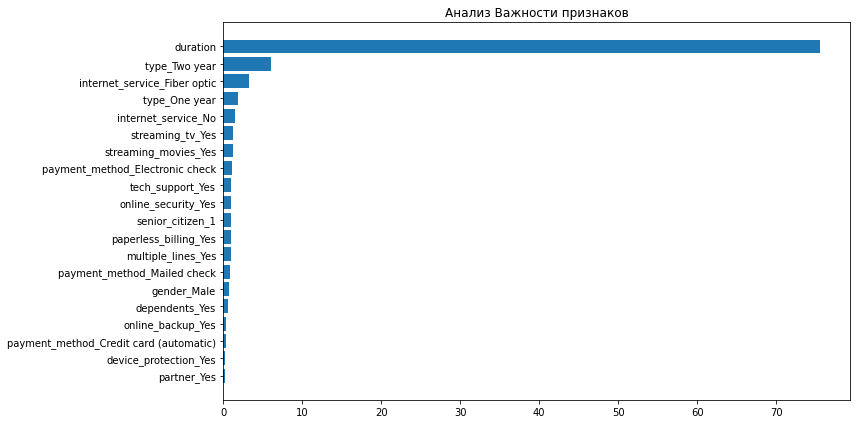

In [117]:
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(features_test.columns)[sorted_idx])
plt.title('Анализ Важности признаков')
plt.tight_layout()


Синтезированный признок duration оказался наиболее важным

### ROC кривая

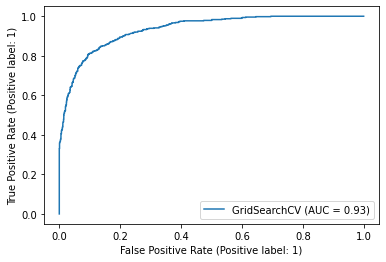

964:	learn: 0.0670205	total: 26.9s	remaining: 974ms
965:	learn: 0.0669950	total: 26.9s	remaining: 946ms
966:	learn: 0.0669581	total: 26.9s	remaining: 918ms
967:	learn: 0.0668409	total: 26.9s	remaining: 889ms
968:	learn: 0.0667733	total: 26.9s	remaining: 861ms
969:	learn: 0.0666308	total: 26.9s	remaining: 833ms
970:	learn: 0.0665826	total: 27s	remaining: 806ms
971:	learn: 0.0665527	total: 27s	remaining: 778ms
972:	learn: 0.0664844	total: 27.1s	remaining: 751ms
973:	learn: 0.0664403	total: 27.1s	remaining: 723ms
974:	learn: 0.0663723	total: 27.1s	remaining: 695ms
975:	learn: 0.0663400	total: 27.1s	remaining: 667ms
976:	learn: 0.0663125	total: 27.1s	remaining: 639ms
977:	learn: 0.0662892	total: 27.1s	remaining: 611ms
978:	learn: 0.0662414	total: 27.2s	remaining: 583ms
979:	learn: 0.0661962	total: 27.2s	remaining: 554ms
980:	learn: 0.0661701	total: 27.2s	remaining: 526ms
981:	learn: 0.0661210	total: 27.2s	remaining: 499ms
982:	learn: 0.0660827	total: 27.2s	remaining: 471ms
983:	learn: 0.06

In [118]:
plot_roc_curve(grid_model_cat, features_test, target_test)

**Выводы**

Лучше всех на тестовой выборке себя показала модель Catboost со значением auc-roc 0.9339977081116477 accuracy 0.8591709256104486

## Отчет 

### Выполненные шаги

В ходе выполнения проекта выполнены следующие шаги:
  1. Объеденнены датафреймы и изученны данные, заполнены пропуски, создан целевой признак и синтезирован признак длительности контракта в днях  
  2. Визуализированы признаки и на их основе сделаны выводы о среднестатистическом клиенте 
  3. Изучена связь между признаками и на основе этого анализа удалены признаки total_charges и monthly_charges. Так же удалены даты и customer_id. Стандартезированны численные признаки и и закодированы категориальные.
  4. Обучены три модели RandomForest, LightGBM и Catboost. Лучше всего показала себя модель CatBoost. 
  
**Сравнение с первоначальным планом**
  
По сравнению с изначальным планом решено было не проводить анализ на выбросы в основном, потому, что на выведенных графиках небыло замечено большего количества аномалий и пиков. Более явная проверка на дубликаты не была произведена из-за отсутствия явной в этом необходимости. Так же в изначальный план не входило создание дополнитедьгых признаков,но после анализа данных было принято решение о создании признака duration.

### Трудности

Особые трудности у меня вызвал подбор признаков в частности после создания признака duration - длительность контракта, качество моделей значительно улучшилось. Так же определенные трудности вызвало принятие решения о том, какие признаки стоит удалить, а какие оставить.  Для решения этой проблемы был проделан анализ данных. В частности анализ на мультиколлинеарность.

### Ключевые шаги

1. **Создание дополнительных признаков** Именно создание дополнительного признака помогло улучшить метрику максимально
2. **Изучение связи между признаками** И удаление лишних помогло улучшить метрику.
3. **Обучение Моделей** и тщательный подбор гиперпараметров помог оптимизации показателей.

### Используемые признаки

 В ходе обучения моделей использовались следующие признаки:

    duration                                 float64
    paperless_billing_Yes                    float64
    payment_method_Credit card (automatic)   float64
    payment_method_Electronic check          float64
    payment_method_Mailed check              float64
    senior_citizen_1                         float64
    partner_Yes                              float64
    dependents_Yes                           float64
    internet_service_Fiber optic             float64
    internet_service_No                      float64
    online_security_Yes                      float64
    device_protection_Yes                    float64
    tech_support_Yes                         float64
    streaming_tv_Yes                         float64
    streaming_movies_Yes                     float64
    multiple_lines_Yes                       float64
    online_backup_Yes                        float64
    gender_Male                              float64
    type_One year                            float64                             
    type_Two year                            float64                                

И целевой признак exited типа object

Названия признаков были преведены к snake_case, заполнены пропуски, численные признаки были стандартезированы с использованием minmax scaler, категориальные закодированы через One Hot Encoding. Так же признаки были проверены на мультиколлинеарность. Признак duration был синтезирован на основе позднее удаленных дат договоров.

### Итоовая модель

По итогам исследования лучше всех на тестовой выборке себя показала модель Catboost Со следующими гиперпараметрами:

  1. 'depth': 4,
  2. 'l2_leaf_reg': 1,
  3. 'learning_rate': 0.03,
  4. 'loss_function': 'Logloss'
  5.  random_state : 270323
  
Значение метрик на тестовой выборке :

 1. auc-roc 0.9339977081116477
 2. accuracy 0.8591709256104486
 
Хотя метрика roc-auc и больше подходит для оценки качества модели условному заказщику проще объяснить метрику точности.

Полученная модель соответствует требованиям задания.
